# Applying Machine Learning Operations to Hyperspectral Images

In [1]:
# get path from .env file
import os
from dotenv import dotenv_values
import pandas as pd
config = dotenv_values(".env")
data_dir = config["DATA_DIR"]
working_dir = config["WORKING_DIR"]
import sys 
sys.path.append(working_dir)
# show all the folders and files in the working directory in a tree structure
os.chdir(data_dir)
os.listdir(data_dir)

['annotations', 'Avocado', 'Kaki', 'Kiwi', 'Mango', 'Papaya']

In [2]:
# import depthwise separable conv2d layer
import tensorflow as tf
keras = tf.keras
from keras.models import Sequential
from keras.layers import DepthwiseConv2D, AveragePooling2D, BatchNormalization, ReLU, GlobalAveragePooling2D, Dense, Conv2D, SeparableConvolution2D, Activation, Input, Add, Lambda, concatenate
from keras.activations import sigmoid
from keras.backend import resize_images
from keras_adabound import AdaBound
from keras.optimizers import Adam
from keras.utils import plot_model
from hsi_datagen import HSI_datagen
from IPython.display import Image
# import model checkpoint
from keras.callbacks import ModelCheckpoint
from sklearn.metrics import confusion_matrix
import seaborn as sns
import numpy as np
import datetime
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report

## Introduction

## DeepHSI Dataset

### Data Insights

In [2]:
import json
train_all_v2 = json.load(open("./annotations/train_only_labeled_v2.json"))
val_v2 = json.load(open("./annotations/val_v2.json"))
test_v2 = json.load(open("./annotations/test_v2.json"))

In [3]:
train_all_v2.keys()

dict_keys(['info', 'cameras', 'days', 'records', 'annotations'])

In [4]:
VIS_wavelengths = train_all_v2['cameras'][0]['wavelengths']
NIR_wavelengths = train_all_v2['cameras'][1]['wavelengths']
VIS_COR_wavelengths = train_all_v2['cameras'][2]['wavelengths']

train data preparation

In [6]:
train_records_df = pd.DataFrame(train_all_v2['records'])
# files attribute is a dictionary with keys: header_file, and data_file, convert these into seperate columns
train_records_df['header_file'] = train_records_df['files'].apply(lambda x: x['header_file'])
train_records_df['data_file'] = train_records_df['files'].apply(lambda x: x['data_file'])
# remove the files column
train_records_df.drop('files', axis=1, inplace=True)
train_records_df.head()

,id,fruit,side,day,camera_type,header_file,data_file
0,0,Avocado,front,day_01,NIR,Avocado/NIR/day_01/avocado_day_01_20_front.hdr,Avocado/NIR/day_01/avocado_day_01_20_front.bin
1,1,Avocado,front,day_01,VIS,Avocado/VIS/day_01/avocado_day_01_20_front.hdr,Avocado/VIS/day_01/avocado_day_01_20_front.bin
2,2,Avocado,back,day_01,NIR,Avocado/NIR/day_01/avocado_day_01_20_back.hdr,Avocado/NIR/day_01/avocado_day_01_20_back.bin
3,3,Avocado,back,day_01,VIS,Avocado/VIS/day_01/avocado_day_01_20_back.hdr,Avocado/VIS/day_01/avocado_day_01_20_back.bin
4,4,Avocado,front,day_01,NIR,Avocado/NIR/day_01/avocado_day_01_30_front.hdr,Avocado/NIR/day_01/avocado_day_01_30_front.bin


In [7]:
train_annotations_df = pd.DataFrame(train_all_v2['annotations'])
train_annotations_df.head()

,id,record_id,init_weight,end_weight,storage_days,firmness,comment,ripeness_state,ripeness_state_fine
0,0,0,227,227.0,0,19750.0,None,unripe,unripe
1,1,1,227,227.0,0,19750.0,None,unripe,unripe
2,2,2,227,227.0,0,19750.0,None,unripe,unripe
3,3,3,227,227.0,0,19750.0,None,unripe,unripe
4,4,4,252,252.0,0,18250.0,None,unripe,unripe


In [8]:
# merge the two dataframes
train_df = pd.merge(train_records_df, train_annotations_df, on='id')
train_df.head()

,id,fruit,side,day,camera_type,header_file,data_file,record_id,init_weight,end_weight,storage_days,firmness,comment,ripeness_state,ripeness_state_fine
0,0,Avocado,front,day_01,NIR,Avocado/NIR/day_01/avocado_day_01_20_front.hdr,Avocado/NIR/day_01/avocado_day_01_20_front.bin,0,227,227.0,0,19750.0,None,unripe,unripe
1,1,Avocado,front,day_01,VIS,Avocado/VIS/day_01/avocado_day_01_20_front.hdr,Avocado/VIS/day_01/avocado_day_01_20_front.bin,1,227,227.0,0,19750.0,None,unripe,unripe
2,2,Avocado,back,day_01,NIR,Avocado/NIR/day_01/avocado_day_01_20_back.hdr,Avocado/NIR/day_01/avocado_day_01_20_back.bin,2,227,227.0,0,19750.0,None,unripe,unripe
3,3,Avocado,back,day_01,VIS,Avocado/VIS/day_01/avocado_day_01_20_back.hdr,Avocado/VIS/day_01/avocado_day_01_20_back.bin,3,227,227.0,0,19750.0,None,unripe,unripe
4,4,Avocado,front,day_01,NIR,Avocado/NIR/day_01/avocado_day_01_30_front.hdr,Avocado/NIR/day_01/avocado_day_01_30_front.bin,4,252,252.0,0,18250.0,None,unripe,unripe


validation data preparation

In [9]:
val_records_df = pd.DataFrame(val_v2['records'])
val_records_df['header_file'] = val_records_df['files'].apply(lambda x: x['header_file'])
val_records_df['data_file'] = val_records_df['files'].apply(lambda x: x['data_file'])
val_records_df.drop('files', axis=1, inplace=True)
val_annotations_df = pd.DataFrame(val_v2['annotations'])
val_df = pd.merge(val_records_df, val_annotations_df, on='id')
val_df.head()

,id,fruit,side,day,camera_type,header_file,data_file,record_id,init_weight,end_weight,storage_days,firmness,comment,ripeness_state,ripeness_state_fine
0,0,Avocado,front,day_03,VIS,Avocado/VIS/day_03/avocado_day_03_13_front.hdr,Avocado/VIS/day_03/avocado_day_03_13_front.bin,0,240,231.0,2,4450.0,None,unripe,unripe
1,1,Avocado,back,day_03,VIS,Avocado/VIS/day_03/avocado_day_03_13_back.hdr,Avocado/VIS/day_03/avocado_day_03_13_back.bin,1,240,231.0,2,4450.0,None,unripe,unripe
2,2,Avocado,front,day_03,NIR,Avocado/NIR/day_03/avocado_day_03_17_front.hdr,Avocado/NIR/day_03/avocado_day_03_17_front.bin,2,242,235.0,2,4650.0,None,unripe,unripe
3,3,Avocado,back,day_03,NIR,Avocado/NIR/day_03/avocado_day_03_17_back.hdr,Avocado/NIR/day_03/avocado_day_03_17_back.bin,3,242,235.0,2,4650.0,None,unripe,unripe
4,4,Kiwi,back,day_03,VIS,Kiwi/VIS/day_03/kiwi_day_03_17_back.hdr,Kiwi/VIS/day_03/kiwi_day_03_17_back.bin,4,117,115.0,2,1050.0,None,perfect,perfect


test data preparation

In [10]:
test_records_df = pd.DataFrame(test_v2['records'])
test_records_df['header_file'] = test_records_df['files'].apply(lambda x: x['header_file'])
test_records_df['data_file'] = test_records_df['files'].apply(lambda x: x['data_file'])
test_records_df.drop('files', axis=1, inplace=True)
test_annotations_df = pd.DataFrame(test_v2['annotations'])
test_df = pd.merge(test_records_df, test_annotations_df, on='id')
test_df.head()

,id,fruit,side,day,camera_type,header_file,data_file,record_id,init_weight,end_weight,storage_days,firmness,comment,ripeness_state,ripeness_state_fine
0,0,Avocado,back,day_03,NIR,Avocado/NIR/day_03/avocado_day_03_05_back.hdr,Avocado/NIR/day_03/avocado_day_03_05_back.bin,0,231,224.0,2,1200.0,None,perfect,ripe
1,1,Avocado,front,day_03,NIR,Avocado/NIR/day_03/avocado_day_03_13_front.hdr,Avocado/NIR/day_03/avocado_day_03_13_front.bin,1,240,231.0,2,4450.0,None,unripe,unripe
2,2,Kiwi,front,day_03,NIR,Kiwi/NIR/day_03/kiwi_day_03_07_front.hdr,Kiwi/NIR/day_03/kiwi_day_03_07_front.bin,2,123,121.0,2,150.0,Could be also ripe,overripe,overripe
3,3,Kiwi,back,day_03,VIS,Kiwi/VIS/day_03/kiwi_day_03_23_back.hdr,Kiwi/VIS/day_03/kiwi_day_03_23_back.bin,3,127,126.0,2,1750.0,None,perfect,ripe
4,4,Kiwi,back,day_04,NIR,Kiwi/NIR/day_04/kiwi_day_04_12_back.hdr,Kiwi/NIR/day_04/kiwi_day_04_12_back.bin,4,124,122.0,3,1150.0,None,perfect,perfect


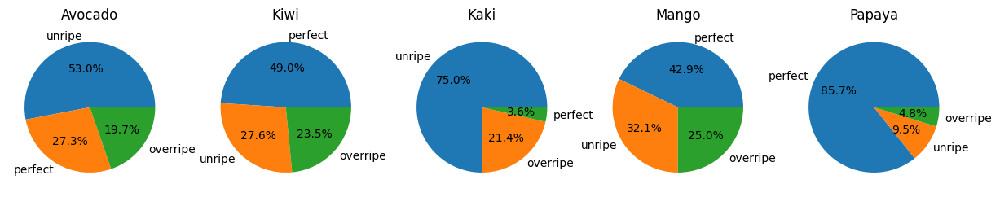

In [11]:
# get the unique fruits 
uniques = train_df['fruit'].unique()

# for each fruits show pie chart of ripeness 
# in subplots
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(1, 5, figsize=(15, 15))
axes = axes.flatten()
for i, fruit in enumerate(uniques):
    fruit_df = train_df[train_df['fruit'] == fruit]
    # show percentage of each ripeness state
    axes[i].pie(fruit_df['ripeness_state'].value_counts(), labels=fruit_df['ripeness_state'].unique(), autopct='%1.1f%%')
    axes[i].set_title(fruit)
# add legend to the entire figure
plt.show()

# for fruit in uniques:
#     fruit_df = train_df[train_df['fruit'] == fruit]
#     fruit_df['ripeness_state'].value_counts().plot(kind='pie', autopct='%1.1f%%', startangle=90, shadow=False, legend = True, fontsize=14)
#     plt.title(fruit)
#     plt.axis('equal')
#     plt.tight_layout()
#     plt.show()

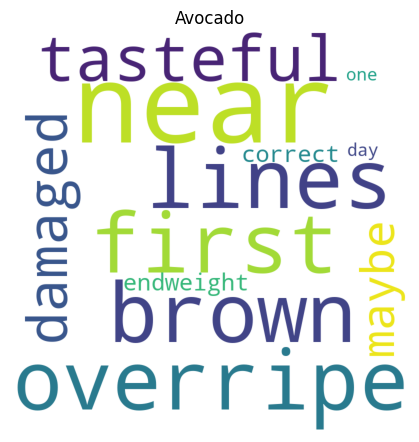

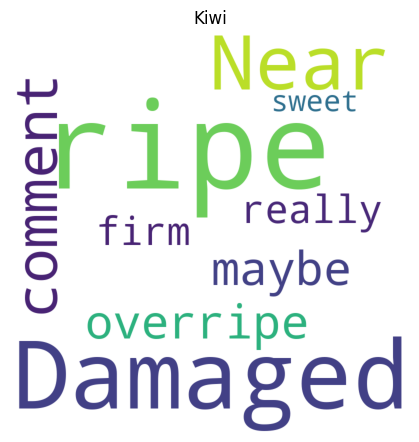

In [11]:
import wordcloud 

# for each fruit show word cloud of the comments
for fruit in uniques:
    fruit_df = train_df[train_df['fruit'] == fruit]
    comments = fruit_df['comment']
    # join all the comments into one string
    comments = comments.str.cat(sep=' ')
    # if there are no comments, skip this fruit
    if comments == '':
        continue
    # create the word cloud
    wc = wordcloud.WordCloud(width=800, height=800, background_color='white', min_font_size=10).generate(comments)
    # plot the word cloud
    plt.figure(figsize=(4, 4), facecolor=None)
    plt.imshow(wc)
    plt.axis("off")
    plt.tight_layout(pad=0)
    plt.title(fruit)
    plt.show()

In [12]:
vis_count = len(VIS_wavelengths)
nir_count = len(NIR_wavelengths)
vis_cor_count = len(VIS_COR_wavelengths)
print(f"There are {vis_count} VIS wavelengths, {nir_count} NIR wavelengths, and {vis_cor_count} VIS_COR wavelengths.")
# print list of VIS wavelengths and NIR wavelengths
print("The visible(VIS) wavelengths are :", VIS_wavelengths)
print("The Near Infrared (NIR) wavelengths:", NIR_wavelengths)
print("The corrected visible(VIS_COR) wavelengths:", VIS_COR_wavelengths)

There are 224 VIS wavelengths, 252 NIR wavelengths, and 249 VIS_COR wavelengths.
The visible(VIS) wavelengths are : [397.66, 400.28, 402.9, 405.52, 408.13, 410.75, 413.37, 416.0, 418.62, 421.24, 423.86, 426.49, 429.12, 431.74, 434.37, 437.0, 439.63, 442.26, 444.89, 447.52, 450.16, 452.79, 455.43, 458.06, 460.7, 463.34, 465.98, 468.62, 471.26, 473.9, 476.54, 479.18, 481.83, 484.47, 487.12, 489.77, 492.42, 495.07, 497.72, 500.37, 503.02, 505.67, 508.32, 510.98, 513.63, 516.29, 518.95, 521.61, 524.27, 526.93, 529.59, 532.25, 534.91, 537.57, 540.24, 542.91, 545.57, 548.24, 550.91, 553.58, 556.25, 558.92, 561.59, 564.26, 566.94, 569.61, 572.29, 574.96, 577.64, 580.32, 583.0, 585.68, 588.36, 591.04, 593.73, 596.41, 599.1, 601.78, 604.47, 607.16, 609.85, 612.53, 615.23, 617.92, 620.61, 623.3, 626.0, 628.69, 631.39, 634.08, 636.78, 639.48, 642.18, 644.88, 647.58, 650.29, 652.99, 655.69, 658.4, 661.1, 663.81, 666.52, 669.23, 671.94, 674.65, 677.36, 680.07, 682.79, 685.5, 688.22, 690.93, 693.65,

The images differ in spatial dimensions however all of them have the same number of spectral bands. The spectral library will be used to extract the data for the training and testing of the model.

(159, 74, 252)
	Data Source:   '.\./Kiwi/NIR/day_01/kiwi_day_01_01_back.bin'
	# Rows:            159
	# Samples:          74
	# Bands:           252
	Interleave:        BIP
	Quantization:  32 bits
	Data format:   float32


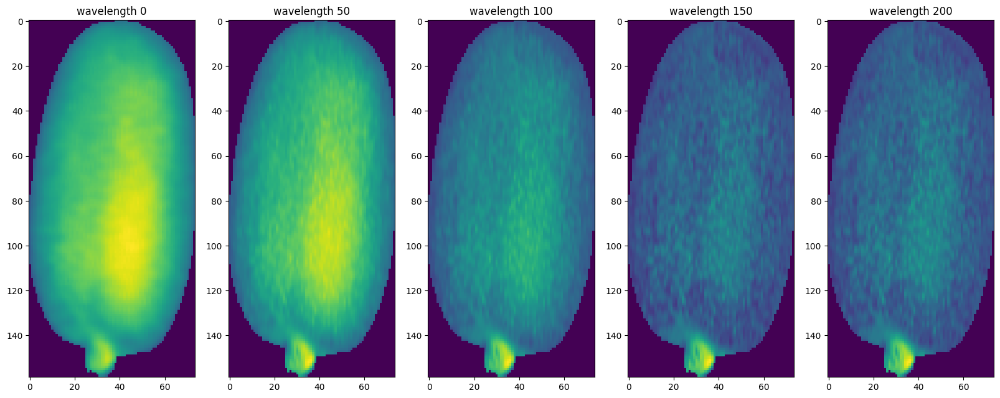

In [13]:
import spectral.io.envi as envi
# example of loading a single image
img = envi.open('./Kiwi/NIR/day_01/kiwi_day_01_01_back.hdr', './Kiwi/NIR/day_01/kiwi_day_01_01_back.bin')
print(img.shape)
print(img)
# show the image
fig, axs = plt.subplots(1, 5, figsize=(20, 20))
axs[0].imshow(img[:,:,0])
axs[0].set_title('wavelength 0')
axs[1].imshow(img[:,:,50])
axs[1].set_title('wavelength 50')
axs[2].imshow(img[:,:,100])
axs[2].set_title('wavelength 100')
axs[3].imshow(img[:,:,150])
axs[3].set_title('wavelength 150')
axs[4].imshow(img[:,:,200])
axs[4].set_title('wavelength 200')
plt.show()

Before we can proceed lets check the sizes of each image in the dataset

In [14]:
# train dataset 
# we will do this by iterating through the records and loading the images extracting the size and noting it in the dataframe
# we will also extract the number of bands and note it in the dataframe

def get_Img_size(row):
    img = envi.open(row['header_file'], row['data_file'])
    return img.shape

train_df['img_shape'] = train_df.apply(get_Img_size, axis=1)
val_df['img_shape'] = val_df.apply(get_Img_size, axis=1)
test_df['img_shape'] = test_df.apply(get_Img_size, axis=1)

train_df.head()

,id,fruit,side,day,camera_type,header_file,data_file,record_id,init_weight,end_weight,storage_days,firmness,comment,ripeness_state,ripeness_state_fine,img_shape
0,0,Avocado,front,day_01,NIR,Avocado/NIR/day_01/avocado_day_01_20_front.hdr,Avocado/NIR/day_01/avocado_day_01_20_front.bin,0,227,227.0,0,19750.0,None,unripe,unripe,"(219, 94, 252)"
1,1,Avocado,front,day_01,VIS,Avocado/VIS/day_01/avocado_day_01_20_front.hdr,Avocado/VIS/day_01/avocado_day_01_20_front.bin,1,227,227.0,0,19750.0,None,unripe,unripe,"(286, 294, 224)"
2,2,Avocado,back,day_01,NIR,Avocado/NIR/day_01/avocado_day_01_20_back.hdr,Avocado/NIR/day_01/avocado_day_01_20_back.bin,2,227,227.0,0,19750.0,None,unripe,unripe,"(220, 94, 252)"
3,3,Avocado,back,day_01,VIS,Avocado/VIS/day_01/avocado_day_01_20_back.hdr,Avocado/VIS/day_01/avocado_day_01_20_back.bin,3,227,227.0,0,19750.0,None,unripe,unripe,"(291, 299, 224)"
4,4,Avocado,front,day_01,NIR,Avocado/NIR/day_01/avocado_day_01_30_front.hdr,Avocado/NIR/day_01/avocado_day_01_30_front.bin,4,252,252.0,0,18250.0,None,unripe,unripe,"(278, 93, 252)"


In [16]:
# look at the unique image shapes for each fruit to come to a conclusion about resize dimensions
# get the unique fruits 
unique_fruits = train_df['fruit'].unique()
for fruit in unique_fruits:
    fruit_df = train_df[train_df['fruit'] == fruit]
    # get unique camera wavelengths
    unique_cameras = fruit_df['camera_type'].unique()
    for camera in unique_cameras:
        camera_df = fruit_df[fruit_df['camera_type'] == camera]
        # get unique image shapes
        unique_shapes = camera_df['img_shape'].unique()
        print(f"For {fruit} and {camera} camera, the unique image shapes are: {unique_shapes}")


For Avocado and NIR camera, the unique image shapes are: [(219, 94, 252) (220, 94, 252) (278, 93, 252) (277, 93, 252)
 (245, 182, 252) (241, 182, 252) (243, 212, 252) (240, 209, 252)
 (329, 189, 252) (308, 197, 252) (281, 210, 252) (277, 210, 252)
 (316, 185, 252) (319, 190, 252) (299, 192, 252) (311, 191, 252)
 (337, 190, 252) (329, 190, 252) (363, 178, 252) (361, 186, 252)
 (302, 193, 252) (307, 191, 252) (312, 197, 252) (305, 194, 252)
 (303, 191, 252) (281, 208, 252) (279, 209, 252) (296, 202, 252)
 (287, 201, 252) (289, 200, 252) (315, 188, 252) (311, 186, 252)
 (291, 190, 252) (307, 182, 252) (308, 180, 252) (293, 190, 252)
 (286, 177, 252) (286, 174, 252) (268, 194, 252) (305, 188, 252)]
For Avocado and VIS camera, the unique image shapes are: [(286, 294, 224) (291, 299, 224) (360, 295, 224) (362, 293, 224)
 (311, 265, 224) (307, 268, 224) (306, 311, 224) (307, 309, 224)
 (402, 281, 224) (369, 282, 224) (342, 305, 224) (334, 302, 224)
 (320, 310, 224) (321, 313, 224) (363, 271, 

### Preprocessing

Part 1 : Encoding the Ripeness state of the fruit

In [19]:
# keep dictionary of the ripeness state and the corresponding number
ripeness_state_dict = {'unripe': 0, 'perfect': 1, 'overripe': 2}

In [17]:
# apply it to train val and test dataframes
train_df['ripeness_state_y'] = train_df['ripeness_state'].apply(lambda x: ripeness_state_dict[x])
val_df['ripeness_state_y'] = val_df['ripeness_state'].apply(lambda x: ripeness_state_dict[x])
test_df['ripeness_state_y'] = test_df['ripeness_state'].apply(lambda x: ripeness_state_dict[x])

Part 2 : Encoding the damage state of the fruit

In [18]:
# 1 if damaged 0 if not
train_df["is_damaged"] = train_df["comment"].str.contains("damaged", case=False, na=False).astype(int)
val_df["is_damaged"] = val_df["comment"].str.contains("damaged", case=False, na=False).astype(int)
test_df["is_damaged"] = test_df["comment"].str.contains("damaged", case=False, na=False).astype(int)

Note that the firmness column does not require pre processing

In [19]:
# save dfs as csv files for later use 
train_df.to_csv(os.path.join(working_dir, "train_df.csv"), index=False)
val_df.to_csv(os.path.join(working_dir, "val_df.csv"), index=False)
test_df.to_csv(os.path.join(working_dir, "test_df.csv"), index=False)

load from csv

In [3]:
train_df = pd.read_csv(os.path.join(working_dir, "train_df.csv"))
val_df = pd.read_csv(os.path.join(working_dir, "val_df.csv"))
test_df = pd.read_csv(os.path.join(working_dir, "test_df.csv"))

In [4]:
train_df.head()

,id,fruit,side,day,camera_type,header_file,data_file,record_id,init_weight,end_weight,storage_days,firmness,comment,ripeness_state,ripeness_state_fine,img_shape,ripeness_state_y,is_damaged
0,0,Avocado,front,day_01,NIR,Avocado/NIR/day_01/avocado_day_01_20_front.hdr,Avocado/NIR/day_01/avocado_day_01_20_front.bin,0,227,227.0,0,19750.0,NaN,unripe,unripe,"(219, 94, 252)",0,0
1,1,Avocado,front,day_01,VIS,Avocado/VIS/day_01/avocado_day_01_20_front.hdr,Avocado/VIS/day_01/avocado_day_01_20_front.bin,1,227,227.0,0,19750.0,NaN,unripe,unripe,"(286, 294, 224)",0,0
2,2,Avocado,back,day_01,NIR,Avocado/NIR/day_01/avocado_day_01_20_back.hdr,Avocado/NIR/day_01/avocado_day_01_20_back.bin,2,227,227.0,0,19750.0,NaN,unripe,unripe,"(220, 94, 252)",0,0
3,3,Avocado,back,day_01,VIS,Avocado/VIS/day_01/avocado_day_01_20_back.hdr,Avocado/VIS/day_01/avocado_day_01_20_back.bin,3,227,227.0,0,19750.0,NaN,unripe,unripe,"(291, 299, 224)",0,0
4,4,Avocado,front,day_01,NIR,Avocado/NIR/day_01/avocado_day_01_30_front.hdr,Avocado/NIR/day_01/avocado_day_01_30_front.bin,4,252,252.0,0,18250.0,NaN,unripe,unripe,"(278, 93, 252)",0,0


## HS_CNN

### Ripeness Classification

First, I attempt to replicate the results of the paper.

#### Model Architecture

In [5]:
def build_HSI_CNN(input_shape):
    # Depthwise Convolution Block 1
    HS_CNN = Sequential()
    HS_CNN.add(DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same', use_bias=False, input_shape=input_shape, depth_multiplier=3))  # depth_multiplier to expand channels
    HS_CNN.add(Conv2D(25, kernel_size=(1, 1), strides=(1, 1), use_bias=True))
    HS_CNN.add(ReLU())
    HS_CNN.add(AveragePooling2D(pool_size=(4, 4), strides=(4, 4)))
    HS_CNN.add(BatchNormalization())
        
    # Depthwise Convolution Block 2
    HS_CNN.add(DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same', use_bias=False, depth_multiplier=3))  # depth_multiplier to expand channels
    HS_CNN.add(Conv2D(30, kernel_size=(1, 1), strides=(1, 1), use_bias=True))
    HS_CNN.add(ReLU())
    HS_CNN.add(AveragePooling2D(pool_size=(4, 4), strides=(4, 4)))
    HS_CNN.add(BatchNormalization())
        
    # Depthwise Convolution Block 3
    HS_CNN.add(DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same', use_bias=False, depth_multiplier=3))  # depth_multiplier to expand channels
    HS_CNN.add(Conv2D(50, kernel_size=(1, 1), strides=(1, 1), use_bias=True))
    HS_CNN.add(ReLU())
    HS_CNN.add(BatchNormalization())
    HS_CNN.add(GlobalAveragePooling2D())
        
    HS_CNN.add(Activation('sigmoid'))
        
    # Fully Connected Layer
    HS_CNN.add(BatchNormalization())
    HS_CNN.add(Dense(50, use_bias=True))
    HS_CNN.add(ReLU())
    HS_CNN.add(Dense(3, use_bias=True))
    HS_CNN.add(Activation('sigmoid'))

    HS_CNN.compile(optimizer=AdaBound(learning_rate=1e-2), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    #
    HS_CNN.summary()
    return HS_CNN


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 depthwise_conv2d_12 (Depthw  (None, 64, 64, 600)      5400      
 iseConv2D)                                                      
                                                                 
 conv2d_12 (Conv2D)          (None, 64, 64, 25)        15025     
                                                                 
 re_lu_14 (ReLU)             (None, 64, 64, 25)        0         
                                                                 
 average_pooling2d_8 (Averag  (None, 16, 16, 25)       0         
 ePooling2D)                                                     
                                                                 
 batch_normalization_14 (Bat  (None, 16, 16, 25)       100       
 chNormalization)                                                
                                                      

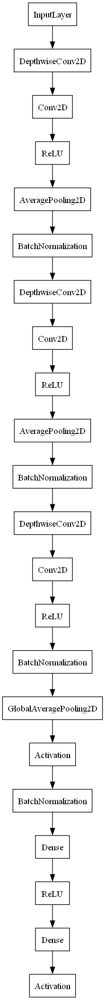

In [11]:
HS_CNN = build_HSI_CNN((64, 64, 200)) 
plot_model(HS_CNN, to_file='hscnn_plot.png', show_layer_names=False)
Image('hscnn_plot.png')

In [20]:
# check gpu availability
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 1703256269927598073
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 3643801600
locality {
  bus_id: 1
  links {
  }
}
incarnation: 12249578228591688797
physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 3060 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.6"
xla_global_id: 416903419
]


This is the augmentation configuration that will be used for training. 

In [11]:
augConfig = {"keep_original": False, "horizontal_flip": False, "vertical_flip" : True,"rotation_range": 90, "noise":{"type":"poisson","level":0} }

#### Avocado Subset (NIR and VIS)

##### NIR

In [5]:
# get all rows where the camera type is NIR and the fruit is Avocado 
train_avocado_NIR = train_df[(train_df['camera_type'] == 'NIR') & (train_df['fruit'] == 'Avocado')]
# apply the same to val and test dataframes
val_avocado_NIR = val_df[(val_df['camera_type'] == 'NIR') & (val_df['fruit'] == 'Avocado')]
test_avocado_NIR = test_df[(test_df['camera_type'] == 'NIR') & (test_df['fruit'] == 'Avocado')]

In [23]:
train_avocado_NIR.head()

,id,fruit,side,day,camera_type,header_file,data_file,record_id,init_weight,end_weight,storage_days,firmness,comment,ripeness_state,ripeness_state_fine,img_shape,ripeness_state_y
0,0,Avocado,front,day_01,NIR,Avocado/NIR/day_01/avocado_day_01_20_front.hdr,Avocado/NIR/day_01/avocado_day_01_20_front.bin,0,227,227.0,0,19750.0,None,unripe,unripe,"(219, 94, 252)",0
2,2,Avocado,back,day_01,NIR,Avocado/NIR/day_01/avocado_day_01_20_back.hdr,Avocado/NIR/day_01/avocado_day_01_20_back.bin,2,227,227.0,0,19750.0,None,unripe,unripe,"(220, 94, 252)",0
4,4,Avocado,front,day_01,NIR,Avocado/NIR/day_01/avocado_day_01_30_front.hdr,Avocado/NIR/day_01/avocado_day_01_30_front.bin,4,252,252.0,0,18250.0,None,unripe,unripe,"(278, 93, 252)",0
6,6,Avocado,back,day_01,NIR,Avocado/NIR/day_01/avocado_day_01_30_back.hdr,Avocado/NIR/day_01/avocado_day_01_30_back.bin,6,252,252.0,0,18250.0,None,unripe,unripe,"(277, 93, 252)",0
16,16,Avocado,front,day_02,NIR,Avocado/NIR/day_02/avocado_day_02_09_front.hdr,Avocado/NIR/day_02/avocado_day_02_09_front.bin,16,183,180.0,1,2100.0,None,unripe,unripe,"(245, 182, 252)",0


In [24]:
len(train_avocado_NIR), len(val_avocado_NIR), len(test_avocado_NIR)

(40, 9, 9)

Create Image Data Generator and create callback for model checkpointing.

In [22]:
train_avocado_NIR_datagen = HSI_datagen(train_avocado_NIR, 'header_file', 'data_file', {'name': 'ripeness_state_y', 'type': int}, batch_size=9, target_size=(64, 64), data_dir=data_dir,
                            shuffle=True, normalize=False, augment= True, augmentConfig=augConfig, balance=True)
# 
val_avocado_NIR_datagen = HSI_datagen(val_avocado_NIR, 'header_file', 'data_file', {'name': 'ripeness_state_y', 'type': int}, batch_size=9, target_size=(64, 64), data_dir=data_dir,
                            shuffle=True, normalize=False, augment= False, augmentConfig=augConfig, balance=True)
# 
avocado_nir_cb = ModelCheckpoint(filepath = working_dir + 'AVOCADO_NIR_HS_CNN_checkpoints/HS_CNN{epoch:04d}.ckpt', verbose=1, save_freq='epoch', period=5, save_weights_only=True)

finally train the model

In [ ]:
avocado_nir_model = build_HSI_CNN((64, 64, 252))

In [24]:
# fit 
avocado_nir_model.fit(train_avocado_NIR_datagen, epochs=150, validation_data=val_avocado_NIR_datagen, callbacks=[avocado_nir_cb], use_multiprocessing=True)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 depthwise_conv2d_3 (Depthwi  (None, 64, 64, 756)      6804      
 seConv2D)                                                       
                                                                 
 conv2d_3 (Conv2D)           (None, 64, 64, 25)        18925     
                                                                 
 re_lu_4 (ReLU)              (None, 64, 64, 25)        0         
                                                                 
 average_pooling2d_2 (Averag  (None, 16, 16, 25)       0         
 ePooling2D)                                                     
                                                                 
 batch_normalization_4 (Batc  (None, 16, 16, 25)       100       
 hNormalization)                                                 
                                                      

performance evaluation of the nir model

In [22]:
# recall the ripeness state dictionary
ripeness_state_dict

{'unripe': 0, 'perfect': 1, 'overripe': 2}

In [23]:
# create test datagen
test_avocado_NIR_datagen = HSI_datagen(test_avocado_NIR, 'header_file', 'data_file', {'name': 'ripeness_state_y', 'type': int}, batch_size=9, target_size=(64, 64), data_dir=data_dir,
                            shuffle=True, normalize=False, augment= False, augmentConfig=augConfig, balance=True)

class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
1/1 [==============================] - 5s 5s/step
Epoch 3 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.33      1.00      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



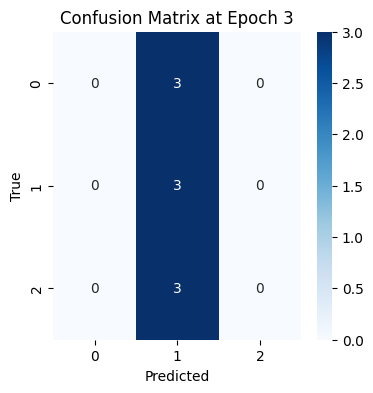

class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
1/1 [==============================] - 0s 47ms/step
Epoch 8 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.33      1.00      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



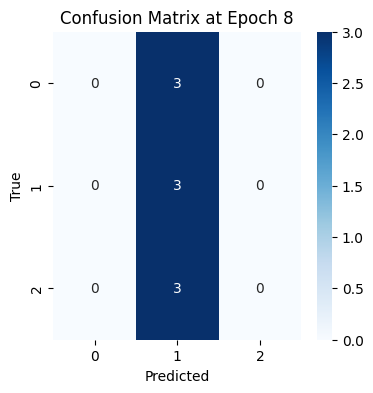

class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
1/1 [==============================] - 0s 44ms/step
Epoch 13 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.33      1.00      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



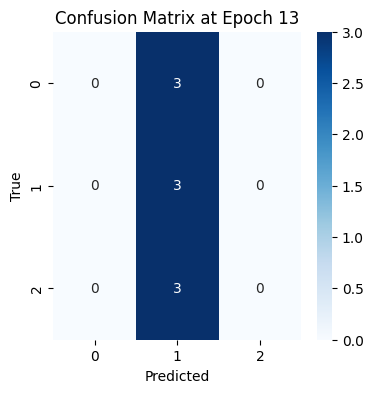

class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
1/1 [==============================] - 0s 44ms/step
Epoch 18 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.38      1.00      0.55         3
     perfect       1.00      0.33      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.46      0.44      0.35         9
weighted avg       0.46      0.44      0.35         9



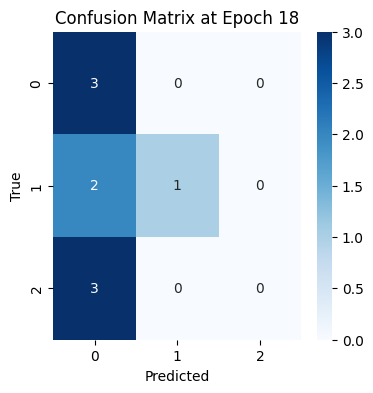

class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
1/1 [==============================] - 0s 41ms/step
Epoch 23 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.33      1.00      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



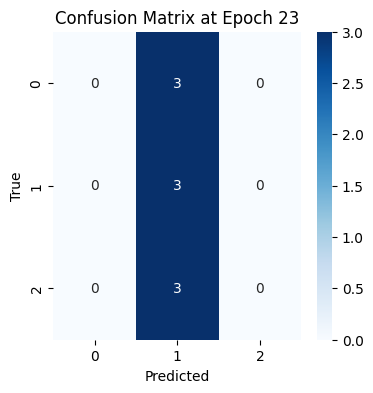

class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
1/1 [==============================] - 0s 40ms/step
Epoch 28 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.33      1.00      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



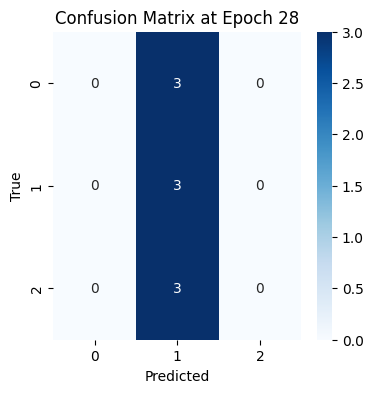

class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
1/1 [==============================] - 0s 38ms/step
Epoch 33 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.33      1.00      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



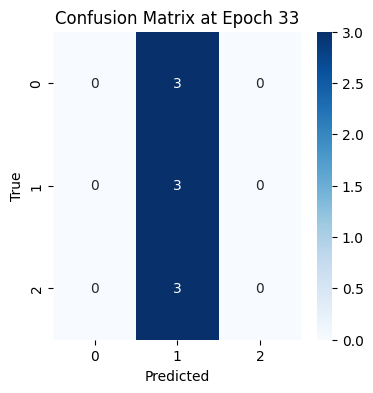

class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
1/1 [==============================] - 0s 41ms/step
Epoch 38 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.33      1.00      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



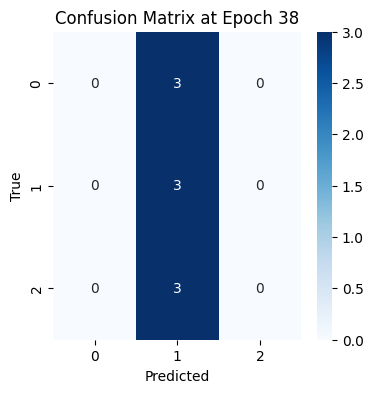

class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
1/1 [==============================] - 0s 38ms/step
Epoch 43 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.33      1.00      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



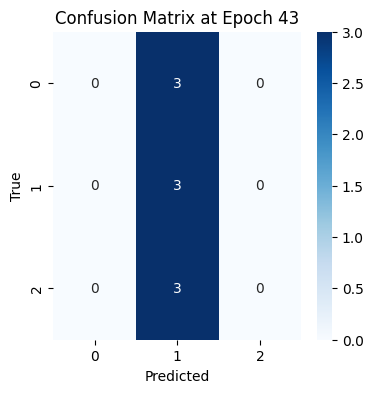

class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
1/1 [==============================] - 0s 40ms/step
Epoch 48 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.33      1.00      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



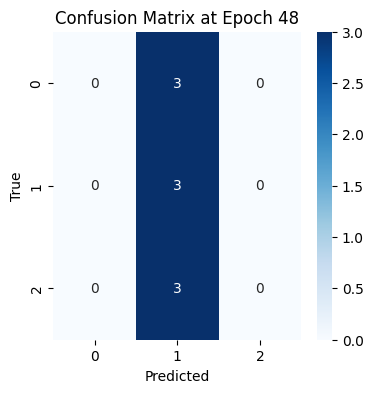

class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
1/1 [==============================] - 0s 44ms/step
Epoch 53 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.33      1.00      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



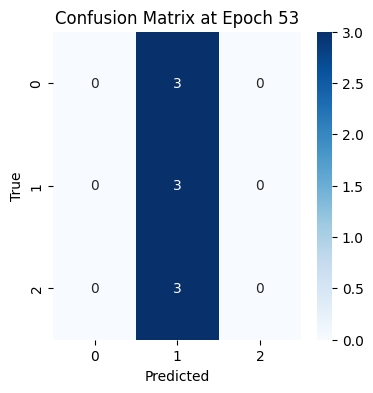

class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
1/1 [==============================] - 0s 42ms/step
Epoch 58 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.33      1.00      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



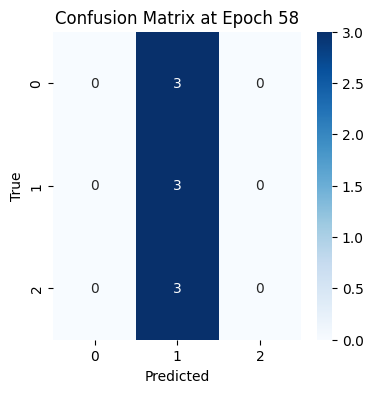

class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
1/1 [==============================] - 0s 40ms/step
Epoch 63 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.38      1.00      0.55         3
     perfect       1.00      0.33      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.46      0.44      0.35         9
weighted avg       0.46      0.44      0.35         9



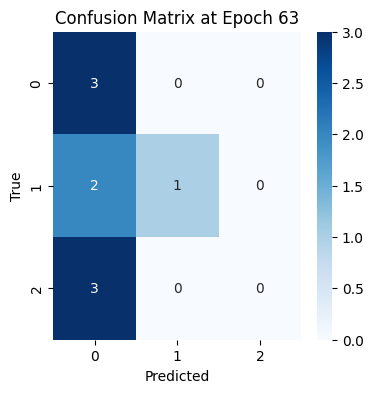

class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
1/1 [==============================] - 0s 54ms/step
Epoch 68 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.38      1.00      0.55         3
     perfect       1.00      0.33      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.46      0.44      0.35         9
weighted avg       0.46      0.44      0.35         9



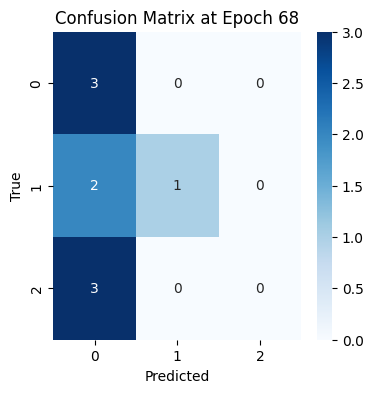

class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
1/1 [==============================] - 0s 37ms/step
Epoch 73 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.50      0.67      0.57         3
     perfect       0.67      0.67      0.67         3
    overripe       1.00      0.67      0.80         3

    accuracy                           0.67         9
   macro avg       0.72      0.67      0.68         9
weighted avg       0.72      0.67      0.68         9



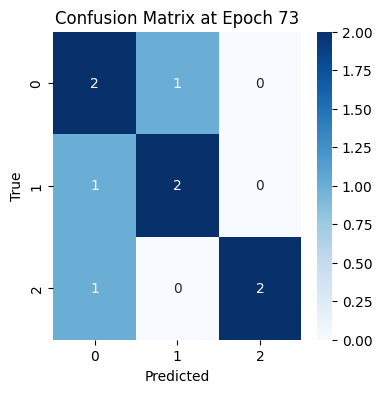

class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
1/1 [==============================] - 0s 45ms/step
Epoch 78 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.50      0.67      0.57         3
     perfect       0.40      0.67      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.30      0.44      0.36         9
weighted avg       0.30      0.44      0.36         9



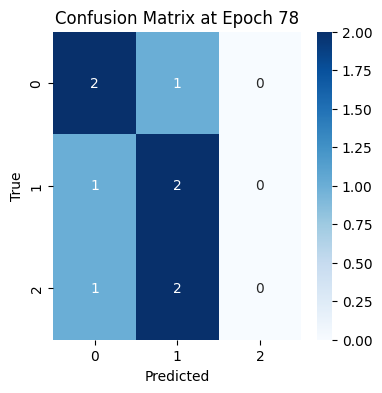

class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
1/1 [==============================] - 0s 39ms/step
Epoch 83 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.38      1.00      0.55         3
     perfect       1.00      0.33      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.46      0.44      0.35         9
weighted avg       0.46      0.44      0.35         9



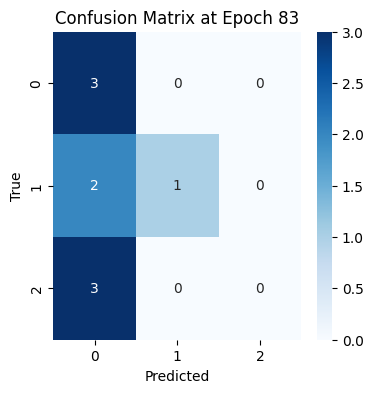

class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
1/1 [==============================] - 0s 41ms/step
Epoch 88 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.60      1.00      0.75         3
     perfect       0.50      0.67      0.57         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.56         9
   macro avg       0.37      0.56      0.44         9
weighted avg       0.37      0.56      0.44         9



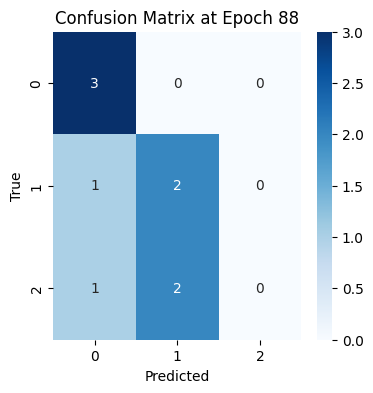

class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
1/1 [==============================] - 0s 41ms/step
Epoch 93 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.33      0.67      0.44         3
    overripe       0.67      0.67      0.67         3

    accuracy                           0.44         9
   macro avg       0.33      0.44      0.37         9
weighted avg       0.33      0.44      0.37         9



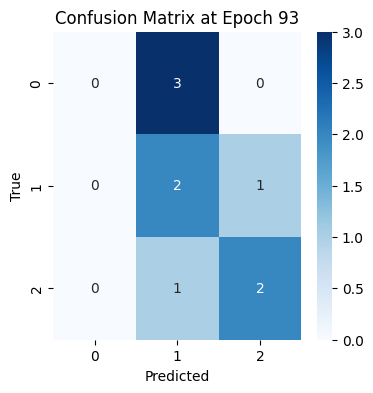

class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
1/1 [==============================] - 0s 46ms/step
Epoch 98 Accuracy: 0.7777777777777778
              precision    recall  f1-score   support

      unripe       0.60      1.00      0.75         3
     perfect       1.00      0.67      0.80         3
    overripe       1.00      0.67      0.80         3

    accuracy                           0.78         9
   macro avg       0.87      0.78      0.78         9
weighted avg       0.87      0.78      0.78         9



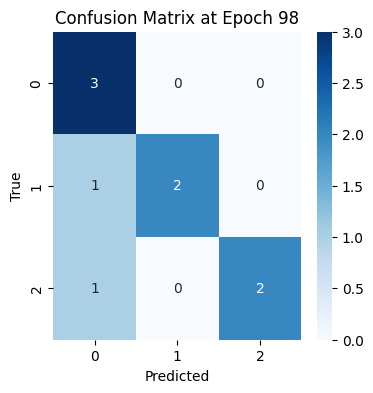

class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
1/1 [==============================] - 0s 39ms/step
Epoch 103 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.50      0.67      0.57         3
     perfect       0.50      0.67      0.57         3
    overripe       1.00      0.33      0.50         3

    accuracy                           0.56         9
   macro avg       0.67      0.56      0.55         9
weighted avg       0.67      0.56      0.55         9



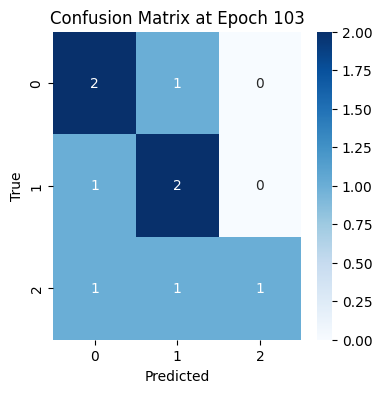

class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
1/1 [==============================] - 0s 41ms/step
Epoch 108 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         3
     perfect       0.67      0.67      0.67         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.56         9
   macro avg       0.39      0.56      0.44         9
weighted avg       0.39      0.56      0.44         9



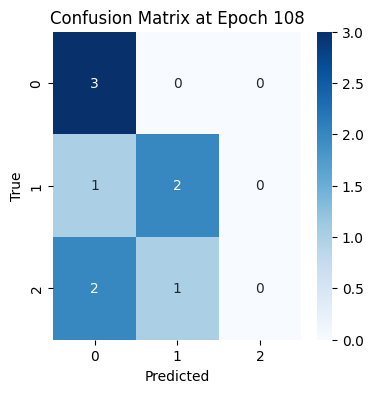

class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
1/1 [==============================] - 0s 42ms/step
Epoch 113 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.75      1.00      0.86         3
     perfect       0.60      1.00      0.75         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.67         9
   macro avg       0.45      0.67      0.54         9
weighted avg       0.45      0.67      0.54         9



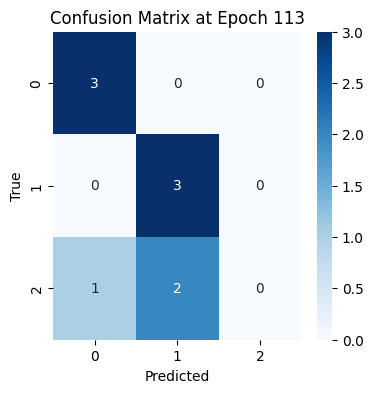

class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
1/1 [==============================] - 0s 43ms/step
Epoch 118 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.60      1.00      0.75         3
     perfect       0.67      0.67      0.67         3
    overripe       1.00      0.33      0.50         3

    accuracy                           0.67         9
   macro avg       0.76      0.67      0.64         9
weighted avg       0.76      0.67      0.64         9



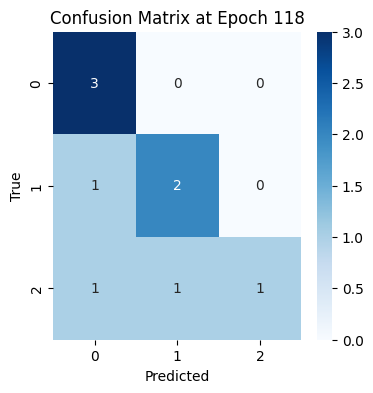

class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
1/1 [==============================] - 0s 44ms/step
Epoch 123 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         3
     perfect       1.00      0.67      0.80         3
    overripe       1.00      0.33      0.50         3

    accuracy                           0.67         9
   macro avg       0.83      0.67      0.66         9
weighted avg       0.83      0.67      0.66         9



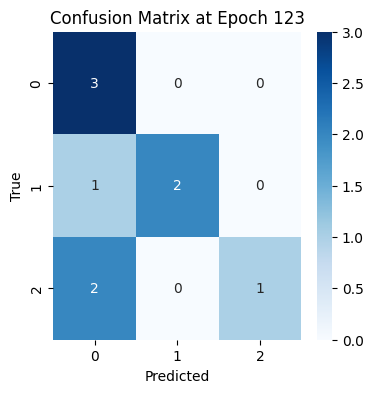

class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
1/1 [==============================] - 0s 42ms/step
Epoch 128 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.43      1.00      0.60         3
    overripe       1.00      0.67      0.80         3

    accuracy                           0.56         9
   macro avg       0.48      0.56      0.47         9
weighted avg       0.48      0.56      0.47         9



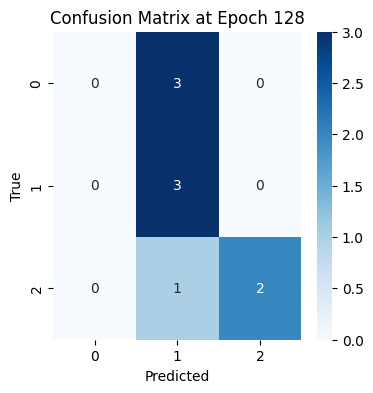

class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
1/1 [==============================] - 0s 40ms/step
Epoch 133 Accuracy: 0.7777777777777778
              precision    recall  f1-score   support

      unripe       1.00      0.67      0.80         3
     perfect       0.60      1.00      0.75         3
    overripe       1.00      0.67      0.80         3

    accuracy                           0.78         9
   macro avg       0.87      0.78      0.78         9
weighted avg       0.87      0.78      0.78         9



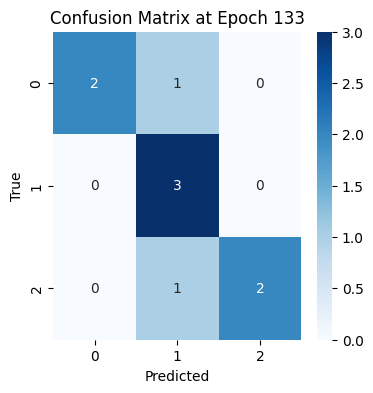

class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
1/1 [==============================] - 0s 41ms/step
Epoch 138 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.38      1.00      0.55         3
     perfect       1.00      0.33      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.46      0.44      0.35         9
weighted avg       0.46      0.44      0.35         9



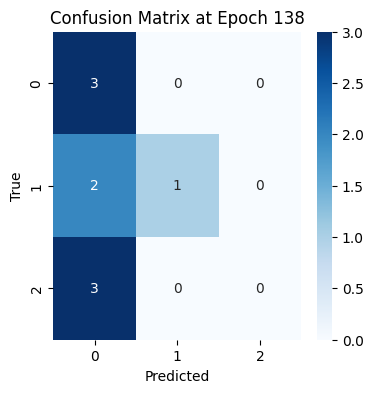

class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
1/1 [==============================] - 0s 43ms/step
Epoch 143 Accuracy: 0.7777777777777778
              precision    recall  f1-score   support

      unripe       0.60      1.00      0.75         3
     perfect       1.00      1.00      1.00         3
    overripe       1.00      0.33      0.50         3

    accuracy                           0.78         9
   macro avg       0.87      0.78      0.75         9
weighted avg       0.87      0.78      0.75         9



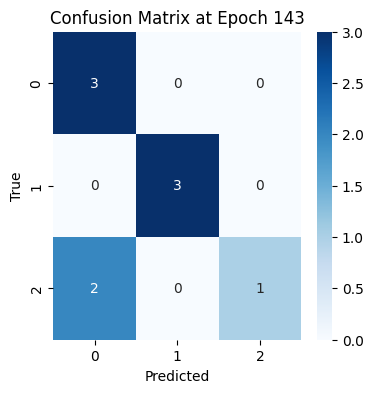

class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
1/1 [==============================] - 0s 41ms/step
Epoch 148 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.33      1.00      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



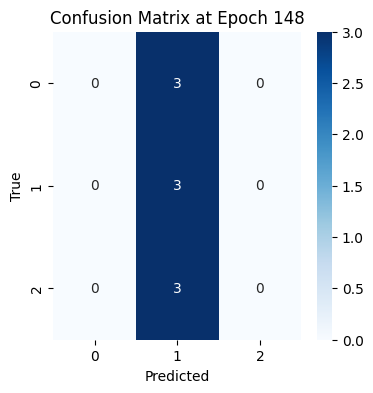

In [25]:

# results from first training session 
for i in range(3,150,5): 
    avocado_nir_model.load_weights(working_dir + 'AVOCADO_NIR_HS_CNN_checkpoints/HS_CNN' + str(i).zfill(4) + '.ckpt')
    x, y = test_avocado_NIR_datagen.__getitem__(0)
    y_pred = avocado_nir_model.predict(x)
    y_pred = np.argmax(y_pred, axis=1)
    y = y.numpy()
    print(f"Epoch {i} Accuracy: {np.mean(y_pred == y)}")
    # print recall and precision and f1 score 
    print(classification_report(y, y_pred, target_names=ripeness_state_dict.keys(), zero_division=0))
    # plot confusion matrix 
    cm = confusion_matrix(y, y_pred)
    plt.figure(figsize=(4, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'Confusion Matrix at Epoch {i}')
    plt.show()


##### VIS

In [33]:
# get all rows where the camera type is VIS and the fruit is Avocado
train_avocado_VIS = train_df[(train_df['camera_type'] == 'VIS') & (train_df['fruit'] == 'Avocado')]
val_avocado_VIS = val_df[(val_df['camera_type'] == 'VIS') & (val_df['fruit'] == 'Avocado')]
test_avocado_VIS = test_df[(test_df['camera_type'] == 'VIS') & (test_df['fruit'] == 'Avocado')]

In [26]:
train_avocado_VIS.head()

,id,fruit,side,day,camera_type,header_file,data_file,record_id,init_weight,end_weight,storage_days,firmness,comment,ripeness_state,ripeness_state_fine,ripeness_state_y
1,1,Avocado,front,day_01,VIS,Avocado/VIS/day_01/avocado_day_01_20_front.hdr,Avocado/VIS/day_01/avocado_day_01_20_front.bin,1,227,227.0,0,19750.0,None,unripe,unripe,0
3,3,Avocado,back,day_01,VIS,Avocado/VIS/day_01/avocado_day_01_20_back.hdr,Avocado/VIS/day_01/avocado_day_01_20_back.bin,3,227,227.0,0,19750.0,None,unripe,unripe,0
5,5,Avocado,front,day_01,VIS,Avocado/VIS/day_01/avocado_day_01_30_front.hdr,Avocado/VIS/day_01/avocado_day_01_30_front.bin,5,252,252.0,0,18250.0,None,unripe,unripe,0
7,7,Avocado,back,day_01,VIS,Avocado/VIS/day_01/avocado_day_01_30_back.hdr,Avocado/VIS/day_01/avocado_day_01_30_back.bin,7,252,252.0,0,18250.0,None,unripe,unripe,0
17,17,Avocado,front,day_02,VIS,Avocado/VIS/day_02/avocado_day_02_09_front.hdr,Avocado/VIS/day_02/avocado_day_02_09_front.bin,17,183,180.0,1,2100.0,None,unripe,unripe,0


In [27]:
len(train_avocado_VIS), len(val_avocado_VIS), len(test_avocado_VIS)

(92, 15, 83)

Create Image Data Generator and create callback for model checkpointing.

In [34]:
train_avocado_VIS_datagen = HSI_datagen(train_avocado_VIS, 'header_file', 'data_file', {'name': 'ripeness_state_y', 'type': int}, batch_size=9, target_size=(64, 64), data_dir=data_dir,
                            shuffle=True, normalize=False, augment= True, augmentConfig=augConfig, balance=True)
# 
val_avocado_VIS_datagen = HSI_datagen(val_avocado_VIS, 'header_file', 'data_file', {'name': 'ripeness_state_y', 'type': int}, batch_size=9, target_size=(64, 64), data_dir=data_dir,
                            shuffle=True, normalize=False, augment= False, augmentConfig=augConfig, balance=True)
# 
avocado_vis_cb = ModelCheckpoint(filepath = working_dir + 'AVOCADO_VIS_HS_CNN_checkpoints/HS_CNN{epoch:04d}.ckpt', verbose=1, save_freq='epoch', period=5, save_weights_only=True)

finally train the model

In [30]:
avocado_vis_model = build_HSI_CNN((64, 64, 224))

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 depthwise_conv2d_3 (Depthwi  (None, 64, 64, 672)      6048      
 seConv2D)                                                       
                                                                 
 conv2d_3 (Conv2D)           (None, 64, 64, 25)        16825     
                                                                 
 re_lu_4 (ReLU)              (None, 64, 64, 25)        0         
                                                                 
 average_pooling2d_2 (Averag  (None, 16, 16, 25)       0         
 ePooling2D)                                                     
                                                                 
 batch_normalization_4 (Batc  (None, 16, 16, 25)       100       
 hNormalization)                                                 
                                                      

In [29]:

# fit
avocado_vis_model.fit(train_avocado_VIS_datagen, epochs=150, validation_data=val_avocado_VIS_datagen, callbacks=[avocado_vis_cb], use_multiprocessing=True)

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 depthwise_conv2d_6 (Depthwi  (None, 64, 64, 672)      6048      
 seConv2D)                                                       
                                                                 
 conv2d_6 (Conv2D)           (None, 64, 64, 25)        16825     
                                                                 
 re_lu_8 (ReLU)              (None, 64, 64, 25)        0         
                                                                 
 average_pooling2d_4 (Averag  (None, 16, 16, 25)       0         
 ePooling2D)                                                     
                                                                 
 batch_normalization_8 (Batc  (None, 16, 16, 25)       100       
 hNormalization)                                                 
                                                      

KeyboardInterrupt: 

In [32]:
# load weights to continue 
avocado_vis_model.load_weights(working_dir + 'AVOCADO_VIS_HS_CNN_checkpoints/HS_CNN0050.ckpt')

In [37]:
avocado_vis_cb2 = ModelCheckpoint(filepath = working_dir + 'AVOCADO_VIS_HS_CNN_checkpoints2/HS_CNN{epoch:04d}.ckpt', verbose=1, save_freq='epoch', period=5, save_weights_only=True)

In [38]:
avocado_vis_model.fit(train_avocado_VIS_datagen, epochs=150, validation_data=val_avocado_VIS_datagen, callbacks=[avocado_vis_cb2], use_multiprocessing=True)

class 0 was under the max count of 3 samples, 2 samples were found
class 1 was over the max count of 3 samples, 4 samples were found
class 2 is already balanced
Epoch 1/150
10/10 [==============================] - 144s 14s/step - loss: 0.3170 - accuracy: 0.8778 - val_loss: 1.8786 - val_accuracy: 0.6667
Epoch 2/150
10/10 [==============================] - 346s 32s/step - loss: 0.3613 - accuracy: 0.8444 - val_loss: 2.0677 - val_accuracy: 0.5556
Epoch 3/150
10/10 [==============================] - 322s 32s/step - loss: 0.4004 - accuracy: 0.7889 - val_loss: 0.7288 - val_accuracy: 0.8889
Epoch 4/150
10/10 [==============================] - 143s 13s/step - loss: 0.3301 - accuracy: 0.8778 - val_loss: 0.3430 - val_accuracy: 0.8889
Epoch 5/150
10/10 [==============================] - ETA: 0s - loss: 0.3761 - accuracy: 0.8667
Epoch 5: saving model to C:/Users/aabde/OneDrive - Heriot-Watt University/Bsc Computer Science/Stage 4/Implementation/AVOCADO_VIS_HS_CNN_checkpoints2\HS_CNN0005.ckpt
10/10 

performance evaluation of the vis model

In [37]:
# recall the ripeness state dictionary
ripeness_state_dict

{'unripe': 0, 'perfect': 1, 'overripe': 2}

In [42]:
# create a test datagen
test_avocado_VIS_datagen = HSI_datagen(test_avocado_VIS, 'header_file', 'data_file', {'name': 'ripeness_state_y', 'type': int}, batch_size=83, target_size=(64, 64), data_dir=data_dir,
                            shuffle=True, normalize=False, augment= False, augmentConfig=augConfig, balance=False)

3/3 [==============================] - 0s 53ms/step
Epoch 5 Accuracy: 0.37349397590361444
              precision    recall  f1-score   support

      unripe       0.06      0.13      0.08        15
     perfect       0.60      0.71      0.65        41
    overripe       0.00      0.00      0.00        27

    accuracy                           0.37        83
   macro avg       0.22      0.28      0.24        83
weighted avg       0.31      0.37      0.34        83



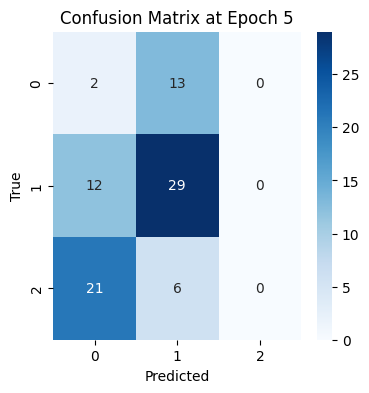

3/3 [==============================] - 0s 51ms/step
Epoch 10 Accuracy: 0.5903614457831325
              precision    recall  f1-score   support

      unripe       0.42      0.87      0.57        15
     perfect       0.86      0.29      0.44        41
    overripe       0.63      0.89      0.74        27

    accuracy                           0.59        83
   macro avg       0.64      0.68      0.58        83
weighted avg       0.70      0.59      0.56        83



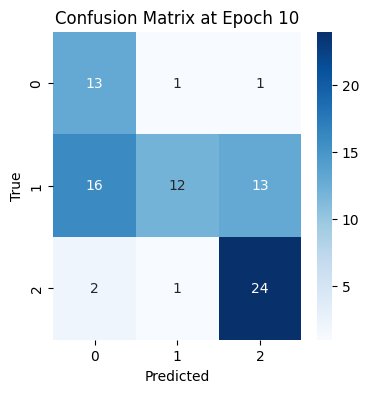

3/3 [==============================] - 0s 51ms/step
Epoch 15 Accuracy: 0.6144578313253012
              precision    recall  f1-score   support

      unripe       0.57      0.87      0.68        15
     perfect       0.59      0.78      0.67        41
    overripe       1.00      0.22      0.36        27

    accuracy                           0.61        83
   macro avg       0.72      0.62      0.57        83
weighted avg       0.72      0.61      0.57        83



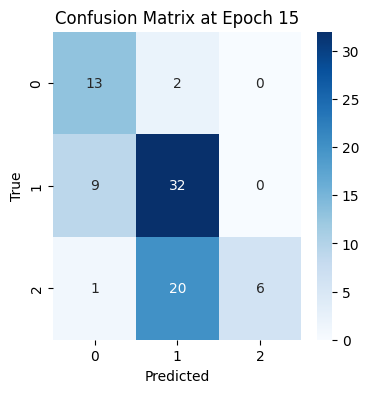

3/3 [==============================] - 0s 57ms/step
Epoch 20 Accuracy: 0.6024096385542169
              precision    recall  f1-score   support

      unripe       0.76      0.87      0.81        15
     perfect       0.56      0.90      0.69        41
    overripe       0.00      0.00      0.00        27

    accuracy                           0.60        83
   macro avg       0.44      0.59      0.50        83
weighted avg       0.42      0.60      0.49        83



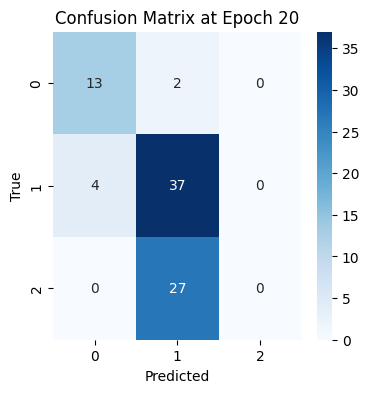

3/3 [==============================] - 0s 53ms/step
Epoch 25 Accuracy: 0.7469879518072289
              precision    recall  f1-score   support

      unripe       0.62      0.87      0.72        15
     perfect       0.80      0.68      0.74        41
    overripe       0.78      0.78      0.78        27

    accuracy                           0.75        83
   macro avg       0.73      0.78      0.75        83
weighted avg       0.76      0.75      0.75        83



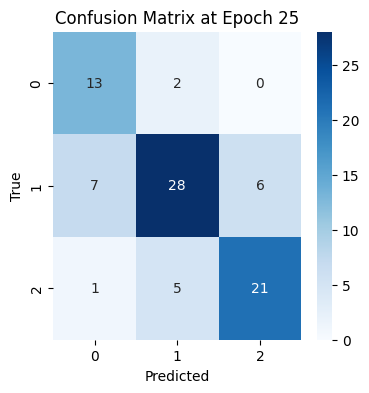

3/3 [==============================] - 0s 64ms/step
Epoch 30 Accuracy: 0.6987951807228916
              precision    recall  f1-score   support

      unripe       0.76      0.87      0.81        15
     perfect       0.91      0.49      0.63        41
    overripe       0.57      0.93      0.70        27

    accuracy                           0.70        83
   macro avg       0.75      0.76      0.72        83
weighted avg       0.77      0.70      0.69        83



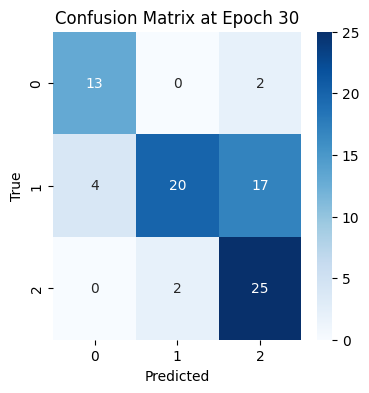

3/3 [==============================] - 0s 53ms/step
Epoch 35 Accuracy: 0.8554216867469879
              precision    recall  f1-score   support

      unripe       1.00      0.80      0.89        15
     perfect       0.87      0.83      0.85        41
    overripe       0.78      0.93      0.85        27

    accuracy                           0.86        83
   macro avg       0.88      0.85      0.86        83
weighted avg       0.87      0.86      0.86        83



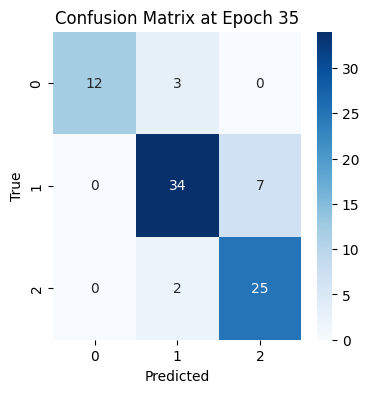

3/3 [==============================] - 0s 63ms/step
Epoch 40 Accuracy: 0.8554216867469879
              precision    recall  f1-score   support

      unripe       1.00      0.80      0.89        15
     perfect       0.92      0.80      0.86        41
    overripe       0.74      0.96      0.84        27

    accuracy                           0.86        83
   macro avg       0.89      0.86      0.86        83
weighted avg       0.88      0.86      0.86        83



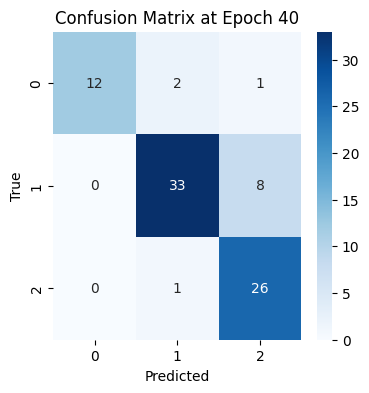

3/3 [==============================] - 0s 56ms/step
Epoch 45 Accuracy: 0.7349397590361446
              precision    recall  f1-score   support

      unripe       0.59      0.87      0.70        15
     perfect       0.79      0.63      0.70        41
    overripe       0.79      0.81      0.80        27

    accuracy                           0.73        83
   macro avg       0.72      0.77      0.74        83
weighted avg       0.75      0.73      0.73        83



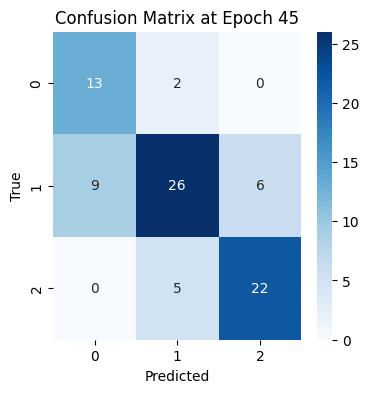

3/3 [==============================] - 0s 51ms/step
Epoch 50 Accuracy: 0.37349397590361444
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        15
     perfect       0.31      0.10      0.15        41
    overripe       0.39      1.00      0.56        27

    accuracy                           0.37        83
   macro avg       0.23      0.37      0.23        83
weighted avg       0.28      0.37      0.25        83



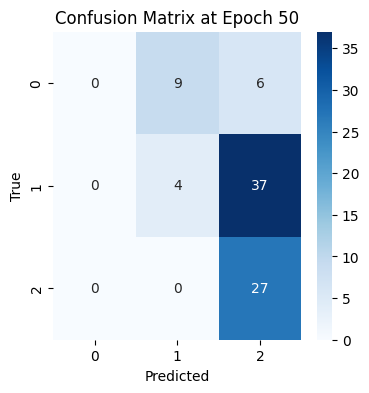

3/3 [==============================] - 0s 51ms/step
Epoch 5 Accuracy: 0.6144578313253012
              precision    recall  f1-score   support

      unripe       1.00      0.73      0.85        15
     perfect       0.82      0.34      0.48        41
    overripe       0.47      0.96      0.63        27

    accuracy                           0.61        83
   macro avg       0.77      0.68      0.65        83
weighted avg       0.74      0.61      0.60        83



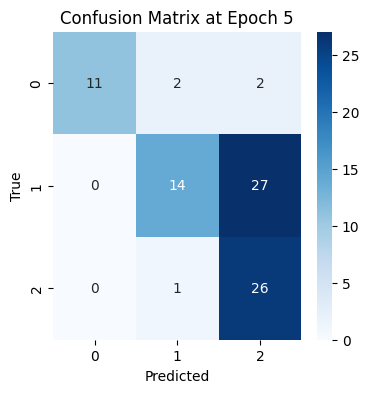

3/3 [==============================] - 0s 56ms/step
Epoch 10 Accuracy: 0.5542168674698795
              precision    recall  f1-score   support

      unripe       1.00      0.80      0.89        15
     perfect       0.88      0.17      0.29        41
    overripe       0.43      1.00      0.60        27

    accuracy                           0.55        83
   macro avg       0.77      0.66      0.59        83
weighted avg       0.75      0.55      0.50        83



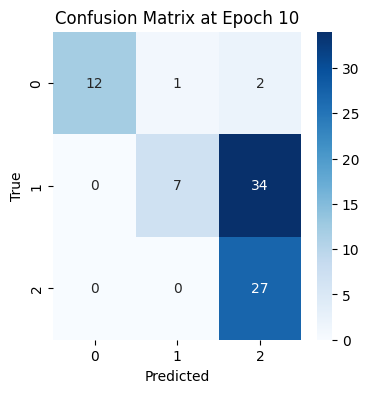

3/3 [==============================] - 0s 58ms/step
Epoch 15 Accuracy: 0.5421686746987951
              precision    recall  f1-score   support

      unripe       0.68      0.87      0.76        15
     perfect       0.86      0.15      0.25        41
    overripe       0.46      0.96      0.62        27

    accuracy                           0.54        83
   macro avg       0.67      0.66      0.54        83
weighted avg       0.70      0.54      0.46        83



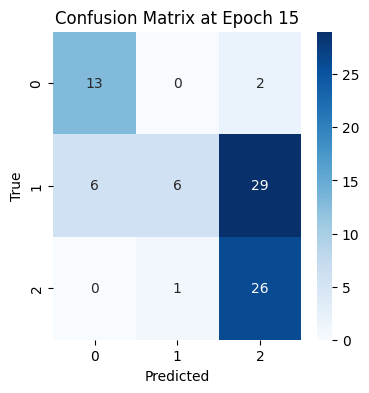

3/3 [==============================] - 0s 51ms/step
Epoch 20 Accuracy: 0.4939759036144578
              precision    recall  f1-score   support

      unripe       0.32      0.87      0.46        15
     perfect       0.71      0.12      0.21        41
    overripe       0.66      0.85      0.74        27

    accuracy                           0.49        83
   macro avg       0.56      0.61      0.47        83
weighted avg       0.62      0.49      0.43        83



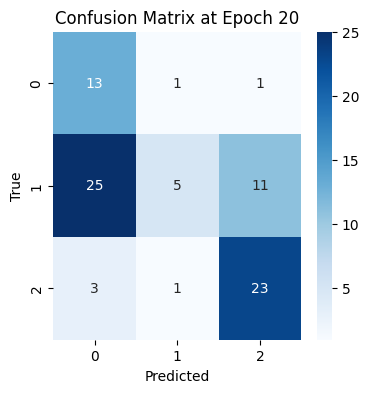

3/3 [==============================] - 0s 86ms/step
Epoch 25 Accuracy: 0.5060240963855421
              precision    recall  f1-score   support

      unripe       0.42      0.87      0.57        15
     perfect       0.83      0.12      0.21        41
    overripe       0.52      0.89      0.66        27

    accuracy                           0.51        83
   macro avg       0.59      0.63      0.48        83
weighted avg       0.66      0.51      0.42        83



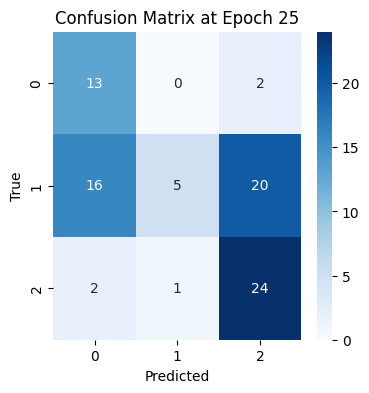

3/3 [==============================] - 0s 48ms/step
Epoch 30 Accuracy: 0.5301204819277109
              precision    recall  f1-score   support

      unripe       0.76      0.87      0.81        15
     perfect       0.83      0.12      0.21        41
    overripe       0.43      0.96      0.60        27

    accuracy                           0.53        83
   macro avg       0.68      0.65      0.54        83
weighted avg       0.69      0.53      0.45        83



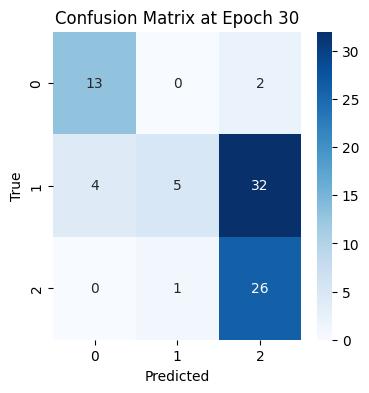

3/3 [==============================] - 0s 59ms/step
Epoch 35 Accuracy: 0.4457831325301205
              precision    recall  f1-score   support

      unripe       1.00      0.20      0.33        15
     perfect       0.41      0.17      0.24        41
    overripe       0.43      1.00      0.60        27

    accuracy                           0.45        83
   macro avg       0.61      0.46      0.39        83
weighted avg       0.52      0.45      0.37        83



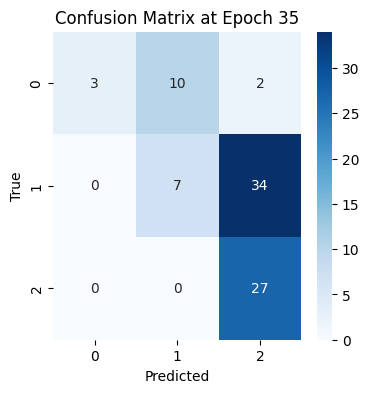

3/3 [==============================] - 0s 60ms/step
Epoch 40 Accuracy: 0.46987951807228917
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        15
     perfect       0.48      0.32      0.38        41
    overripe       0.46      0.96      0.63        27

    accuracy                           0.47        83
   macro avg       0.32      0.43      0.34        83
weighted avg       0.39      0.47      0.39        83



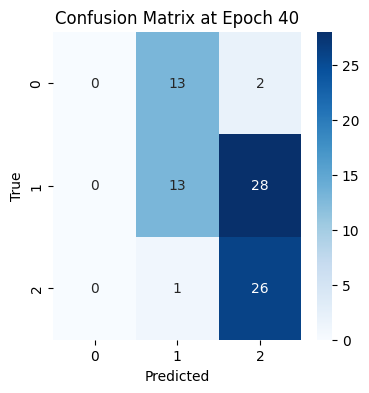

3/3 [==============================] - 0s 51ms/step
Epoch 45 Accuracy: 0.4578313253012048
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        15
     perfect       0.46      0.29      0.36        41
    overripe       0.46      0.96      0.62        27

    accuracy                           0.46        83
   macro avg       0.31      0.42      0.33        83
weighted avg       0.38      0.46      0.38        83



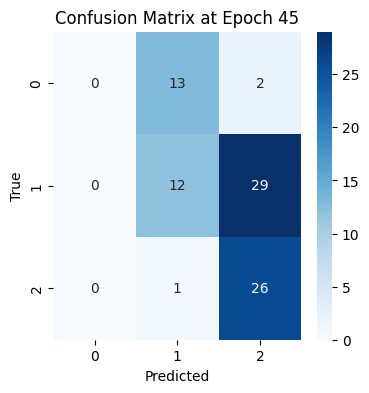

3/3 [==============================] - 0s 50ms/step
Epoch 50 Accuracy: 0.42168674698795183
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        15
     perfect       0.39      0.22      0.28        41
    overripe       0.43      0.96      0.60        27

    accuracy                           0.42        83
   macro avg       0.27      0.39      0.29        83
weighted avg       0.33      0.42      0.33        83



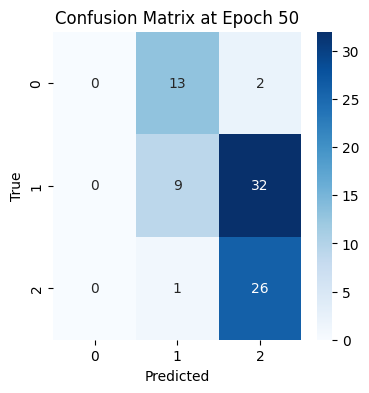

3/3 [==============================] - 0s 52ms/step
Epoch 55 Accuracy: 0.43373493975903615
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        15
     perfect       0.41      0.22      0.29        41
    overripe       0.44      1.00      0.61        27

    accuracy                           0.43        83
   macro avg       0.28      0.41      0.30        83
weighted avg       0.35      0.43      0.34        83



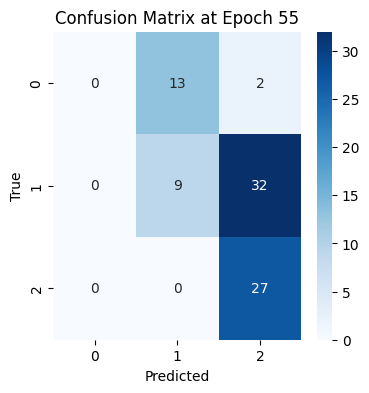

3/3 [==============================] - 0s 56ms/step
Epoch 60 Accuracy: 0.6987951807228916
              precision    recall  f1-score   support

      unripe       0.57      0.87      0.68        15
     perfect       0.82      0.56      0.67        41
    overripe       0.69      0.81      0.75        27

    accuracy                           0.70        83
   macro avg       0.69      0.75      0.70        83
weighted avg       0.73      0.70      0.70        83



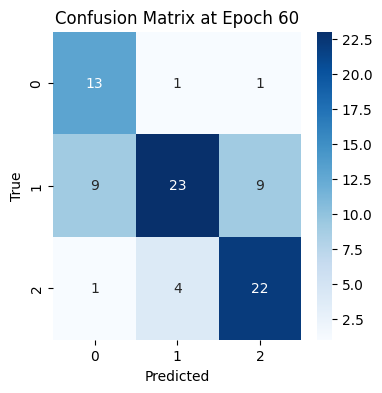

3/3 [==============================] - 0s 59ms/step
Epoch 65 Accuracy: 0.6024096385542169
              precision    recall  f1-score   support

      unripe       0.57      0.27      0.36        15
     perfect       0.65      0.54      0.59        41
    overripe       0.57      0.89      0.70        27

    accuracy                           0.60        83
   macro avg       0.60      0.56      0.55        83
weighted avg       0.61      0.60      0.58        83



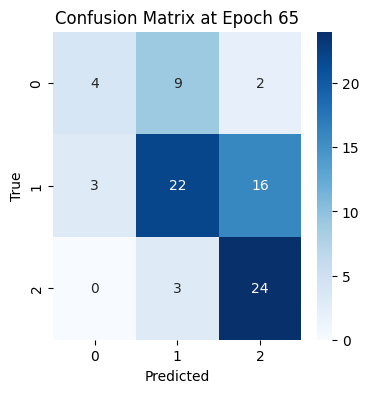

3/3 [==============================] - 0s 56ms/step
Epoch 70 Accuracy: 0.5903614457831325
              precision    recall  f1-score   support

      unripe       0.62      0.33      0.43        15
     perfect       0.66      0.46      0.54        41
    overripe       0.54      0.93      0.68        27

    accuracy                           0.59        83
   macro avg       0.61      0.57      0.55        83
weighted avg       0.61      0.59      0.57        83



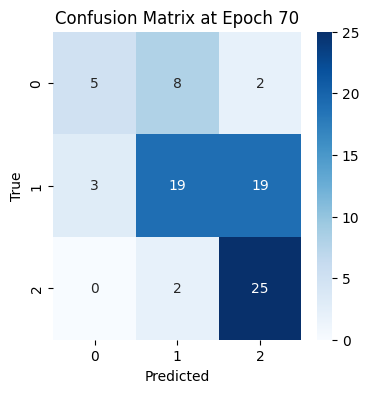

3/3 [==============================] - 0s 56ms/step
Epoch 75 Accuracy: 0.5542168674698795
              precision    recall  f1-score   support

      unripe       0.75      0.60      0.67        15
     perfect       0.71      0.24      0.36        41
    overripe       0.47      1.00      0.64        27

    accuracy                           0.55        83
   macro avg       0.65      0.61      0.56        83
weighted avg       0.64      0.55      0.51        83



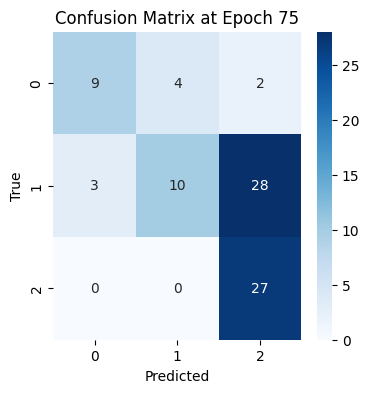

3/3 [==============================] - 0s 51ms/step
Epoch 80 Accuracy: 0.4939759036144578
              precision    recall  f1-score   support

      unripe       1.00      0.07      0.12        15
     perfect       0.52      0.32      0.39        41
    overripe       0.47      1.00      0.64        27

    accuracy                           0.49        83
   macro avg       0.66      0.46      0.39        83
weighted avg       0.59      0.49      0.43        83



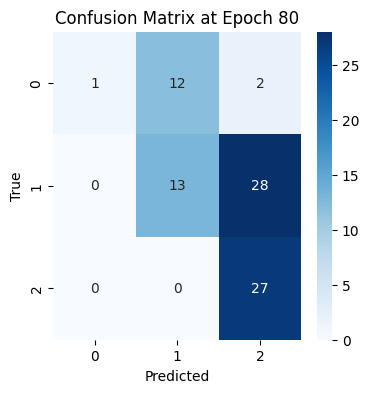

3/3 [==============================] - 0s 50ms/step
Epoch 85 Accuracy: 0.5903614457831325
              precision    recall  f1-score   support

      unripe       0.90      0.60      0.72        15
     perfect       0.74      0.34      0.47        41
    overripe       0.48      0.96      0.64        27

    accuracy                           0.59        83
   macro avg       0.71      0.63      0.61        83
weighted avg       0.68      0.59      0.57        83



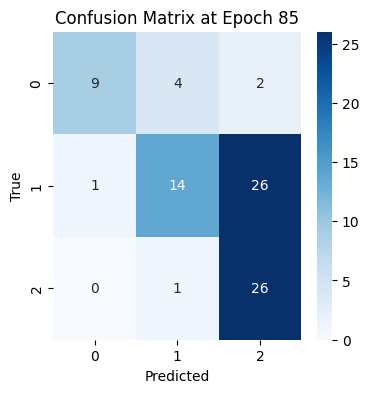

3/3 [==============================] - 0s 57ms/step
Epoch 90 Accuracy: 0.5301204819277109
              precision    recall  f1-score   support

      unripe       1.00      0.07      0.12        15
     perfect       0.57      0.39      0.46        41
    overripe       0.50      1.00      0.67        27

    accuracy                           0.53        83
   macro avg       0.69      0.49      0.42        83
weighted avg       0.63      0.53      0.47        83



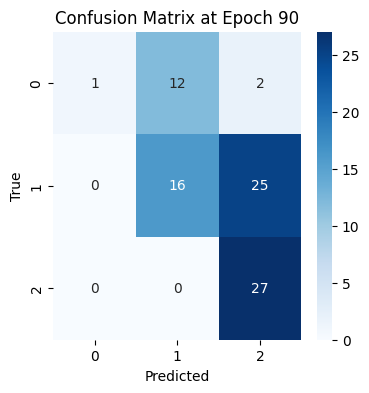

3/3 [==============================] - 0s 51ms/step
Epoch 95 Accuracy: 0.5421686746987951
              precision    recall  f1-score   support

      unripe       0.83      0.33      0.48        15
     perfect       0.61      0.34      0.44        41
    overripe       0.48      0.96      0.64        27

    accuracy                           0.54        83
   macro avg       0.64      0.55      0.52        83
weighted avg       0.61      0.54      0.51        83



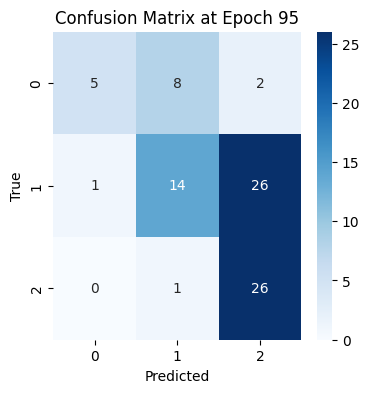

3/3 [==============================] - 0s 52ms/step
Epoch 100 Accuracy: 0.5903614457831325
              precision    recall  f1-score   support

      unripe       0.76      0.87      0.81        15
     perfect       1.00      0.24      0.39        41
    overripe       0.46      0.96      0.63        27

    accuracy                           0.59        83
   macro avg       0.74      0.69      0.61        83
weighted avg       0.78      0.59      0.54        83



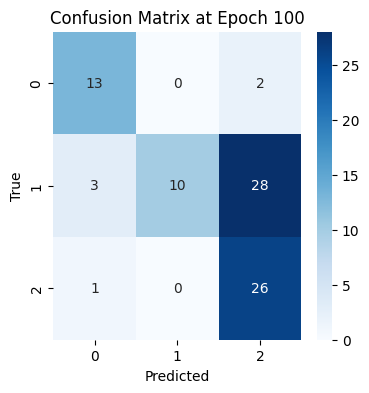

3/3 [==============================] - 0s 54ms/step
Epoch 105 Accuracy: 0.6385542168674698
              precision    recall  f1-score   support

      unripe       0.82      0.60      0.69        15
     perfect       0.78      0.44      0.56        41
    overripe       0.53      0.96      0.68        27

    accuracy                           0.64        83
   macro avg       0.71      0.67      0.65        83
weighted avg       0.71      0.64      0.63        83



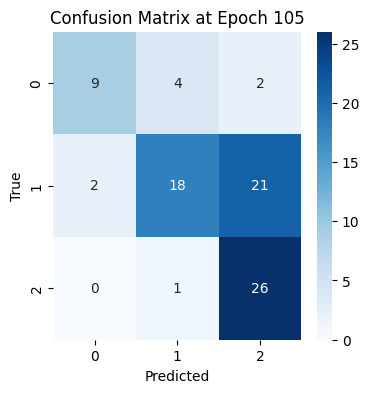

3/3 [==============================] - 0s 71ms/step
Epoch 110 Accuracy: 0.40963855421686746
              precision    recall  f1-score   support

      unripe       1.00      0.07      0.12        15
     perfect       0.35      0.15      0.21        41
    overripe       0.42      1.00      0.59        27

    accuracy                           0.41        83
   macro avg       0.59      0.40      0.31        83
weighted avg       0.49      0.41      0.32        83



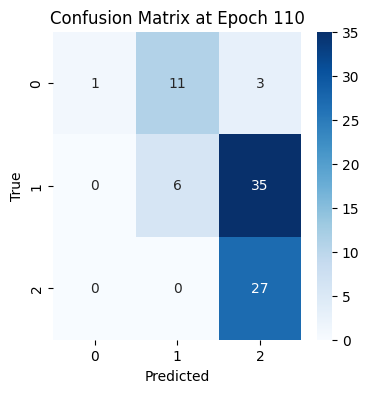

3/3 [==============================] - 0s 51ms/step
Epoch 115 Accuracy: 0.43373493975903615
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        15
     perfect       0.41      0.22      0.29        41
    overripe       0.44      1.00      0.61        27

    accuracy                           0.43        83
   macro avg       0.28      0.41      0.30        83
weighted avg       0.35      0.43      0.34        83



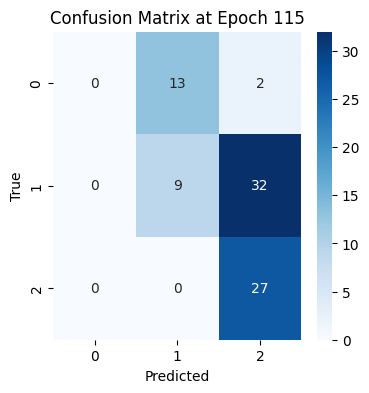

3/3 [==============================] - 0s 53ms/step
Epoch 120 Accuracy: 0.42168674698795183
              precision    recall  f1-score   support

      unripe       1.00      0.07      0.12        15
     perfect       0.41      0.17      0.24        41
    overripe       0.42      1.00      0.59        27

    accuracy                           0.42        83
   macro avg       0.61      0.41      0.32        83
weighted avg       0.52      0.42      0.33        83



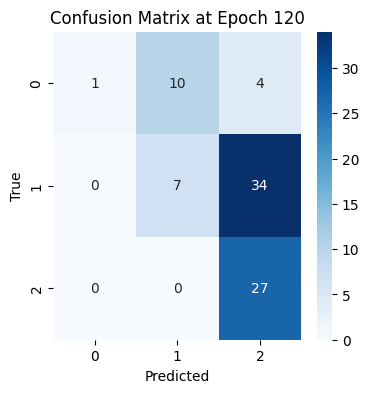

3/3 [==============================] - 0s 51ms/step
Epoch 125 Accuracy: 0.5180722891566265
              precision    recall  f1-score   support

      unripe       1.00      0.13      0.24        15
     perfect       0.56      0.37      0.44        41
    overripe       0.48      0.96      0.64        27

    accuracy                           0.52        83
   macro avg       0.68      0.49      0.44        83
weighted avg       0.61      0.52      0.47        83



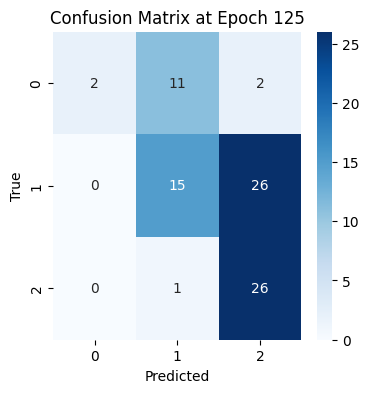

3/3 [==============================] - 0s 52ms/step
Epoch 130 Accuracy: 0.5662650602409639
              precision    recall  f1-score   support

      unripe       1.00      0.13      0.24        15
     perfect       0.61      0.49      0.54        41
    overripe       0.52      0.93      0.67        27

    accuracy                           0.57        83
   macro avg       0.71      0.52      0.48        83
weighted avg       0.65      0.57      0.53        83



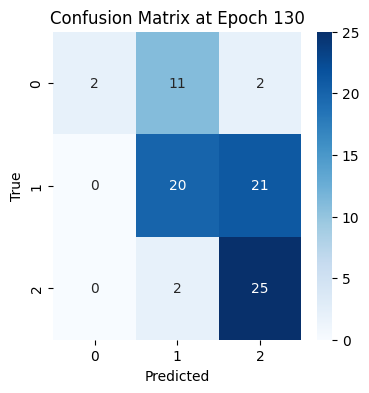

3/3 [==============================] - 0s 54ms/step
Epoch 135 Accuracy: 0.5421686746987951
              precision    recall  f1-score   support

      unripe       1.00      0.07      0.12        15
     perfect       0.55      0.63      0.59        41
    overripe       0.51      0.67      0.58        27

    accuracy                           0.54        83
   macro avg       0.69      0.46      0.43        83
weighted avg       0.62      0.54      0.50        83



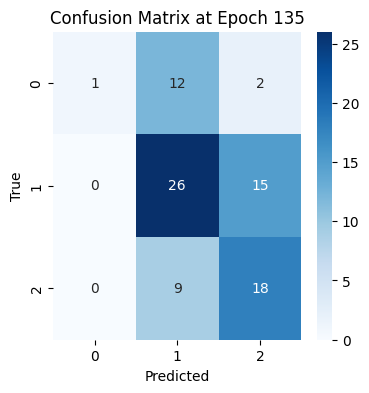

3/3 [==============================] - 0s 54ms/step
Epoch 140 Accuracy: 0.4939759036144578
              precision    recall  f1-score   support

      unripe       1.00      0.13      0.24        15
     perfect       0.52      0.32      0.39        41
    overripe       0.46      0.96      0.63        27

    accuracy                           0.49        83
   macro avg       0.66      0.47      0.42        83
weighted avg       0.59      0.49      0.44        83



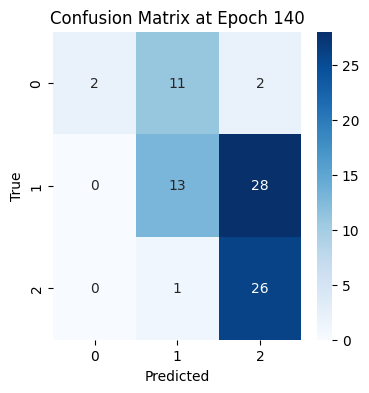

3/3 [==============================] - 0s 55ms/step
Epoch 145 Accuracy: 0.43373493975903615
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        15
     perfect       0.41      0.22      0.29        41
    overripe       0.44      1.00      0.61        27

    accuracy                           0.43        83
   macro avg       0.28      0.41      0.30        83
weighted avg       0.35      0.43      0.34        83



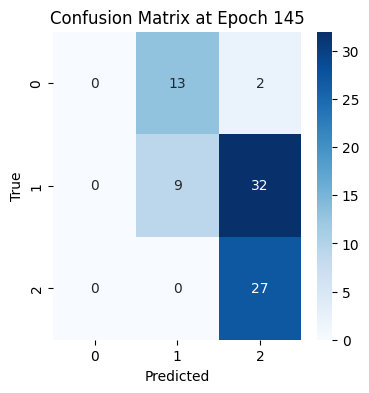

3/3 [==============================] - 0s 51ms/step
Epoch 150 Accuracy: 0.42168674698795183
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        15
     perfect       0.38      0.20      0.26        41
    overripe       0.44      1.00      0.61        27

    accuracy                           0.42        83
   macro avg       0.27      0.40      0.29        83
weighted avg       0.33      0.42      0.32        83



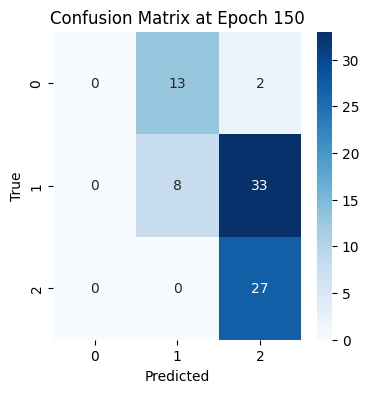

In [45]:
# results from first training session 
x, y = test_avocado_VIS_datagen.__getitem__(0)
y = y.numpy()
for i in range(5,51,5): 
    avocado_vis_model.load_weights(working_dir + 'AVOCADO_VIS_HS_CNN_checkpoints/HS_CNN' + str(i).zfill(4) + '.ckpt')
    # x, y = test_avocado_VIS_datagen.__getitem__(0)
    y_pred = avocado_vis_model.predict(x)
    y_pred = np.argmax(y_pred, axis=1)
    # y = y.numpy()
    print(f"Epoch {i} Accuracy: {np.mean(y_pred == y)}")
    # print recall and precision and f1 score 
    print(classification_report(y, y_pred, target_names=ripeness_state_dict.keys(), zero_division=0))
    # plot confusion matrix 
    cm = confusion_matrix(y, y_pred)
    plt.figure(figsize=(4, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'Confusion Matrix at Epoch {i}')
    plt.show()

# results from second training session
for i in range(5,151,5): 
    avocado_vis_model.load_weights(working_dir + 'AVOCADO_VIS_HS_CNN_checkpoints2/HS_CNN' + str(i).zfill(4) + '.ckpt')
    # x, y = test_avocado_VIS_datagen.__getitem__(0)
    y_pred = avocado_vis_model.predict(x)
    y_pred = np.argmax(y_pred, axis=1)
    # y = y.numpy()
    print(f"Epoch {i} Accuracy: {np.mean(y_pred == y)}")
    # print recall and precision and f1 score 
    print(classification_report(y, y_pred, target_names=ripeness_state_dict.keys(), zero_division=0))
    # plot confusion matrix 
    cm = confusion_matrix(y, y_pred)
    plt.figure(figsize=(4, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'Confusion Matrix at Epoch {i}')
    plt.show()


#### Kiwi Subset (NIR and VIS)

##### NIR

In [48]:
#  get all rows where the camera type is NIR and the fruit is Kiwi
train_kiwi_NIR = train_df[(train_df['camera_type'] == 'NIR') & (train_df['fruit'] == 'Kiwi')]
# apply the same to the validation and test dataframes
val_kiwi_NIR = val_df[(val_df['camera_type'] == 'NIR') & (val_df['fruit'] == 'Kiwi')]
test_kiwi_NIR = test_df[(test_df['camera_type'] == 'NIR') & (test_df['fruit'] == 'Kiwi')]

In [49]:
# 
all_kiwi_nir = pd.concat([train_kiwi_NIR, val_kiwi_NIR, test_kiwi_NIR])

In [50]:
train_kiwi_NIR.head()

,id,fruit,side,day,camera_type,header_file,data_file,record_id,init_weight,end_weight,storage_days,firmness,comment,ripeness_state,ripeness_state_fine,img_shape,ripeness_state_y,is_damaged
8,8,Kiwi,front,day_01,NIR,Kiwi/NIR/day_01/kiwi_day_01_03_front.hdr,Kiwi/NIR/day_01/kiwi_day_01_03_front.bin,8,120,120.0,0,900.0,NaN,perfect,ripe,"(155, 77, 252)",1,0
10,10,Kiwi,back,day_01,NIR,Kiwi/NIR/day_01/kiwi_day_01_03_back.hdr,Kiwi/NIR/day_01/kiwi_day_01_03_back.bin,10,120,120.0,0,900.0,NaN,perfect,ripe,"(153, 76, 252)",1,0
12,12,Kiwi,front,day_01,NIR,Kiwi/NIR/day_01/kiwi_day_01_28_front.hdr,Kiwi/NIR/day_01/kiwi_day_01_28_front.bin,12,114,114.0,0,900.0,NaN,perfect,ripe,"(162, 73, 252)",1,0
14,14,Kiwi,back,day_01,NIR,Kiwi/NIR/day_01/kiwi_day_01_28_back.hdr,Kiwi/NIR/day_01/kiwi_day_01_28_back.bin,14,114,114.0,0,900.0,NaN,perfect,ripe,"(161, 73, 252)",1,0
24,24,Kiwi,front,day_02,NIR,Kiwi/NIR/day_02/kiwi_day_02_10_front.hdr,Kiwi/NIR/day_02/kiwi_day_02_10_front.bin,24,121,120.0,1,1150.0,NaN,perfect,ripe,"(173, 160, 252)",1,0


In [51]:
len(train_kiwi_NIR), len(val_kiwi_NIR), len(test_kiwi_NIR)

(58, 9, 9)

In [9]:
len(all_kiwi_nir)

76

In [11]:
all_kiwi_nir_datagen = HSI_datagen(all_kiwi_nir, 'header_file', 'data_file', {'name': 'ripeness_state_y', 'type': int}, batch_size=76, target_size=(64, 64), data_dir=data_dir,
                            shuffle=True, normalize=False)

Create Image Data Generator and create callback for model checkpointing.

In [52]:
train_kiwi_NIR_datagen = HSI_datagen(train_kiwi_NIR, 'header_file', 'data_file', {'name': 'ripeness_state_y', 'type': int}, batch_size=9, target_size=(64, 64), data_dir=data_dir, 
                           shuffle=True, normalize=False, augment= True, augmentConfig=augConfig, balance=True)
# 
val_kiwi_NIR_datagen = HSI_datagen(val_kiwi_NIR, 'header_file', 'data_file', {'name': 'ripeness_state_y', 'type': int}, batch_size=9, target_size=(64, 64), data_dir=data_dir,
                            shuffle=True, normalize=False, augment= False, augmentConfig=augConfig, balance=True)
# 
kiwi_nir_cb = ModelCheckpoint(filepath = working_dir + 'KIWI_NIR_HS_CNN_checkpoints2/HS_CNN{epoch:04d}.ckpt', verbose=1, save_freq='epoch', period=5, save_weights_only=True)

finally train the model

In [54]:
kiwi_nir_model = build_HSI_CNN((64, 64, 252))

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 depthwise_conv2d_6 (Depthwi  (None, 64, 64, 756)      6804      
 seConv2D)                                                       
                                                                 
 conv2d_6 (Conv2D)           (None, 64, 64, 25)        18925     
                                                                 
 re_lu_8 (ReLU)              (None, 64, 64, 25)        0         
                                                                 
 average_pooling2d_4 (Averag  (None, 16, 16, 25)       0         
 ePooling2D)                                                     
                                                                 
 batch_normalization_8 (Batc  (None, 16, 16, 25)       100       
 hNormalization)                                                 
                                                      

In [55]:
kiwi_nir_model.fit(train_kiwi_NIR_datagen, epochs=150, validation_data=val_kiwi_NIR_datagen)

Epoch 1/150
6/6 [==============================] - 41s 6s/step - loss: 1.0352 - accuracy: 0.5185 - val_loss: 1.5217 - val_accuracy: 0.3333
Epoch 2/150
6/6 [==============================] - 24s 4s/step - loss: 1.0231 - accuracy: 0.5370 - val_loss: 1.4398 - val_accuracy: 0.3333
Epoch 3/150
6/6 [==============================] - 24s 4s/step - loss: 0.9274 - accuracy: 0.4630 - val_loss: 1.4420 - val_accuracy: 0.3333
Epoch 4/150
6/6 [==============================] - 26s 5s/step - loss: 0.9346 - accuracy: 0.5926 - val_loss: 1.5637 - val_accuracy: 0.3333
Epoch 5/150
6/6 [==============================] - 24s 4s/step - loss: 0.7514 - accuracy: 0.6111 - val_loss: 1.7097 - val_accuracy: 0.3333
Epoch 6/150
6/6 [==============================] - 23s 4s/step - loss: 0.7495 - accuracy: 0.5556 - val_loss: 1.7058 - val_accuracy: 0.2222
Epoch 7/150
6/6 [==============================] - 18s 3s/step - loss: 0.8012 - accuracy: 0.5370 - val_loss: 1.6964 - val_accuracy: 0.2222
Epoch 8/150
6/6 [==========

iterate over the different checkpoints and check the performance of the model on the test set. 

In [13]:
#  create data gen using test data 
test_kiwi_NIR_datagen = HSI_datagen(test_kiwi_NIR, 'header_file', 'data_file', {'name': 'ripeness_state_y', 'type': int}, batch_size=len(test_kiwi_NIR), target_size=(64, 64), data_dir=data_dir, 
                           shuffle=True, normalize=False, augment= False, augmentConfig=augConfig, balance=True)

evaluate on test dataset

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 190ms/step
Epoch 5 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.43      1.00      0.60         3
     perfect       1.00      0.67      0.80         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.56         9
   macro avg       0.48      0.56      0.47         9
weighted avg       0.48      0.56      0.47         9



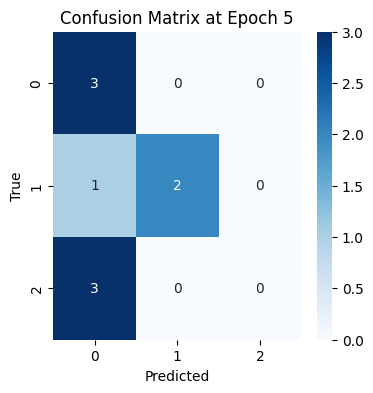

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 68ms/step
Epoch 10 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.60      1.00      0.75         3
     perfect       1.00      0.33      0.50         3
    overripe       0.33      0.33      0.33         3

    accuracy                           0.56         9
   macro avg       0.64      0.56      0.53         9
weighted avg       0.64      0.56      0.53         9



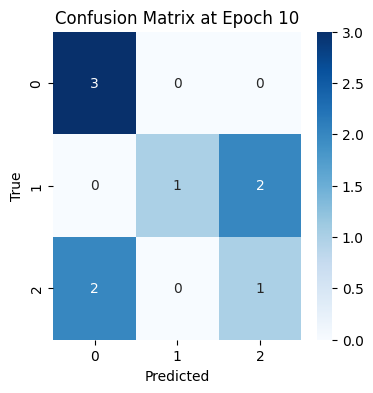

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 66ms/step
Epoch 15 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.38      1.00      0.55         3
     perfect       1.00      0.33      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.46      0.44      0.35         9
weighted avg       0.46      0.44      0.35         9



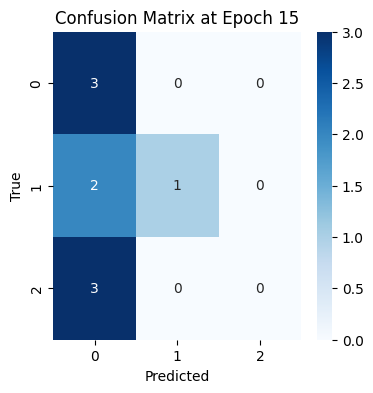

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 57ms/step
Epoch 20 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.38      1.00      0.55         3
     perfect       0.00      0.00      0.00         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.12      0.33      0.18         9
weighted avg       0.12      0.33      0.18         9



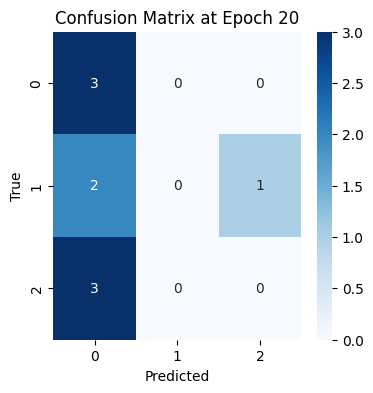

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 57ms/step
Epoch 25 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         3
     perfect       0.50      0.33      0.40         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.33      0.44      0.36         9
weighted avg       0.33      0.44      0.36         9



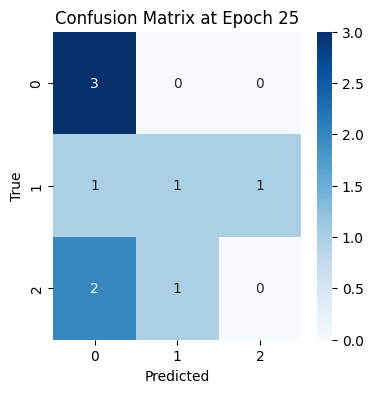

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 46ms/step
Epoch 30 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.60      1.00      0.75         3
     perfect       0.75      1.00      0.86         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.67         9
   macro avg       0.45      0.67      0.54         9
weighted avg       0.45      0.67      0.54         9



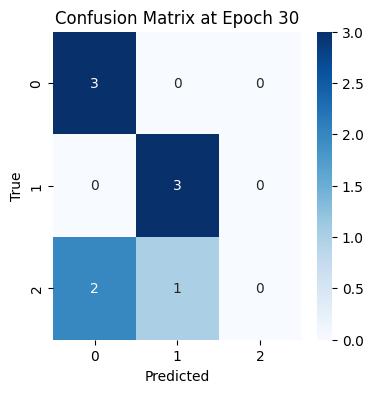

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 53ms/step
Epoch 35 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         3
     perfect       0.50      0.33      0.40         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.33      0.44      0.36         9
weighted avg       0.33      0.44      0.36         9



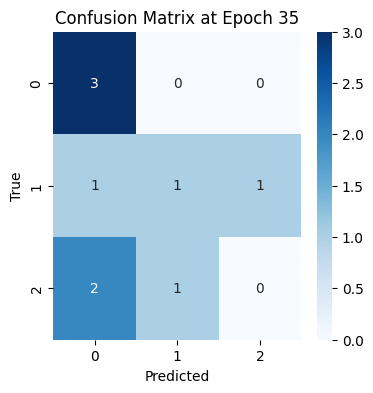

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 45ms/step
Epoch 40 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.33      1.00      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



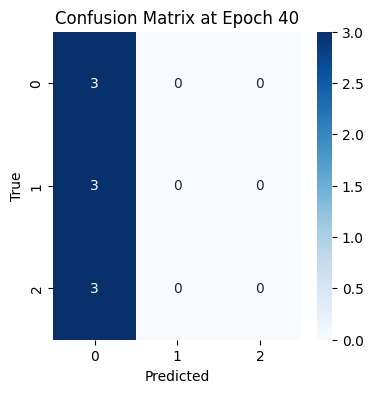

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 49ms/step
Epoch 45 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.67      0.67      0.67         3
     perfect       0.25      0.33      0.29         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.31      0.33      0.32         9
weighted avg       0.31      0.33      0.32         9



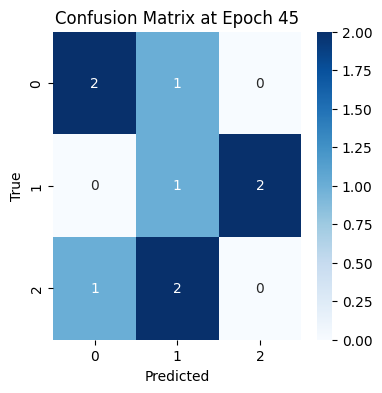

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 47ms/step
Epoch 50 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.67      0.67      0.67         3
     perfect       1.00      0.33      0.50         3
    overripe       0.40      0.67      0.50         3

    accuracy                           0.56         9
   macro avg       0.69      0.56      0.56         9
weighted avg       0.69      0.56      0.56         9



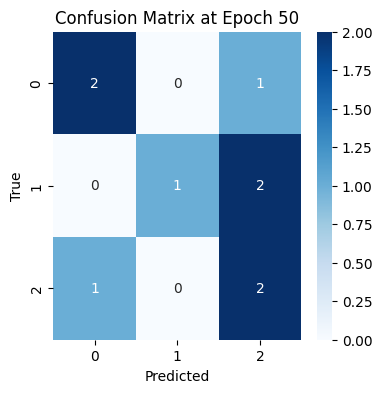

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 56ms/step
Epoch 55 Accuracy: 0.2222222222222222
              precision    recall  f1-score   support

      unripe       0.50      0.33      0.40         3
     perfect       0.00      0.00      0.00         3
    overripe       0.20      0.33      0.25         3

    accuracy                           0.22         9
   macro avg       0.23      0.22      0.22         9
weighted avg       0.23      0.22      0.22         9



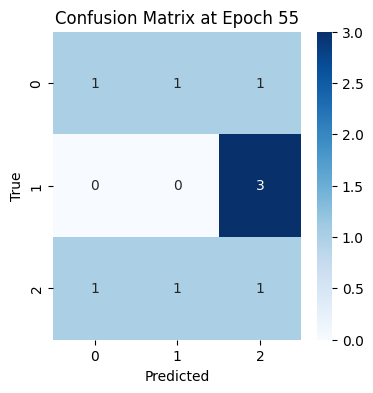

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 46ms/step
Epoch 60 Accuracy: 0.2222222222222222
              precision    recall  f1-score   support

      unripe       0.50      0.33      0.40         3
     perfect       0.25      0.33      0.29         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.22         9
   macro avg       0.25      0.22      0.23         9
weighted avg       0.25      0.22      0.23         9



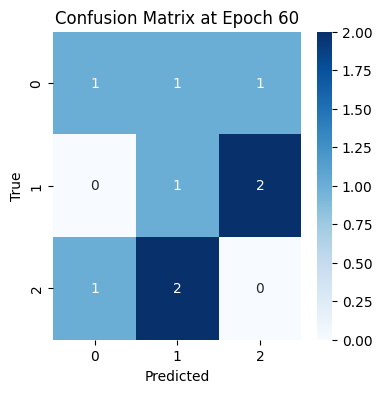

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 44ms/step
Epoch 65 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         3
     perfect       0.67      0.67      0.67         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.56         9
   macro avg       0.39      0.56      0.44         9
weighted avg       0.39      0.56      0.44         9



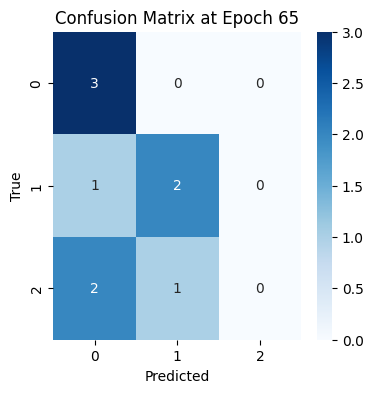

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 49ms/step
Epoch 70 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         3
     perfect       1.00      0.33      0.50         3
    overripe       0.50      0.33      0.40         3

    accuracy                           0.56         9
   macro avg       0.67      0.56      0.52         9
weighted avg       0.67      0.56      0.52         9



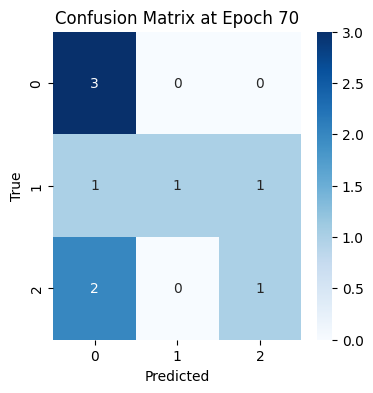

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 47ms/step
Epoch 75 Accuracy: 0.7777777777777778
              precision    recall  f1-score   support

      unripe       0.75      1.00      0.86         3
     perfect       0.75      1.00      0.86         3
    overripe       1.00      0.33      0.50         3

    accuracy                           0.78         9
   macro avg       0.83      0.78      0.74         9
weighted avg       0.83      0.78      0.74         9



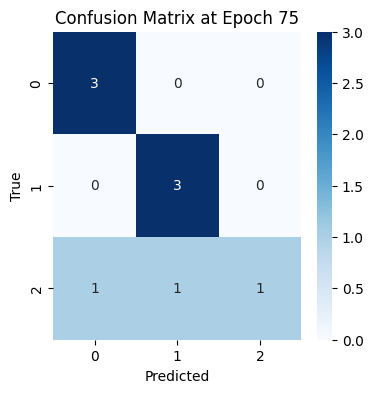

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 44ms/step
Epoch 80 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.50      0.33      0.40         3
     perfect       0.43      1.00      0.60         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.31      0.44      0.33         9
weighted avg       0.31      0.44      0.33         9



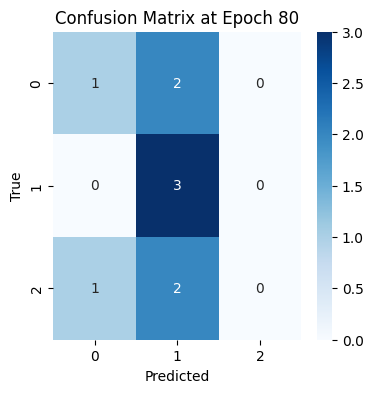

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 55ms/step
Epoch 85 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         3
     perfect       1.00      0.33      0.50         3
    overripe       0.50      0.33      0.40         3

    accuracy                           0.56         9
   macro avg       0.67      0.56      0.52         9
weighted avg       0.67      0.56      0.52         9



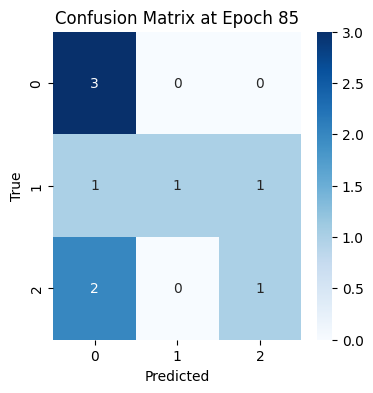

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 50ms/step
Epoch 90 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.00      0.00      0.00         3
    overripe       0.43      1.00      0.60         3

    accuracy                           0.33         9
   macro avg       0.14      0.33      0.20         9
weighted avg       0.14      0.33      0.20         9



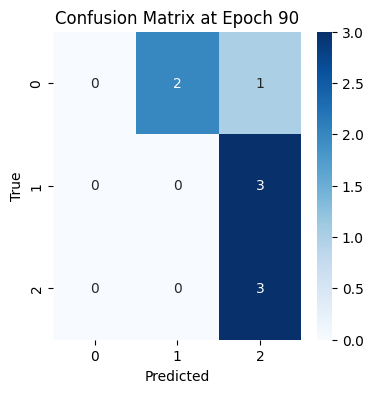

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 45ms/step
Epoch 95 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.43      1.00      0.60         3
     perfect       0.00      0.00      0.00         3
    overripe       0.50      0.33      0.40         3

    accuracy                           0.44         9
   macro avg       0.31      0.44      0.33         9
weighted avg       0.31      0.44      0.33         9



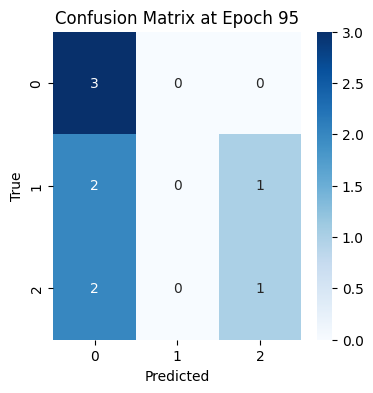

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 43ms/step
Epoch 100 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         3
     perfect       1.00      0.67      0.80         3
    overripe       1.00      0.33      0.50         3

    accuracy                           0.67         9
   macro avg       0.83      0.67      0.66         9
weighted avg       0.83      0.67      0.66         9



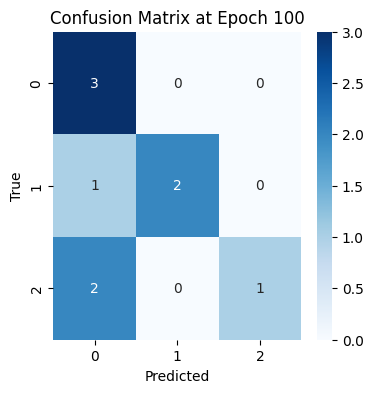

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 48ms/step
Epoch 105 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         3
     perfect       1.00      0.67      0.80         3
    overripe       1.00      0.33      0.50         3

    accuracy                           0.67         9
   macro avg       0.83      0.67      0.66         9
weighted avg       0.83      0.67      0.66         9



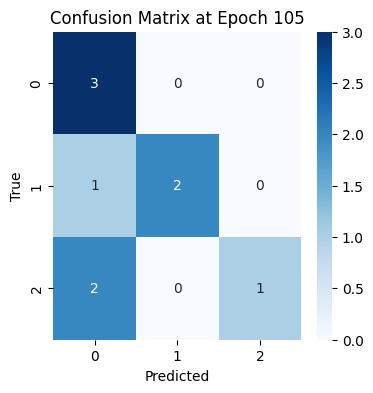

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 46ms/step
Epoch 110 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.75      1.00      0.86         3
     perfect       0.67      0.67      0.67         3
    overripe       0.50      0.33      0.40         3

    accuracy                           0.67         9
   macro avg       0.64      0.67      0.64         9
weighted avg       0.64      0.67      0.64         9



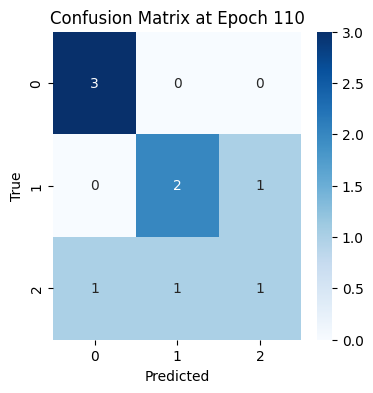

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 46ms/step
Epoch 115 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.60      1.00      0.75         3
     perfect       1.00      0.67      0.80         3
    overripe       0.50      0.33      0.40         3

    accuracy                           0.67         9
   macro avg       0.70      0.67      0.65         9
weighted avg       0.70      0.67      0.65         9



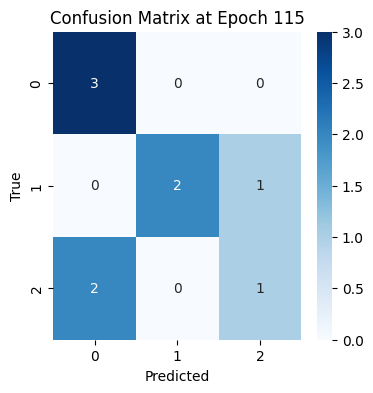

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 53ms/step
Epoch 120 Accuracy: 0.7777777777777778
              precision    recall  f1-score   support

      unripe       0.60      1.00      0.75         3
     perfect       1.00      1.00      1.00         3
    overripe       1.00      0.33      0.50         3

    accuracy                           0.78         9
   macro avg       0.87      0.78      0.75         9
weighted avg       0.87      0.78      0.75         9



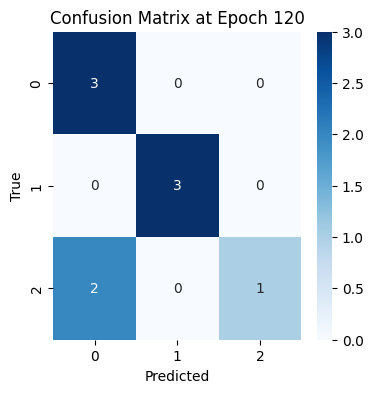

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 44ms/step
Epoch 125 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.67      0.67      0.67         3
     perfect       0.00      0.00      0.00         3
    overripe       0.33      0.67      0.44         3

    accuracy                           0.44         9
   macro avg       0.33      0.44      0.37         9
weighted avg       0.33      0.44      0.37         9



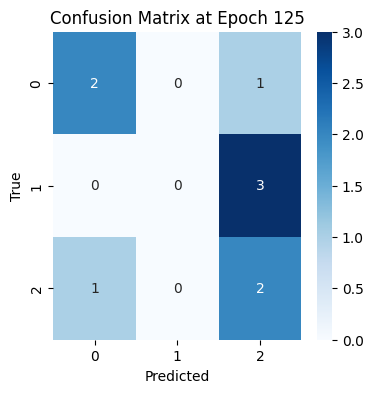

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 53ms/step
Epoch 130 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.50      0.33      0.40         3
     perfect       0.00      0.00      0.00         3
    overripe       0.29      0.67      0.40         3

    accuracy                           0.33         9
   macro avg       0.26      0.33      0.27         9
weighted avg       0.26      0.33      0.27         9



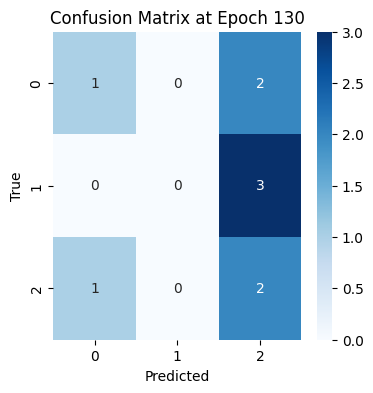

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 53ms/step
Epoch 135 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         3
     perfect       1.00      0.33      0.50         3
    overripe       0.50      0.33      0.40         3

    accuracy                           0.56         9
   macro avg       0.67      0.56      0.52         9
weighted avg       0.67      0.56      0.52         9



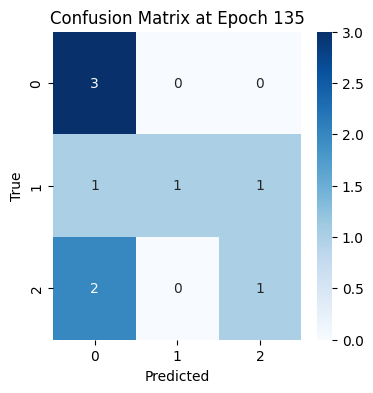

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 49ms/step
Epoch 140 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.75      1.00      0.86         3
     perfect       0.67      0.67      0.67         3
    overripe       0.50      0.33      0.40         3

    accuracy                           0.67         9
   macro avg       0.64      0.67      0.64         9
weighted avg       0.64      0.67      0.64         9



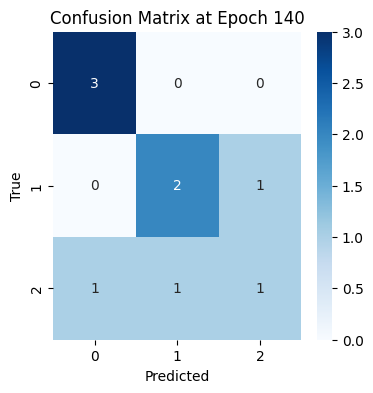

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 49ms/step
Epoch 145 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.43      1.00      0.60         3
     perfect       0.00      0.00      0.00         3
    overripe       0.50      0.33      0.40         3

    accuracy                           0.44         9
   macro avg       0.31      0.44      0.33         9
weighted avg       0.31      0.44      0.33         9



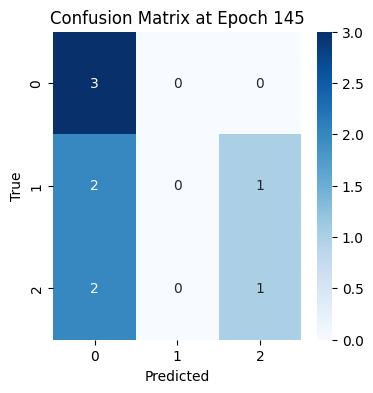

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 48ms/step
Epoch 150 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         3
     perfect       0.50      0.33      0.40         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.33      0.44      0.36         9
weighted avg       0.33      0.44      0.36         9



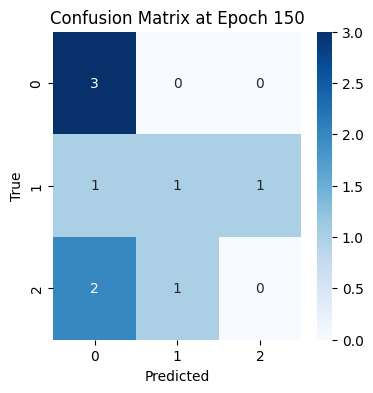

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 63ms/step
Epoch 155 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.50      0.33      0.40         3
     perfect       0.43      1.00      0.60         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.31      0.44      0.33         9
weighted avg       0.31      0.44      0.33         9



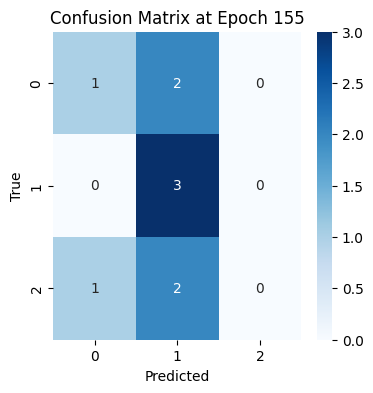

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 50ms/step
Epoch 160 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         3
     perfect       0.67      0.67      0.67         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.56         9
   macro avg       0.39      0.56      0.44         9
weighted avg       0.39      0.56      0.44         9



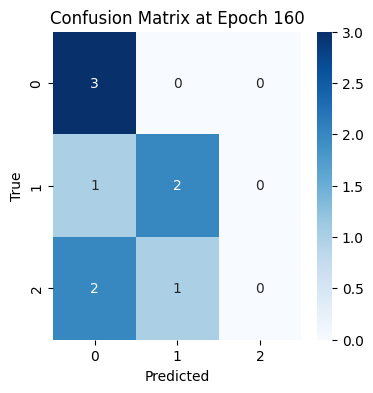

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 46ms/step
Epoch 165 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.60      1.00      0.75         3
     perfect       0.75      1.00      0.86         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.67         9
   macro avg       0.45      0.67      0.54         9
weighted avg       0.45      0.67      0.54         9



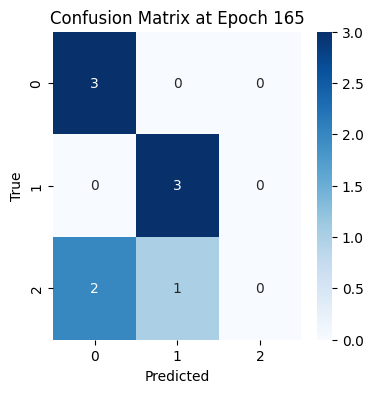

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 54ms/step
Epoch 170 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.50      0.33      0.40         3
     perfect       0.43      1.00      0.60         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.31      0.44      0.33         9
weighted avg       0.31      0.44      0.33         9



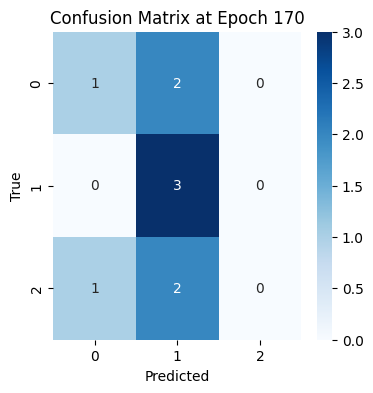

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 45ms/step
Epoch 175 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.50      0.33      0.40         3
     perfect       0.50      1.00      0.67         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.33      0.44      0.36         9
weighted avg       0.33      0.44      0.36         9



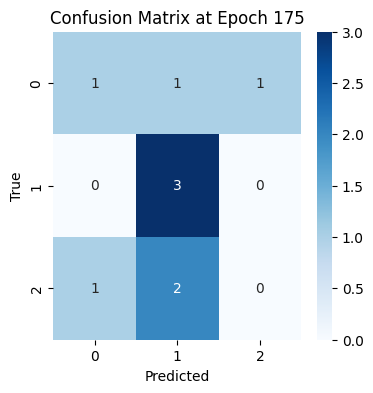

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 48ms/step
Epoch 180 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.50      0.33      0.40         3
     perfect       0.50      1.00      0.67         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.33      0.44      0.36         9
weighted avg       0.33      0.44      0.36         9



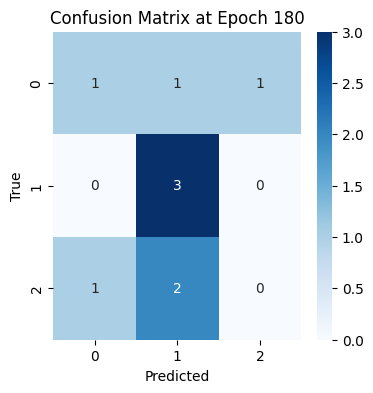

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 52ms/step
Epoch 185 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.75      1.00      0.86         3
     perfect       0.60      1.00      0.75         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.67         9
   macro avg       0.45      0.67      0.54         9
weighted avg       0.45      0.67      0.54         9



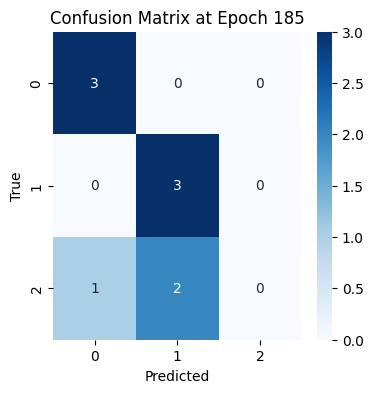

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 50ms/step
Epoch 190 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.75      1.00      0.86         3
     perfect       0.60      1.00      0.75         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.67         9
   macro avg       0.45      0.67      0.54         9
weighted avg       0.45      0.67      0.54         9



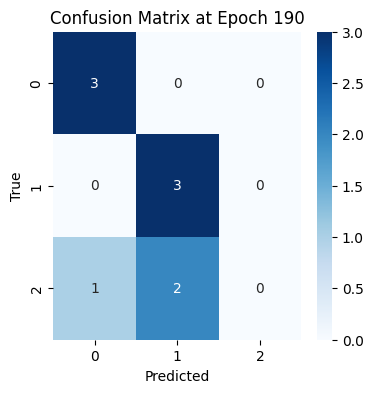

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 43ms/step
Epoch 195 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.75      1.00      0.86         3
     perfect       0.60      1.00      0.75         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.67         9
   macro avg       0.45      0.67      0.54         9
weighted avg       0.45      0.67      0.54         9



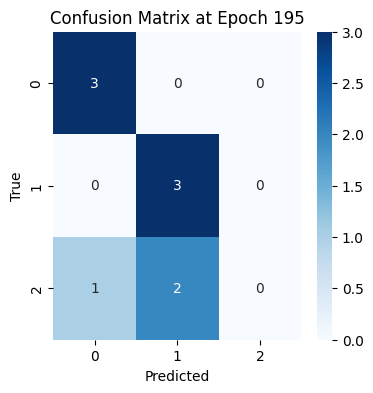

class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 48ms/step
Epoch 200 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.75      1.00      0.86         3
     perfect       0.60      1.00      0.75         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.67         9
   macro avg       0.45      0.67      0.54         9
weighted avg       0.45      0.67      0.54         9



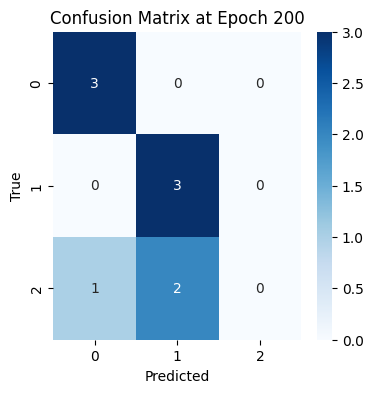

In [ ]:
for i in range(5,201,5): 
    kiwi_nir_model.load_weights(working_dir + 'HS_CNN_checkpoints/HS_CNN' + str(i).zfill(4) + '.ckpt')
    x, y = test_kiwi_NIR_datagen.__getitem__(0)
    y_pred = kiwi_nir_model.predict(x)
    y_pred = np.argmax(y_pred, axis=1)
    y = y.numpy()
    print(f"Epoch {i} Accuracy: {np.mean(y_pred == y)}")
    # print recall and precision and f1 score 
    print(classification_report(y, y_pred, target_names=ripeness_state_dict.keys(), zero_division=0))
    # plot confusion matrix 
    cm = confusion_matrix(y, y_pred)
    plt.figure(figsize=(4, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'Confusion Matrix at Epoch {i}')
    plt.show()

evaluate on entire dataset

3/3 [==============================] - 0s 51ms/step
Epoch 5 Accuracy: 0.27631578947368424
              precision    recall  f1-score   support

      unripe       0.26      1.00      0.41        18
     perfect       0.40      0.05      0.09        38
    overripe       1.00      0.05      0.10        20

    accuracy                           0.28        76
   macro avg       0.55      0.37      0.20        76
weighted avg       0.52      0.28      0.17        76



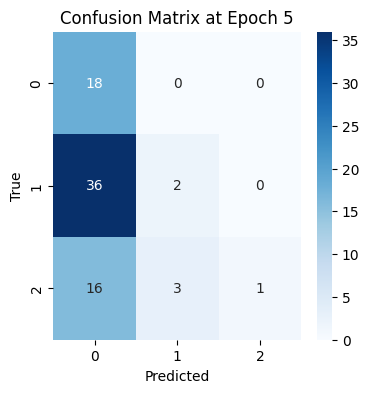

3/3 [==============================] - 0s 49ms/step
Epoch 10 Accuracy: 0.7105263157894737
              precision    recall  f1-score   support

      unripe       0.84      0.89      0.86        18
     perfect       0.95      0.53      0.68        38
    overripe       0.50      0.90      0.64        20

    accuracy                           0.71        76
   macro avg       0.76      0.77      0.73        76
weighted avg       0.81      0.71      0.71        76



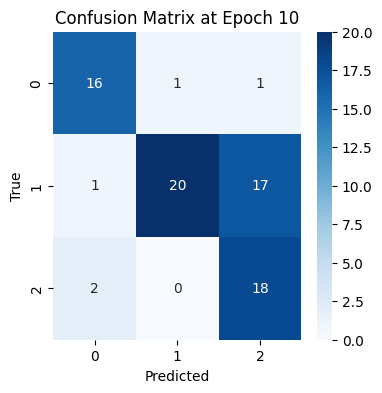

3/3 [==============================] - 0s 65ms/step
Epoch 15 Accuracy: 0.39473684210526316
              precision    recall  f1-score   support

      unripe       0.29      1.00      0.44        18
     perfect       1.00      0.13      0.23        38
    overripe       0.88      0.35      0.50        20

    accuracy                           0.39        76
   macro avg       0.72      0.49      0.39        76
weighted avg       0.80      0.39      0.35        76



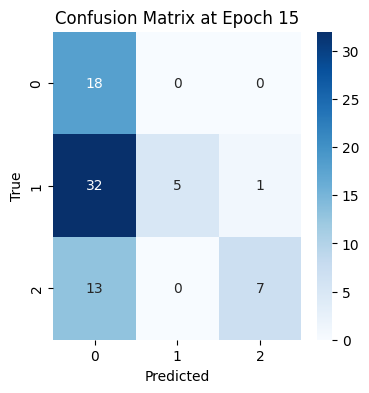

3/3 [==============================] - 0s 48ms/step
Epoch 20 Accuracy: 0.2894736842105263
              precision    recall  f1-score   support

      unripe       0.26      1.00      0.41        18
     perfect       0.00      0.00      0.00        38
    overripe       0.67      0.20      0.31        20

    accuracy                           0.29        76
   macro avg       0.31      0.40      0.24        76
weighted avg       0.24      0.29      0.18        76



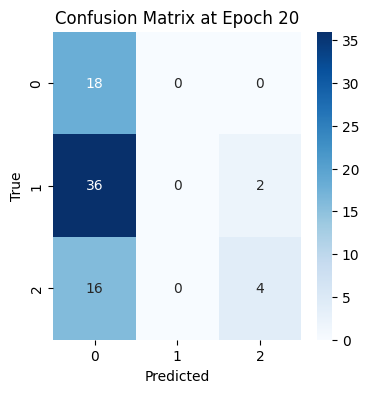

3/3 [==============================] - 0s 52ms/step
Epoch 25 Accuracy: 0.5263157894736842
              precision    recall  f1-score   support

      unripe       0.43      1.00      0.60        18
     perfect       0.63      0.50      0.56        38
    overripe       0.75      0.15      0.25        20

    accuracy                           0.53        76
   macro avg       0.60      0.55      0.47        76
weighted avg       0.62      0.53      0.49        76



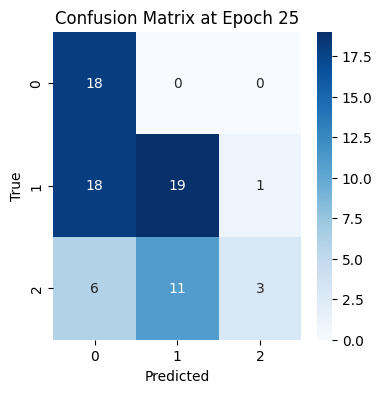

3/3 [==============================] - 0s 45ms/step
Epoch 30 Accuracy: 0.7105263157894737
              precision    recall  f1-score   support

      unripe       0.83      0.83      0.83        18
     perfect       0.66      0.97      0.79        38
    overripe       1.00      0.10      0.18        20

    accuracy                           0.71        76
   macro avg       0.83      0.64      0.60        76
weighted avg       0.79      0.71      0.64        76



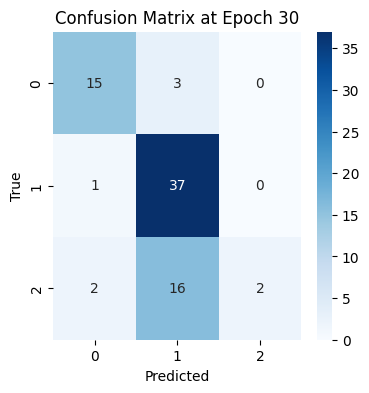

3/3 [==============================] - 0s 55ms/step
Epoch 35 Accuracy: 0.6578947368421053
              precision    recall  f1-score   support

      unripe       0.53      0.94      0.68        18
     perfect       0.72      0.68      0.70        38
    overripe       0.88      0.35      0.50        20

    accuracy                           0.66        76
   macro avg       0.71      0.66      0.63        76
weighted avg       0.72      0.66      0.64        76



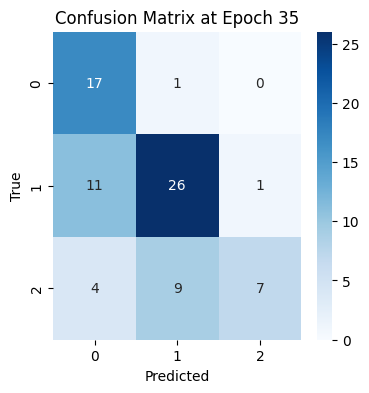

3/3 [==============================] - 0s 50ms/step
Epoch 40 Accuracy: 0.25
              precision    recall  f1-score   support

      unripe       0.24      1.00      0.39        18
     perfect       0.00      0.00      0.00        38
    overripe       1.00      0.05      0.10        20

    accuracy                           0.25        76
   macro avg       0.41      0.35      0.16        76
weighted avg       0.32      0.25      0.12        76



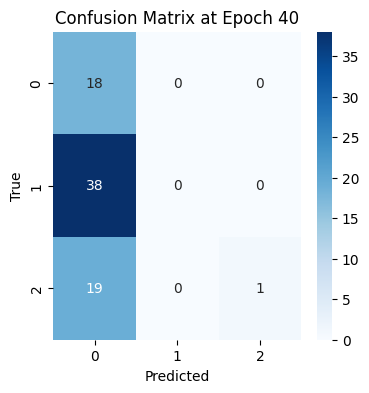

3/3 [==============================] - 0s 48ms/step
Epoch 45 Accuracy: 0.7236842105263158
              precision    recall  f1-score   support

      unripe       0.93      0.78      0.85        18
     perfect       0.70      0.84      0.76        38
    overripe       0.60      0.45      0.51        20

    accuracy                           0.72        76
   macro avg       0.74      0.69      0.71        76
weighted avg       0.73      0.72      0.72        76



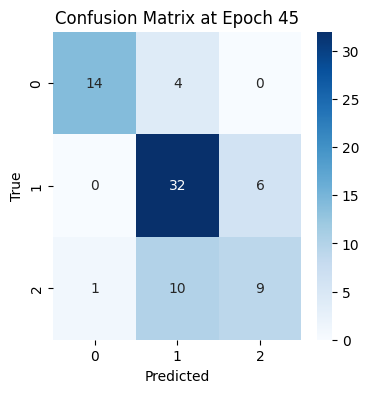

3/3 [==============================] - 0s 52ms/step
Epoch 50 Accuracy: 0.4868421052631579
              precision    recall  f1-score   support

      unripe       0.92      0.67      0.77        18
     perfect       0.86      0.16      0.27        38
    overripe       0.34      0.95      0.50        20

    accuracy                           0.49        76
   macro avg       0.71      0.59      0.51        76
weighted avg       0.74      0.49      0.45        76



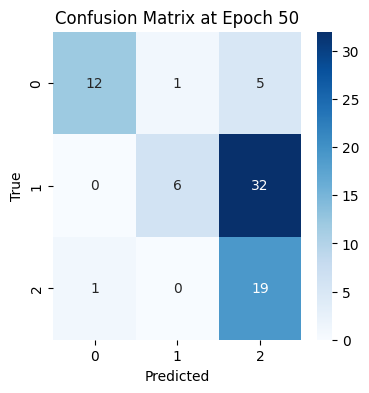

3/3 [==============================] - 0s 49ms/step
Epoch 55 Accuracy: 0.4868421052631579
              precision    recall  f1-score   support

      unripe       0.80      0.22      0.35        18
     perfect       0.71      0.39      0.51        38
    overripe       0.36      0.90      0.51        20

    accuracy                           0.49        76
   macro avg       0.62      0.51      0.46        76
weighted avg       0.64      0.49      0.47        76



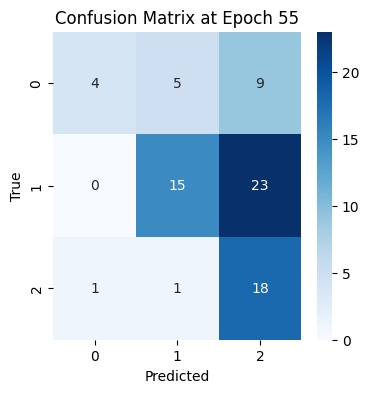

3/3 [==============================] - 0s 51ms/step
Epoch 60 Accuracy: 0.6710526315789473
              precision    recall  f1-score   support

      unripe       0.80      0.22      0.35        18
     perfect       0.67      0.82      0.74        38
    overripe       0.64      0.80      0.71        20

    accuracy                           0.67        76
   macro avg       0.70      0.61      0.60        76
weighted avg       0.69      0.67      0.64        76



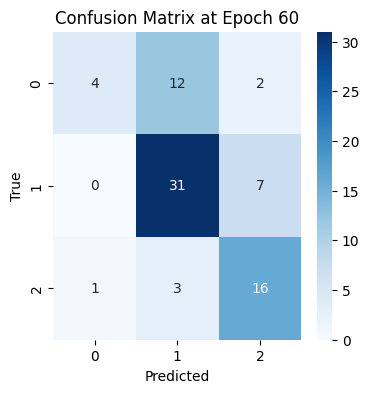

3/3 [==============================] - 0s 48ms/step
Epoch 65 Accuracy: 0.4342105263157895
              precision    recall  f1-score   support

      unripe       0.33      1.00      0.49        18
     perfect       0.68      0.34      0.46        38
    overripe       1.00      0.10      0.18        20

    accuracy                           0.43        76
   macro avg       0.67      0.48      0.38        76
weighted avg       0.68      0.43      0.39        76



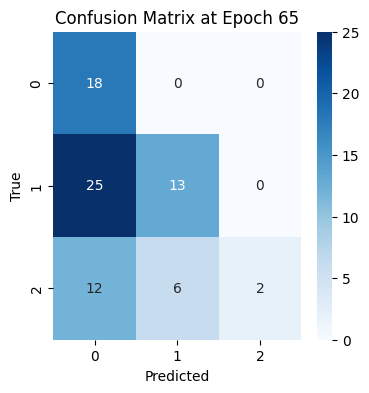

3/3 [==============================] - 0s 58ms/step
Epoch 70 Accuracy: 0.7368421052631579
              precision    recall  f1-score   support

      unripe       0.52      0.94      0.67        18
     perfect       0.95      0.55      0.70        38
    overripe       0.86      0.90      0.88        20

    accuracy                           0.74        76
   macro avg       0.78      0.80      0.75        76
weighted avg       0.82      0.74      0.74        76



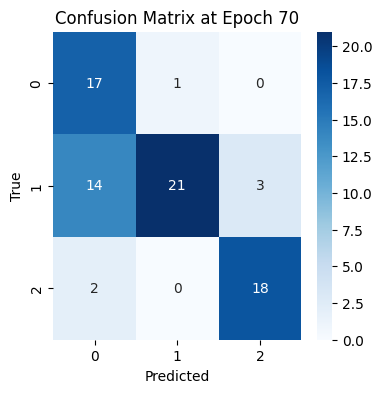

3/3 [==============================] - 0s 55ms/step
Epoch 75 Accuracy: 0.9078947368421053
              precision    recall  f1-score   support

      unripe       0.88      0.83      0.86        18
     perfect       0.90      0.95      0.92        38
    overripe       0.95      0.90      0.92        20

    accuracy                           0.91        76
   macro avg       0.91      0.89      0.90        76
weighted avg       0.91      0.91      0.91        76



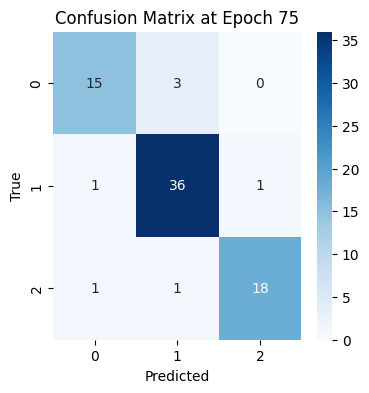

3/3 [==============================] - 0s 49ms/step
Epoch 80 Accuracy: 0.7105263157894737
              precision    recall  f1-score   support

      unripe       0.80      0.22      0.35        18
     perfect       0.64      1.00      0.78        38
    overripe       1.00      0.60      0.75        20

    accuracy                           0.71        76
   macro avg       0.81      0.61      0.63        76
weighted avg       0.77      0.71      0.67        76



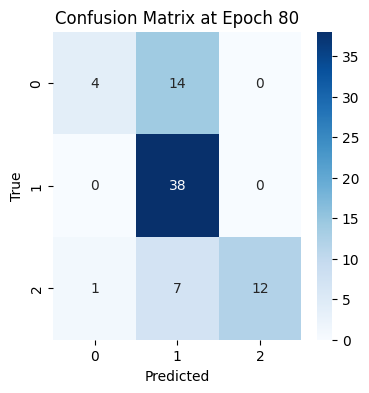

3/3 [==============================] - 0s 51ms/step
Epoch 85 Accuracy: 0.40789473684210525
              precision    recall  f1-score   support

      unripe       0.33      1.00      0.49        18
     perfect       1.00      0.05      0.10        38
    overripe       0.58      0.55      0.56        20

    accuracy                           0.41        76
   macro avg       0.64      0.53      0.39        76
weighted avg       0.73      0.41      0.32        76



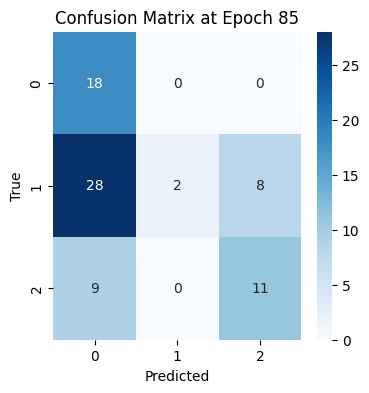

3/3 [==============================] - 0s 52ms/step
Epoch 90 Accuracy: 0.32894736842105265
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        18
     perfect       0.42      0.13      0.20        38
    overripe       0.31      1.00      0.48        20

    accuracy                           0.33        76
   macro avg       0.24      0.38      0.23        76
weighted avg       0.29      0.33      0.23        76



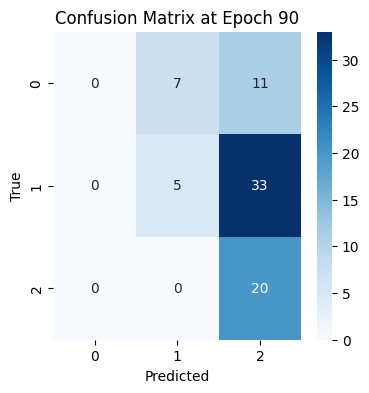

3/3 [==============================] - 0s 64ms/step
Epoch 95 Accuracy: 0.39473684210526316
              precision    recall  f1-score   support

      unripe       0.30      1.00      0.46        18
     perfect       0.00      0.00      0.00        38
    overripe       0.80      0.60      0.69        20

    accuracy                           0.39        76
   macro avg       0.37      0.53      0.38        76
weighted avg       0.28      0.39      0.29        76



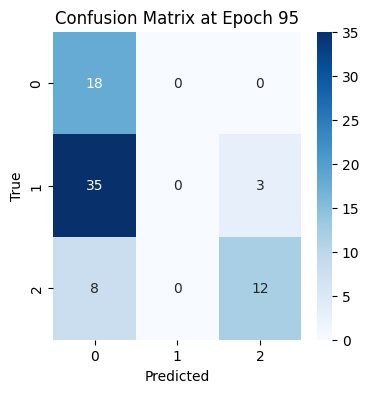

3/3 [==============================] - 0s 52ms/step
Epoch 100 Accuracy: 0.5263157894736842
              precision    recall  f1-score   support

      unripe       0.34      1.00      0.51        18
     perfect       1.00      0.32      0.48        38
    overripe       0.91      0.50      0.65        20

    accuracy                           0.53        76
   macro avg       0.75      0.61      0.54        76
weighted avg       0.82      0.53      0.53        76



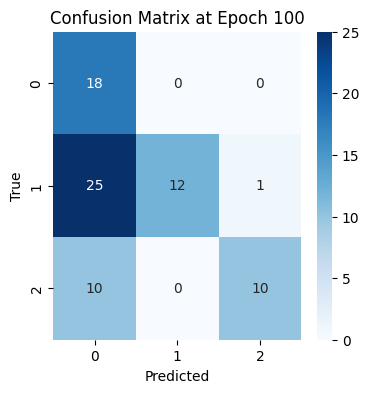

3/3 [==============================] - 0s 50ms/step
Epoch 105 Accuracy: 0.618421052631579
              precision    recall  f1-score   support

      unripe       0.41      0.94      0.58        18
     perfect       0.94      0.42      0.58        38
    overripe       0.78      0.70      0.74        20

    accuracy                           0.62        76
   macro avg       0.71      0.69      0.63        76
weighted avg       0.77      0.62      0.62        76



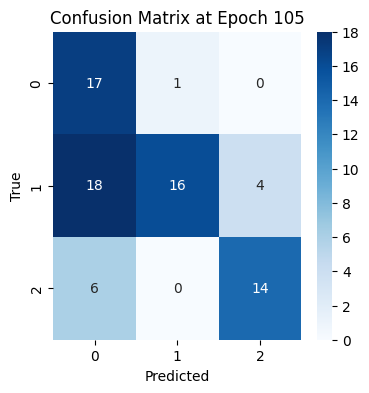

3/3 [==============================] - 0s 50ms/step
Epoch 110 Accuracy: 0.7105263157894737
              precision    recall  f1-score   support

      unripe       0.83      0.83      0.83        18
     perfect       0.84      0.55      0.67        38
    overripe       0.55      0.90      0.68        20

    accuracy                           0.71        76
   macro avg       0.74      0.76      0.73        76
weighted avg       0.76      0.71      0.71        76



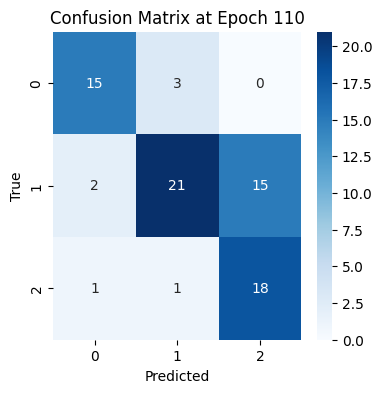

3/3 [==============================] - 0s 57ms/step
Epoch 115 Accuracy: 0.8421052631578947
              precision    recall  f1-score   support

      unripe       0.71      0.83      0.77        18
     perfect       0.91      0.82      0.86        38
    overripe       0.86      0.90      0.88        20

    accuracy                           0.84        76
   macro avg       0.83      0.85      0.84        76
weighted avg       0.85      0.84      0.84        76



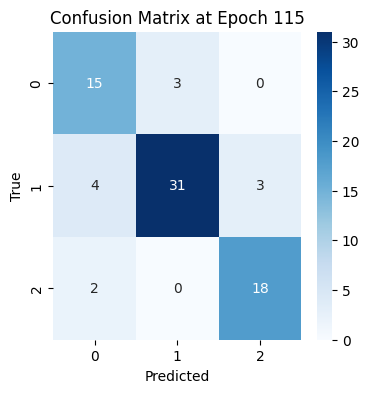

3/3 [==============================] - 0s 52ms/step
Epoch 120 Accuracy: 0.8552631578947368
              precision    recall  f1-score   support

      unripe       0.68      0.83      0.75        18
     perfect       0.91      0.84      0.88        38
    overripe       0.95      0.90      0.92        20

    accuracy                           0.86        76
   macro avg       0.85      0.86      0.85        76
weighted avg       0.87      0.86      0.86        76



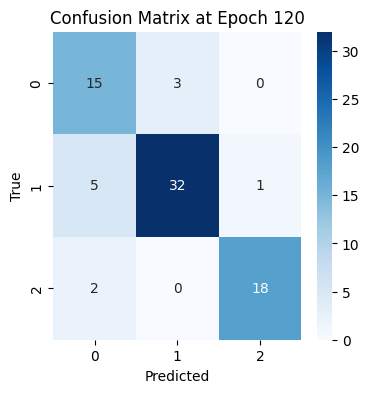

3/3 [==============================] - 0s 46ms/step
Epoch 125 Accuracy: 0.47368421052631576
              precision    recall  f1-score   support

      unripe       0.92      0.67      0.77        18
     perfect       0.83      0.13      0.23        38
    overripe       0.33      0.95      0.49        20

    accuracy                           0.47        76
   macro avg       0.70      0.58      0.50        76
weighted avg       0.72      0.47      0.43        76



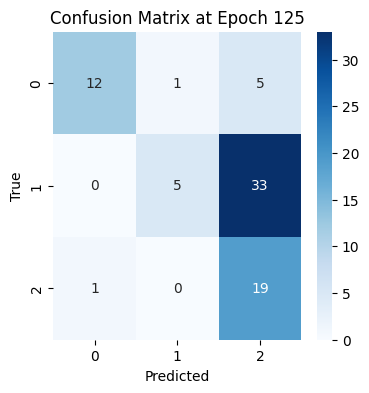

3/3 [==============================] - 0s 50ms/step
Epoch 130 Accuracy: 0.3684210526315789
              precision    recall  f1-score   support

      unripe       0.90      0.50      0.64        18
     perfect       0.00      0.00      0.00        38
    overripe       0.29      0.95      0.44        20

    accuracy                           0.37        76
   macro avg       0.40      0.48      0.36        76
weighted avg       0.29      0.37      0.27        76



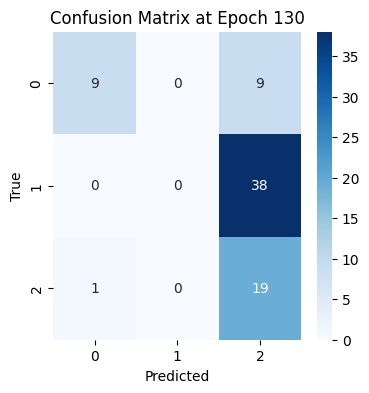

3/3 [==============================] - 0s 56ms/step
Epoch 135 Accuracy: 0.5657894736842105
              precision    recall  f1-score   support

      unripe       0.62      0.83      0.71        18
     perfect       0.83      0.26      0.40        38
    overripe       0.45      0.90      0.60        20

    accuracy                           0.57        76
   macro avg       0.64      0.67      0.57        76
weighted avg       0.68      0.57      0.53        76



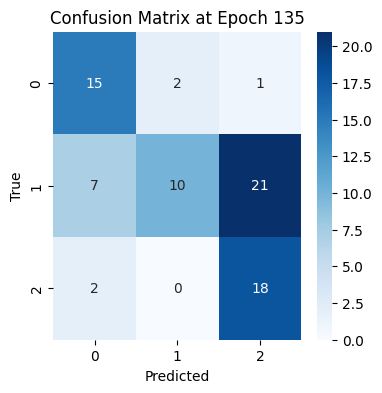

3/3 [==============================] - 0s 51ms/step
Epoch 140 Accuracy: 0.8289473684210527
              precision    recall  f1-score   support

      unripe       0.94      0.83      0.88        18
     perfect       0.88      0.79      0.83        38
    overripe       0.69      0.90      0.78        20

    accuracy                           0.83        76
   macro avg       0.84      0.84      0.83        76
weighted avg       0.85      0.83      0.83        76



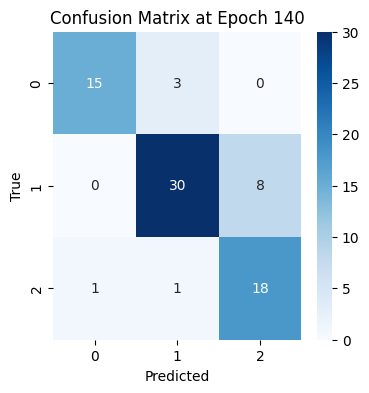

3/3 [==============================] - 0s 53ms/step
Epoch 145 Accuracy: 0.40789473684210525
              precision    recall  f1-score   support

      unripe       0.30      1.00      0.46        18
     perfect       1.00      0.03      0.05        38
    overripe       0.86      0.60      0.71        20

    accuracy                           0.41        76
   macro avg       0.72      0.54      0.40        76
weighted avg       0.80      0.41      0.32        76



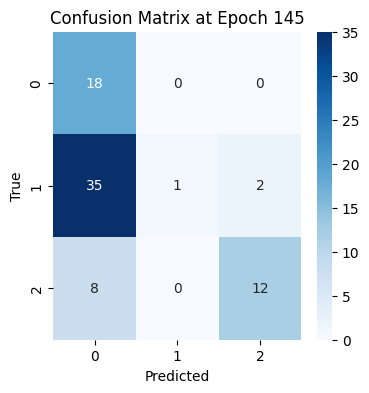

3/3 [==============================] - 0s 60ms/step
Epoch 150 Accuracy: 0.6842105263157895
              precision    recall  f1-score   support

      unripe       0.57      0.94      0.71        18
     perfect       0.72      0.68      0.70        38
    overripe       0.90      0.45      0.60        20

    accuracy                           0.68        76
   macro avg       0.73      0.69      0.67        76
weighted avg       0.73      0.68      0.68        76



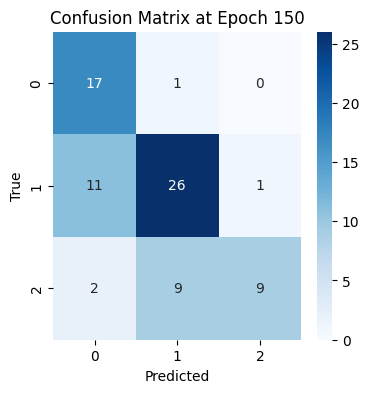

3/3 [==============================] - 0s 64ms/step
Epoch 155 Accuracy: 0.75
              precision    recall  f1-score   support

      unripe       0.86      0.33      0.48        18
     perfect       0.68      1.00      0.81        38
    overripe       1.00      0.65      0.79        20

    accuracy                           0.75        76
   macro avg       0.85      0.66      0.69        76
weighted avg       0.81      0.75      0.73        76



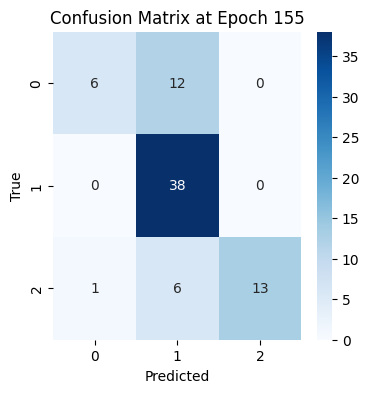

3/3 [==============================] - 0s 57ms/step
Epoch 160 Accuracy: 0.75
              precision    recall  f1-score   support

      unripe       0.76      0.89      0.82        18
     perfect       0.71      0.92      0.80        38
    overripe       1.00      0.30      0.46        20

    accuracy                           0.75        76
   macro avg       0.83      0.70      0.70        76
weighted avg       0.80      0.75      0.72        76



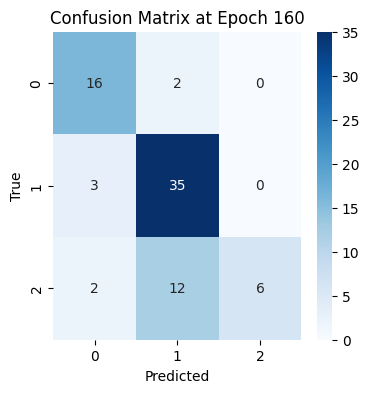

3/3 [==============================] - 0s 49ms/step
Epoch 165 Accuracy: 0.8947368421052632
              precision    recall  f1-score   support

      unripe       0.84      0.89      0.86        18
     perfect       0.88      0.97      0.93        38
    overripe       1.00      0.75      0.86        20

    accuracy                           0.89        76
   macro avg       0.91      0.87      0.88        76
weighted avg       0.90      0.89      0.89        76



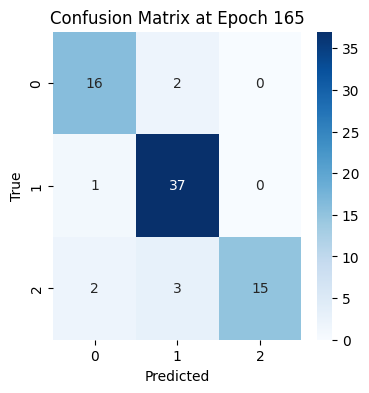

3/3 [==============================] - 0s 49ms/step
Epoch 170 Accuracy: 0.7105263157894737
              precision    recall  f1-score   support

      unripe       0.91      0.56      0.69        18
     perfect       0.64      1.00      0.78        38
    overripe       1.00      0.30      0.46        20

    accuracy                           0.71        76
   macro avg       0.85      0.62      0.64        76
weighted avg       0.80      0.71      0.68        76



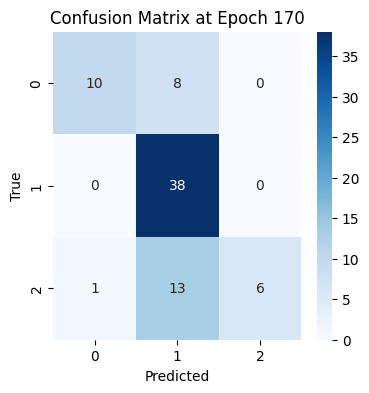

3/3 [==============================] - 0s 52ms/step
Epoch 175 Accuracy: 0.8421052631578947
              precision    recall  f1-score   support

      unripe       0.92      0.61      0.73        18
     perfect       0.82      0.95      0.88        38
    overripe       0.85      0.85      0.85        20

    accuracy                           0.84        76
   macro avg       0.86      0.80      0.82        76
weighted avg       0.85      0.84      0.84        76



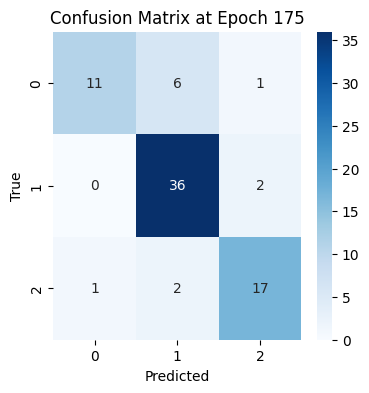

3/3 [==============================] - 0s 47ms/step
Epoch 180 Accuracy: 0.75
              precision    recall  f1-score   support

      unripe       0.80      0.22      0.35        18
     perfect       0.71      0.95      0.81        38
    overripe       0.85      0.85      0.85        20

    accuracy                           0.75        76
   macro avg       0.79      0.67      0.67        76
weighted avg       0.77      0.75      0.71        76



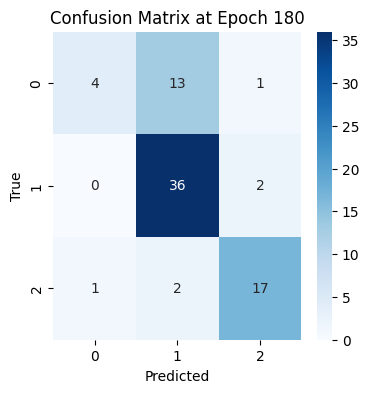

3/3 [==============================] - 0s 84ms/step
Epoch 185 Accuracy: 0.8026315789473685
              precision    recall  f1-score   support

      unripe       0.94      0.83      0.88        18
     perfect       0.73      1.00      0.84        38
    overripe       1.00      0.40      0.57        20

    accuracy                           0.80        76
   macro avg       0.89      0.74      0.77        76
weighted avg       0.85      0.80      0.78        76



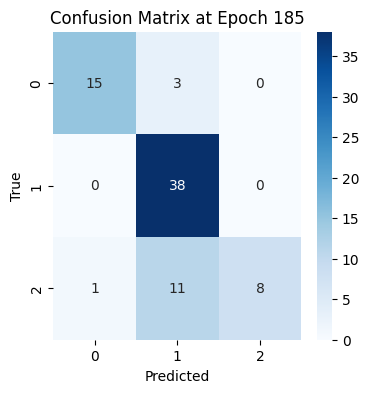

3/3 [==============================] - 0s 48ms/step
Epoch 190 Accuracy: 0.8552631578947368
              precision    recall  f1-score   support

      unripe       0.94      0.83      0.88        18
     perfect       0.79      1.00      0.88        38
    overripe       1.00      0.60      0.75        20

    accuracy                           0.86        76
   macro avg       0.91      0.81      0.84        76
weighted avg       0.88      0.86      0.85        76



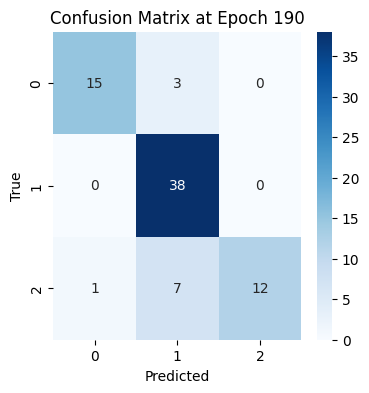

3/3 [==============================] - 0s 47ms/step
Epoch 195 Accuracy: 0.9078947368421053
              precision    recall  f1-score   support

      unripe       0.94      0.83      0.88        18
     perfect       0.86      1.00      0.93        38
    overripe       1.00      0.80      0.89        20

    accuracy                           0.91        76
   macro avg       0.93      0.88      0.90        76
weighted avg       0.92      0.91      0.91        76



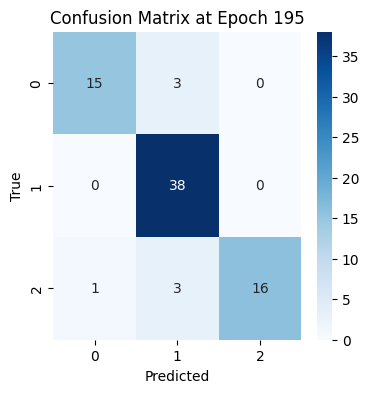

3/3 [==============================] - 0s 60ms/step
Epoch 200 Accuracy: 0.8947368421052632
              precision    recall  f1-score   support

      unripe       0.93      0.78      0.85        18
     perfect       0.84      1.00      0.92        38
    overripe       1.00      0.80      0.89        20

    accuracy                           0.89        76
   macro avg       0.93      0.86      0.88        76
weighted avg       0.91      0.89      0.89        76



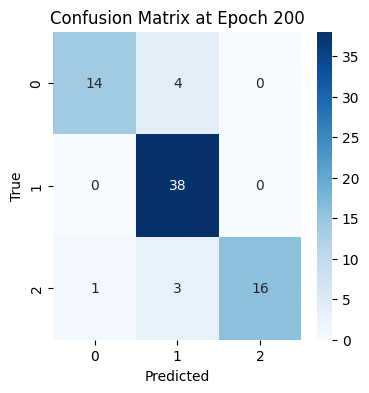

In [47]:
x, y = all_kiwi_nir_datagen.__getitem__(0)
y = y.numpy()
for i in range(5,201,5):
    kiwi_nir_model.load_weights(working_dir + 'KIWI_NIR_HS_CNN_checkpoints/HS_CNN' + str(i).zfill(4) + '.ckpt')
    y_pred = kiwi_nir_model.predict(x)
    y_pred = np.argmax(y_pred, axis=1)
    print(f"Epoch {i} Accuracy: {np.mean(y_pred == y)}")
    # print recall and precision and f1 score
    print(classification_report(y, y_pred, target_names=ripeness_state_dict.keys(), zero_division=0))
    # plot confusion matrix
    cm = confusion_matrix(y, y_pred)
    plt.figure(figsize=(4, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'Confusion Matrix at Epoch {i}')
    plt.show()

##### VIS

In [6]:
# get all rows where the camera type is VIS and the fruit is Kiwi
train_kiwi_VIS = train_df[(train_df['camera_type'] == 'VIS') & (train_df['fruit'] == 'Kiwi')]
val_kiwi_VIS = val_df[(val_df['camera_type'] == 'VIS') & (val_df['fruit'] == 'Kiwi')]
test_kiwi_VIS = test_df[(test_df['camera_type'] == 'VIS') & (test_df['fruit'] == 'Kiwi')]

In [7]:
train_kiwi_VIS.head()

,id,fruit,side,day,camera_type,header_file,data_file,record_id,init_weight,end_weight,storage_days,firmness,comment,ripeness_state,ripeness_state_fine,img_shape,ripeness_state_y,is_damaged
9,9,Kiwi,front,day_01,VIS,Kiwi/VIS/day_01/kiwi_day_01_03_front.hdr,Kiwi/VIS/day_01/kiwi_day_01_03_front.bin,9,120,120.0,0,900.0,NaN,perfect,ripe,"(218, 245, 224)",1,0
11,11,Kiwi,back,day_01,VIS,Kiwi/VIS/day_01/kiwi_day_01_03_back.hdr,Kiwi/VIS/day_01/kiwi_day_01_03_back.bin,11,120,120.0,0,900.0,NaN,perfect,ripe,"(210, 244, 224)",1,0
13,13,Kiwi,front,day_01,VIS,Kiwi/VIS/day_01/kiwi_day_01_28_front.hdr,Kiwi/VIS/day_01/kiwi_day_01_28_front.bin,13,114,114.0,0,900.0,NaN,perfect,ripe,"(224, 234, 224)",1,0
15,15,Kiwi,back,day_01,VIS,Kiwi/VIS/day_01/kiwi_day_01_28_back.hdr,Kiwi/VIS/day_01/kiwi_day_01_28_back.bin,15,114,114.0,0,900.0,NaN,perfect,ripe,"(225, 233, 224)",1,0
25,25,Kiwi,front,day_02,VIS,Kiwi/VIS/day_02/kiwi_day_02_10_front.hdr,Kiwi/VIS/day_02/kiwi_day_02_10_front.bin,25,121,120.0,1,1150.0,NaN,perfect,ripe,"(220, 236, 224)",1,0


In [8]:
val_kiwi_VIS["ripeness_state_y"].value_counts()

ripeness_state_y
1    8
0    8
2    8
Name: count, dtype: int64

In [9]:
len(train_kiwi_VIS), len(val_kiwi_VIS), len(test_kiwi_VIS)

(138, 24, 24)

Create Image Data Generator and create callback for model checkpointing.

In [23]:
train_kiwi_VIS_datagen = HSI_datagen(train_kiwi_VIS, 'header_file', 'data_file', {'name': 'ripeness_state_y', 'type': int}, batch_size=9, target_size=(64, 64), data_dir=data_dir,
                            shuffle=True, normalize=False, augment= True, augmentConfig=augConfig, balance=True)
#
val_kiwi_VIS_datagen = HSI_datagen(val_kiwi_VIS,'header_file', 'data_file', {'name': 'ripeness_state_y', 'type': int}, batch_size=9, target_size=(64, 64), data_dir=data_dir,
                            shuffle=True, normalize=False, balance=True, augmentConfig=augConfig)
#
kiwi_vis_cb = ModelCheckpoint(filepath = working_dir + 'KIWI_VIS_HS_CNN_checkpoints/HS_CNN{epoch:04d}.ckpt', verbose=1, save_freq='epoch', period=5, save_weights_only=True)

finally train the model

In [13]:
kiwi_vis_model = build_HSI_CNN((64, 64, 224))

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 depthwise_conv2d (Depthwise  (None, 64, 64, 672)      6048      
 Conv2D)                                                         
                                                                 
 conv2d (Conv2D)             (None, 64, 64, 25)        16825     
                                                                 
 re_lu (ReLU)                (None, 64, 64, 25)        0         
                                                                 
 average_pooling2d (AverageP  (None, 16, 16, 25)       0         
 ooling2D)                                                       
                                                                 
 batch_normalization (BatchN  (None, 16, 16, 25)       100       
 ormalization)                                                   
                                                        

In [24]:
# fit
kiwi_vis_model.fit(train_kiwi_VIS_datagen, epochs=100, validation_data=val_kiwi_VIS_datagen, callbacks=[kiwi_vis_cb])

Epoch 1/100
15/15 [==============================] - 244s 16s/step - loss: 0.6902 - accuracy: 0.6889 - val_loss: 1.8171 - val_accuracy: 0.5556
Epoch 2/100
15/15 [==============================] - 231s 16s/step - loss: 0.6914 - accuracy: 0.6815 - val_loss: 1.9246 - val_accuracy: 0.3889
Epoch 3/100
15/15 [==============================] - 234s 16s/step - loss: 0.6941 - accuracy: 0.6889 - val_loss: 3.8811 - val_accuracy: 0.3333
Epoch 4/100
15/15 [==============================] - 242s 16s/step - loss: 0.6564 - accuracy: 0.6889 - val_loss: 0.7376 - val_accuracy: 0.5000
Epoch 5/100
15/15 [==============================] - ETA: 0s - loss: 0.6789 - accuracy: 0.7185 
Epoch 5: saving model to C:/Users/aabde/OneDrive - Heriot-Watt University/Bsc Computer Science/Stage 4/Implementation/KIWI_VIS_HS_CNN_checkpoints\HS_CNN0005.ckpt
15/15 [==============================] - 243s 17s/step - loss: 0.6789 - accuracy: 0.7185 - val_loss: 1.3351 - val_accuracy: 0.6111
Epoch 6/100
15/15 [====================

In [ ]:
# load latest model weights  
kiwi_vis_model.load_weights(working_dir + 'KIWI_VIS_HS_CNN_checkpoints/HS_CNN0100.ckpt')

performance evaluation of the vis model

In [20]:
# recall the ripeness state dictionary
ripeness_state_dict

{'unripe': 0, 'perfect': 1, 'overripe': 2}

In [46]:
test_kiwi_VIS_datagen = HSI_datagen(test_kiwi_VIS, 'header_file', 'data_file', {'name': 'ripeness_state_y', 'type': int}, batch_size=24, target_size=(64, 64), data_dir=data_dir,
                            shuffle=True, normalize=False, augment= False, augmentConfig=augConfig, balance=False)

1/1 [==============================] - 0s 86ms/step
Epoch 5 Accuracy: 0.5
              precision    recall  f1-score   support

      unripe       0.57      0.50      0.53         8
     perfect       0.00      0.00      0.00         8
    overripe       0.50      1.00      0.67         8

    accuracy                           0.50        24
   macro avg       0.36      0.50      0.40        24
weighted avg       0.36      0.50      0.40        24



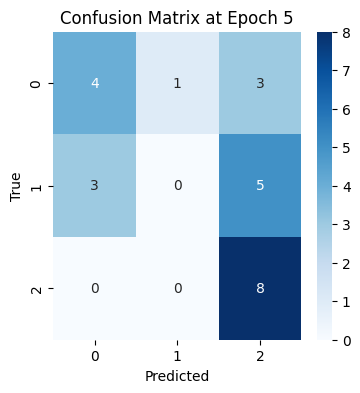

1/1 [==============================] - 0s 115ms/step
Epoch 10 Accuracy: 0.375
              precision    recall  f1-score   support

      unripe       0.50      0.25      0.33         8
     perfect       0.32      0.75      0.44         8
    overripe       1.00      0.12      0.22         8

    accuracy                           0.38        24
   macro avg       0.61      0.38      0.33        24
weighted avg       0.61      0.38      0.33        24



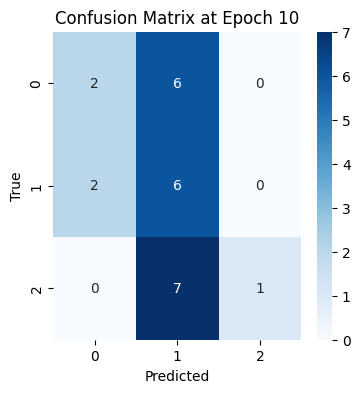

1/1 [==============================] - 0s 71ms/step
Epoch 15 Accuracy: 0.4166666666666667
              precision    recall  f1-score   support

      unripe       0.40      0.50      0.44         8
     perfect       0.38      0.62      0.48         8
    overripe       1.00      0.12      0.22         8

    accuracy                           0.42        24
   macro avg       0.59      0.42      0.38        24
weighted avg       0.59      0.42      0.38        24



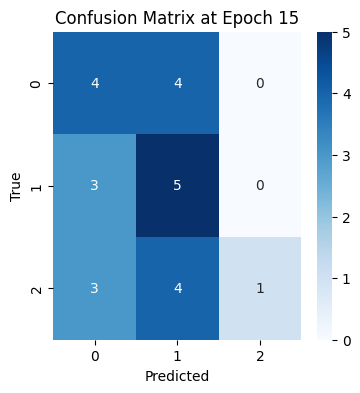

1/1 [==============================] - 0s 108ms/step
Epoch 20 Accuracy: 0.4166666666666667
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         8
     perfect       1.00      0.25      0.40         8
    overripe       0.36      1.00      0.53         8

    accuracy                           0.42        24
   macro avg       0.45      0.42      0.31        24
weighted avg       0.45      0.42      0.31        24



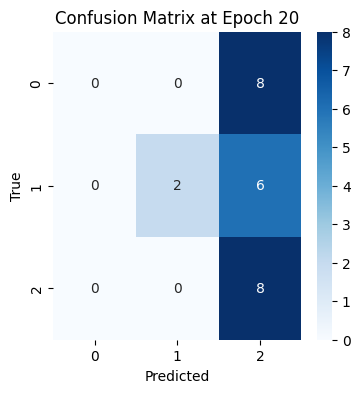

1/1 [==============================] - 0s 112ms/step
Epoch 25 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         8
     perfect       0.29      0.62      0.40         8
    overripe       0.50      0.38      0.43         8

    accuracy                           0.33        24
   macro avg       0.26      0.33      0.28        24
weighted avg       0.26      0.33      0.28        24



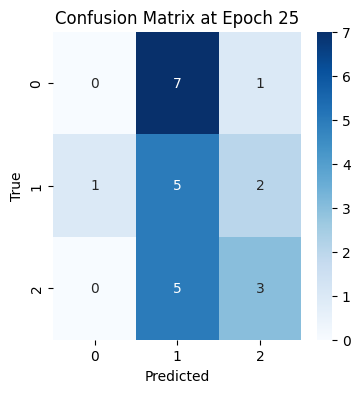

1/1 [==============================] - 0s 68ms/step
Epoch 30 Accuracy: 0.2916666666666667
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         8
     perfect       0.29      0.75      0.41         8
    overripe       0.33      0.12      0.18         8

    accuracy                           0.29        24
   macro avg       0.21      0.29      0.20        24
weighted avg       0.21      0.29      0.20        24



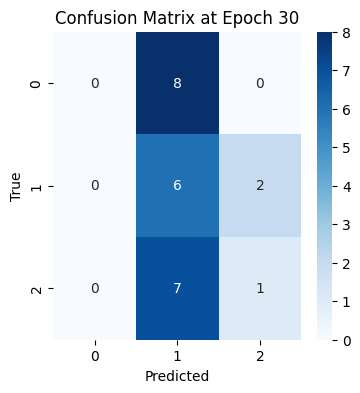

1/1 [==============================] - 0s 70ms/step
Epoch 35 Accuracy: 0.4166666666666667
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         8
     perfect       0.67      0.25      0.36         8
    overripe       0.38      1.00      0.55         8

    accuracy                           0.42        24
   macro avg       0.35      0.42      0.31        24
weighted avg       0.35      0.42      0.31        24



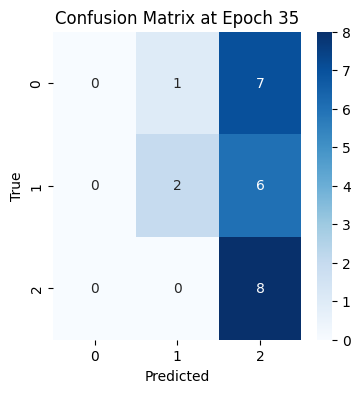

1/1 [==============================] - 0s 70ms/step
Epoch 40 Accuracy: 0.375
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         8
     perfect       0.14      0.12      0.13         8
    overripe       0.00      0.00      0.00         8

    accuracy                           0.38        24
   macro avg       0.21      0.38      0.27        24
weighted avg       0.21      0.38      0.27        24



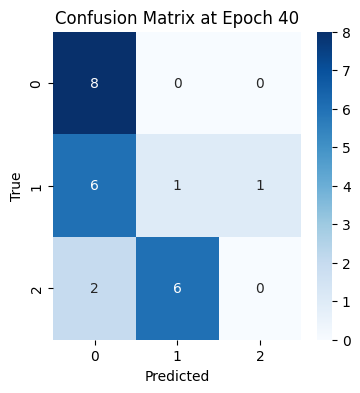

1/1 [==============================] - 0s 83ms/step
Epoch 45 Accuracy: 0.4166666666666667
              precision    recall  f1-score   support

      unripe       0.62      0.62      0.62         8
     perfect       0.31      0.62      0.42         8
    overripe       0.00      0.00      0.00         8

    accuracy                           0.42        24
   macro avg       0.31      0.42      0.35        24
weighted avg       0.31      0.42      0.35        24



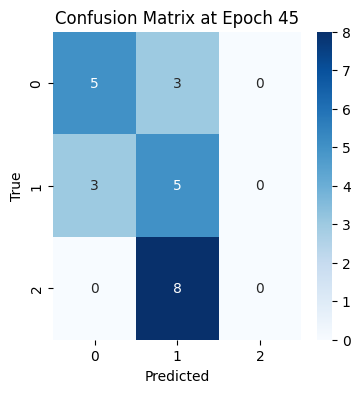

1/1 [==============================] - 0s 72ms/step
Epoch 50 Accuracy: 0.5416666666666666
              precision    recall  f1-score   support

      unripe       0.50      0.12      0.20         8
     perfect       0.40      0.75      0.52         8
    overripe       0.86      0.75      0.80         8

    accuracy                           0.54        24
   macro avg       0.59      0.54      0.51        24
weighted avg       0.59      0.54      0.51        24



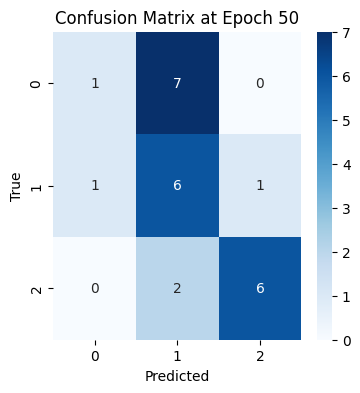

1/1 [==============================] - 0s 147ms/step
Epoch 55 Accuracy: 0.5416666666666666
              precision    recall  f1-score   support

      unripe       0.60      0.38      0.46         8
     perfect       0.50      0.38      0.43         8
    overripe       0.54      0.88      0.67         8

    accuracy                           0.54        24
   macro avg       0.55      0.54      0.52        24
weighted avg       0.55      0.54      0.52        24



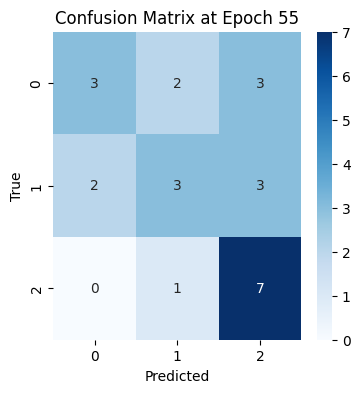

1/1 [==============================] - 0s 77ms/step
Epoch 60 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.50      0.25      0.33         8
     perfect       0.30      0.75      0.43         8
    overripe       0.00      0.00      0.00         8

    accuracy                           0.33        24
   macro avg       0.27      0.33      0.25        24
weighted avg       0.27      0.33      0.25        24



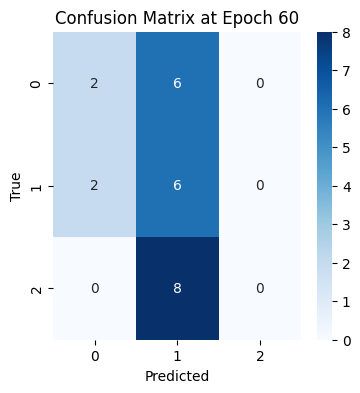

1/1 [==============================] - 0s 87ms/step
Epoch 65 Accuracy: 0.5
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         8
     perfect       0.50      0.62      0.56         8
    overripe       0.50      0.88      0.64         8

    accuracy                           0.50        24
   macro avg       0.33      0.50      0.40        24
weighted avg       0.33      0.50      0.40        24



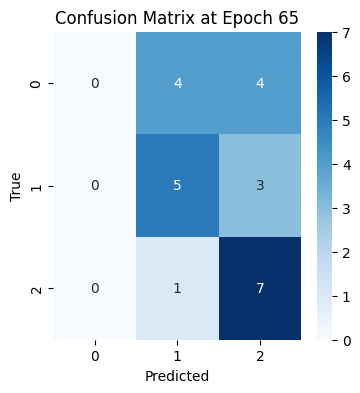

1/1 [==============================] - 0s 83ms/step
Epoch 70 Accuracy: 0.375
              precision    recall  f1-score   support

      unripe       0.50      0.25      0.33         8
     perfect       0.35      0.88      0.50         8
    overripe       0.00      0.00      0.00         8

    accuracy                           0.38        24
   macro avg       0.28      0.38      0.28        24
weighted avg       0.28      0.38      0.28        24



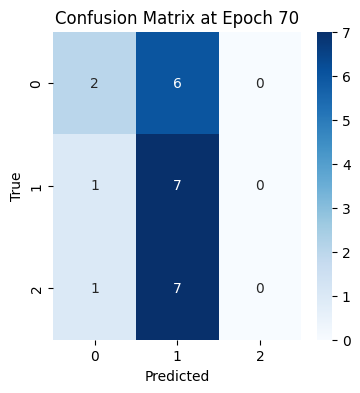

1/1 [==============================] - 0s 75ms/step
Epoch 75 Accuracy: 0.375
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         8
     perfect       1.00      0.12      0.22         8
    overripe       0.35      1.00      0.52         8

    accuracy                           0.38        24
   macro avg       0.45      0.38      0.25        24
weighted avg       0.45      0.38      0.25        24



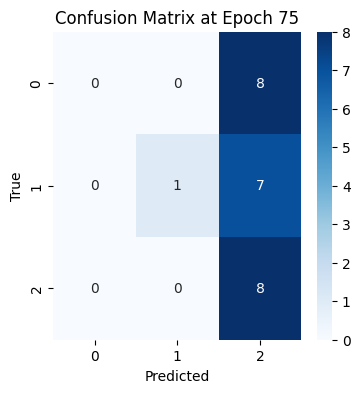

1/1 [==============================] - 0s 86ms/step
Epoch 80 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         8
     perfect       0.33      1.00      0.50         8
    overripe       0.00      0.00      0.00         8

    accuracy                           0.33        24
   macro avg       0.11      0.33      0.17        24
weighted avg       0.11      0.33      0.17        24



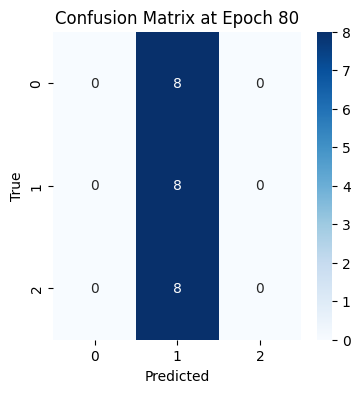

1/1 [==============================] - 0s 82ms/step
Epoch 85 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         8
     perfect       0.00      0.00      0.00         8
    overripe       0.33      1.00      0.50         8

    accuracy                           0.33        24
   macro avg       0.11      0.33      0.17        24
weighted avg       0.11      0.33      0.17        24



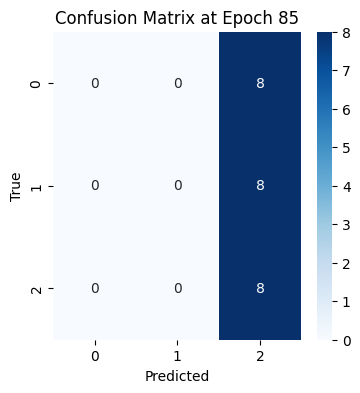

1/1 [==============================] - 0s 73ms/step
Epoch 90 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         8
     perfect       0.00      0.00      0.00         8
    overripe       0.33      1.00      0.50         8

    accuracy                           0.33        24
   macro avg       0.11      0.33      0.17        24
weighted avg       0.11      0.33      0.17        24



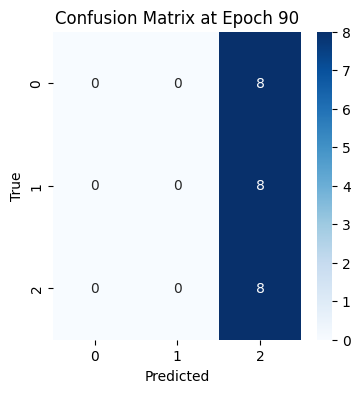

1/1 [==============================] - 0s 72ms/step
Epoch 95 Accuracy: 0.4583333333333333
              precision    recall  f1-score   support

      unripe       0.50      0.12      0.20         8
     perfect       0.37      0.88      0.52         8
    overripe       1.00      0.38      0.55         8

    accuracy                           0.46        24
   macro avg       0.62      0.46      0.42        24
weighted avg       0.62      0.46      0.42        24



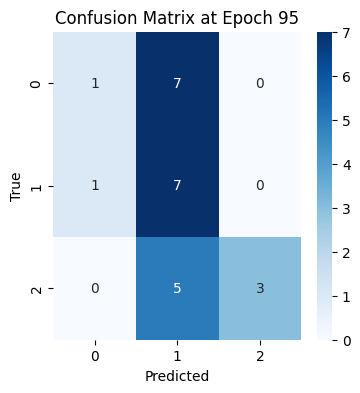

1/1 [==============================] - 0s 72ms/step
Epoch 100 Accuracy: 0.2916666666666667
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         8
     perfect       0.29      0.50      0.36         8
    overripe       0.30      0.38      0.33         8

    accuracy                           0.29        24
   macro avg       0.20      0.29      0.23        24
weighted avg       0.20      0.29      0.23        24



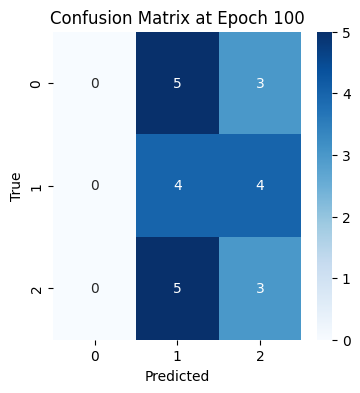

In [47]:
x, y = test_kiwi_VIS_datagen.__getitem__(0)
y = y.numpy()

for i in range(5,101,5): 
    kiwi_vis_model.load_weights(working_dir + 'KIWI_VIS_HS_CNN_checkpoints/HS_CNN' + str(i).zfill(4) + '.ckpt')
    y_pred = kiwi_vis_model.predict(x)
    y_pred = np.argmax(y_pred, axis=1)
    print(f"Epoch {i} Accuracy: {np.mean(y_pred == y)}")
    # print recall and precision and f1 score 
    print(classification_report(y, y_pred, target_names=ripeness_state_dict.keys(), zero_division=0))
    # plot confusion matrix 
    cm = confusion_matrix(y, y_pred)
    plt.figure(figsize=(4, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'Confusion Matrix at Epoch {i}')
    plt.show()

### Firmness Prediction (by Regression)

In [ ]:
# the architecture of the model is to be altered in the final layer to allow regression 

def build_HSI_CNN_forRegression(input_shape):
    # Depthwise Convolution Block 1
    HS_CNN = Sequential()
    HS_CNN.add(DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same', use_bias=False, input_shape=input_shape, depth_multiplier=3))  # depth_multiplier to expand channels
    HS_CNN.add(Conv2D(25, kernel_size=(1, 1), strides=(1, 1), use_bias=True))
    HS_CNN.add(ReLU())
    HS_CNN.add(AveragePooling2D(pool_size=(4, 4), strides=(4, 4)))
    HS_CNN.add(BatchNormalization())
        
    # Depthwise Convolution Block 2
    HS_CNN.add(DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same', use_bias=False, depth_multiplier=3))  # depth_multiplier to expand channels
    HS_CNN.add(Conv2D(30, kernel_size=(1, 1), strides=(1, 1), use_bias=True))
    HS_CNN.add(ReLU())
    HS_CNN.add(AveragePooling2D(pool_size=(4, 4), strides=(4, 4)))
    HS_CNN.add(BatchNormalization())
        
    # Depthwise Convolution Block 3
    HS_CNN.add(DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same', use_bias=False, depth_multiplier=3))  # depth_multiplier to expand channels
    HS_CNN.add(Conv2D(50, kernel_size=(1, 1), strides=(1, 1), use_bias=True))
    HS_CNN.add(ReLU())
    HS_CNN.add(BatchNormalization())
    HS_CNN.add(GlobalAveragePooling2D())
        
    HS_CNN.add(Activation('sigmoid'))
        
    # Fully Connected Layer
    HS_CNN.add(BatchNormalization())
    HS_CNN.add(Dense(50, use_bias=True))
    HS_CNN.add(ReLU())
    
    #
    HS_CNN.summary()
    return HS_CNN

### Anomaly Detection

In [18]:
def build_HSI_CNN_forAD(input_shape): 
    # Depthwise Convolution Block 1
    HS_CNN = Sequential()
    HS_CNN.add(DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same', use_bias=False, input_shape=input_shape, depth_multiplier=3))  # depth_multiplier to expand channels
    HS_CNN.add(Conv2D(25, kernel_size=(1, 1), strides=(1, 1), use_bias=True))
    HS_CNN.add(ReLU())
    HS_CNN.add(AveragePooling2D(pool_size=(4, 4), strides=(4, 4)))
    HS_CNN.add(BatchNormalization())
        
    # Depthwise Convolution Block 2
    HS_CNN.add(DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same', use_bias=False, depth_multiplier=3))  # depth_multiplier to expand channels
    HS_CNN.add(Conv2D(30, kernel_size=(1, 1), strides=(1, 1), use_bias=True))
    HS_CNN.add(ReLU())
    HS_CNN.add(AveragePooling2D(pool_size=(4, 4), strides=(4, 4)))
    HS_CNN.add(BatchNormalization())
        
    # Depthwise Convolution Block 3
    HS_CNN.add(DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same', use_bias=False, depth_multiplier=3))  # depth_multiplier to expand channels
    HS_CNN.add(Conv2D(50, kernel_size=(1, 1), strides=(1, 1), use_bias=True))
    HS_CNN.add(ReLU())
    HS_CNN.add(BatchNormalization())
    HS_CNN.add(GlobalAveragePooling2D())
        
    HS_CNN.add(Activation('sigmoid'))
        
    # Fully Connected Layer
    HS_CNN.add(BatchNormalization())
    HS_CNN.add(Dense(50, use_bias=True))
    HS_CNN.add(ReLU())
    HS_CNN.add(Dense(1, use_bias=True))
    HS_CNN.add(Activation('sigmoid'))

    HS_CNN.compile(optimizer=AdaBound(learning_rate=1e-2), loss='binary_crossentropy', metrics=['accuracy'])
    #
    HS_CNN.summary()
    return HS_CNN

#### Avocado Subset (NIR and VIS)

#### Kiwi Subset (NIR and VIS)

In [28]:
# filter out the data to get only the rows where the camera type is NIR and the fruit is Kiwi and is_damaged is 0 
train_kiwi_NIR_no_damage = train_kiwi_NIR[(train_kiwi_NIR['is_damaged'] == 0)]
train_kiwi_NIR_damage = train_kiwi_NIR[(train_kiwi_NIR['is_damaged'] == 1)]

In [27]:
len(train_kiwi_NIR_no_damage), len(train_kiwi_NIR_damage)

(54, 4)

In [20]:
AD_augConfig = augConfig = {"keep_original": False, "horizontal_flip": False, "vertical_flip" : True,"rotation_range": 90, "noise":{"type":"poisson","level":0} }

In [33]:
# create a datagen object for the kiwi NIR data
train_kiwi_NIR_no_damage_datagen = HSI_datagen(train_kiwi_NIR_no_damage, 'header_file', 'data_file', {'name': 'is_damaged', 'type': int}, batch_size=12, target_size=(64, 64), data_dir=data_dir,
                            shuffle=True, normalize=False, augment= True, augmentConfig=AD_augConfig, balance=False)

# 
val_kiwi_NIR_damage_datagen = HSI_datagen(train_kiwi_NIR_damage, 'header_file', 'data_file', {'name': 'is_damaged', 'type': int}, batch_size=4, target_size=(64, 64), data_dir=data_dir,
                            shuffle=True, normalize=False, augment= False, augmentConfig=AD_augConfig, balance=False)

In [34]:
kiwi_nir_AD_cb = ModelCheckpoint(filepath = working_dir + 'KIWI_NIR_AD_HS_CNN_checkpoints/HS_CNN{epoch:04d}.ckpt', verbose=1, save_freq='epoch', period=5, save_weights_only=True)

kiwi_nir_AD_model = build_HSI_CNN_forAD((64, 64, 252))

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 depthwise_conv2d_6 (Depthwi  (None, 64, 64, 756)      6804      
 seConv2D)                                                       
                                                                 
 conv2d_6 (Conv2D)           (None, 64, 64, 25)        18925     
                                                                 
 re_lu_8 (ReLU)              (None, 64, 64, 25)        0         
                                                                 
 average_pooling2d_4 (Averag  (None, 16, 16, 25)       0         
 ePooling2D)                                                     
                                                                 
 batch_normalization_8 (Batc  (None, 16, 16, 25)       100       
 hNormalization)                                                 
                                                      

In [35]:
kiwi_nir_AD_model.fit(train_kiwi_NIR_no_damage_datagen, epochs=150, validation_data=val_kiwi_NIR_damage_datagen, callbacks=[kiwi_nir_AD_cb], use_multiprocessing=True)

Epoch 1/150
4/4 [==============================] - 56s 7s/step - loss: 0.3048 - accuracy: 0.9167 - val_loss: 1.6807 - val_accuracy: 0.0000e+00
Epoch 2/150
4/4 [==============================] - 66s 16s/step - loss: 0.0421 - accuracy: 1.0000 - val_loss: 2.3130 - val_accuracy: 0.0000e+00
Epoch 3/150
4/4 [==============================] - 60s 15s/step - loss: 0.0193 - accuracy: 1.0000 - val_loss: 3.0235 - val_accuracy: 0.0000e+00
Epoch 4/150
4/4 [==============================] - 58s 14s/step - loss: 0.0051 - accuracy: 1.0000 - val_loss: 3.7388 - val_accuracy: 0.0000e+00
Epoch 5/150
4/4 [==============================] - ETA: 0s - loss: 0.0018 - accuracy: 1.0000   
Epoch 5: saving model to C:/Users/aabde/OneDrive - Heriot-Watt University/Bsc Computer Science/Stage 4/Implementation/KIWI_NIR_AD_HS_CNN_checkpoints\HS_CNN0005.ckpt
4/4 [==============================] - 61s 13s/step - loss: 0.0018 - accuracy: 1.0000 - val_loss: 4.4292 - val_accuracy: 0.0000e+00
Epoch 6/150
4/4 [===============

## My Models

### MSDCNN1

Approach 1 : Resizing the input image to different dimensions and passing them through a series of Depthwise convoluional layers which later merges into a shared dense layer which is then propagated to an output layer.
The hidden layers of the model are the same as the HS_CNN model.    

In [4]:
# multi scale depth wise convolutional neural network
def build_MSDCNN1(input_shape):
    input_layer = Input(shape=input_shape)

    # original scale pathway
    a = DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same', use_bias=False, depth_multiplier=3)(input_layer)
    a = Conv2D(25, kernel_size=(1, 1), strides=(1, 1), use_bias=True)(a)
    a = ReLU()(a)
    a = AveragePooling2D(pool_size=(4, 4), strides=(4, 4))(a)
    a = BatchNormalization()(a) 
    # Depthwise Convolution Block 2
    a = DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same', use_bias=False, depth_multiplier=3)(a)  # depth_multiplier to expand channels
    a = Conv2D(30, kernel_size=(1, 1), strides=(1, 1), use_bias=True)(a)
    a = ReLU()(a)
    a = AveragePooling2D(pool_size=(4, 4), strides=(4, 4))(a)
    a = BatchNormalization()(a)
    # Depthwise Convolution Block 3
    a = DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same', use_bias=False, depth_multiplier=3)(a) # depth_multiplier to expand channels
    a = Conv2D(50, kernel_size=(1, 1), strides=(1, 1), use_bias=True)(a)
    a = ReLU()(a)
    a = BatchNormalization()(a)
    a = GlobalAveragePooling2D()(a)

    # double scale pathway 
    def resize_double(input_img):
        return resize_images(input_img, height_factor=2, width_factor=2, data_format='channels_last')
    b = Lambda(resize_double)(input_layer)
    b = DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same', use_bias=False, depth_multiplier=3)(b)
    b = Conv2D(25, kernel_size=(1, 1), strides=(1, 1), use_bias=True)(b)
    b = ReLU()(b)
    b = AveragePooling2D(pool_size=(4, 4), strides=(4, 4))(b)
    b = BatchNormalization()(b)
    # Depthwise Convolution Block 2
    b = DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same', use_bias=False, depth_multiplier=3)(b)  # depth_multiplier to expand channels
    b = Conv2D(30, kernel_size=(1, 1), strides=(1, 1), use_bias=True)(b)
    b = ReLU()(b)
    b = AveragePooling2D(pool_size=(4, 4), strides=(4, 4))(b)
    b = BatchNormalization()(b)
    # Depthwise Convolution Block 3
    b = DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same', use_bias=False, depth_multiplier=3)(b)  # depth_multiplier to expand channels
    b = Conv2D(50, kernel_size=(1, 1), strides=(1, 1), use_bias=True)(b)
    b = ReLU()(b)
    b = BatchNormalization()(b)
    b = GlobalAveragePooling2D()(b)

    # half scale pathway 
    def resize_half(input_img):
        # return resize_images(input_img, height_factor=0.5, width_factor=0.5, data_format='channels_last')
        # get image shape 
        shape = input_img.shape
        x = shape[1]//2 
        y = shape[2]//2 
        return tf.image.resize(input_img, (x,y))
    c = Lambda(resize_half)(input_layer)
    c = DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same', use_bias=False, depth_multiplier=3)(c)
    c = Conv2D(25, kernel_size=(1, 1), strides=(1, 1), use_bias=True)(c)
    c = ReLU()(c)
    c = AveragePooling2D(pool_size=(4, 4), strides=(4, 4))(c)
    c = BatchNormalization()(c)
    # Depthwise Convolution Block 2
    c = DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same', use_bias=False, depth_multiplier=3)(c)  # depth_multiplier to expand channels
    c = Conv2D(30, kernel_size=(1, 1), strides=(1, 1), use_bias=True)(c)
    c = ReLU()(c)
    c = AveragePooling2D(pool_size=(4, 4), strides=(4, 4))(c)
    c = BatchNormalization()(c)
    # Depthwise Convolution Block 3
    c = DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same', use_bias=False, depth_multiplier=3)(c)  # depth_multiplier to expand channels
    c = Conv2D(50, kernel_size=(1, 1), strides=(1, 1), use_bias=True)(c)
    c = ReLU()(c)
    c = BatchNormalization()(c)
    c = GlobalAveragePooling2D()(c)

    # concatenate the three pathways
    x = concatenate([a, b, c])
    x = Activation('sigmoid')(x)
    x = BatchNormalization()(x)
    x = Dense(150, use_bias=True)(x)
    x = ReLU()(x)
    x = Dense(3, use_bias=True)(x)
    x = Activation('sigmoid')(x)
    
    model = keras.Model(inputs=input_layer, outputs=x)
    model.compile(optimizer=Adam(learning_rate=1e-2, beta_1=0.5), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

In [6]:
MSDCNN1 = build_MSDCNN1((64, 64, 252))
MSDCNN1.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 64, 64, 252  0           []                               
                                )]                                                                
                                                                                                  
 lambda (Lambda)                (None, 128, 128, 25  0           ['input_1[0][0]']                
                                2)                                                                
                                                                                                  
 lambda_1 (Lambda)              (None, 32, 32, 252)  0           ['input_1[0][0]']                
                                                                                              

#### Avocado Subset (NIR and VIS)

#### Kiwi Subset (NIR and VIS)

In [27]:
kiwi_nir_msdcnn_cb = ModelCheckpoint(filepath = working_dir + 'KIWI_NIR_MSDCNN1_checkpoints/MSDCNN1{epoch:04d}.ckpt', verbose=1, save_freq='epoch', period=5, save_weights_only=True)

In [28]:
kiwi_nir_msdcnn1 = build_MSDCNN1((64, 64, 252))

In [29]:
kiwi_nir_msdcnn1.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 64, 64, 252  0           []                               
                                )]                                                                
                                                                                                  
 lambda_2 (Lambda)              (None, 128, 128, 25  0           ['input_2[0][0]']                
                                2)                                                                
                                                                                                  
 lambda_3 (Lambda)              (None, 32, 32, 252)  0           ['input_2[0][0]']                
                                                                                            

In [30]:
kiwi_nir_msdcnn1.fit(train_kiwi_NIR_datagen, epochs=150, validation_data=val_kiwi_NIR_datagen, callbacks=[kiwi_nir_msdcnn_cb], use_multiprocessing=True)

unique classes: [1 0 2]
class 1 was over the max count of 3 samples, 6 samples were found
class 0 was under the max count of 3 samples, 1 samples were found
class 2 was under the max count of 3 samples, 2 samples were found
Epoch 1/150
6/6 [==============================] - ETA: 0s - loss: 1.2576 - accuracy: 0.5556unique classes: [2 0 1]
class 2 is already balanced
class 0 is already balanced
class 1 is already balanced
6/6 [==============================] - 103s 14s/step - loss: 1.2576 - accuracy: 0.5556 - val_loss: 1.3170 - val_accuracy: 0.3333
Epoch 2/150
6/6 [==============================] - 81s 11s/step - loss: 1.3087 - accuracy: 0.5926 - val_loss: 1.1654 - val_accuracy: 0.3333
Epoch 3/150
6/6 [==============================] - 85s 13s/step - loss: 0.6597 - accuracy: 0.7593 - val_loss: 1.0969 - val_accuracy: 0.3333
Epoch 4/150
6/6 [==============================] - 68s 10s/step - loss: 1.0491 - accuracy: 0.6111 - val_loss: 1.1201 - val_accuracy: 0.3333
Epoch 5/150
6/6 [==========

evaluate the model on test dataset

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 76ms/step
Epoch 5 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.33      1.00      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



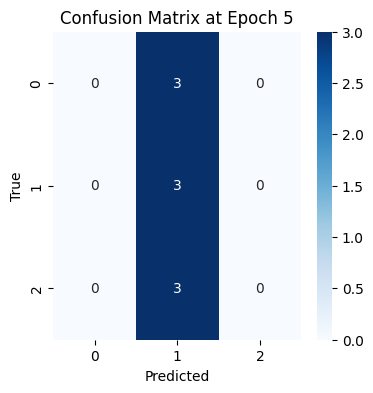

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 67ms/step
Epoch 10 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.33      1.00      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



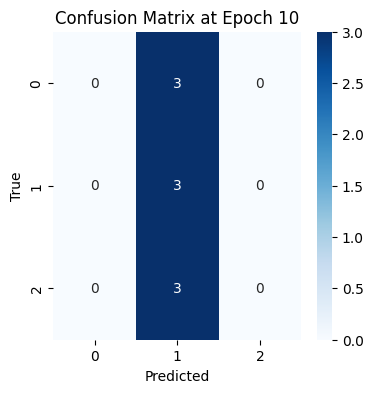

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 81ms/step
Epoch 15 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.33      1.00      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



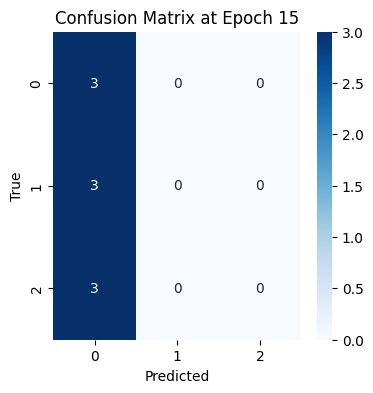

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 55ms/step
Epoch 20 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.33      1.00      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



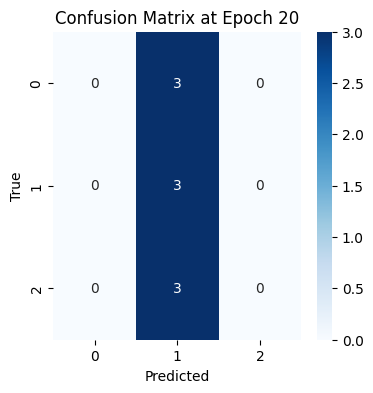

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 46ms/step
Epoch 25 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.38      1.00      0.55         3
     perfect       1.00      0.33      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.46      0.44      0.35         9
weighted avg       0.46      0.44      0.35         9



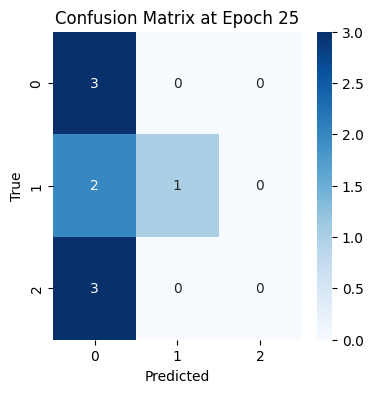

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 62ms/step
Epoch 30 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.43      1.00      0.60         3
     perfect       0.50      0.33      0.40         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.31      0.44      0.33         9
weighted avg       0.31      0.44      0.33         9



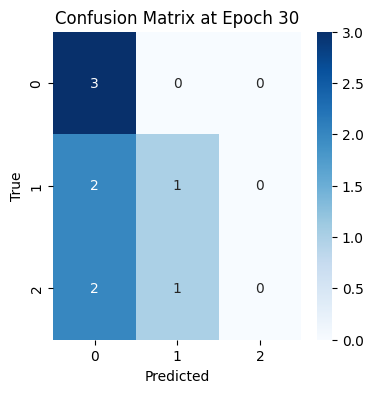

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 54ms/step
Epoch 35 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.38      1.00      0.55         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.12      0.33      0.18         9
weighted avg       0.12      0.33      0.18         9



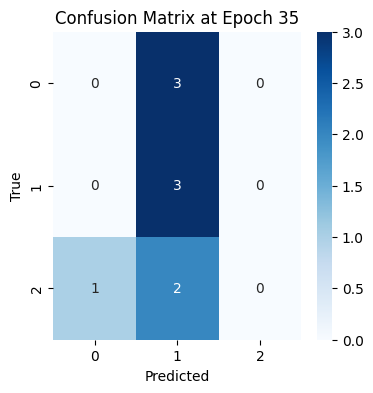

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 51ms/step
Epoch 40 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.33      1.00      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



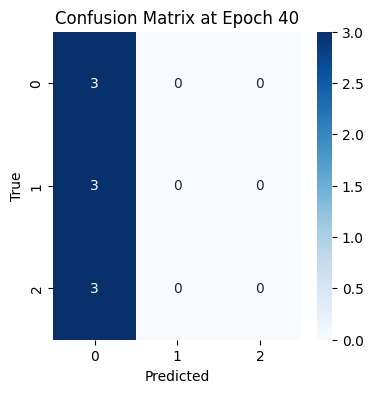

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 56ms/step
Epoch 45 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.38      1.00      0.55         3
     perfect       0.00      0.00      0.00         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.12      0.33      0.18         9
weighted avg       0.12      0.33      0.18         9



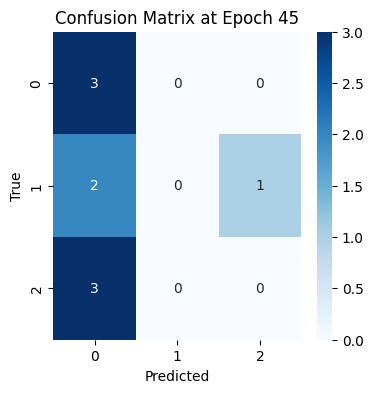

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 47ms/step
Epoch 50 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.50      0.67      0.57         3
     perfect       0.00      0.00      0.00         3
    overripe       0.20      0.33      0.25         3

    accuracy                           0.33         9
   macro avg       0.23      0.33      0.27         9
weighted avg       0.23      0.33      0.27         9



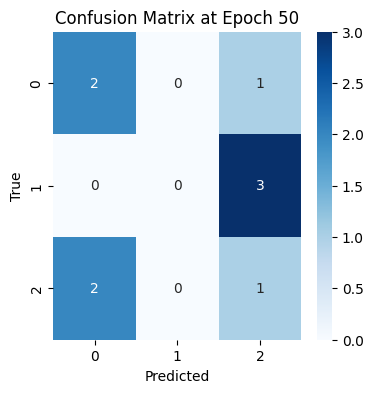

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 51ms/step
Epoch 55 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.33      1.00      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



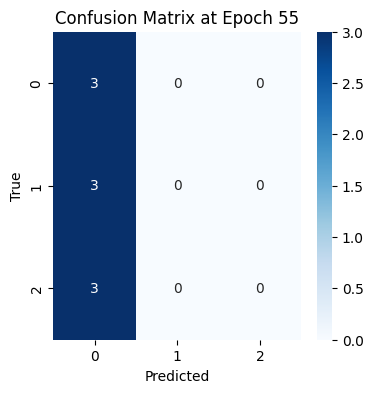

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 56ms/step
Epoch 60 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.33      1.00      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



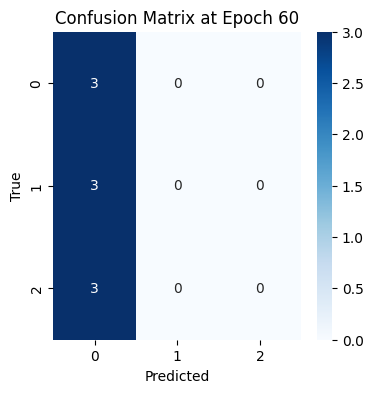

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 48ms/step
Epoch 65 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.50      0.67      0.57         3
     perfect       0.00      0.00      0.00         3
    overripe       0.20      0.33      0.25         3

    accuracy                           0.33         9
   macro avg       0.23      0.33      0.27         9
weighted avg       0.23      0.33      0.27         9



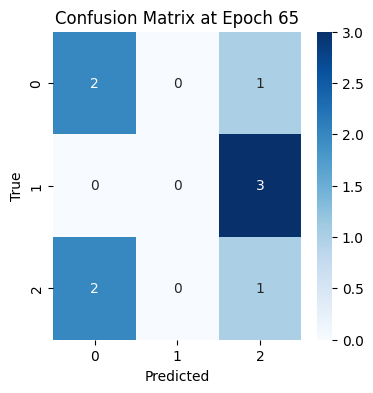

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 48ms/step
Epoch 70 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.33      1.00      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



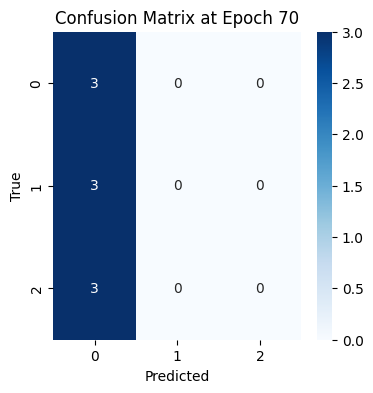

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 47ms/step
Epoch 75 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.40      0.67      0.50         3
     perfect       0.67      0.67      0.67         3
    overripe       1.00      0.33      0.50         3

    accuracy                           0.56         9
   macro avg       0.69      0.56      0.56         9
weighted avg       0.69      0.56      0.56         9



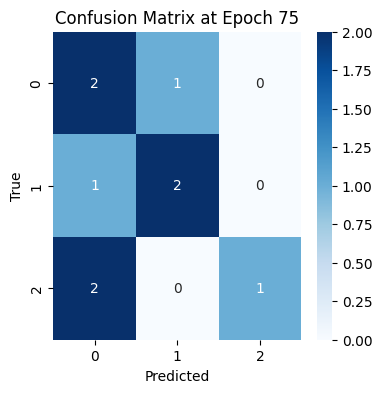

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 48ms/step
Epoch 80 Accuracy: 0.2222222222222222
              precision    recall  f1-score   support

      unripe       0.50      0.33      0.40         3
     perfect       0.00      0.00      0.00         3
    overripe       0.20      0.33      0.25         3

    accuracy                           0.22         9
   macro avg       0.23      0.22      0.22         9
weighted avg       0.23      0.22      0.22         9



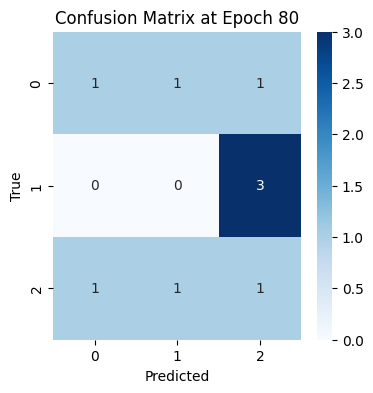

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 46ms/step
Epoch 85 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.67      0.67      0.67         3
     perfect       0.50      0.33      0.40         3
    overripe       0.25      0.33      0.29         3

    accuracy                           0.44         9
   macro avg       0.47      0.44      0.45         9
weighted avg       0.47      0.44      0.45         9



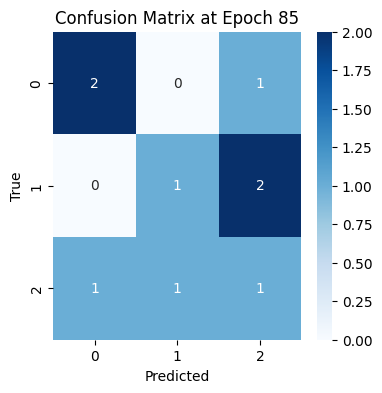

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 49ms/step
Epoch 90 Accuracy: 0.2222222222222222
              precision    recall  f1-score   support

      unripe       0.50      0.33      0.40         3
     perfect       0.00      0.00      0.00         3
    overripe       0.20      0.33      0.25         3

    accuracy                           0.22         9
   macro avg       0.23      0.22      0.22         9
weighted avg       0.23      0.22      0.22         9



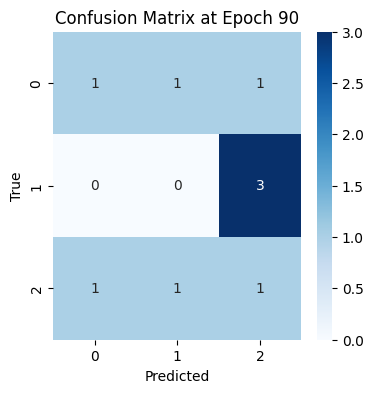

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 42ms/step
Epoch 95 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.50      0.33      0.40         3
     perfect       0.00      0.00      0.00         3
    overripe       0.29      0.67      0.40         3

    accuracy                           0.33         9
   macro avg       0.26      0.33      0.27         9
weighted avg       0.26      0.33      0.27         9



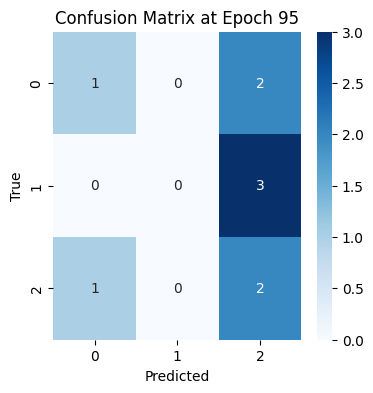

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 49ms/step
Epoch 100 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.38      1.00      0.55         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.12      0.33      0.18         9
weighted avg       0.12      0.33      0.18         9



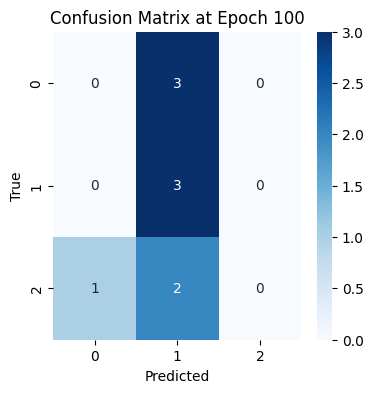

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 48ms/step
Epoch 105 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.67      0.67      0.67         3
     perfect       0.50      1.00      0.67         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.56         9
   macro avg       0.39      0.56      0.44         9
weighted avg       0.39      0.56      0.44         9



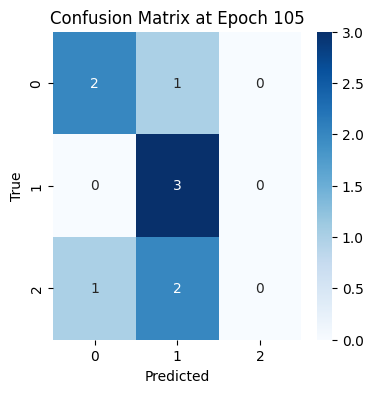

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 44ms/step
Epoch 110 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.67      0.67      0.67         3
     perfect       0.50      1.00      0.67         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.56         9
   macro avg       0.39      0.56      0.44         9
weighted avg       0.39      0.56      0.44         9



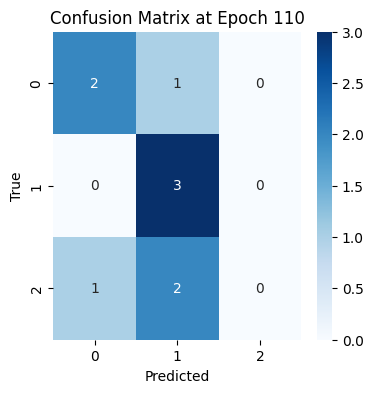

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 48ms/step
Epoch 115 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.33      1.00      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



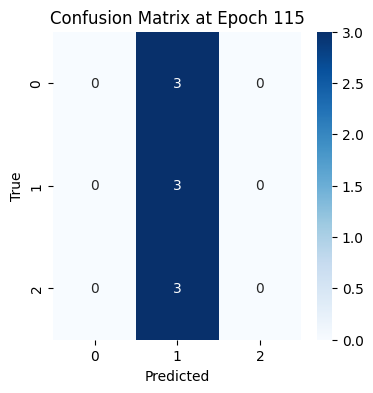

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 46ms/step
Epoch 120 Accuracy: 0.2222222222222222
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.29      0.67      0.40         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.22         9
   macro avg       0.10      0.22      0.13         9
weighted avg       0.10      0.22      0.13         9



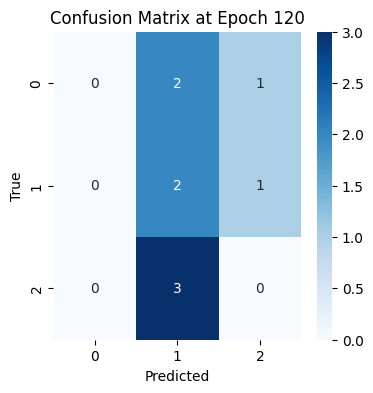

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 48ms/step
Epoch 125 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.33      1.00      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



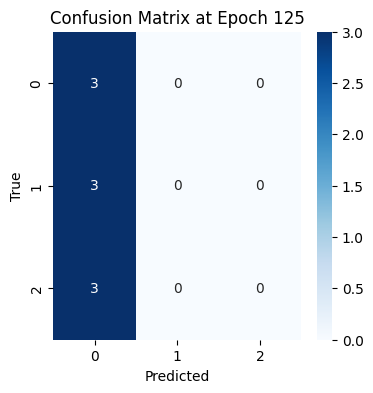

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 46ms/step
Epoch 130 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         3
     perfect       1.00      0.67      0.80         3
    overripe       1.00      0.33      0.50         3

    accuracy                           0.67         9
   macro avg       0.83      0.67      0.66         9
weighted avg       0.83      0.67      0.66         9



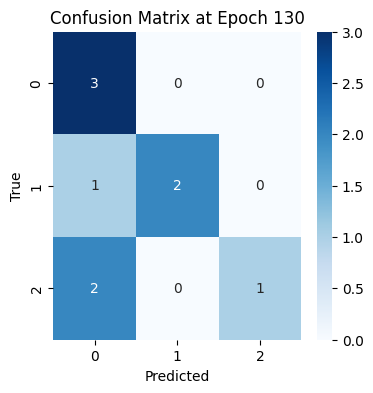

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 45ms/step
Epoch 135 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         3
     perfect       0.67      0.67      0.67         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.56         9
   macro avg       0.39      0.56      0.44         9
weighted avg       0.39      0.56      0.44         9



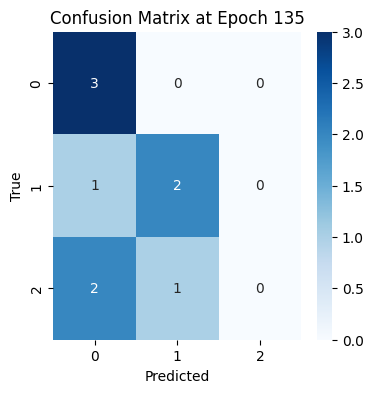

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 52ms/step
Epoch 140 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.60      1.00      0.75         3
     perfect       0.75      1.00      0.86         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.67         9
   macro avg       0.45      0.67      0.54         9
weighted avg       0.45      0.67      0.54         9



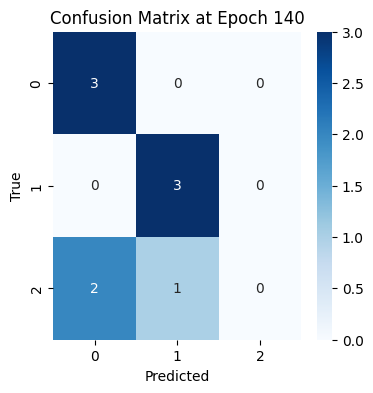

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 47ms/step
Epoch 145 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.50      0.33      0.40         3
     perfect       0.00      0.00      0.00         3
    overripe       0.33      0.67      0.44         3

    accuracy                           0.33         9
   macro avg       0.28      0.33      0.28         9
weighted avg       0.28      0.33      0.28         9



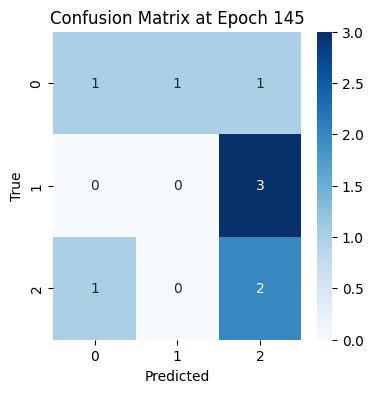

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 47ms/step
Epoch 150 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.50      0.67      0.57         3
     perfect       0.67      0.67      0.67         3
    overripe       0.50      0.33      0.40         3

    accuracy                           0.56         9
   macro avg       0.56      0.56      0.55         9
weighted avg       0.56      0.56      0.55         9



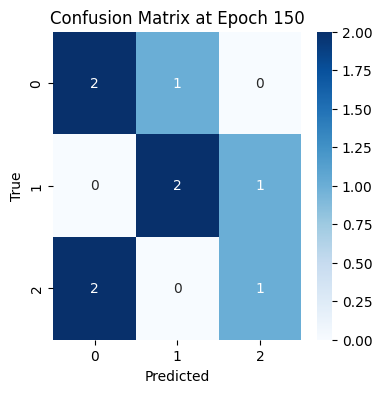

In [49]:
for i in range(5,151,5):
    kiwi_nir_msdcnn1.load_weights(working_dir + 'KIWI_NIR_MSDCNN1_checkpoints/MSDCNN1' + str(i).zfill(4) + '.ckpt')
    x, y = test_kiwi_NIR_datagen.__getitem__(0)
    y_pred = kiwi_nir_msdcnn1.predict(x)
    y_pred = np.argmax(y_pred, axis=1)
    y = y.numpy()
    print(f"Epoch {i} Accuracy: {np.mean(y_pred == y)}")
    # print recall and precision and f1 score
    print(classification_report(y, y_pred, target_names=ripeness_state_dict.keys(), zero_division=0))
    # plot confusion matrix
    cm = confusion_matrix(y, y_pred)
    plt.figure(figsize=(4, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'Confusion Matrix at Epoch {i}')
    plt.show()

evaluate model on entire dataset

3/3 [==============================] - 0s 75ms/step
Epoch 5 Accuracy: 0.5
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        18
     perfect       0.50      1.00      0.67        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.50        76
   macro avg       0.17      0.33      0.22        76
weighted avg       0.25      0.50      0.33        76



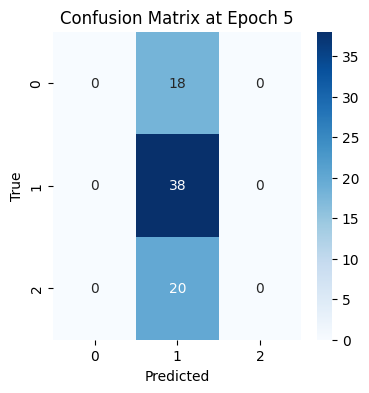

3/3 [==============================] - 0s 77ms/step
Epoch 10 Accuracy: 0.5
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        18
     perfect       0.50      1.00      0.67        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.50        76
   macro avg       0.17      0.33      0.22        76
weighted avg       0.25      0.50      0.33        76



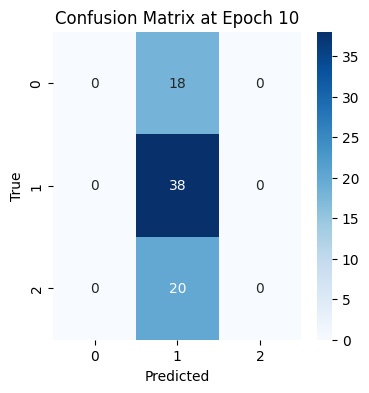

3/3 [==============================] - 0s 77ms/step
Epoch 15 Accuracy: 0.23684210526315788
              precision    recall  f1-score   support

      unripe       0.24      1.00      0.38        18
     perfect       0.00      0.00      0.00        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.24        76
   macro avg       0.08      0.33      0.13        76
weighted avg       0.06      0.24      0.09        76



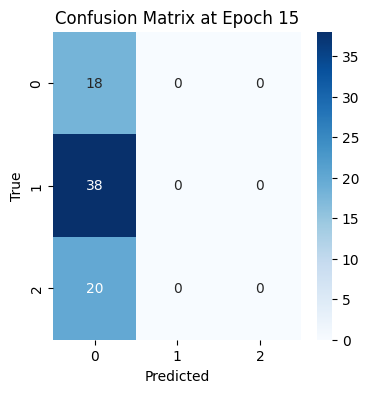

3/3 [==============================] - 0s 77ms/step
Epoch 20 Accuracy: 0.5
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        18
     perfect       0.50      1.00      0.67        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.50        76
   macro avg       0.17      0.33      0.22        76
weighted avg       0.25      0.50      0.33        76



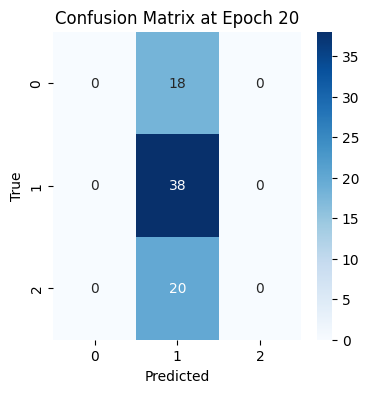

3/3 [==============================] - 0s 76ms/step
Epoch 25 Accuracy: 0.2631578947368421
              precision    recall  f1-score   support

      unripe       0.26      1.00      0.41        18
     perfect       0.29      0.05      0.09        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.26        76
   macro avg       0.18      0.35      0.17        76
weighted avg       0.20      0.26      0.14        76



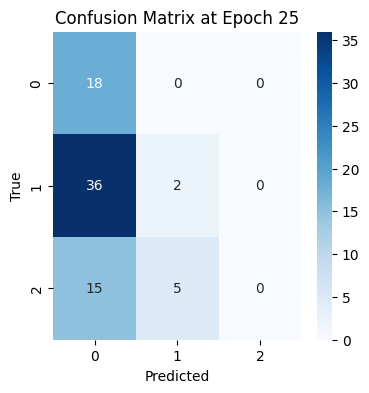

3/3 [==============================] - 0s 76ms/step
Epoch 30 Accuracy: 0.3815789473684211
              precision    recall  f1-score   support

      unripe       0.34      1.00      0.51        18
     perfect       0.48      0.29      0.36        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.38        76
   macro avg       0.27      0.43      0.29        76
weighted avg       0.32      0.38      0.30        76



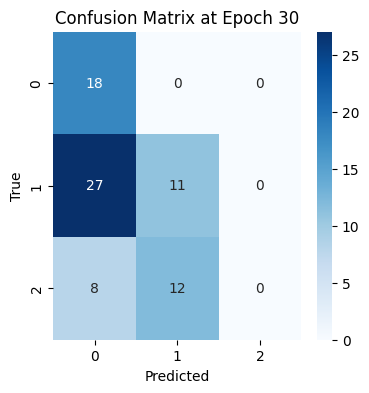

3/3 [==============================] - 0s 77ms/step
Epoch 35 Accuracy: 0.5
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        18
     perfect       0.51      1.00      0.67        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.50        76
   macro avg       0.17      0.33      0.22        76
weighted avg       0.25      0.50      0.34        76



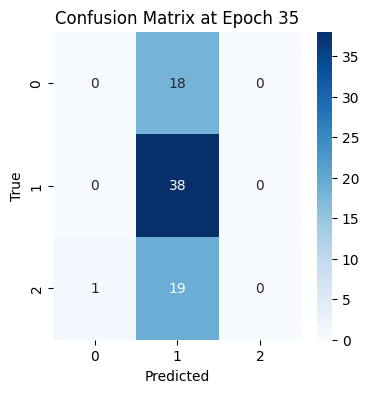

3/3 [==============================] - 0s 76ms/step
Epoch 40 Accuracy: 0.25
              precision    recall  f1-score   support

      unripe       0.24      1.00      0.39        18
     perfect       0.50      0.03      0.05        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.25        76
   macro avg       0.25      0.34      0.15        76
weighted avg       0.31      0.25      0.12        76



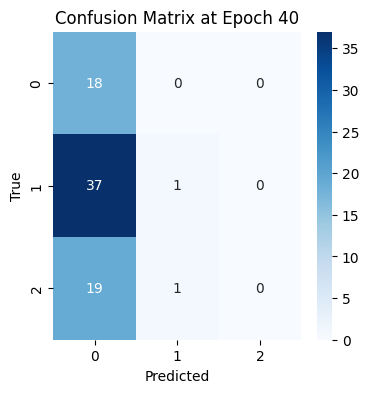

3/3 [==============================] - 0s 76ms/step
Epoch 45 Accuracy: 0.2894736842105263
              precision    recall  f1-score   support

      unripe       0.25      1.00      0.40        18
     perfect       1.00      0.03      0.05        38
    overripe       0.75      0.15      0.25        20

    accuracy                           0.29        76
   macro avg       0.67      0.39      0.24        76
weighted avg       0.76      0.29      0.19        76



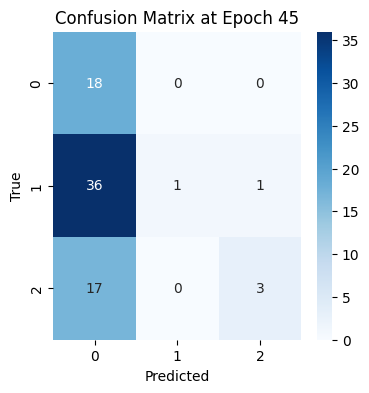

3/3 [==============================] - 0s 78ms/step
Epoch 50 Accuracy: 0.5394736842105263
              precision    recall  f1-score   support

      unripe       0.84      0.89      0.86        18
     perfect       0.88      0.18      0.30        38
    overripe       0.37      0.90      0.52        20

    accuracy                           0.54        76
   macro avg       0.69      0.66      0.56        76
weighted avg       0.73      0.54      0.49        76



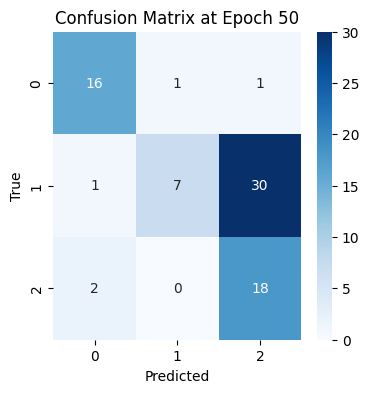

3/3 [==============================] - 0s 74ms/step
Epoch 55 Accuracy: 0.2631578947368421
              precision    recall  f1-score   support

      unripe       0.25      1.00      0.40        18
     perfect       0.00      0.00      0.00        38
    overripe       0.67      0.10      0.17        20

    accuracy                           0.26        76
   macro avg       0.30      0.37      0.19        76
weighted avg       0.23      0.26      0.14        76



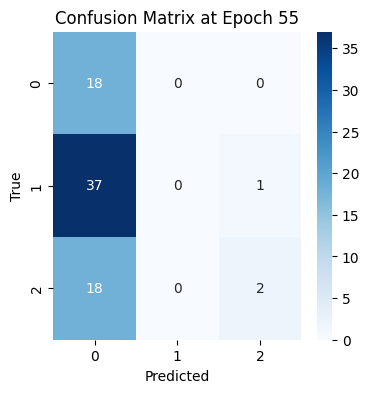

3/3 [==============================] - 0s 77ms/step
Epoch 60 Accuracy: 0.23684210526315788
              precision    recall  f1-score   support

      unripe       0.24      1.00      0.38        18
     perfect       0.00      0.00      0.00        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.24        76
   macro avg       0.08      0.33      0.13        76
weighted avg       0.06      0.24      0.09        76



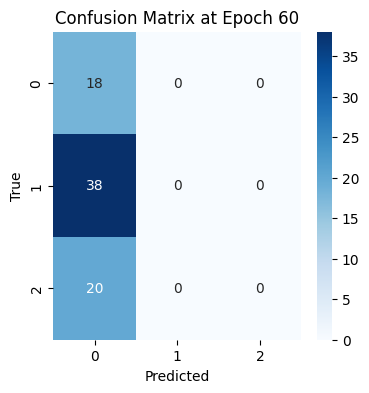

3/3 [==============================] - 0s 76ms/step
Epoch 65 Accuracy: 0.47368421052631576
              precision    recall  f1-score   support

      unripe       0.75      0.83      0.79        18
     perfect       1.00      0.08      0.15        38
    overripe       0.34      0.90      0.49        20

    accuracy                           0.47        76
   macro avg       0.70      0.60      0.48        76
weighted avg       0.77      0.47      0.39        76



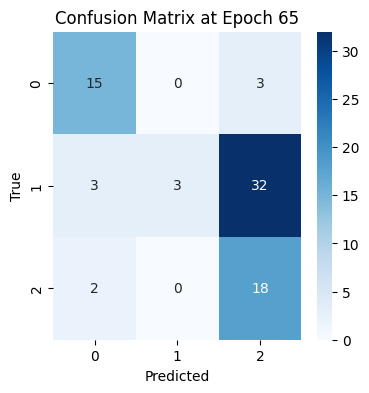

3/3 [==============================] - 0s 75ms/step
Epoch 70 Accuracy: 0.25
              precision    recall  f1-score   support

      unripe       0.24      1.00      0.39        18
     perfect       0.00      0.00      0.00        38
    overripe       1.00      0.05      0.10        20

    accuracy                           0.25        76
   macro avg       0.41      0.35      0.16        76
weighted avg       0.32      0.25      0.12        76



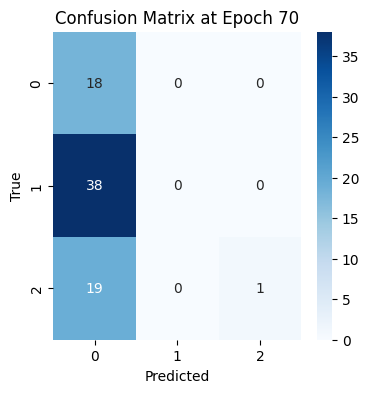

3/3 [==============================] - 0s 76ms/step
Epoch 75 Accuracy: 0.7105263157894737
              precision    recall  f1-score   support

      unripe       0.61      0.94      0.74        18
     perfect       0.75      0.71      0.73        38
    overripe       0.83      0.50      0.62        20

    accuracy                           0.71        76
   macro avg       0.73      0.72      0.70        76
weighted avg       0.74      0.71      0.70        76



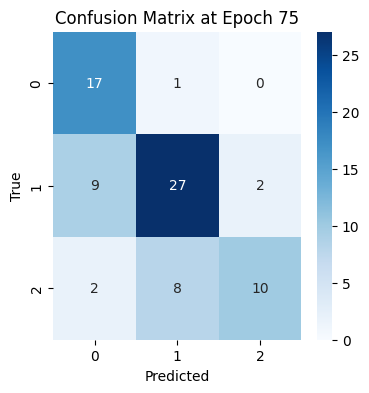

3/3 [==============================] - 0s 77ms/step
Epoch 80 Accuracy: 0.4605263157894737
              precision    recall  f1-score   support

      unripe       0.67      0.11      0.19        18
     perfect       0.58      0.39      0.47        38
    overripe       0.38      0.90      0.54        20

    accuracy                           0.46        76
   macro avg       0.54      0.47      0.40        76
weighted avg       0.55      0.46      0.42        76



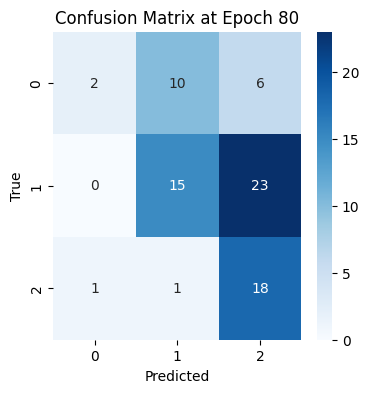

3/3 [==============================] - 0s 76ms/step
Epoch 85 Accuracy: 0.5263157894736842
              precision    recall  f1-score   support

      unripe       0.92      0.61      0.73        18
     perfect       0.65      0.29      0.40        38
    overripe       0.38      0.90      0.54        20

    accuracy                           0.53        76
   macro avg       0.65      0.60      0.56        76
weighted avg       0.64      0.53      0.52        76



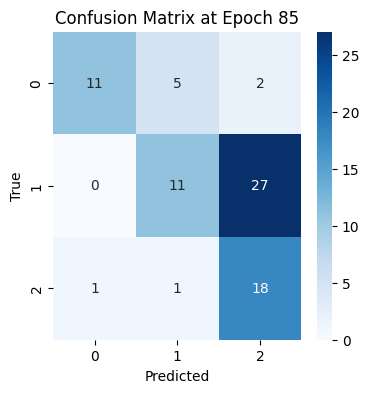

3/3 [==============================] - 0s 84ms/step
Epoch 90 Accuracy: 0.3026315789473684
              precision    recall  f1-score   support

      unripe       0.67      0.11      0.19        18
     perfect       0.25      0.08      0.12        38
    overripe       0.30      0.90      0.44        20

    accuracy                           0.30        76
   macro avg       0.40      0.36      0.25        76
weighted avg       0.36      0.30      0.22        76



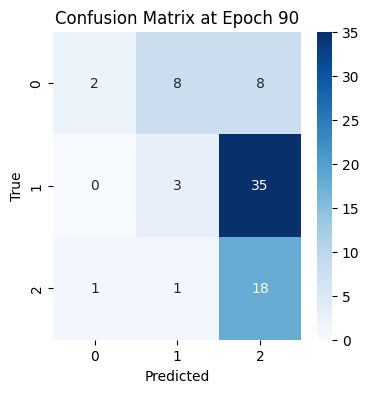

3/3 [==============================] - 0s 77ms/step
Epoch 95 Accuracy: 0.27631578947368424
              precision    recall  f1-score   support

      unripe       0.67      0.11      0.19        18
     perfect       0.00      0.00      0.00        38
    overripe       0.26      0.95      0.41        20

    accuracy                           0.28        76
   macro avg       0.31      0.35      0.20        76
weighted avg       0.23      0.28      0.15        76



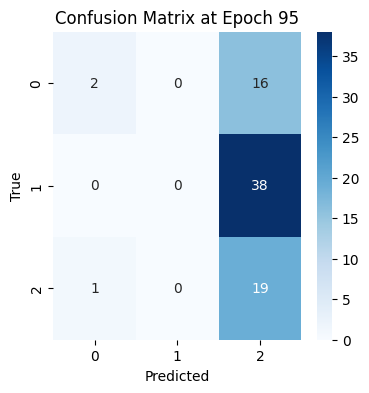

3/3 [==============================] - 0s 76ms/step
Epoch 100 Accuracy: 0.5
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        18
     perfect       0.51      1.00      0.67        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.50        76
   macro avg       0.17      0.33      0.22        76
weighted avg       0.25      0.50      0.34        76



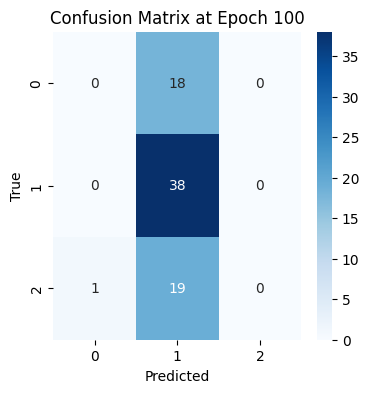

3/3 [==============================] - 0s 76ms/step
Epoch 105 Accuracy: 0.6710526315789473
              precision    recall  f1-score   support

      unripe       0.92      0.67      0.77        18
     perfect       0.61      1.00      0.76        38
    overripe       1.00      0.05      0.10        20

    accuracy                           0.67        76
   macro avg       0.85      0.57      0.54        76
weighted avg       0.79      0.67      0.59        76



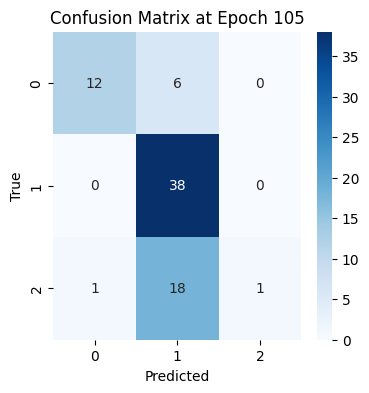

3/3 [==============================] - 0s 78ms/step
Epoch 110 Accuracy: 0.618421052631579
              precision    recall  f1-score   support

      unripe       0.90      0.50      0.64        18
     perfect       0.58      1.00      0.73        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.62        76
   macro avg       0.49      0.50      0.46        76
weighted avg       0.50      0.62      0.52        76



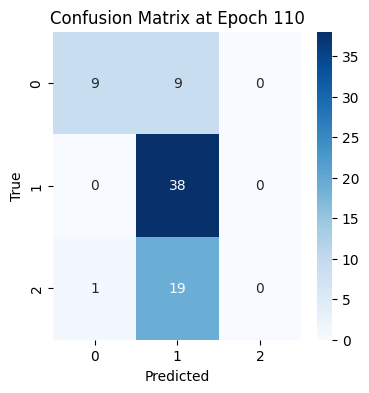

3/3 [==============================] - 0s 74ms/step
Epoch 115 Accuracy: 0.5
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        18
     perfect       0.50      1.00      0.67        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.50        76
   macro avg       0.17      0.33      0.22        76
weighted avg       0.25      0.50      0.33        76



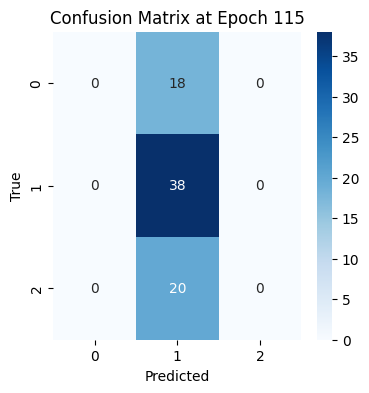

3/3 [==============================] - 0s 94ms/step
Epoch 120 Accuracy: 0.618421052631579
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        18
     perfect       0.61      0.89      0.72        38
    overripe       0.65      0.65      0.65        20

    accuracy                           0.62        76
   macro avg       0.42      0.51      0.46        76
weighted avg       0.47      0.62      0.53        76



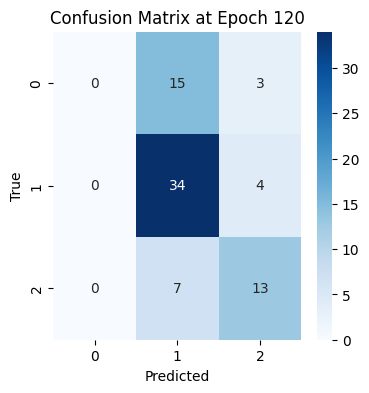

3/3 [==============================] - 0s 80ms/step
Epoch 125 Accuracy: 0.2894736842105263
              precision    recall  f1-score   support

      unripe       0.25      1.00      0.40        18
     perfect       1.00      0.03      0.05        38
    overripe       1.00      0.15      0.26        20

    accuracy                           0.29        76
   macro avg       0.75      0.39      0.24        76
weighted avg       0.82      0.29      0.19        76



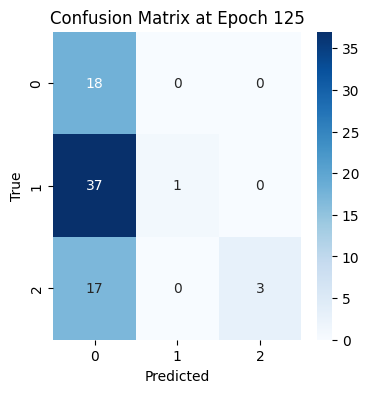

3/3 [==============================] - 0s 78ms/step
Epoch 130 Accuracy: 0.40789473684210525
              precision    recall  f1-score   support

      unripe       0.30      1.00      0.46        18
     perfect       0.78      0.18      0.30        38
    overripe       0.86      0.30      0.44        20

    accuracy                           0.41        76
   macro avg       0.64      0.49      0.40        76
weighted avg       0.69      0.41      0.38        76



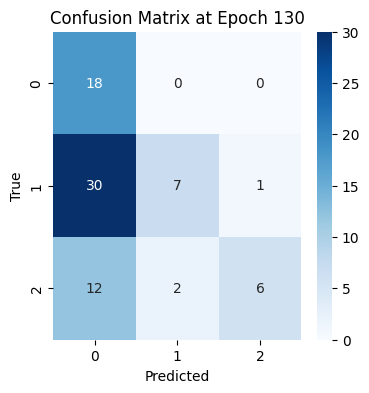

3/3 [==============================] - 0s 76ms/step
Epoch 135 Accuracy: 0.4473684210526316
              precision    recall  f1-score   support

      unripe       0.35      1.00      0.51        18
     perfect       0.61      0.29      0.39        38
    overripe       0.83      0.25      0.38        20

    accuracy                           0.45        76
   macro avg       0.60      0.51      0.43        76
weighted avg       0.61      0.45      0.42        76



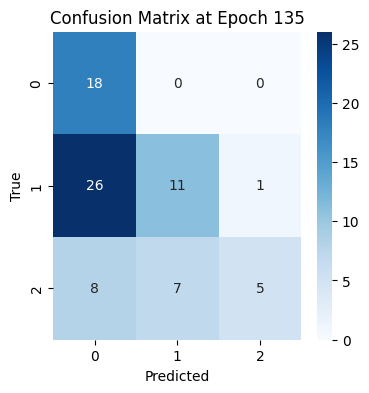

3/3 [==============================] - 0s 77ms/step
Epoch 140 Accuracy: 0.6842105263157895
              precision    recall  f1-score   support

      unripe       0.68      0.94      0.79        18
     perfect       0.68      0.89      0.77        38
    overripe       1.00      0.05      0.10        20

    accuracy                           0.68        76
   macro avg       0.79      0.63      0.55        76
weighted avg       0.76      0.68      0.60        76



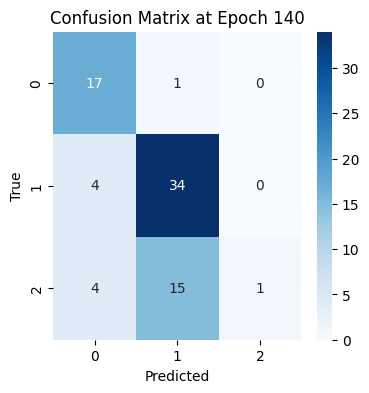

3/3 [==============================] - 0s 76ms/step
Epoch 145 Accuracy: 0.3684210526315789
              precision    recall  f1-score   support

      unripe       0.67      0.11      0.19        18
     perfect       0.44      0.18      0.26        38
    overripe       0.33      0.95      0.49        20

    accuracy                           0.37        76
   macro avg       0.48      0.42      0.31        76
weighted avg       0.46      0.37      0.30        76



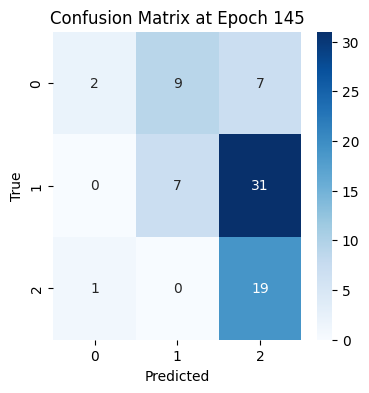

3/3 [==============================] - 0s 77ms/step
Epoch 150 Accuracy: 0.6578947368421053
              precision    recall  f1-score   support

      unripe       0.75      0.83      0.79        18
     perfect       0.71      0.66      0.68        38
    overripe       0.48      0.50      0.49        20

    accuracy                           0.66        76
   macro avg       0.65      0.66      0.65        76
weighted avg       0.66      0.66      0.66        76



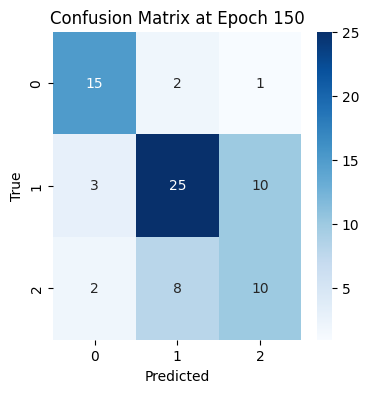

In [42]:
x, y = all_kiwi_nir_datagen.__getitem__(0)
y = y.numpy()
for i in range(5,151,5):
    kiwi_nir_msdcnn1.load_weights(working_dir + 'KIWI_NIR_MSDCNN1_checkpoints/MSDCNN1' + str(i).zfill(4) + '.ckpt')
    y_pred = kiwi_nir_msdcnn1.predict(x)
    y_pred = np.argmax(y_pred, axis=1)
    print(f"Epoch {i} Accuracy: {np.mean(y_pred == y)}")
    # print recall and precision and f1 score
    print(classification_report(y, y_pred, target_names=ripeness_state_dict.keys(), zero_division=0))
    # plot confusion matrix
    cm = confusion_matrix(y, y_pred)
    plt.figure(figsize=(4, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'Confusion Matrix at Epoch {i}')
    plt.show()

### MSDCNN2

Approach 2 : similar to approach 1 but uses a voting mechanic instead of a shared dense layer.

In [12]:
def build_MSDCNN2(input_shape):
    input_layer = Input(shape=input_shape)

    # original scale pathway
    a = DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same', use_bias=False, depth_multiplier=3)(input_layer)
    a = Conv2D(25, kernel_size=(1, 1), strides=(1, 1), use_bias=True)(a)
    a = ReLU()(a)
    a = AveragePooling2D(pool_size=(4, 4), strides=(4, 4))(a)
    a = BatchNormalization()(a) 
    # Depthwise Convolution Block 2
    a = DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same', use_bias=False, depth_multiplier=3)(a)  # depth_multiplier to expand channels
    a = Conv2D(30, kernel_size=(1, 1), strides=(1, 1), use_bias=True)(a)
    a = ReLU()(a)
    a = AveragePooling2D(pool_size=(4, 4), strides=(4, 4))(a)
    a = BatchNormalization()(a)
    # Depthwise Convolution Block 3
    a = DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same', use_bias=False, depth_multiplier=3)(a) # depth_multiplier to expand channels
    a = Conv2D(50, kernel_size=(1, 1), strides=(1, 1), use_bias=True)(a)
    a = ReLU()(a)
    a = BatchNormalization()(a)
    a = GlobalAveragePooling2D()(a)
    a = Activation('sigmoid')(a)
    a = BatchNormalization()(a)
    a = Dense(50, use_bias=True)(a)
    a = ReLU()(a)
    a = Dense(3, use_bias=True)(a)
    a = Activation('sigmoid')(a)

    # double scale pathway 
    def resize_double(input_img):
        return resize_images(input_img, height_factor=2, width_factor=2, data_format='channels_last')
    b = Lambda(resize_double)(input_layer)
    b = DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same', use_bias=False, depth_multiplier=3)(b)
    b = Conv2D(25, kernel_size=(1, 1), strides=(1, 1), use_bias=True)(b)
    b = ReLU()(b)
    b = AveragePooling2D(pool_size=(4, 4), strides=(4, 4))(b)
    b = BatchNormalization()(b)
    # Depthwise Convolution Block 2
    b = DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same', use_bias=False, depth_multiplier=3)(b)  # depth_multiplier to expand channels
    b = Conv2D(30, kernel_size=(1, 1), strides=(1, 1), use_bias=True)(b)
    b = ReLU()(b)
    b = AveragePooling2D(pool_size=(4, 4), strides=(4, 4))(b)
    b = BatchNormalization()(b)
    # Depthwise Convolution Block 3
    b = DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same', use_bias=False, depth_multiplier=3)(b)  # depth_multiplier to expand channels
    b = Conv2D(50, kernel_size=(1, 1), strides=(1, 1), use_bias=True)(b)
    b = ReLU()(b)
    b = BatchNormalization()(b)
    b = GlobalAveragePooling2D()(b)
    b = Activation('sigmoid')(b)
    b = BatchNormalization()(b)
    b = Dense(50, use_bias=True)(b)
    b = ReLU()(b)
    b = Dense(3, use_bias=True)(b)
    b = Activation('sigmoid')(b)

    # half scale pathway 
    def resize_half(input_img):
        # return resize_images(input_img, height_factor=0.5, width_factor=0.5, data_format='channels_last')
        # get image shape 
        shape = input_img.shape
        x = shape[1]//2 
        y = shape[2]//2 
        return tf.image.resize(input_img, (x,y))
    c = Lambda(resize_half)(input_layer)
    c = DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same', use_bias=False, depth_multiplier=3)(c)
    c = Conv2D(25, kernel_size=(1, 1), strides=(1, 1), use_bias=True)(c)
    c = ReLU()(c)
    c = AveragePooling2D(pool_size=(4, 4), strides=(4, 4))(c)
    c = BatchNormalization()(c)
    # Depthwise Convolution Block 2
    c = DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same', use_bias=False, depth_multiplier=3)(c)  # depth_multiplier to expand channels
    c = Conv2D(30, kernel_size=(1, 1), strides=(1, 1), use_bias=True)(c)
    c = ReLU()(c)
    c = AveragePooling2D(pool_size=(4, 4), strides=(4, 4))(c)
    c = BatchNormalization()(c)
    # Depthwise Convolution Block 3
    c = DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same', use_bias=False, depth_multiplier=3)(c)  # depth_multiplier to expand channels
    c = Conv2D(50, kernel_size=(1, 1), strides=(1, 1), use_bias=True)(c)
    c = ReLU()(c)
    c = BatchNormalization()(c)
    c = GlobalAveragePooling2D()(c)
    c = Activation('sigmoid')(c)
    c = BatchNormalization()(c)
    c = Dense(50, use_bias=True)(c)
    c = ReLU()(c)
    c = Dense(3, use_bias=True)(c)
    c = Activation('sigmoid')(c)

    # concatenate the three pathways
    x = Add()([a,b,c])
    # voting mechanism
    x = Activation('softmax')(x)
    
    model = keras.Model(inputs=input_layer, outputs=x)
    model.compile(optimizer=Adam(learning_rate=1e-2, beta_1=0.5), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

In [13]:
MSDCNN2 = build_MSDCNN2((64, 64, 252))
MSDCNN2.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 64, 64, 252  0           []                               
                                )]                                                                
                                                                                                  
 lambda_2 (Lambda)              (None, 128, 128, 25  0           ['input_2[0][0]']                
                                2)                                                                
                                                                                                  
 lambda_3 (Lambda)              (None, 32, 32, 252)  0           ['input_2[0][0]']                
                                                                                            

#### Avocado Subset (NIR and VIS)

#### Kiwi Subset (NIR and VIS)

In [53]:
kiwi_nir_msdcnn2_cb = ModelCheckpoint(filepath = working_dir + 'KIWI_NIR_MSDCNN2_checkpoints/MSDCNN2{epoch:04d}.ckpt', verbose=1, save_freq='epoch', period=5, save_weights_only=True)

In [54]:
kiwi_nir_msdcnn2 = build_MSDCNN2((64, 64, 252))

In [55]:
kiwi_nir_msdcnn2.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 64, 64, 252  0           []                               
                                )]                                                                
                                                                                                  
 lambda_8 (Lambda)              (None, 128, 128, 25  0           ['input_5[0][0]']                
                                2)                                                                
                                                                                                  
 lambda_9 (Lambda)              (None, 32, 32, 252)  0           ['input_5[0][0]']                
                                                                                            

In [56]:
kiwi_nir_msdcnn2.fit(train_kiwi_NIR_datagen, epochs=150, validation_data=val_kiwi_NIR_datagen, callbacks=[kiwi_nir_msdcnn2_cb], use_multiprocessing=True)

unique classes: [1 0 2]
class 1 was over the max count of 3 samples, 6 samples were found
class 0 was under the max count of 3 samples, 1 samples were found
class 2 was under the max count of 3 samples, 2 samples were found
Epoch 1/150
6/6 [==============================] - ETA: 0s - loss: 1.0574 - accuracy: 0.4444unique classes: [2 0 1]
class 2 is already balanced
class 0 is already balanced
class 1 is already balanced
6/6 [==============================] - 91s 13s/step - loss: 1.0574 - accuracy: 0.4444 - val_loss: 1.1336 - val_accuracy: 0.3333
Epoch 2/150
6/6 [==============================] - 144s 21s/step - loss: 0.8686 - accuracy: 0.5926 - val_loss: 1.1810 - val_accuracy: 0.3333
Epoch 3/150
6/6 [==============================] - 108s 13s/step - loss: 0.6995 - accuracy: 0.6667 - val_loss: 1.2340 - val_accuracy: 0.3333
Epoch 4/150
6/6 [==============================] - 80s 12s/step - loss: 0.7171 - accuracy: 0.6481 - val_loss: 1.2701 - val_accuracy: 0.3333
Epoch 5/150
6/6 [=========

evaluate model on test dataset

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 1s 694ms/step
Epoch 5 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.33      1.00      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



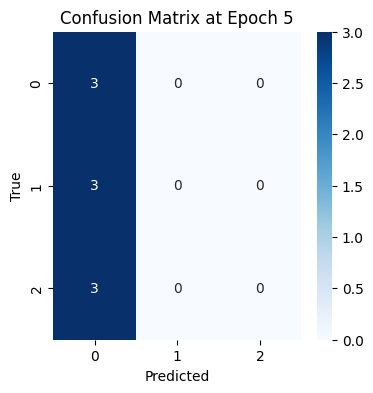

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 49ms/step
Epoch 10 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.33      1.00      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



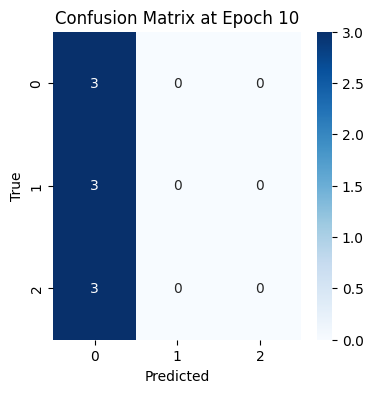

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 65ms/step
Epoch 15 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.33      1.00      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



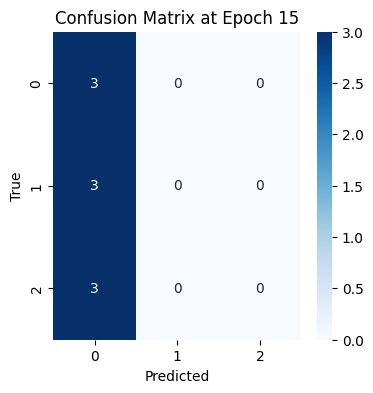

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 51ms/step
Epoch 20 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.33      1.00      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



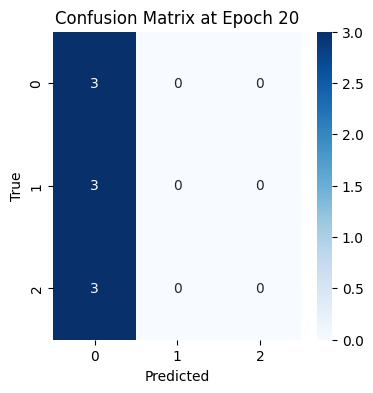

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 62ms/step
Epoch 25 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         3
     perfect       0.00      0.00      0.00         3
    overripe       0.33      0.33      0.33         3

    accuracy                           0.44         9
   macro avg       0.28      0.44      0.33         9
weighted avg       0.28      0.44      0.33         9



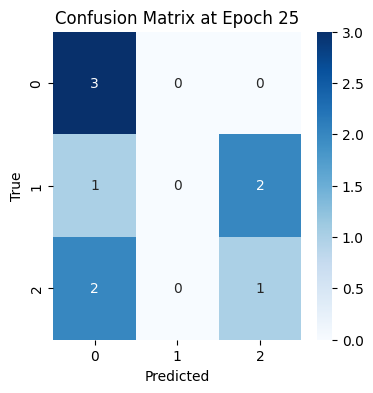

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 43ms/step
Epoch 30 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.38      1.00      0.55         3
     perfect       1.00      0.33      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.46      0.44      0.35         9
weighted avg       0.46      0.44      0.35         9



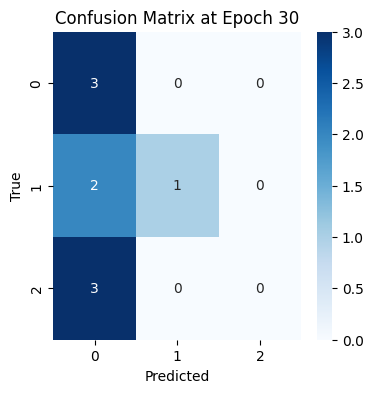

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 54ms/step
Epoch 35 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.33      1.00      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



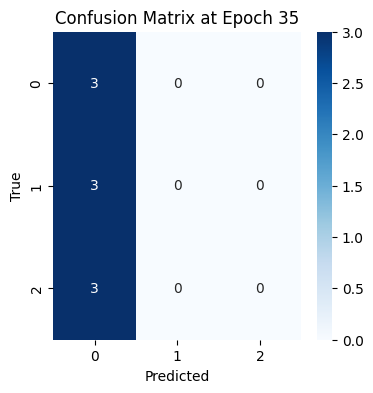

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 51ms/step
Epoch 40 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.33      1.00      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



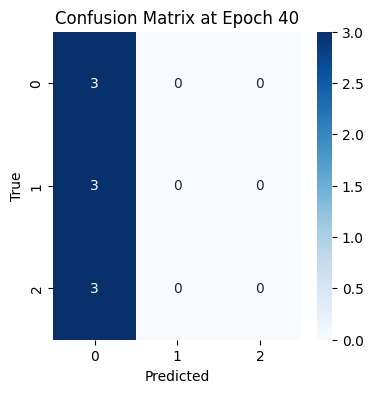

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 46ms/step
Epoch 45 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.33      1.00      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



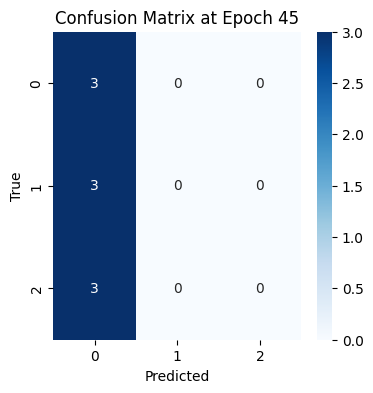

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 60ms/step
Epoch 50 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.33      1.00      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



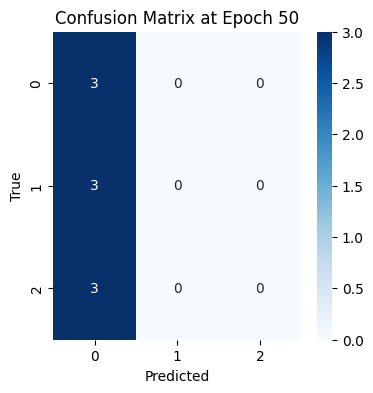

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 55ms/step
Epoch 55 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.67      0.67      0.67         3
     perfect       0.00      0.00      0.00         3
    overripe       0.33      0.67      0.44         3

    accuracy                           0.44         9
   macro avg       0.33      0.44      0.37         9
weighted avg       0.33      0.44      0.37         9



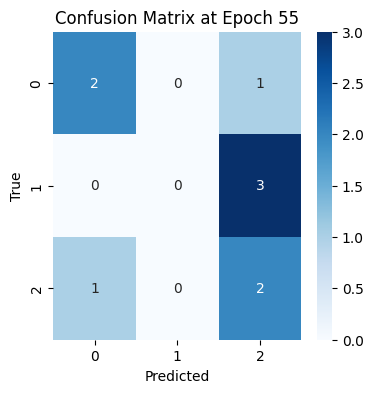

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 46ms/step
Epoch 60 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.33      1.00      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



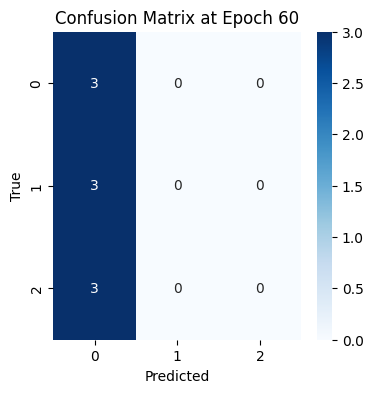

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 56ms/step
Epoch 65 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.43      1.00      0.60         3
     perfect       0.50      0.33      0.40         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.31      0.44      0.33         9
weighted avg       0.31      0.44      0.33         9



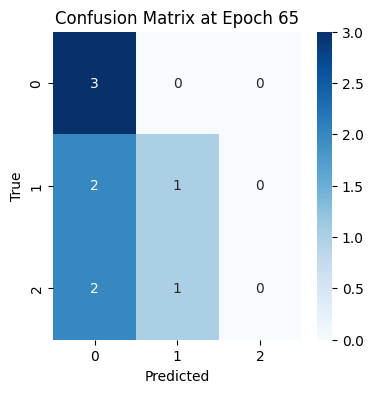

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 45ms/step
Epoch 70 Accuracy: 0.2222222222222222
              precision    recall  f1-score   support

      unripe       0.25      0.33      0.29         3
     perfect       0.00      0.00      0.00         3
    overripe       0.20      0.33      0.25         3

    accuracy                           0.22         9
   macro avg       0.15      0.22      0.18         9
weighted avg       0.15      0.22      0.18         9



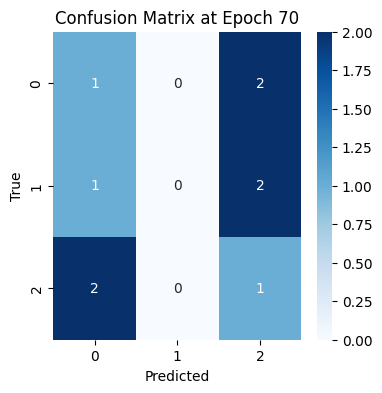

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 43ms/step
Epoch 75 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.50      0.67      0.57         3
    overripe       0.40      0.67      0.50         3

    accuracy                           0.44         9
   macro avg       0.30      0.44      0.36         9
weighted avg       0.30      0.44      0.36         9



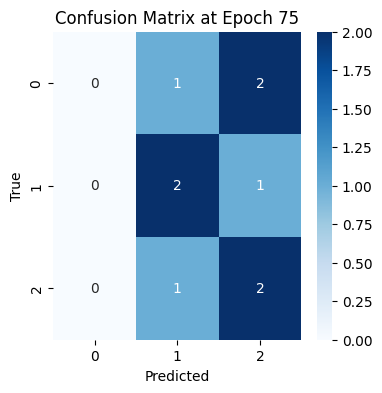

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 48ms/step
Epoch 80 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.38      1.00      0.55         3
     perfect       1.00      0.33      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.46      0.44      0.35         9
weighted avg       0.46      0.44      0.35         9



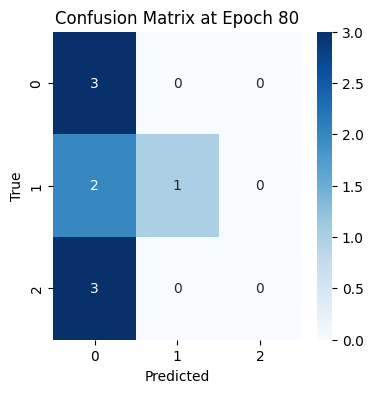

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 42ms/step
Epoch 85 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         3
     perfect       0.67      0.67      0.67         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.56         9
   macro avg       0.39      0.56      0.44         9
weighted avg       0.39      0.56      0.44         9



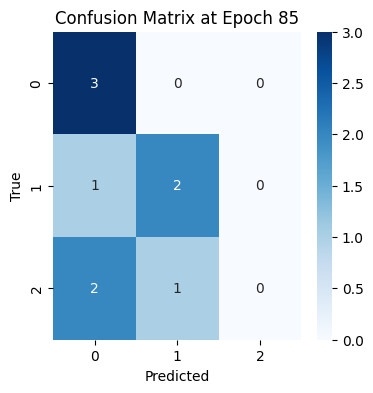

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 43ms/step
Epoch 90 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.33      1.00      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



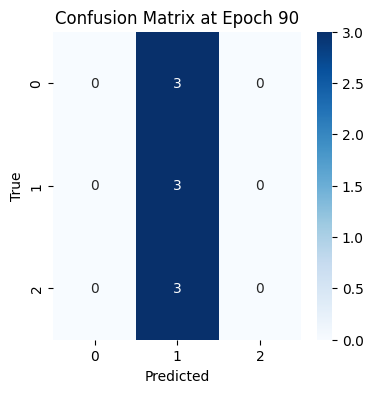

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 46ms/step
Epoch 95 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         3
     perfect       0.67      0.67      0.67         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.56         9
   macro avg       0.39      0.56      0.44         9
weighted avg       0.39      0.56      0.44         9



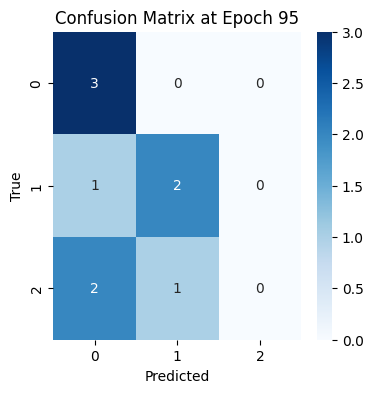

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 46ms/step
Epoch 100 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.50      0.33      0.40         3
     perfect       0.00      0.00      0.00         3
    overripe       0.29      0.67      0.40         3

    accuracy                           0.33         9
   macro avg       0.26      0.33      0.27         9
weighted avg       0.26      0.33      0.27         9



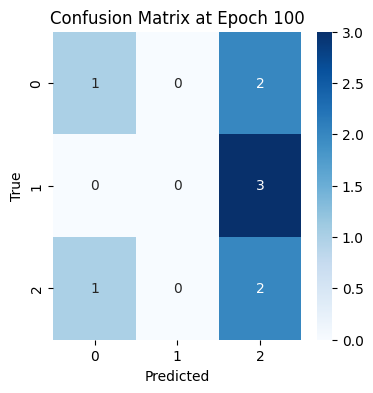

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 46ms/step
Epoch 105 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.43      1.00      0.60         3
     perfect       1.00      0.33      0.50         3
    overripe       1.00      0.33      0.50         3

    accuracy                           0.56         9
   macro avg       0.81      0.56      0.53         9
weighted avg       0.81      0.56      0.53         9



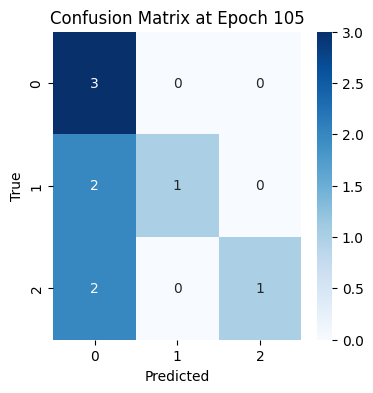

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 40ms/step
Epoch 110 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.40      0.67      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.25      0.33      0.29         3

    accuracy                           0.33         9
   macro avg       0.22      0.33      0.26         9
weighted avg       0.22      0.33      0.26         9



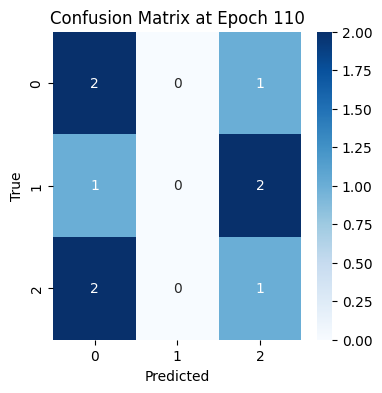

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 42ms/step
Epoch 115 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         3
     perfect       1.00      0.67      0.80         3
    overripe       1.00      0.33      0.50         3

    accuracy                           0.67         9
   macro avg       0.83      0.67      0.66         9
weighted avg       0.83      0.67      0.66         9



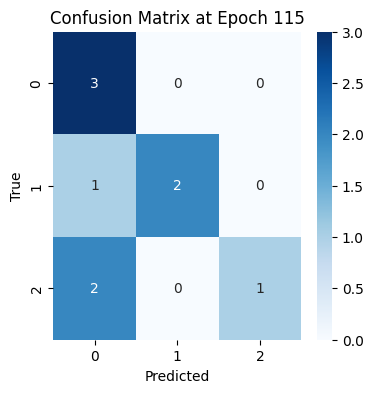

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 42ms/step
Epoch 120 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.40      0.67      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.33      0.33      0.33         3

    accuracy                           0.33         9
   macro avg       0.24      0.33      0.28         9
weighted avg       0.24      0.33      0.28         9



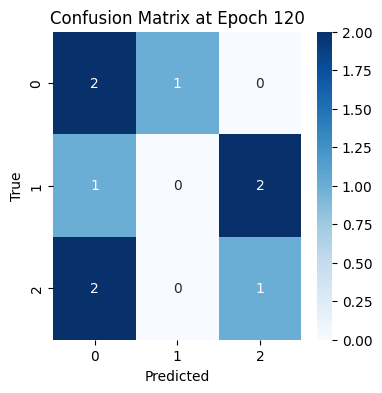

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 52ms/step
Epoch 125 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.40      0.67      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.25      0.33      0.29         3

    accuracy                           0.33         9
   macro avg       0.22      0.33      0.26         9
weighted avg       0.22      0.33      0.26         9



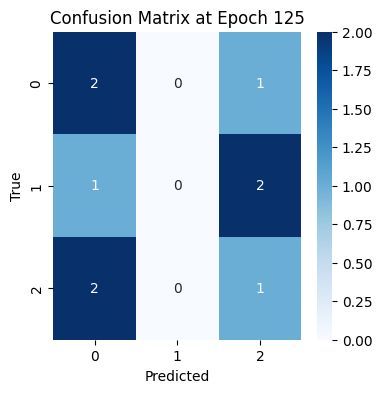

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 47ms/step
Epoch 130 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         3
     perfect       1.00      0.67      0.80         3
    overripe       1.00      0.33      0.50         3

    accuracy                           0.67         9
   macro avg       0.83      0.67      0.66         9
weighted avg       0.83      0.67      0.66         9



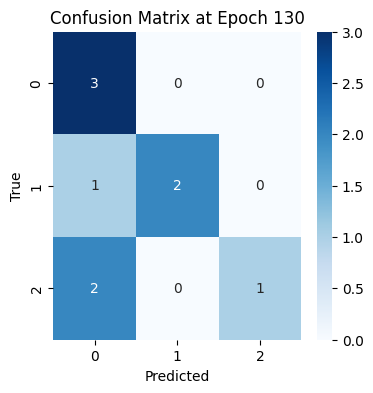

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 44ms/step
Epoch 135 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       1.00      0.33      0.50         3
    overripe       0.38      1.00      0.55         3

    accuracy                           0.44         9
   macro avg       0.46      0.44      0.35         9
weighted avg       0.46      0.44      0.35         9



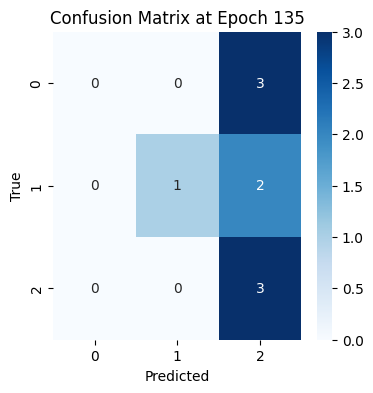

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 44ms/step
Epoch 140 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.67      0.67      0.67         3
     perfect       0.50      1.00      0.67         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.56         9
   macro avg       0.39      0.56      0.44         9
weighted avg       0.39      0.56      0.44         9



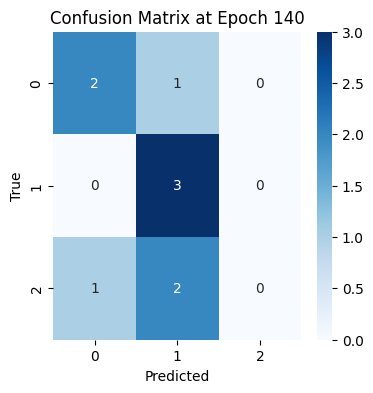

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 45ms/step
Epoch 145 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.50      0.67      0.57         3
     perfect       0.60      1.00      0.75         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.56         9
   macro avg       0.37      0.56      0.44         9
weighted avg       0.37      0.56      0.44         9



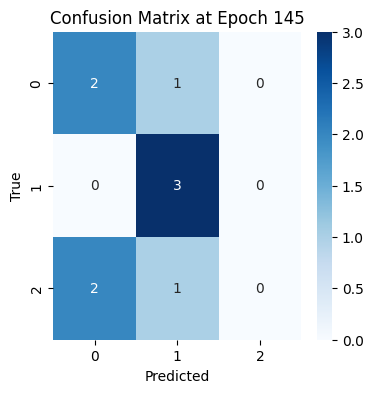

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 51ms/step
Epoch 150 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.50      0.33      0.40         3
     perfect       0.50      0.67      0.57         3
    overripe       0.33      0.33      0.33         3

    accuracy                           0.44         9
   macro avg       0.44      0.44      0.43         9
weighted avg       0.44      0.44      0.43         9



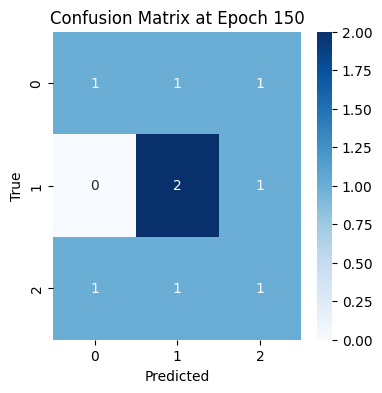

In [57]:
for i in range(5,151,5):
    kiwi_nir_msdcnn2.load_weights(working_dir + 'KIWI_NIR_MSDCNN2_checkpoints/MSDCNN2' + str(i).zfill(4) + '.ckpt')
    x, y = test_kiwi_NIR_datagen.__getitem__(0)
    y_pred = kiwi_nir_msdcnn2.predict(x)
    y_pred = np.argmax(y_pred, axis=1)
    y = y.numpy()
    print(f"Epoch {i} Accuracy: {np.mean(y_pred == y)}")
    # print recall and precision and f1 score
    print(classification_report(y, y_pred, target_names=ripeness_state_dict.keys(), zero_division=0))
    # plot confusion matrix
    cm = confusion_matrix(y, y_pred)
    plt.figure(figsize=(4, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'Confusion Matrix at Epoch {i}')
    plt.show()

evaluate model on entire dataset

3/3 [==============================] - 0s 78ms/step
Epoch 5 Accuracy: 0.23684210526315788
              precision    recall  f1-score   support

      unripe       0.24      1.00      0.38        18
     perfect       0.00      0.00      0.00        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.24        76
   macro avg       0.08      0.33      0.13        76
weighted avg       0.06      0.24      0.09        76



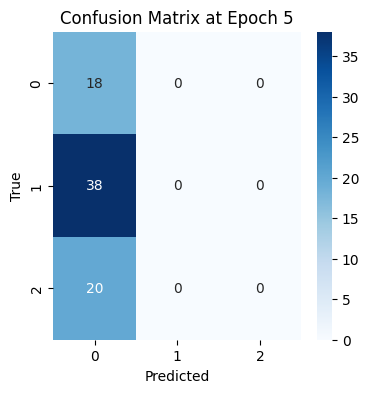

3/3 [==============================] - 0s 76ms/step
Epoch 10 Accuracy: 0.23684210526315788
              precision    recall  f1-score   support

      unripe       0.24      1.00      0.38        18
     perfect       0.00      0.00      0.00        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.24        76
   macro avg       0.08      0.33      0.13        76
weighted avg       0.06      0.24      0.09        76



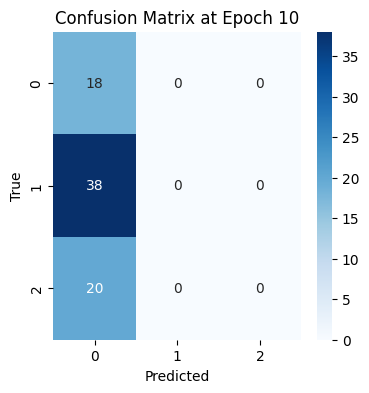

3/3 [==============================] - 0s 74ms/step
Epoch 15 Accuracy: 0.23684210526315788
              precision    recall  f1-score   support

      unripe       0.24      1.00      0.38        18
     perfect       0.00      0.00      0.00        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.24        76
   macro avg       0.08      0.33      0.13        76
weighted avg       0.06      0.24      0.09        76



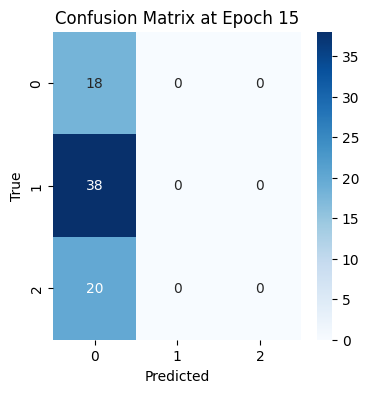

3/3 [==============================] - 0s 76ms/step
Epoch 20 Accuracy: 0.23684210526315788
              precision    recall  f1-score   support

      unripe       0.24      1.00      0.38        18
     perfect       0.00      0.00      0.00        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.24        76
   macro avg       0.08      0.33      0.13        76
weighted avg       0.06      0.24      0.09        76



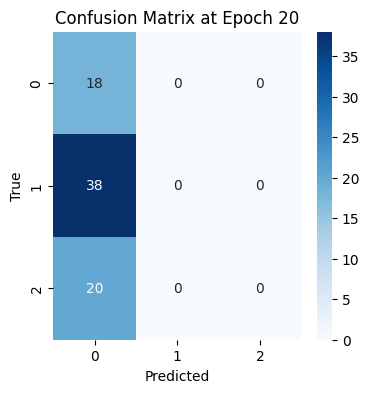

3/3 [==============================] - 0s 75ms/step
Epoch 25 Accuracy: 0.4605263157894737
              precision    recall  f1-score   support

      unripe       0.37      1.00      0.54        18
     perfect       0.82      0.24      0.37        38
    overripe       0.50      0.40      0.44        20

    accuracy                           0.46        76
   macro avg       0.56      0.55      0.45        76
weighted avg       0.63      0.46      0.43        76



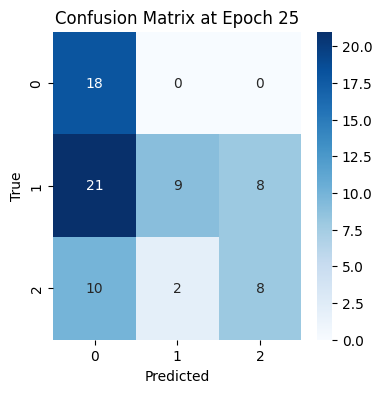

3/3 [==============================] - 0s 78ms/step
Epoch 30 Accuracy: 0.34210526315789475
              precision    recall  f1-score   support

      unripe       0.27      1.00      0.43        18
     perfect       0.80      0.21      0.33        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.34        76
   macro avg       0.36      0.40      0.25        76
weighted avg       0.46      0.34      0.27        76



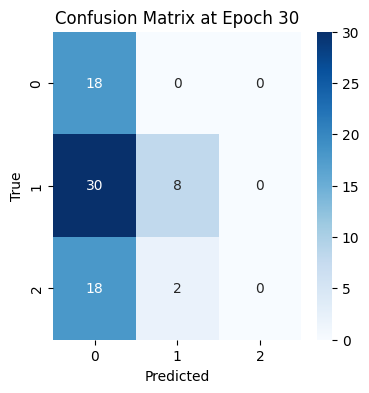

3/3 [==============================] - 0s 75ms/step
Epoch 35 Accuracy: 0.23684210526315788
              precision    recall  f1-score   support

      unripe       0.24      1.00      0.38        18
     perfect       0.00      0.00      0.00        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.24        76
   macro avg       0.08      0.33      0.13        76
weighted avg       0.06      0.24      0.09        76



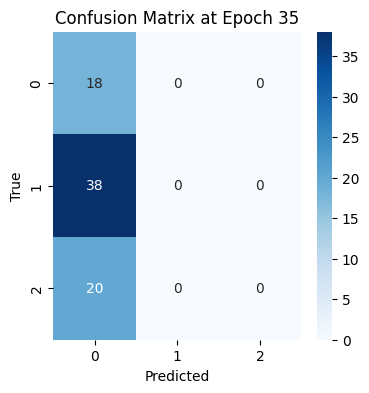

3/3 [==============================] - 0s 79ms/step
Epoch 40 Accuracy: 0.23684210526315788
              precision    recall  f1-score   support

      unripe       0.24      1.00      0.38        18
     perfect       0.00      0.00      0.00        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.24        76
   macro avg       0.08      0.33      0.13        76
weighted avg       0.06      0.24      0.09        76



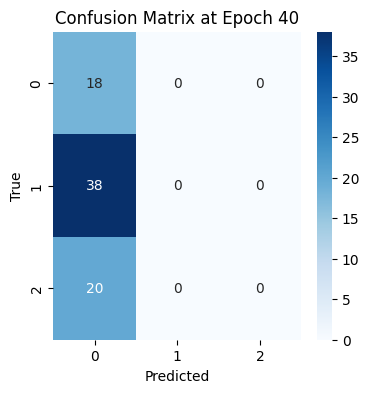

3/3 [==============================] - 0s 76ms/step
Epoch 45 Accuracy: 0.25
              precision    recall  f1-score   support

      unripe       0.24      1.00      0.39        18
     perfect       0.00      0.00      0.00        38
    overripe       1.00      0.05      0.10        20

    accuracy                           0.25        76
   macro avg       0.41      0.35      0.16        76
weighted avg       0.32      0.25      0.12        76



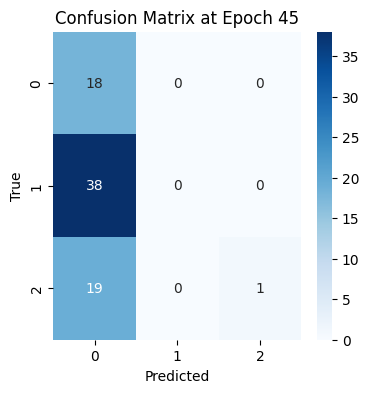

3/3 [==============================] - 0s 76ms/step
Epoch 50 Accuracy: 0.27631578947368424
              precision    recall  f1-score   support

      unripe       0.26      1.00      0.41        18
     perfect       0.40      0.05      0.09        38
    overripe       1.00      0.05      0.10        20

    accuracy                           0.28        76
   macro avg       0.55      0.37      0.20        76
weighted avg       0.52      0.28      0.17        76



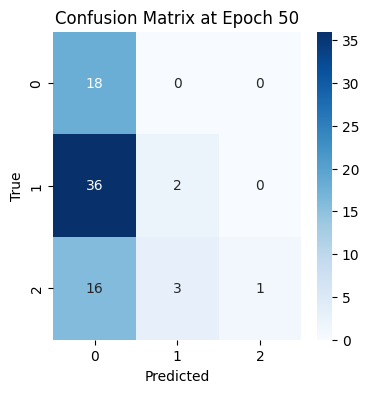

3/3 [==============================] - 0s 77ms/step
Epoch 55 Accuracy: 0.40789473684210525
              precision    recall  f1-score   support

      unripe       0.80      0.67      0.73        18
     perfect       0.00      0.00      0.00        38
    overripe       0.31      0.95      0.47        20

    accuracy                           0.41        76
   macro avg       0.37      0.54      0.40        76
weighted avg       0.27      0.41      0.30        76



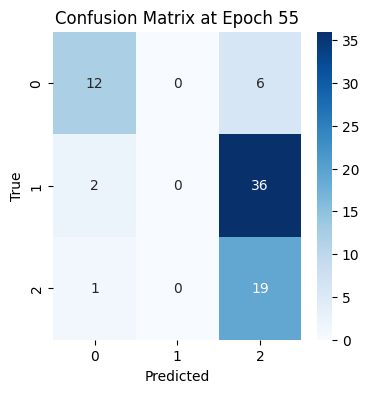

3/3 [==============================] - 0s 75ms/step
Epoch 60 Accuracy: 0.27631578947368424
              precision    recall  f1-score   support

      unripe       0.25      1.00      0.40        18
     perfect       1.00      0.03      0.05        38
    overripe       1.00      0.10      0.18        20

    accuracy                           0.28        76
   macro avg       0.75      0.38      0.21        76
weighted avg       0.82      0.28      0.17        76



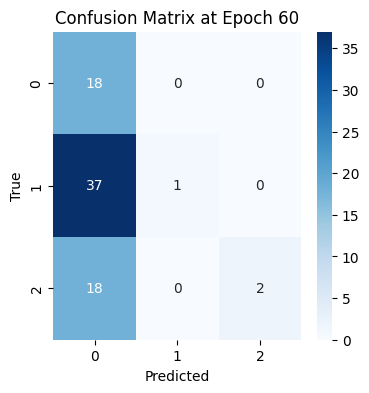

3/3 [==============================] - 0s 76ms/step
Epoch 65 Accuracy: 0.4605263157894737
              precision    recall  f1-score   support

      unripe       0.33      1.00      0.50        18
     perfect       0.69      0.29      0.41        38
    overripe       1.00      0.30      0.46        20

    accuracy                           0.46        76
   macro avg       0.67      0.53      0.46        76
weighted avg       0.69      0.46      0.44        76



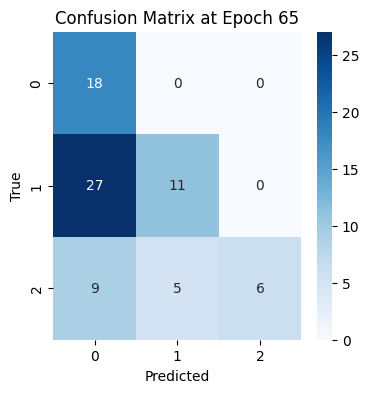

3/3 [==============================] - 0s 77ms/step
Epoch 70 Accuracy: 0.42105263157894735
              precision    recall  f1-score   support

      unripe       0.75      0.67      0.71        18
     perfect       1.00      0.05      0.10        38
    overripe       0.31      0.90      0.46        20

    accuracy                           0.42        76
   macro avg       0.69      0.54      0.42        76
weighted avg       0.76      0.42      0.34        76



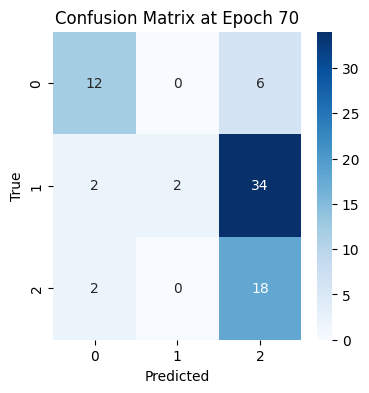

3/3 [==============================] - 0s 85ms/step
Epoch 75 Accuracy: 0.39473684210526316
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        18
     perfect       0.58      0.39      0.47        38
    overripe       0.30      0.75      0.43        20

    accuracy                           0.39        76
   macro avg       0.29      0.38      0.30        76
weighted avg       0.37      0.39      0.35        76



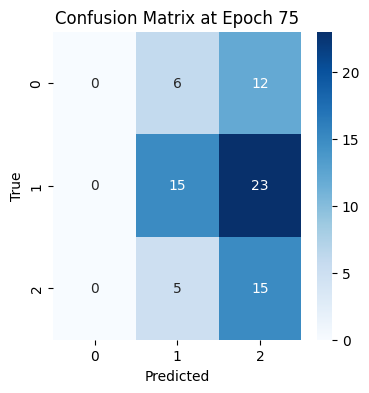

3/3 [==============================] - 0s 78ms/step
Epoch 80 Accuracy: 0.2631578947368421
              precision    recall  f1-score   support

      unripe       0.26      1.00      0.41        18
     perfect       0.33      0.05      0.09        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.26        76
   macro avg       0.20      0.35      0.17        76
weighted avg       0.23      0.26      0.14        76



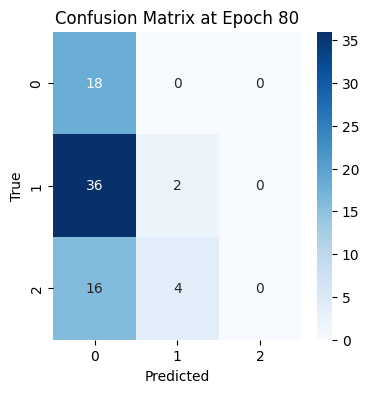

3/3 [==============================] - 0s 76ms/step
Epoch 85 Accuracy: 0.4605263157894737
              precision    recall  f1-score   support

      unripe       0.38      1.00      0.55        18
     perfect       0.59      0.45      0.51        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.46        76
   macro avg       0.32      0.48      0.35        76
weighted avg       0.38      0.46      0.38        76



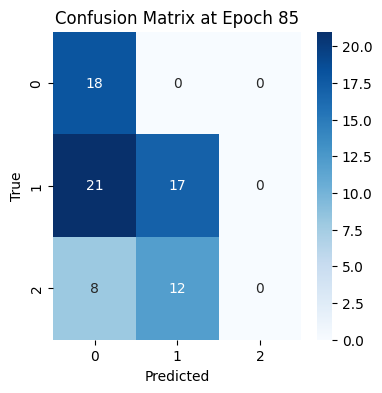

3/3 [==============================] - 0s 76ms/step
Epoch 90 Accuracy: 0.5
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        18
     perfect       0.50      1.00      0.67        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.50        76
   macro avg       0.17      0.33      0.22        76
weighted avg       0.25      0.50      0.33        76



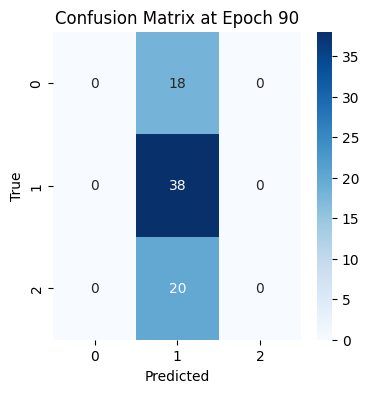

3/3 [==============================] - 0s 76ms/step
Epoch 95 Accuracy: 0.5526315789473685
              precision    recall  f1-score   support

      unripe       0.49      1.00      0.65        18
     perfect       0.61      0.61      0.61        38
    overripe       1.00      0.05      0.10        20

    accuracy                           0.55        76
   macro avg       0.70      0.55      0.45        76
weighted avg       0.68      0.55      0.48        76



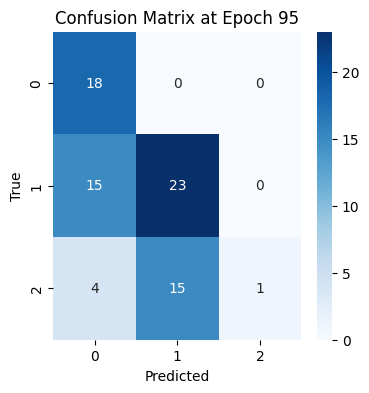

3/3 [==============================] - 0s 77ms/step
Epoch 100 Accuracy: 0.3026315789473684
              precision    recall  f1-score   support

      unripe       0.67      0.22      0.33        18
     perfect       0.00      0.00      0.00        38
    overripe       0.27      0.95      0.42        20

    accuracy                           0.30        76
   macro avg       0.31      0.39      0.25        76
weighted avg       0.23      0.30      0.19        76



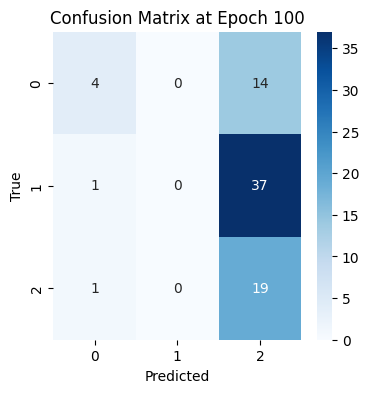

3/3 [==============================] - 0s 75ms/step
Epoch 105 Accuracy: 0.35526315789473684
              precision    recall  f1-score   support

      unripe       0.29      1.00      0.44        18
     perfect       0.50      0.08      0.14        38
    overripe       0.86      0.30      0.44        20

    accuracy                           0.36        76
   macro avg       0.55      0.46      0.34        76
weighted avg       0.54      0.36      0.29        76



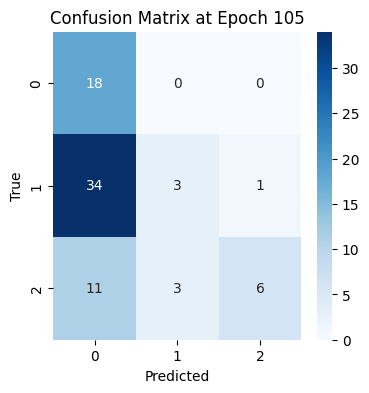

3/3 [==============================] - 0s 75ms/step
Epoch 110 Accuracy: 0.4473684210526316
              precision    recall  f1-score   support

      unripe       0.50      0.89      0.64        18
     perfect       0.00      0.00      0.00        38
    overripe       0.41      0.90      0.56        20

    accuracy                           0.45        76
   macro avg       0.30      0.60      0.40        76
weighted avg       0.23      0.45      0.30        76



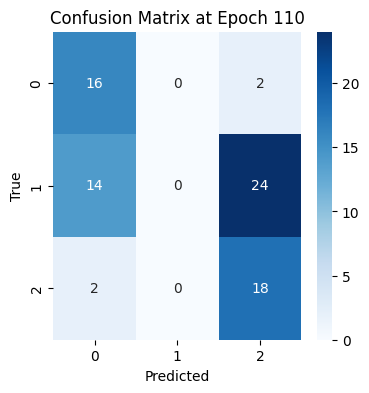

3/3 [==============================] - 0s 76ms/step
Epoch 115 Accuracy: 0.5263157894736842
              precision    recall  f1-score   support

      unripe       0.46      0.94      0.62        18
     perfect       0.57      0.55      0.56        38
    overripe       1.00      0.10      0.18        20

    accuracy                           0.53        76
   macro avg       0.68      0.53      0.45        76
weighted avg       0.66      0.53      0.47        76



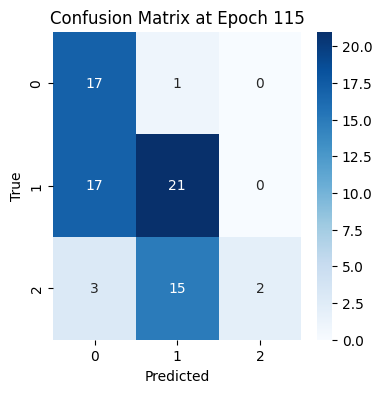

3/3 [==============================] - 0s 76ms/step
Epoch 120 Accuracy: 0.4868421052631579
              precision    recall  f1-score   support

      unripe       0.36      0.89      0.52        18
     perfect       0.73      0.21      0.33        38
    overripe       0.62      0.65      0.63        20

    accuracy                           0.49        76
   macro avg       0.57      0.58      0.49        76
weighted avg       0.61      0.49      0.45        76



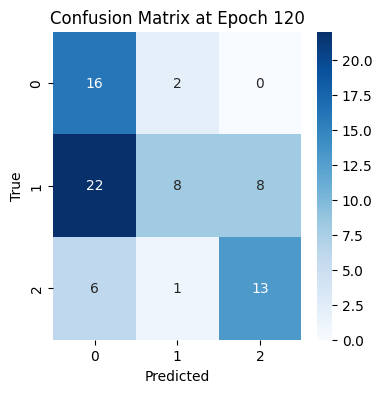

3/3 [==============================] - 0s 79ms/step
Epoch 125 Accuracy: 0.5394736842105263
              precision    recall  f1-score   support

      unripe       0.70      0.89      0.78        18
     perfect       1.00      0.18      0.31        38
    overripe       0.39      0.90      0.55        20

    accuracy                           0.54        76
   macro avg       0.70      0.66      0.55        76
weighted avg       0.77      0.54      0.48        76



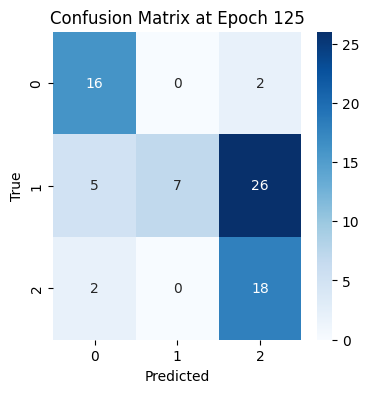

3/3 [==============================] - 0s 78ms/step
Epoch 130 Accuracy: 0.4473684210526316
              precision    recall  f1-score   support

      unripe       0.34      1.00      0.51        18
     perfect       0.63      0.32      0.42        38
    overripe       1.00      0.20      0.33        20

    accuracy                           0.45        76
   macro avg       0.66      0.51      0.42        76
weighted avg       0.66      0.45      0.42        76



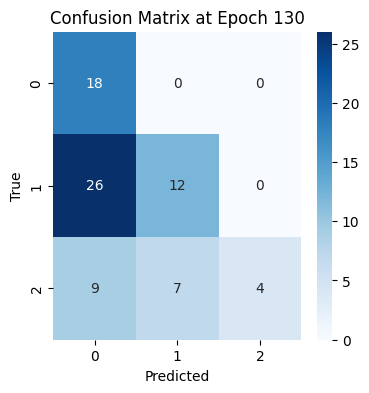

3/3 [==============================] - 0s 79ms/step
Epoch 135 Accuracy: 0.32894736842105265
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        18
     perfect       1.00      0.13      0.23        38
    overripe       0.28      1.00      0.44        20

    accuracy                           0.33        76
   macro avg       0.43      0.38      0.22        76
weighted avg       0.57      0.33      0.23        76



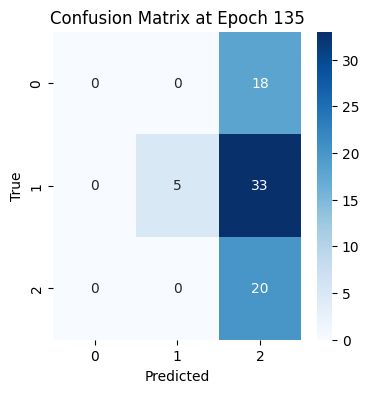

3/3 [==============================] - 0s 77ms/step
Epoch 140 Accuracy: 0.6842105263157895
              precision    recall  f1-score   support

      unripe       0.82      0.78      0.80        18
     perfect       0.63      0.95      0.76        38
    overripe       1.00      0.10      0.18        20

    accuracy                           0.68        76
   macro avg       0.82      0.61      0.58        76
weighted avg       0.77      0.68      0.62        76



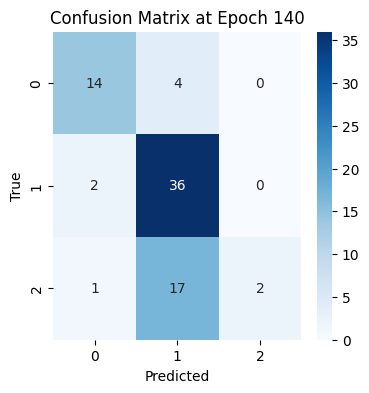

3/3 [==============================] - 0s 78ms/step
Epoch 145 Accuracy: 0.6842105263157895
              precision    recall  f1-score   support

      unripe       0.58      0.83      0.68        18
     perfect       0.73      0.92      0.81        38
    overripe       1.00      0.10      0.18        20

    accuracy                           0.68        76
   macro avg       0.77      0.62      0.56        76
weighted avg       0.76      0.68      0.62        76



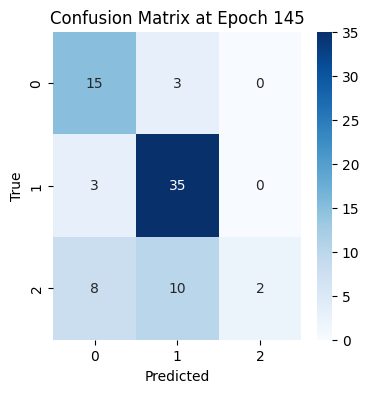

3/3 [==============================] - 0s 76ms/step
Epoch 150 Accuracy: 0.5526315789473685
              precision    recall  f1-score   support

      unripe       0.50      0.06      0.10        18
     perfect       0.71      0.63      0.67        38
    overripe       0.42      0.85      0.57        20

    accuracy                           0.55        76
   macro avg       0.54      0.51      0.44        76
weighted avg       0.58      0.55      0.51        76



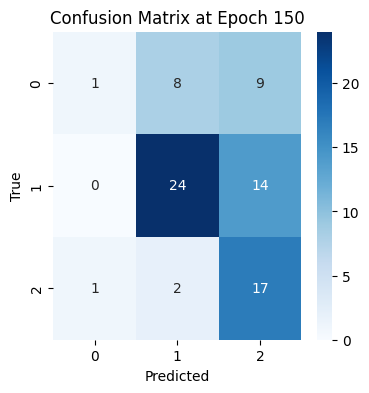

In [58]:
x, y = all_kiwi_nir_datagen.__getitem__(0)
y = y.numpy()
for i in range(5,151,5):
    kiwi_nir_msdcnn2.load_weights(working_dir + 'KIWI_NIR_MSDCNN2_checkpoints/MSDCNN2' + str(i).zfill(4) + '.ckpt')
    y_pred = kiwi_nir_msdcnn2.predict(x)
    y_pred = np.argmax(y_pred, axis=1)
    print(f"Epoch {i} Accuracy: {np.mean(y_pred == y)}")
    # print recall and precision and f1 score
    print(classification_report(y, y_pred, target_names=ripeness_state_dict.keys(), zero_division=0))
    # plot confusion matrix
    cm = confusion_matrix(y, y_pred)
    plt.figure(figsize=(4, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'Confusion Matrix at Epoch {i}')
    plt.show()

### MSDCNN3

Approach 3 : Using different kernels for the different spectral bands and then concatenating the output of the different kernels to get the final prediction.

In [54]:
def build_MSDCNN3(input_shape):
    # Input Layer
    input_layer = Input(shape=input_shape)

    # Fine Scale Path
    a = DepthwiseConv2D(kernel_size=(1, 1), strides=(1, 1), padding='same')(input_layer)
    a = BatchNormalization()(a)
    a = ReLU()(a)

    # Medium Scale Path
    b = DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same')(input_layer)
    b = BatchNormalization()(b)
    b = ReLU()(b)

    # Coarse Scale Path
    c = DepthwiseConv2D(kernel_size=(5, 5), strides=(1, 1), padding='same')(input_layer)
    c = BatchNormalization()(c)
    c = ReLU()(c)

    # Feature Fusion
    x = concatenate([a, b, c])

    # Additional Layers
    x = DepthwiseConv2D(kernel_size=(1, 1), padding='same')(x)
    x = BatchNormalization()(x)
    x = ReLU()(x)

    # Global Average Pooling
    x = GlobalAveragePooling2D()(x)

    # Output Layer
    x = Dense(3, activation='softmax')(x)

    model = keras.Model(inputs=input_layer, outputs=x)
    model.compile(optimizer=Adam(learning_rate=1e-2, beta_1=0.5), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

In [55]:
MSDCNN3 = build_MSDCNN3((64, 64, 252))
MSDCNN3.summary()

Model: "model_14"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_19 (InputLayer)          [(None, 64, 64, 252  0           []                               
                                )]                                                                
                                                                                                  
 depthwise_conv2d_54 (Depthwise  (None, 64, 64, 252)  504        ['input_19[0][0]']               
 Conv2D)                                                                                          
                                                                                                  
 depthwise_conv2d_55 (Depthwise  (None, 64, 64, 252)  2520       ['input_19[0][0]']               
 Conv2D)                                                                                   

#### Avocado Subset (NIR and VIS)

#### Kiwi Subset (NIR and VIS)

In [13]:
kiwi_nir_msdcnn3_cb = ModelCheckpoint(filepath = working_dir + 'KIWI_NIR_MSDCNN3_checkpoints/MSDCNN3{epoch:04d}.ckpt', verbose=1, save_freq='epoch', period=5, save_weights_only=True)

In [26]:
kiwi_nir_msdcnn3 = build_MSDCNN3((64, 64, 252))

In [27]:
kiwi_nir_msdcnn3.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_7 (InputLayer)           [(None, 64, 64, 252  0           []                               
                                )]                                                                
                                                                                                  
 depthwise_conv2d_19 (Depthwise  (None, 64, 64, 252)  504        ['input_7[0][0]']                
 Conv2D)                                                                                          
                                                                                                  
 depthwise_conv2d_20 (Depthwise  (None, 64, 64, 252)  2520       ['input_7[0][0]']                
 Conv2D)                                                                                    

In [29]:
kiwi_nir_msdcnn3.fit(train_kiwi_NIR_datagen, epochs=150, validation_data=val_kiwi_NIR_datagen, callbacks=[kiwi_nir_msdcnn3_cb], use_multiprocessing=True)

unique classes: [1 0 2]
class 1 is already balanced
class 0 is already balanced
class 2 is already balanced
Epoch 1/150
6/6 [==============================] - ETA: 0s - loss: 1.5342 - accuracy: 0.4074unique classes: [2 0 1]
class 2 is already balanced
class 0 is already balanced
class 1 is already balanced
6/6 [==============================] - 52s 6s/step - loss: 1.5342 - accuracy: 0.4074 - val_loss: 1.0967 - val_accuracy: 0.3333
Epoch 2/150
6/6 [==============================] - 35s 5s/step - loss: 0.9948 - accuracy: 0.5370 - val_loss: 1.0951 - val_accuracy: 0.3333
Epoch 3/150
6/6 [==============================] - 84s 12s/step - loss: 0.9368 - accuracy: 0.5000 - val_loss: 1.0926 - val_accuracy: 0.3333
Epoch 4/150
6/6 [==============================] - 32s 4s/step - loss: 0.7573 - accuracy: 0.6667 - val_loss: 1.0861 - val_accuracy: 0.3333
Epoch 5/150
6/6 [==============================] - ETA: 0s - loss: 0.7374 - accuracy: 0.6852
Epoch 5: saving model to C:/Users/aabde/OneDrive - Her

evaluate model on test dataset

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 48ms/step
Epoch 5 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.33      1.00      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



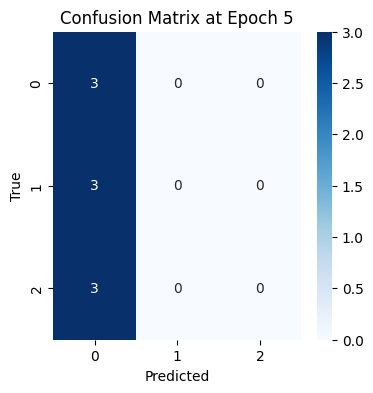

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 1s 1s/step
Epoch 10 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       1.00      0.33      0.50         3
     perfect       0.38      1.00      0.55         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.46      0.44      0.35         9
weighted avg       0.46      0.44      0.35         9



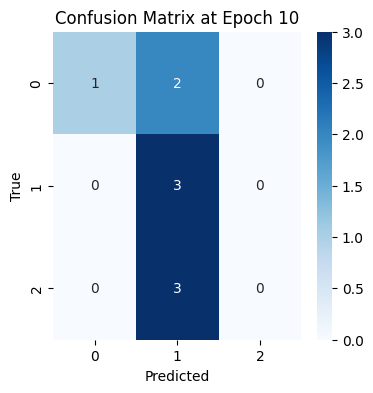

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 64ms/step
Epoch 15 Accuracy: 0.2222222222222222
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.29      0.67      0.40         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.22         9
   macro avg       0.10      0.22      0.13         9
weighted avg       0.10      0.22      0.13         9



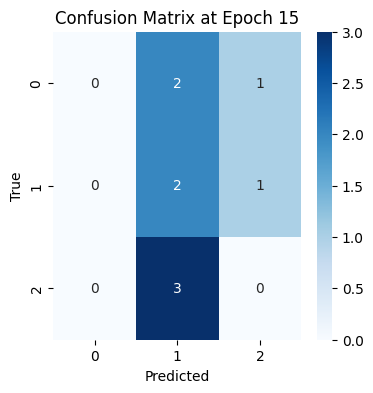

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 53ms/step
Epoch 20 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.00      0.00      0.00         3
    overripe       0.33      1.00      0.50         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



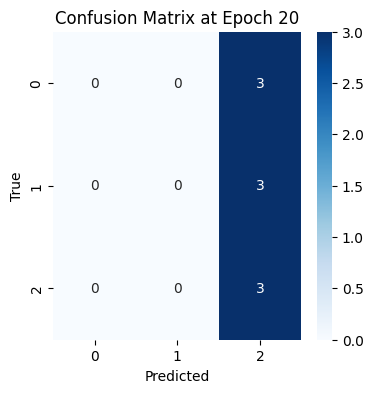

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 46ms/step
Epoch 25 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.50      0.33      0.40         3
     perfect       0.40      0.67      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.30      0.33      0.30         9
weighted avg       0.30      0.33      0.30         9



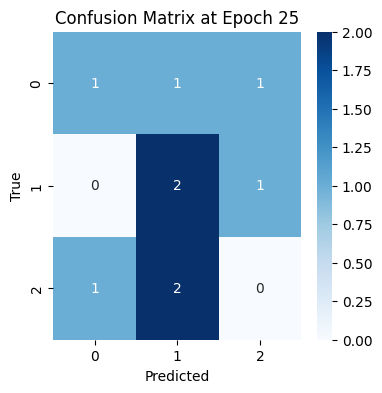

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 42ms/step
Epoch 30 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.38      1.00      0.55         3
     perfect       0.00      0.00      0.00         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.12      0.33      0.18         9
weighted avg       0.12      0.33      0.18         9



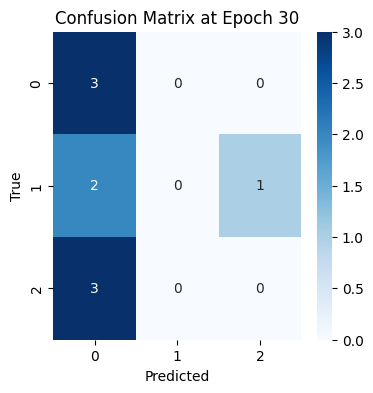

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 62ms/step
Epoch 35 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.38      1.00      0.55         3
     perfect       0.00      0.00      0.00         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.12      0.33      0.18         9
weighted avg       0.12      0.33      0.18         9



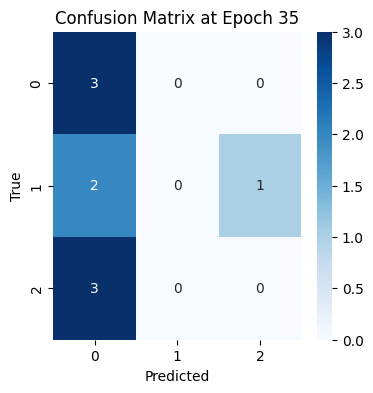

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 46ms/step
Epoch 40 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.38      1.00      0.55         3
     perfect       0.00      0.00      0.00         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.12      0.33      0.18         9
weighted avg       0.12      0.33      0.18         9



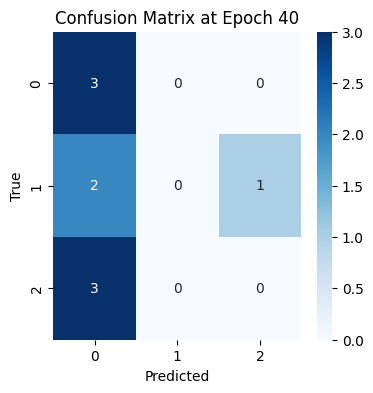

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 41ms/step
Epoch 45 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.60      1.00      0.75         3
     perfect       0.50      0.67      0.57         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.56         9
   macro avg       0.37      0.56      0.44         9
weighted avg       0.37      0.56      0.44         9



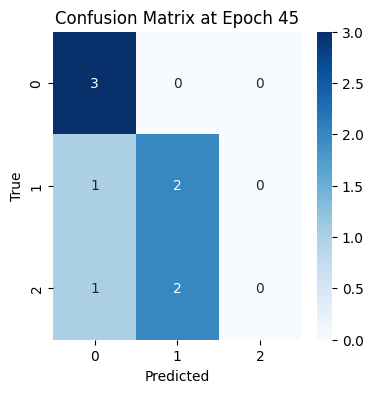

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 46ms/step
Epoch 50 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.33      1.00      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



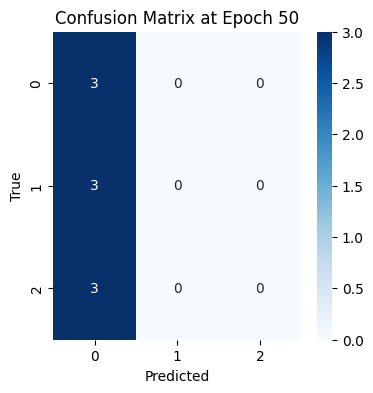

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 44ms/step
Epoch 55 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       1.00      0.33      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.38      1.00      0.55         3

    accuracy                           0.44         9
   macro avg       0.46      0.44      0.35         9
weighted avg       0.46      0.44      0.35         9



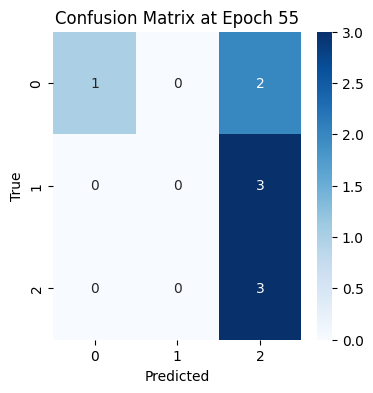

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 48ms/step
Epoch 60 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.50      0.67      0.57         3
     perfect       0.00      0.00      0.00         3
    overripe       0.40      0.67      0.50         3

    accuracy                           0.44         9
   macro avg       0.30      0.44      0.36         9
weighted avg       0.30      0.44      0.36         9



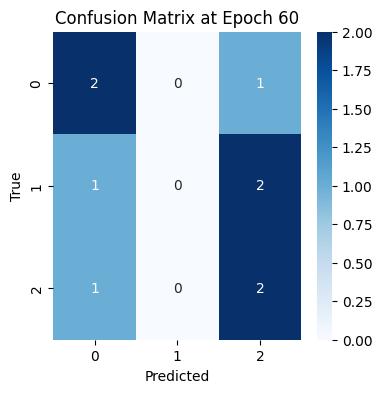

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 44ms/step
Epoch 65 Accuracy: 0.2222222222222222
              precision    recall  f1-score   support

      unripe       0.29      0.67      0.40         3
     perfect       0.00      0.00      0.00         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.22         9
   macro avg       0.10      0.22      0.13         9
weighted avg       0.10      0.22      0.13         9



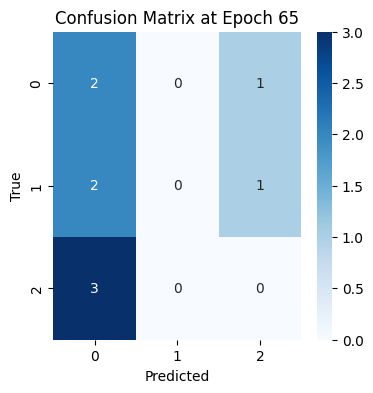

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 43ms/step
Epoch 70 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.38      1.00      0.55         3
     perfect       0.00      0.00      0.00         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.12      0.33      0.18         9
weighted avg       0.12      0.33      0.18         9



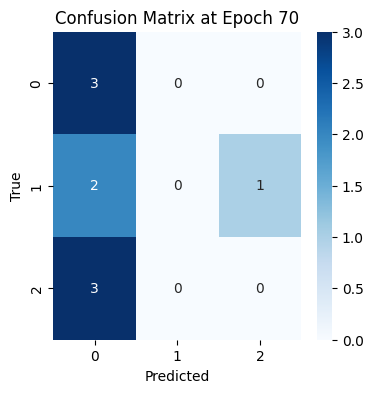

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 50ms/step
Epoch 75 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.67      0.67      0.67         3
     perfect       0.00      0.00      0.00         3
    overripe       0.50      1.00      0.67         3

    accuracy                           0.56         9
   macro avg       0.39      0.56      0.44         9
weighted avg       0.39      0.56      0.44         9



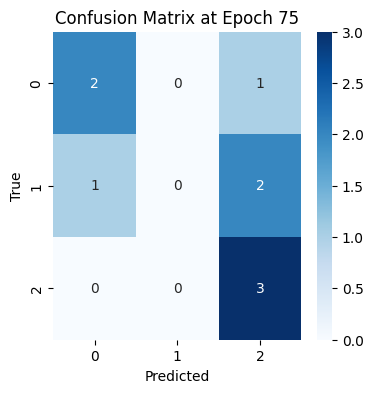

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 43ms/step
Epoch 80 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       1.00      0.33      0.50         3
     perfect       0.40      0.67      0.50         3
    overripe       0.33      0.33      0.33         3

    accuracy                           0.44         9
   macro avg       0.58      0.44      0.44         9
weighted avg       0.58      0.44      0.44         9



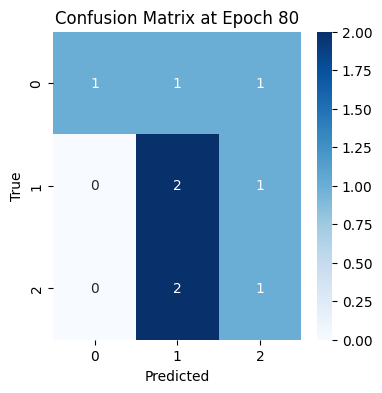

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 49ms/step
Epoch 85 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       1.00      0.33      0.50         3
     perfect       0.40      0.67      0.50         3
    overripe       0.33      0.33      0.33         3

    accuracy                           0.44         9
   macro avg       0.58      0.44      0.44         9
weighted avg       0.58      0.44      0.44         9



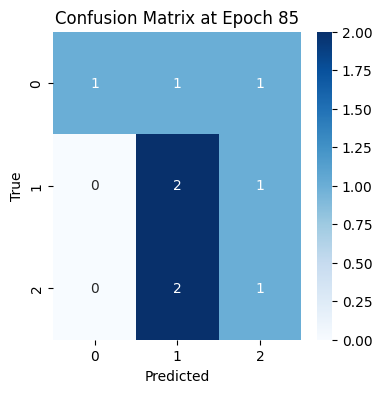

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 45ms/step
Epoch 90 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.67      0.67      0.67         3
     perfect       0.25      0.33      0.29         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.31      0.33      0.32         9
weighted avg       0.31      0.33      0.32         9



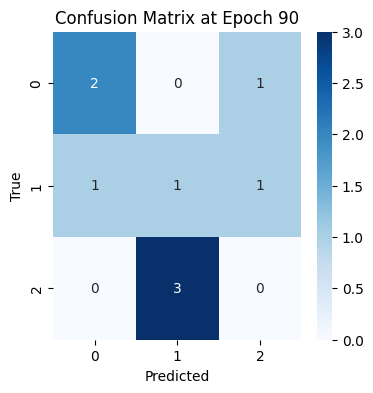

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 45ms/step
Epoch 95 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       1.00      0.33      0.50         3
     perfect       0.50      0.67      0.57         3
    overripe       0.25      0.33      0.29         3

    accuracy                           0.44         9
   macro avg       0.58      0.44      0.45         9
weighted avg       0.58      0.44      0.45         9



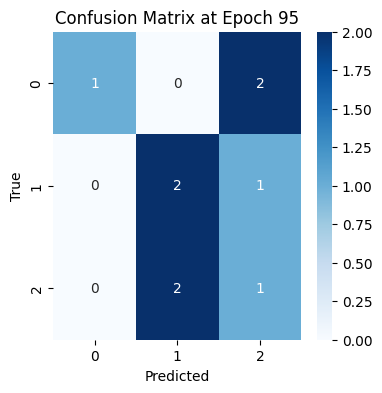

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 43ms/step
Epoch 100 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       1.00      0.67      0.80         3
     perfect       0.50      1.00      0.67         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.56         9
   macro avg       0.50      0.56      0.49         9
weighted avg       0.50      0.56      0.49         9



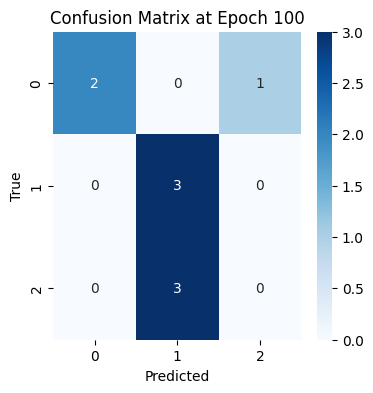

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 63ms/step
Epoch 105 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       1.00      0.33      0.50         3
     perfect       0.40      0.67      0.50         3
    overripe       0.33      0.33      0.33         3

    accuracy                           0.44         9
   macro avg       0.58      0.44      0.44         9
weighted avg       0.58      0.44      0.44         9



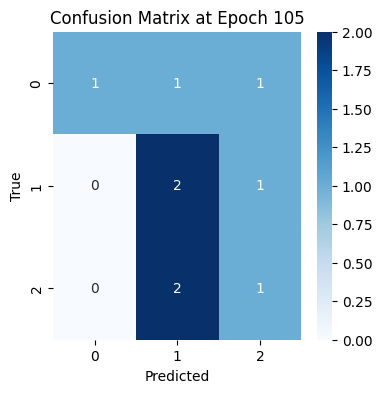

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 43ms/step
Epoch 110 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       1.00      0.33      0.50         3
     perfect       0.43      1.00      0.60         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.48      0.44      0.37         9
weighted avg       0.48      0.44      0.37         9



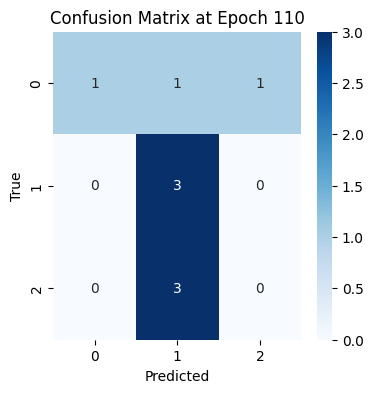

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 50ms/step
Epoch 115 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       1.00      0.33      0.50         3
     perfect       0.43      1.00      0.60         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.48      0.44      0.37         9
weighted avg       0.48      0.44      0.37         9



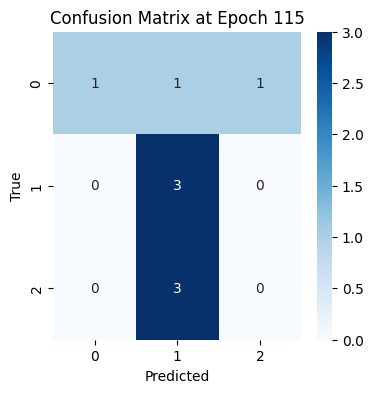

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 49ms/step
Epoch 120 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.40      0.67      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.25      0.33      0.29         3

    accuracy                           0.33         9
   macro avg       0.22      0.33      0.26         9
weighted avg       0.22      0.33      0.26         9



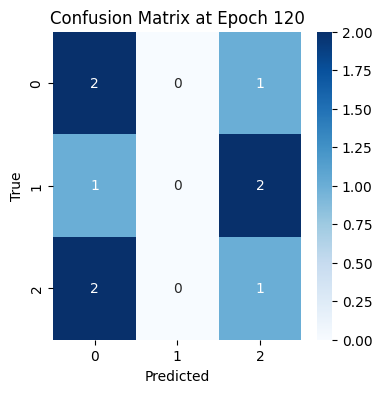

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 44ms/step
Epoch 125 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       1.00      0.33      0.50         3
     perfect       0.43      1.00      0.60         3
    overripe       1.00      0.33      0.50         3

    accuracy                           0.56         9
   macro avg       0.81      0.56      0.53         9
weighted avg       0.81      0.56      0.53         9



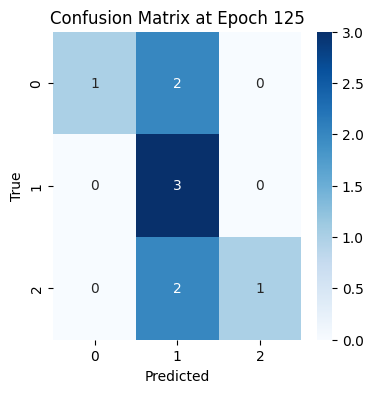

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 52ms/step
Epoch 130 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.33      0.67      0.44         3
     perfect       1.00      0.33      0.50         3
    overripe       0.50      0.33      0.40         3

    accuracy                           0.44         9
   macro avg       0.61      0.44      0.45         9
weighted avg       0.61      0.44      0.45         9



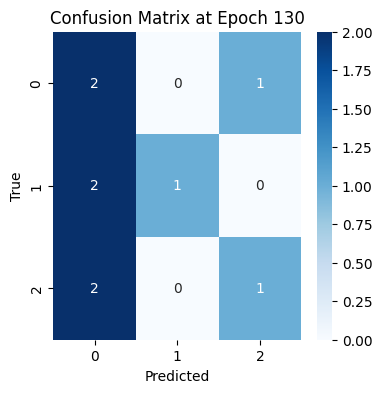

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 44ms/step
Epoch 135 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.00      0.00      0.00         3
    overripe       0.33      1.00      0.50         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



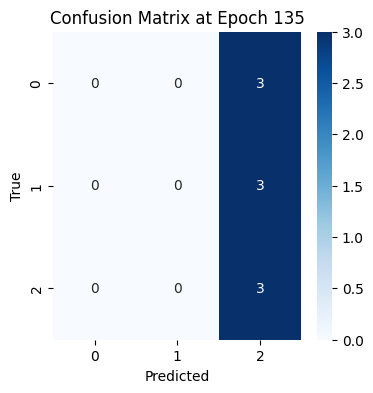

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 50ms/step
Epoch 140 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.00      0.00      0.00         3
    overripe       0.33      1.00      0.50         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



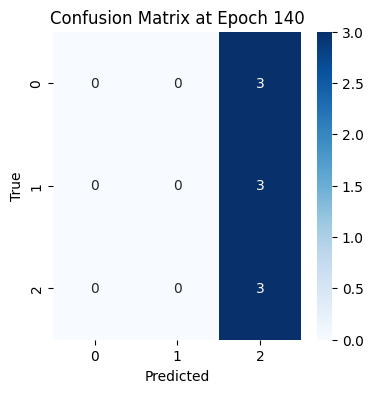

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 48ms/step
Epoch 145 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.40      0.67      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.25      0.33      0.29         3

    accuracy                           0.33         9
   macro avg       0.22      0.33      0.26         9
weighted avg       0.22      0.33      0.26         9



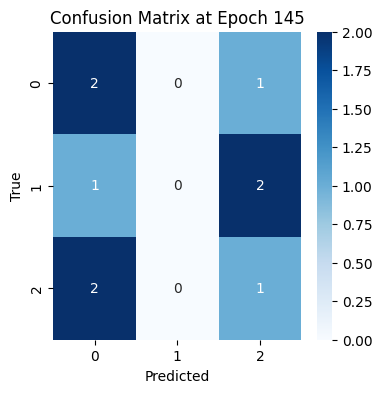

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 53ms/step
Epoch 150 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.33      0.67      0.44         3
     perfect       0.00      0.00      0.00         3
    overripe       0.33      0.33      0.33         3

    accuracy                           0.33         9
   macro avg       0.22      0.33      0.26         9
weighted avg       0.22      0.33      0.26         9



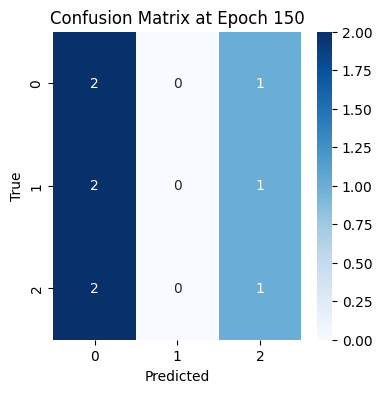

In [34]:
for i in range(5,151,5):
    kiwi_nir_msdcnn3.load_weights(working_dir + 'KIWI_NIR_MSDCNN3_checkpoints/MSDCNN3' + str(i).zfill(4) + '.ckpt')
    x, y = test_kiwi_NIR_datagen.__getitem__(0)
    y_pred = kiwi_nir_msdcnn3.predict(x)
    y_pred = np.argmax(y_pred, axis=1)
    y = y.numpy()
    print(f"Epoch {i} Accuracy: {np.mean(y_pred == y)}")
    # print recall and precision and f1 score
    print(classification_report(y, y_pred, target_names=ripeness_state_dict.keys(), zero_division=0))
    # plot confusion matrix
    cm = confusion_matrix(y, y_pred)
    plt.figure(figsize=(4, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'Confusion Matrix at Epoch {i}')
    plt.show()

evaluate model on entire dataset

3/3 [==============================] - 0s 67ms/step
Epoch 5 Accuracy: 0.23684210526315788
              precision    recall  f1-score   support

      unripe       0.24      1.00      0.38        18
     perfect       0.00      0.00      0.00        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.24        76
   macro avg       0.08      0.33      0.13        76
weighted avg       0.06      0.24      0.09        76



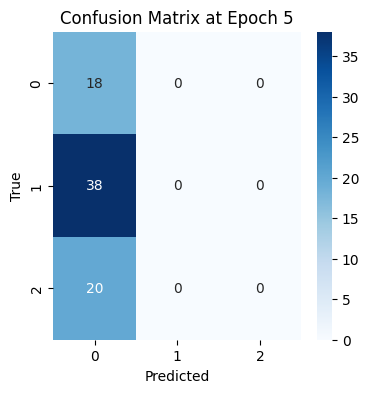

3/3 [==============================] - 0s 57ms/step
Epoch 10 Accuracy: 0.5657894736842105
              precision    recall  f1-score   support

      unripe       0.67      0.33      0.44        18
     perfect       0.55      0.97      0.70        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.57        76
   macro avg       0.41      0.44      0.38        76
weighted avg       0.43      0.57      0.46        76



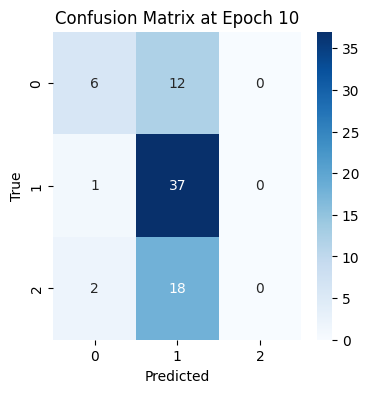

3/3 [==============================] - 0s 62ms/step
Epoch 15 Accuracy: 0.5131578947368421
              precision    recall  f1-score   support

      unripe       0.67      0.22      0.33        18
     perfect       0.52      0.87      0.65        38
    overripe       0.29      0.10      0.15        20

    accuracy                           0.51        76
   macro avg       0.49      0.40      0.38        76
weighted avg       0.49      0.51      0.44        76



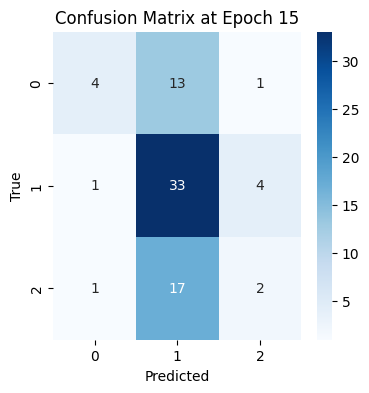

3/3 [==============================] - 0s 60ms/step
Epoch 20 Accuracy: 0.3157894736842105
              precision    recall  f1-score   support

      unripe       1.00      0.11      0.20        18
     perfect       1.00      0.05      0.10        38
    overripe       0.28      1.00      0.43        20

    accuracy                           0.32        76
   macro avg       0.76      0.39      0.24        76
weighted avg       0.81      0.32      0.21        76



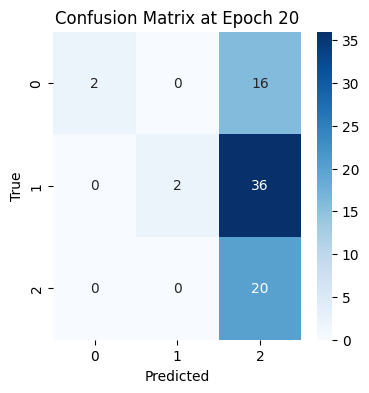

3/3 [==============================] - 0s 59ms/step
Epoch 25 Accuracy: 0.5263157894736842
              precision    recall  f1-score   support

      unripe       0.48      0.61      0.54        18
     perfect       0.58      0.76      0.66        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.53        76
   macro avg       0.35      0.46      0.40        76
weighted avg       0.40      0.53      0.46        76



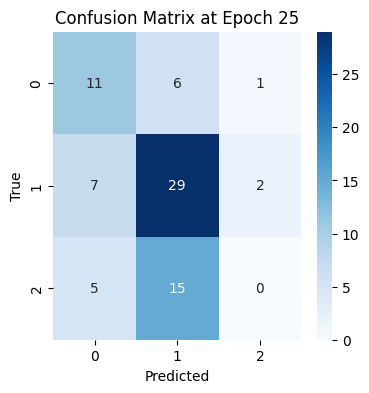

3/3 [==============================] - 0s 59ms/step
Epoch 30 Accuracy: 0.25
              precision    recall  f1-score   support

      unripe       0.27      0.94      0.41        18
     perfect       0.00      0.00      0.00        38
    overripe       0.17      0.10      0.12        20

    accuracy                           0.25        76
   macro avg       0.14      0.35      0.18        76
weighted avg       0.11      0.25      0.13        76



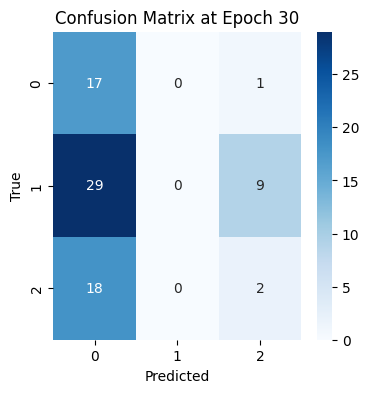

3/3 [==============================] - 0s 58ms/step
Epoch 35 Accuracy: 0.23684210526315788
              precision    recall  f1-score   support

      unripe       0.25      1.00      0.40        18
     perfect       0.00      0.00      0.00        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.24        76
   macro avg       0.08      0.33      0.13        76
weighted avg       0.06      0.24      0.09        76



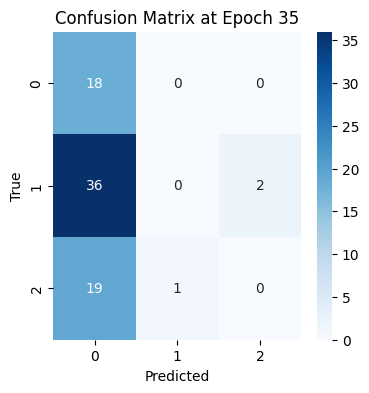

3/3 [==============================] - 0s 58ms/step
Epoch 40 Accuracy: 0.39473684210526316
              precision    recall  f1-score   support

      unripe       0.33      1.00      0.49        18
     perfect       0.63      0.32      0.42        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.39        76
   macro avg       0.32      0.44      0.30        76
weighted avg       0.39      0.39      0.33        76



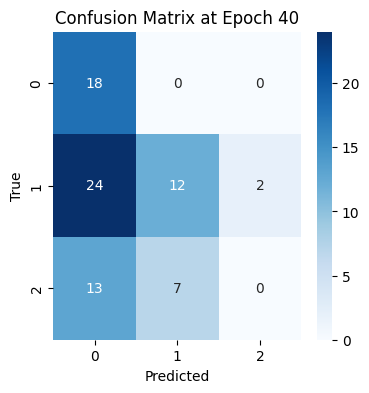

3/3 [==============================] - 0s 58ms/step
Epoch 45 Accuracy: 0.5394736842105263
              precision    recall  f1-score   support

      unripe       0.45      1.00      0.62        18
     perfect       0.64      0.61      0.62        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.54        76
   macro avg       0.36      0.54      0.41        76
weighted avg       0.43      0.54      0.46        76



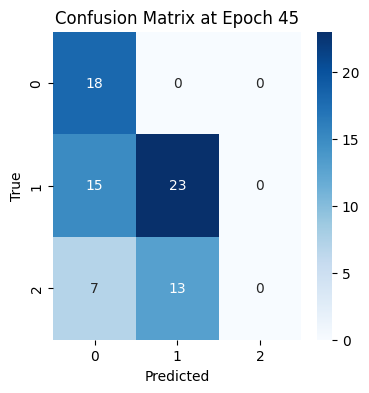

3/3 [==============================] - 0s 56ms/step
Epoch 50 Accuracy: 0.2631578947368421
              precision    recall  f1-score   support

      unripe       0.26      1.00      0.41        18
     perfect       0.33      0.03      0.05        38
    overripe       0.33      0.05      0.09        20

    accuracy                           0.26        76
   macro avg       0.31      0.36      0.18        76
weighted avg       0.32      0.26      0.14        76



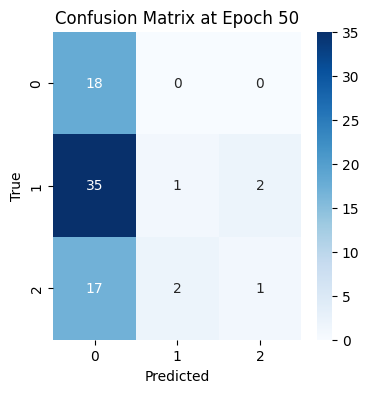

3/3 [==============================] - 0s 57ms/step
Epoch 55 Accuracy: 0.3815789473684211
              precision    recall  f1-score   support

      unripe       0.75      0.50      0.60        18
     perfect       0.00      0.00      0.00        38
    overripe       0.31      1.00      0.48        20

    accuracy                           0.38        76
   macro avg       0.35      0.50      0.36        76
weighted avg       0.26      0.38      0.27        76



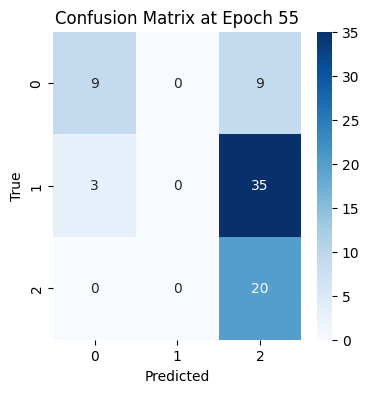

3/3 [==============================] - 0s 58ms/step
Epoch 60 Accuracy: 0.4473684210526316
              precision    recall  f1-score   support

      unripe       0.46      0.94      0.62        18
     perfect       0.00      0.00      0.00        38
    overripe       0.44      0.85      0.58        20

    accuracy                           0.45        76
   macro avg       0.30      0.60      0.40        76
weighted avg       0.22      0.45      0.30        76



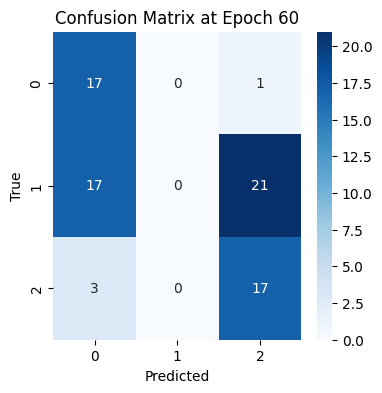

3/3 [==============================] - 0s 59ms/step
Epoch 65 Accuracy: 0.3815789473684211
              precision    recall  f1-score   support

      unripe       0.33      0.94      0.49        18
     perfect       0.00      0.00      0.00        38
    overripe       0.50      0.60      0.55        20

    accuracy                           0.38        76
   macro avg       0.28      0.51      0.34        76
weighted avg       0.21      0.38      0.26        76



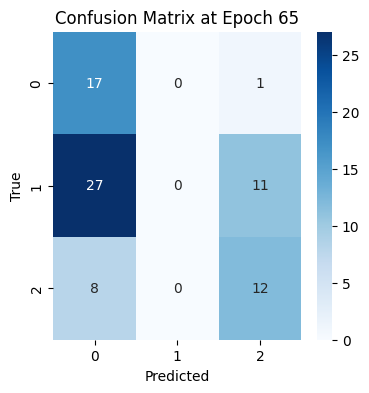

3/3 [==============================] - 0s 58ms/step
Epoch 70 Accuracy: 0.34210526315789475
              precision    recall  f1-score   support

      unripe       0.28      1.00      0.43        18
     perfect       0.00      0.00      0.00        38
    overripe       0.73      0.40      0.52        20

    accuracy                           0.34        76
   macro avg       0.33      0.47      0.32        76
weighted avg       0.26      0.34      0.24        76



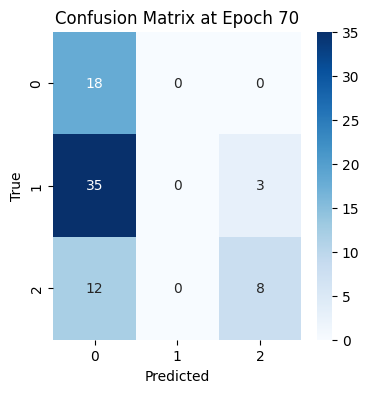

3/3 [==============================] - 0s 60ms/step
Epoch 75 Accuracy: 0.40789473684210525
              precision    recall  f1-score   support

      unripe       0.73      0.61      0.67        18
     perfect       0.00      0.00      0.00        38
    overripe       0.33      1.00      0.49        20

    accuracy                           0.41        76
   macro avg       0.35      0.54      0.39        76
weighted avg       0.26      0.41      0.29        76



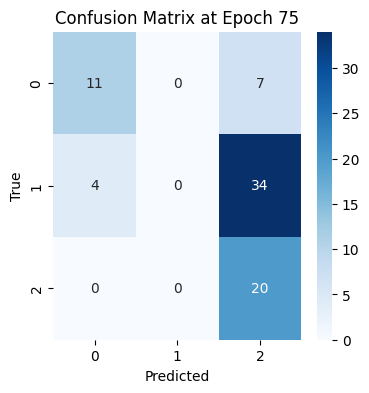

3/3 [==============================] - 0s 59ms/step
Epoch 80 Accuracy: 0.7105263157894737
              precision    recall  f1-score   support

      unripe       1.00      0.28      0.43        18
     perfect       0.65      0.95      0.77        38
    overripe       0.81      0.65      0.72        20

    accuracy                           0.71        76
   macro avg       0.82      0.63      0.64        76
weighted avg       0.78      0.71      0.68        76



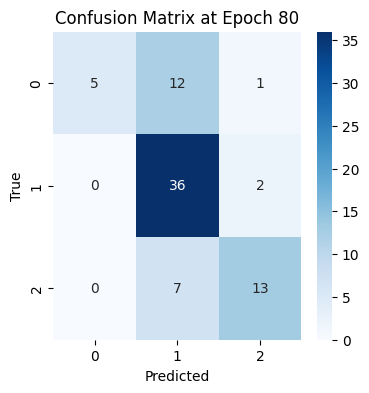

3/3 [==============================] - 0s 59ms/step
Epoch 85 Accuracy: 0.6842105263157895
              precision    recall  f1-score   support

      unripe       1.00      0.39      0.56        18
     perfect       0.67      0.79      0.72        38
    overripe       0.62      0.75      0.68        20

    accuracy                           0.68        76
   macro avg       0.76      0.64      0.65        76
weighted avg       0.73      0.68      0.67        76



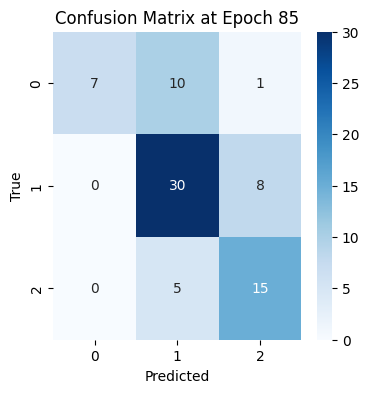

3/3 [==============================] - 0s 63ms/step
Epoch 90 Accuracy: 0.7368421052631579
              precision    recall  f1-score   support

      unripe       0.84      0.89      0.86        18
     perfect       0.70      0.87      0.78        38
    overripe       0.70      0.35      0.47        20

    accuracy                           0.74        76
   macro avg       0.75      0.70      0.70        76
weighted avg       0.73      0.74      0.72        76



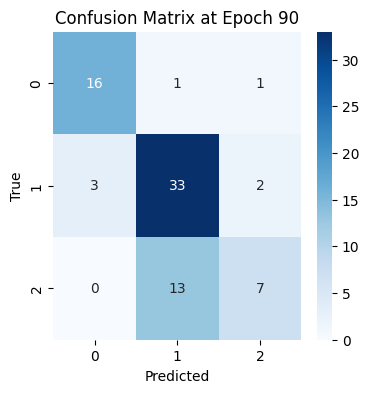

3/3 [==============================] - 0s 58ms/step
Epoch 95 Accuracy: 0.5131578947368421
              precision    recall  f1-score   support

      unripe       1.00      0.44      0.62        18
     perfect       0.81      0.34      0.48        38
    overripe       0.35      0.90      0.50        20

    accuracy                           0.51        76
   macro avg       0.72      0.56      0.53        76
weighted avg       0.73      0.51      0.52        76



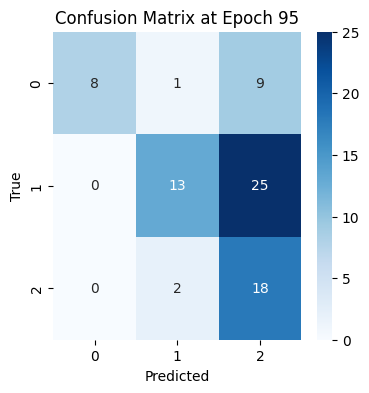

3/3 [==============================] - 0s 58ms/step
Epoch 100 Accuracy: 0.7894736842105263
              precision    recall  f1-score   support

      unripe       1.00      0.78      0.88        18
     perfect       0.72      1.00      0.84        38
    overripe       0.89      0.40      0.55        20

    accuracy                           0.79        76
   macro avg       0.87      0.73      0.75        76
weighted avg       0.83      0.79      0.77        76



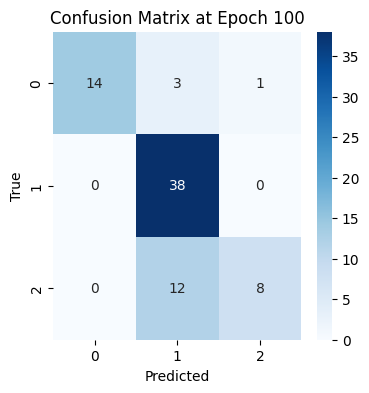

3/3 [==============================] - 0s 60ms/step
Epoch 105 Accuracy: 0.6578947368421053
              precision    recall  f1-score   support

      unripe       1.00      0.11      0.20        18
     perfect       0.62      0.89      0.73        38
    overripe       0.74      0.70      0.72        20

    accuracy                           0.66        76
   macro avg       0.79      0.57      0.55        76
weighted avg       0.74      0.66      0.60        76



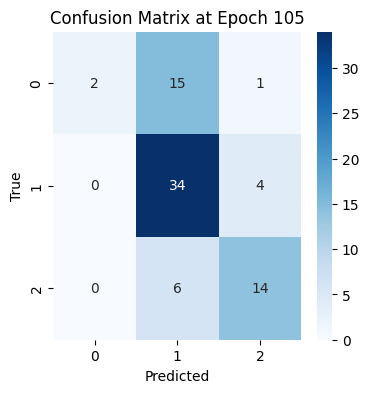

3/3 [==============================] - 0s 60ms/step
Epoch 110 Accuracy: 0.5921052631578947
              precision    recall  f1-score   support

      unripe       1.00      0.28      0.43        18
     perfect       0.56      1.00      0.72        38
    overripe       0.67      0.10      0.17        20

    accuracy                           0.59        76
   macro avg       0.74      0.46      0.44        76
weighted avg       0.69      0.59      0.51        76



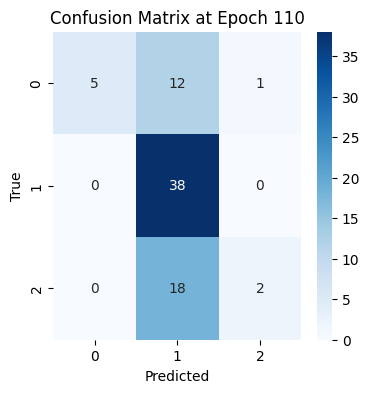

3/3 [==============================] - 0s 58ms/step
Epoch 115 Accuracy: 0.5921052631578947
              precision    recall  f1-score   support

      unripe       1.00      0.22      0.36        18
     perfect       0.56      1.00      0.72        38
    overripe       0.75      0.15      0.25        20

    accuracy                           0.59        76
   macro avg       0.77      0.46      0.44        76
weighted avg       0.71      0.59      0.51        76



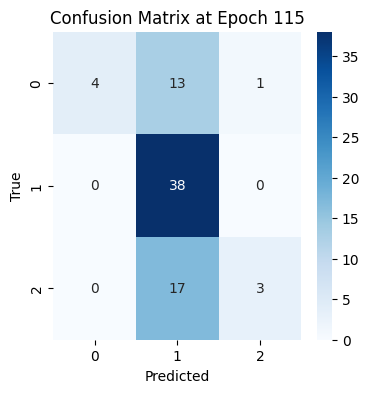

3/3 [==============================] - 0s 63ms/step
Epoch 120 Accuracy: 0.4605263157894737
              precision    recall  f1-score   support

      unripe       0.44      0.94      0.60        18
     perfect       0.00      0.00      0.00        38
    overripe       0.49      0.90      0.63        20

    accuracy                           0.46        76
   macro avg       0.31      0.61      0.41        76
weighted avg       0.23      0.46      0.31        76



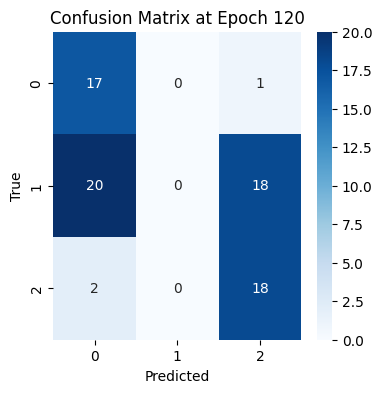

3/3 [==============================] - 0s 60ms/step
Epoch 125 Accuracy: 0.6052631578947368
              precision    recall  f1-score   support

      unripe       1.00      0.22      0.36        18
     perfect       0.56      1.00      0.72        38
    overripe       1.00      0.20      0.33        20

    accuracy                           0.61        76
   macro avg       0.85      0.47      0.47        76
weighted avg       0.78      0.61      0.53        76



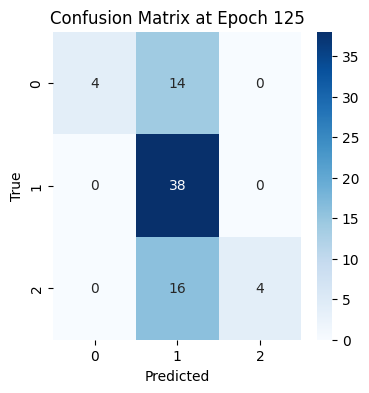

3/3 [==============================] - 0s 59ms/step
Epoch 130 Accuracy: 0.6710526315789473
              precision    recall  f1-score   support

      unripe       0.47      0.94      0.63        18
     perfect       0.91      0.55      0.69        38
    overripe       0.76      0.65      0.70        20

    accuracy                           0.67        76
   macro avg       0.72      0.72      0.67        76
weighted avg       0.77      0.67      0.68        76



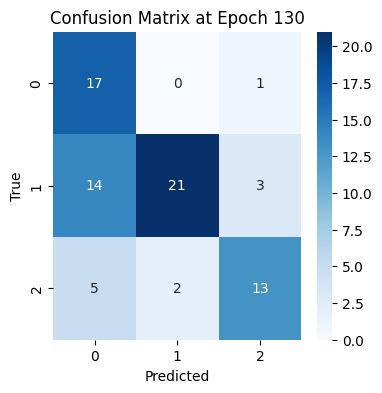

3/3 [==============================] - 0s 62ms/step
Epoch 135 Accuracy: 0.2631578947368421
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        18
     perfect       0.00      0.00      0.00        38
    overripe       0.26      1.00      0.42        20

    accuracy                           0.26        76
   macro avg       0.09      0.33      0.14        76
weighted avg       0.07      0.26      0.11        76



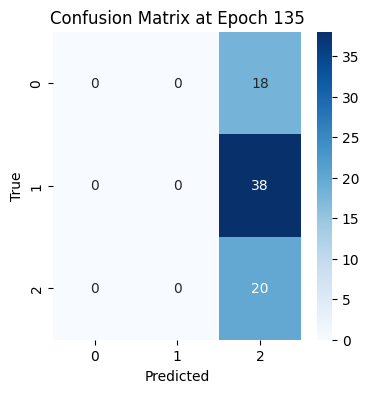

3/3 [==============================] - 0s 57ms/step
Epoch 140 Accuracy: 0.2631578947368421
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        18
     perfect       0.00      0.00      0.00        38
    overripe       0.26      1.00      0.42        20

    accuracy                           0.26        76
   macro avg       0.09      0.33      0.14        76
weighted avg       0.07      0.26      0.11        76



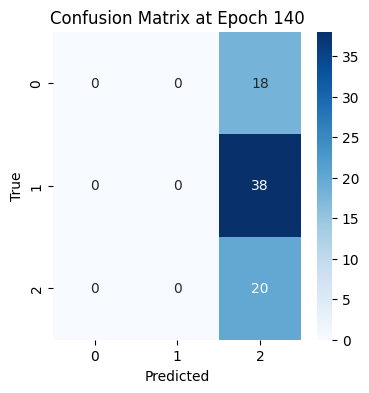

3/3 [==============================] - 0s 59ms/step
Epoch 145 Accuracy: 0.42105263157894735
              precision    recall  f1-score   support

      unripe       0.78      0.78      0.78        18
     perfect       0.00      0.00      0.00        38
    overripe       0.31      0.90      0.46        20

    accuracy                           0.42        76
   macro avg       0.36      0.56      0.41        76
weighted avg       0.27      0.42      0.31        76



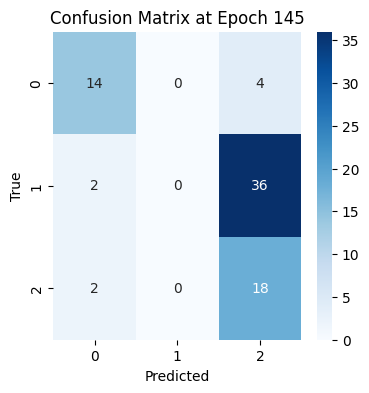

3/3 [==============================] - 0s 59ms/step
Epoch 150 Accuracy: 0.5526315789473685
              precision    recall  f1-score   support

      unripe       0.73      0.89      0.80        18
     perfect       1.00      0.21      0.35        38
    overripe       0.39      0.90      0.55        20

    accuracy                           0.55        76
   macro avg       0.71      0.67      0.56        76
weighted avg       0.78      0.55      0.51        76



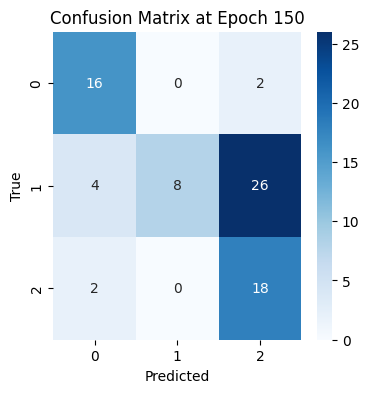

In [35]:
x, y = all_kiwi_nir_datagen.__getitem__(0)
y = y.numpy()
for i in range(5,151,5):
    kiwi_nir_msdcnn3.load_weights(working_dir + 'KIWI_NIR_MSDCNN3_checkpoints/MSDCNN3' + str(i).zfill(4) + '.ckpt')
    y_pred = kiwi_nir_msdcnn3.predict(x)
    y_pred = np.argmax(y_pred, axis=1)
    print(f"Epoch {i} Accuracy: {np.mean(y_pred == y)}")
    # print recall and precision and f1 score
    print(classification_report(y, y_pred, target_names=ripeness_state_dict.keys(), zero_division=0))
    # plot confusion matrix
    cm = confusion_matrix(y, y_pred)
    plt.figure(figsize=(4, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'Confusion Matrix at Epoch {i}')
    plt.show()

### MSDCNN4

In [14]:
def build_MSDCNN4(input_shape, depth_multiplier=3):
    # Input Layer
    input_layer = Input(shape=input_shape)

    # Fine Scale Path
    a = DepthwiseConv2D(kernel_size=(1, 1), strides=(1, 1), padding='same', use_bias=False)(input_layer)
    a = Conv2D(25, kernel_size=(1, 1), strides=(1, 1), padding='same', use_bias=True)(a)
    a = AveragePooling2D(pool_size=(4, 4), strides=(4, 4))(a)
    a = BatchNormalization()(a)
    a = ReLU()(a)
    
    # Medium Scale Path
    b = DepthwiseConv2D(kernel_size=(3, 3), strides=(1, 1), padding='same', use_bias=False)(input_layer)
    b = Conv2D(25, kernel_size=(1, 1), strides=(1, 1), padding='same', use_bias=True)(b)
    b = AveragePooling2D(pool_size=(4, 4), strides=(4, 4))(b)
    b = BatchNormalization()(b)
    b = ReLU()(b)

    # Coarse Scale Path
    c = DepthwiseConv2D(kernel_size=(5, 5), strides=(1, 1), padding='same', use_bias=False)(input_layer)
    c = Conv2D(25, kernel_size=(1, 1), strides=(1, 1), padding='same', use_bias=True)(c)
    c = AveragePooling2D(pool_size=(4, 4), strides=(4, 4))(c)
    c = BatchNormalization()(c)
    c = ReLU()(c)

    # Feature Fusion
    x = concatenate([a, b, c])  
    x = GlobalAveragePooling2D()(x)
    x = Activation('sigmoid')(x)  
    x = BatchNormalization()(x)
    x = Dense(50, use_bias=True)(x)
    x = ReLU()(x)

    # Output Layer
    x = Dense(3, activation='softmax')(x)

    model = keras.Model(inputs=input_layer, outputs=x)
    model.compile(optimizer=Adam(learning_rate=1e-2, beta_1=0.5), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

In [15]:
msdcnn4 = build_MSDCNN4((64, 64, 200))

In [16]:
msdcnn4.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 64, 64, 200  0           []                               
                                )]                                                                
                                                                                                  
 depthwise_conv2d (DepthwiseCon  (None, 64, 64, 200)  200        ['input_1[0][0]']                
 v2D)                                                                                             
                                                                                                  
 depthwise_conv2d_1 (DepthwiseC  (None, 64, 64, 200)  1800       ['input_1[0][0]']                
 onv2D)                                                                                       

#### Avocado Subset (NIR and VIS)

#### Kiwi Subset (NIR and VIS)

First create callbacks 

In [19]:
kiwi_nir_msdcnn4_cb = ModelCheckpoint(filepath = working_dir + 'KIWI_NIR_MSDCNN4_checkpoints/MSDCNN4{epoch:04d}.ckpt', verbose=1, save_freq='epoch', period=5, save_weights_only=True)
log_dir = working_dir + "kiwi_nir_msdcnn4logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [17]:
kiwi_nir_msdcnn4 = build_MSDCNN4((64, 64, 252))

In [18]:
kiwi_nir_msdcnn4.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 64, 64, 252  0           []                               
                                )]                                                                
                                                                                                  
 depthwise_conv2d_3 (DepthwiseC  (None, 64, 64, 252)  252        ['input_2[0][0]']                
 onv2D)                                                                                           
                                                                                                  
 depthwise_conv2d_4 (DepthwiseC  (None, 64, 64, 252)  2268       ['input_2[0][0]']                
 onv2D)                                                                                     

In [22]:
kiwi_nir_msdcnn4.fit(train_kiwi_NIR_datagen, epochs=150, validation_data=val_kiwi_NIR_datagen, callbacks=[kiwi_nir_msdcnn4_cb, tensorboard_callback], use_multiprocessing=True)

unique classes: [1 0 2]
class 1 was over the max count of 3 samples, 5 samples were found
class 0 was under the max count of 3 samples, 1 samples were found
class 2 is already balanced
Epoch 1/150
6/6 [==============================] - 55s 8s/step - loss: 0.2054 - accuracy: 0.9444 - val_loss: 2.1048 - val_accuracy: 0.3333
Epoch 2/150
6/6 [==============================] - ETA: 0s - loss: 0.4307 - accuracy: 0.8704
Epoch 2: saving model to C:/Users/aabde/OneDrive - Heriot-Watt University/Bsc Computer Science/Stage 4/Implementation/KIWI_NIR_MSDCNN4_checkpoints\MSDCNN40002.ckpt
6/6 [==============================] - 90s 14s/step - loss: 0.4307 - accuracy: 0.8704 - val_loss: 1.6545 - val_accuracy: 0.3333
Epoch 3/150
6/6 [==============================] - 64s 8s/step - loss: 0.2916 - accuracy: 0.8519 - val_loss: 1.8916 - val_accuracy: 0.3333
Epoch 4/150
6/6 [==============================] - 39s 5s/step - loss: 0.3298 - accuracy: 0.8148 - val_loss: 3.2595 - val_accuracy: 0.3333
Epoch 5/150
6

In [19]:
kiwi_nir_msdcnn4_cb2 = ModelCheckpoint(filepath = working_dir + 'KIWI_NIR_MSDCNN4_checkpoints/MSDCNN4t2{epoch:04d}.ckpt', verbose=1, save_freq='epoch', period=5, save_weights_only=True)

In [20]:
# load from last checkpoint
kiwi_nir_msdcnn4.load_weights(working_dir + 'KIWI_NIR_MSDCNN4_checkpoints/MSDCNN40147.ckpt')

In [21]:
kiwi_nir_msdcnn4.fit(train_kiwi_NIR_datagen, epochs=250, validation_data=val_kiwi_NIR_datagen, callbacks=[kiwi_nir_msdcnn4_cb2], use_multiprocessing=True)

unique classes: [1 0 2]
class 1 was over the max count of 3 samples, 4 samples were found
class 0 was under the max count of 3 samples, 2 samples were found
class 2 is already balanced
Epoch 1/250
6/6 [==============================] - ETA: 0s - loss: 0.0235 - accuracy: 1.0000unique classes: [2 0 1]
class 2 is already balanced
class 0 is already balanced
class 1 is already balanced
6/6 [==============================] - 92s 11s/step - loss: 0.0235 - accuracy: 1.0000 - val_loss: 4.2949 - val_accuracy: 0.4444
Epoch 2/250
6/6 [==============================] - 91s 13s/step - loss: 0.2171 - accuracy: 0.9444 - val_loss: 5.6490 - val_accuracy: 0.4444
Epoch 3/250
6/6 [==============================] - 87s 13s/step - loss: 0.0862 - accuracy: 0.9630 - val_loss: 32.9567 - val_accuracy: 0.3333
Epoch 4/250
6/6 [==============================] - 79s 12s/step - loss: 0.1190 - accuracy: 0.9444 - val_loss: 23.5483 - val_accuracy: 0.3333
Epoch 5/250
6/6 [==============================] - ETA: 0s - loss

evaluate model on test dataset

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 55ms/step
Epoch 2 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.33      1.00      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



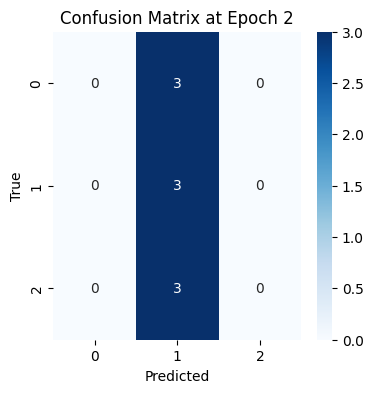

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 48ms/step
Epoch 7 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.43      1.00      0.60         3
     perfect       0.50      0.33      0.40         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.31      0.44      0.33         9
weighted avg       0.31      0.44      0.33         9



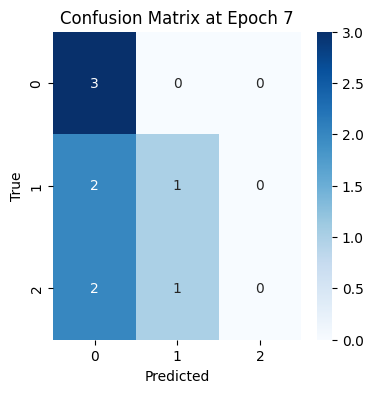

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 48ms/step
Epoch 12 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.33      1.00      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



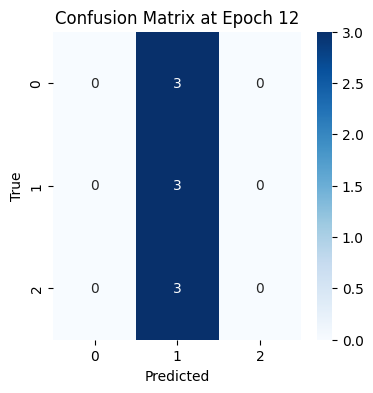

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 74ms/step
Epoch 17 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.33      1.00      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



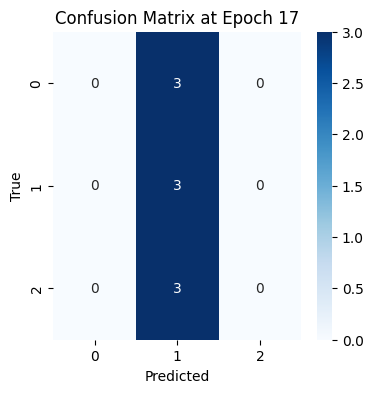

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 43ms/step
Epoch 22 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.33      1.00      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



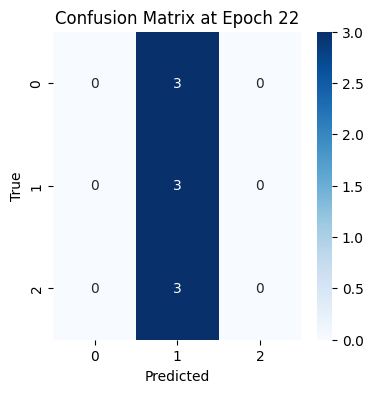

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 55ms/step
Epoch 27 Accuracy: 0.1111111111111111
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.00      0.00      0.00         3
    overripe       0.17      0.33      0.22         3

    accuracy                           0.11         9
   macro avg       0.06      0.11      0.07         9
weighted avg       0.06      0.11      0.07         9



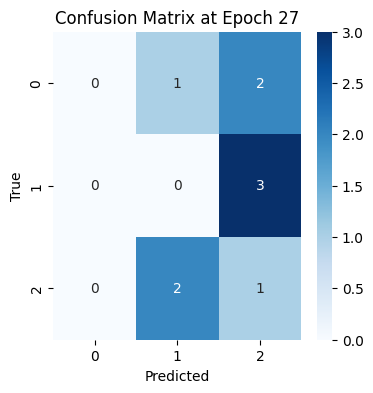

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 44ms/step
Epoch 32 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.33      1.00      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



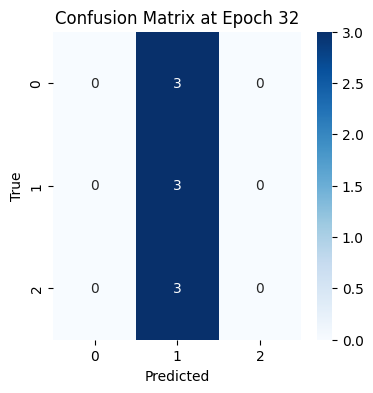

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 44ms/step
Epoch 37 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.00      0.00      0.00         3
    overripe       0.33      1.00      0.50         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



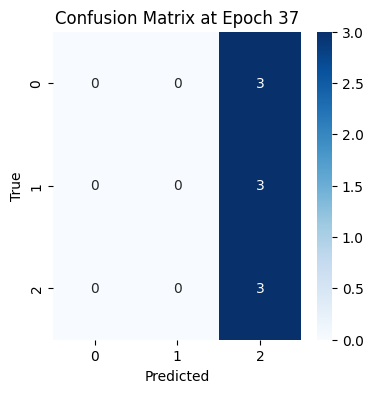

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 45ms/step
Epoch 42 Accuracy: 0.2222222222222222
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.00      0.00      0.00         3
    overripe       0.25      0.67      0.36         3

    accuracy                           0.22         9
   macro avg       0.08      0.22      0.12         9
weighted avg       0.08      0.22      0.12         9



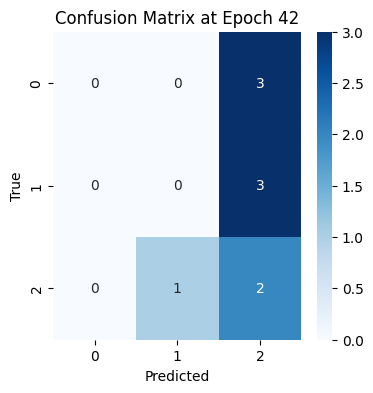

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 83ms/step
Epoch 47 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.50      0.33      0.40         3
     perfect       0.50      1.00      0.67         3
    overripe       1.00      0.33      0.50         3

    accuracy                           0.56         9
   macro avg       0.67      0.56      0.52         9
weighted avg       0.67      0.56      0.52         9



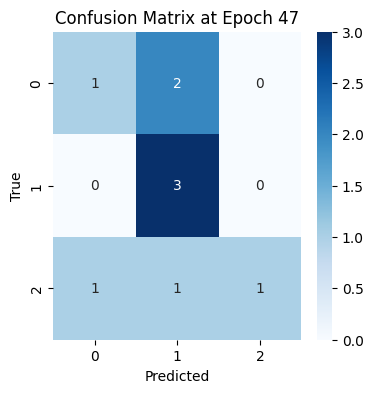

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 51ms/step
Epoch 52 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         3
     perfect       0.67      0.67      0.67         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.56         9
   macro avg       0.39      0.56      0.44         9
weighted avg       0.39      0.56      0.44         9



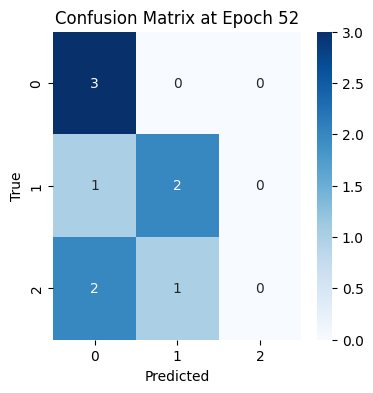

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 52ms/step
Epoch 57 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.40      0.67      0.50         3
     perfect       0.50      0.67      0.57         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.30      0.44      0.36         9
weighted avg       0.30      0.44      0.36         9



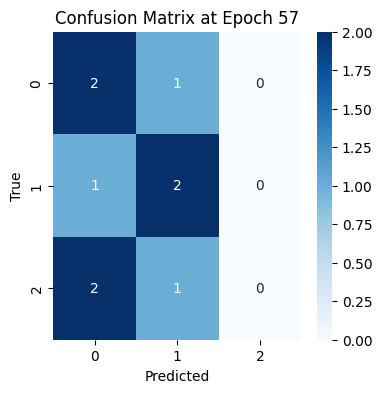

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 55ms/step
Epoch 62 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.33      1.00      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



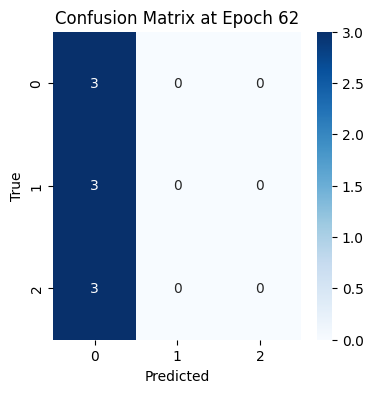

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 48ms/step
Epoch 67 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.50      0.33      0.40         3
     perfect       0.43      1.00      0.60         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.31      0.44      0.33         9
weighted avg       0.31      0.44      0.33         9



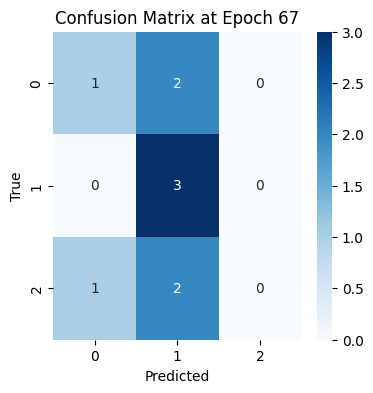

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 57ms/step
Epoch 72 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         3
     perfect       1.00      0.33      0.50         3
    overripe       0.50      0.33      0.40         3

    accuracy                           0.56         9
   macro avg       0.67      0.56      0.52         9
weighted avg       0.67      0.56      0.52         9



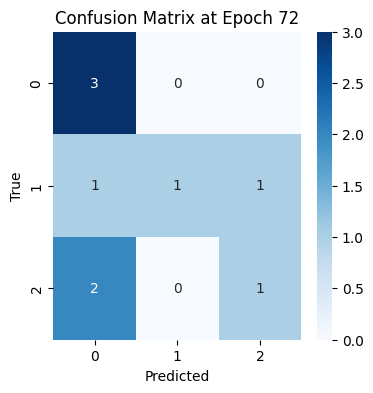

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 47ms/step
Epoch 77 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.50      0.33      0.40         3
     perfect       0.43      1.00      0.60         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.31      0.44      0.33         9
weighted avg       0.31      0.44      0.33         9



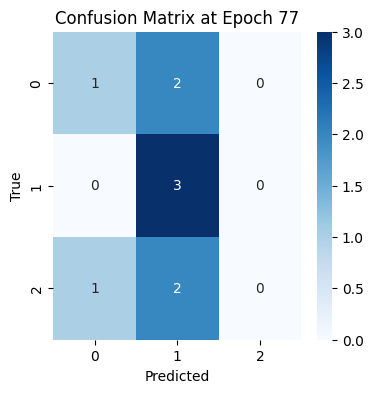

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 48ms/step
Epoch 82 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         3
     perfect       1.00      0.67      0.80         3
    overripe       1.00      0.33      0.50         3

    accuracy                           0.67         9
   macro avg       0.83      0.67      0.66         9
weighted avg       0.83      0.67      0.66         9



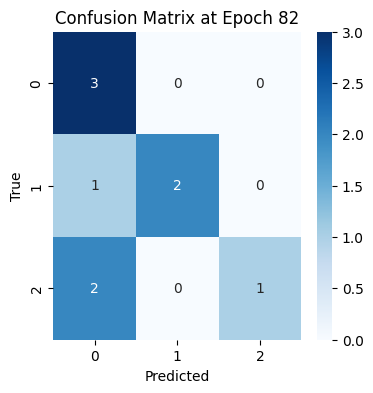

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 44ms/step
Epoch 87 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.60      1.00      0.75         3
     perfect       0.75      1.00      0.86         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.67         9
   macro avg       0.45      0.67      0.54         9
weighted avg       0.45      0.67      0.54         9



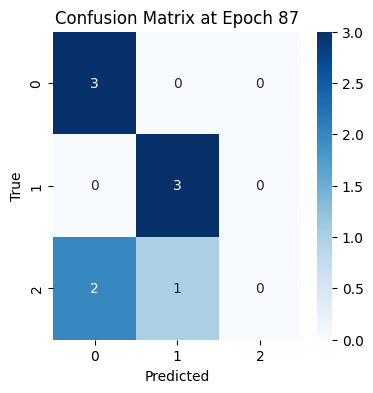

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 47ms/step
Epoch 92 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.38      1.00      0.55         3
     perfect       0.00      0.00      0.00         3
    overripe       1.00      0.33      0.50         3

    accuracy                           0.44         9
   macro avg       0.46      0.44      0.35         9
weighted avg       0.46      0.44      0.35         9



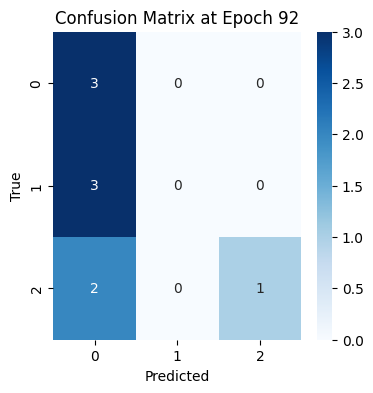

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 45ms/step
Epoch 97 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.43      1.00      0.60         3
     perfect       0.50      0.33      0.40         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.31      0.44      0.33         9
weighted avg       0.31      0.44      0.33         9



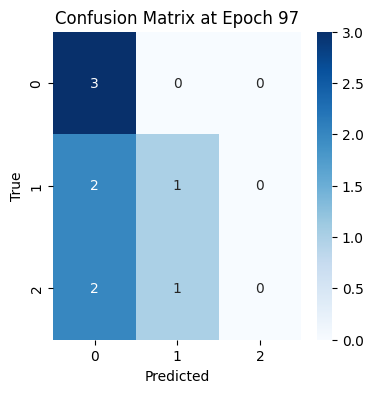

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 46ms/step
Epoch 102 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         3
     perfect       1.00      0.33      0.50         3
    overripe       0.50      0.33      0.40         3

    accuracy                           0.56         9
   macro avg       0.67      0.56      0.52         9
weighted avg       0.67      0.56      0.52         9



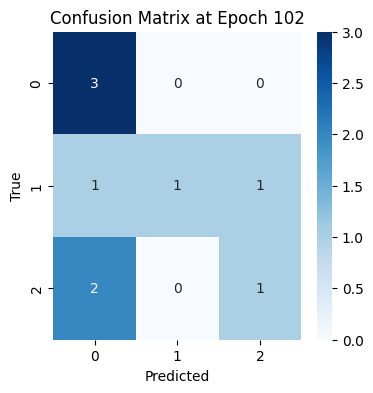

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 45ms/step
Epoch 107 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         3
     perfect       1.00      0.67      0.80         3
    overripe       1.00      0.33      0.50         3

    accuracy                           0.67         9
   macro avg       0.83      0.67      0.66         9
weighted avg       0.83      0.67      0.66         9



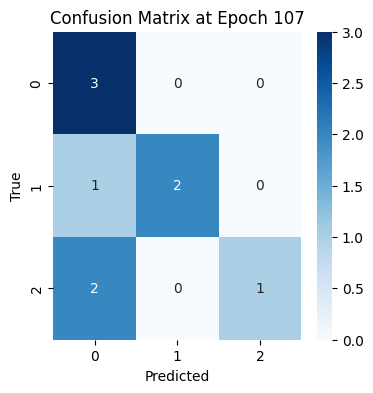

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 44ms/step
Epoch 112 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.60      1.00      0.75         3
     perfect       0.75      1.00      0.86         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.67         9
   macro avg       0.45      0.67      0.54         9
weighted avg       0.45      0.67      0.54         9



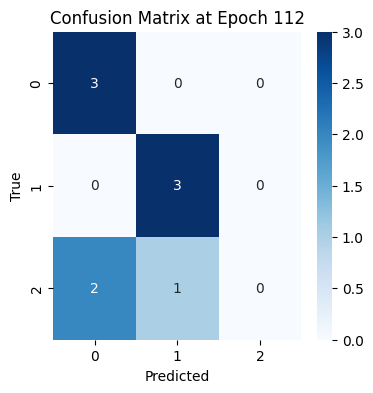

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 43ms/step
Epoch 117 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.43      1.00      0.60         3
     perfect       0.50      0.33      0.40         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.31      0.44      0.33         9
weighted avg       0.31      0.44      0.33         9



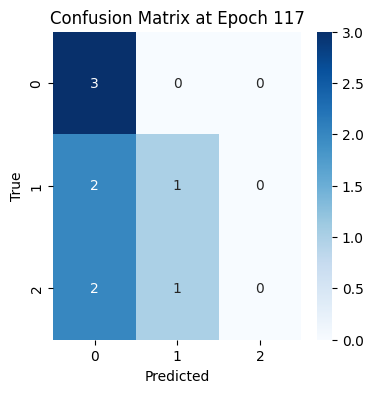

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 67ms/step
Epoch 122 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         3
     perfect       1.00      0.33      0.50         3
    overripe       0.50      0.33      0.40         3

    accuracy                           0.56         9
   macro avg       0.67      0.56      0.52         9
weighted avg       0.67      0.56      0.52         9



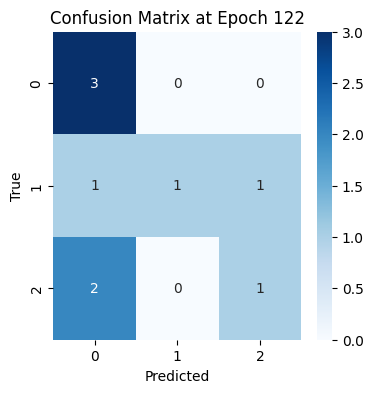

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 53ms/step
Epoch 127 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.43      1.00      0.60         3
    overripe       1.00      0.33      0.50         3

    accuracy                           0.44         9
   macro avg       0.48      0.44      0.37         9
weighted avg       0.48      0.44      0.37         9



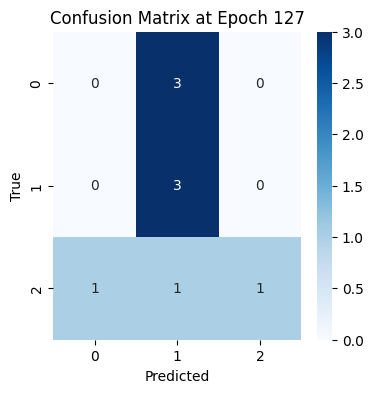

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 44ms/step
Epoch 132 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.67      0.67      0.67         3
     perfect       0.50      1.00      0.67         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.56         9
   macro avg       0.39      0.56      0.44         9
weighted avg       0.39      0.56      0.44         9



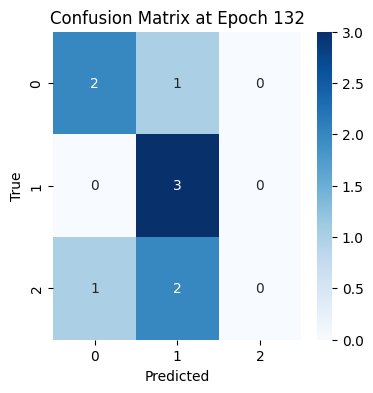

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 47ms/step
Epoch 137 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.38      1.00      0.55         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.12      0.33      0.18         9
weighted avg       0.12      0.33      0.18         9



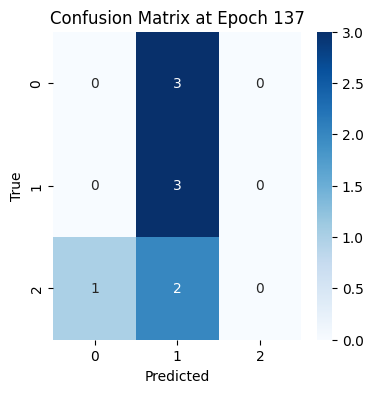

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 50ms/step
Epoch 142 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.60      1.00      0.75         3
     perfect       0.75      1.00      0.86         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.67         9
   macro avg       0.45      0.67      0.54         9
weighted avg       0.45      0.67      0.54         9



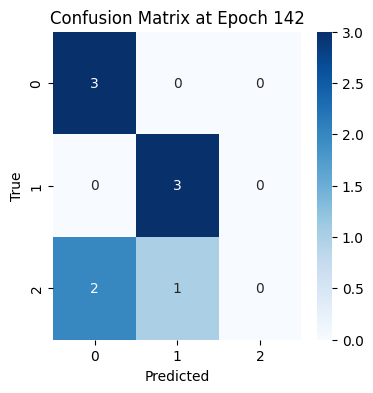

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 52ms/step
Epoch 147 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.50      0.33      0.40         3
     perfect       0.43      1.00      0.60         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.31      0.44      0.33         9
weighted avg       0.31      0.44      0.33         9



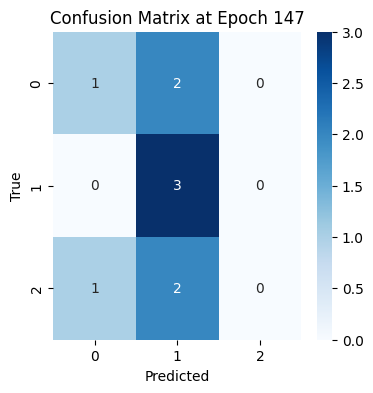

In [27]:
for i in range(2,151,5):
    kiwi_nir_msdcnn4.load_weights(working_dir + 'KIWI_NIR_MSDCNN4_checkpoints/MSDCNN4' + str(i).zfill(4) + '.ckpt')
    x, y = test_kiwi_NIR_datagen.__getitem__(0)
    y_pred = kiwi_nir_msdcnn4.predict(x)
    y_pred = np.argmax(y_pred, axis=1)
    y = y.numpy()
    print(f"Epoch {i} Accuracy: {np.mean(y_pred == y)}")
    # print recall and precision and f1 score
    print(classification_report(y, y_pred, target_names=ripeness_state_dict.keys(), zero_division=0))
    # plot confusion matrix
    cm = confusion_matrix(y, y_pred)
    plt.figure(figsize=(4, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'Confusion Matrix at Epoch {i}')
    plt.show()

evaluate model on entire dataset

3/3 [==============================] - 0s 47ms/step
Epoch 2 Accuracy: 0.5
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        18
     perfect       0.50      1.00      0.67        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.50        76
   macro avg       0.17      0.33      0.22        76
weighted avg       0.25      0.50      0.33        76



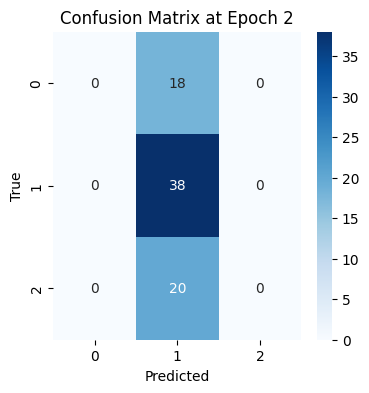

3/3 [==============================] - 0s 52ms/step
Epoch 7 Accuracy: 0.3815789473684211
              precision    recall  f1-score   support

      unripe       0.35      1.00      0.52        18
     perfect       0.44      0.29      0.35        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.38        76
   macro avg       0.26      0.43      0.29        76
weighted avg       0.30      0.38      0.30        76



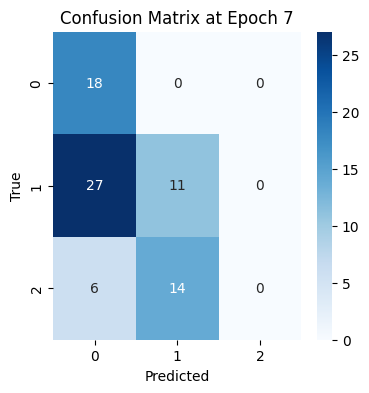

3/3 [==============================] - 0s 55ms/step
Epoch 12 Accuracy: 0.5
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        18
     perfect       0.50      1.00      0.67        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.50        76
   macro avg       0.17      0.33      0.22        76
weighted avg       0.25      0.50      0.33        76



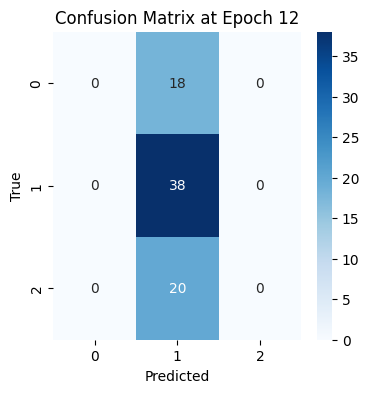

3/3 [==============================] - 0s 43ms/step
Epoch 17 Accuracy: 0.5
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        18
     perfect       0.50      1.00      0.67        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.50        76
   macro avg       0.17      0.33      0.22        76
weighted avg       0.25      0.50      0.33        76



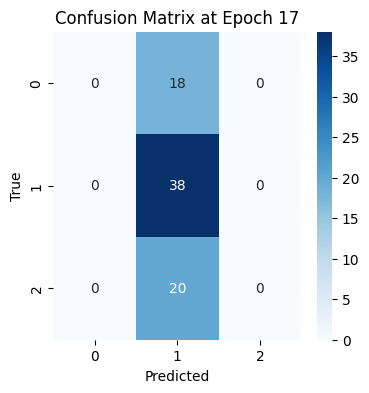

3/3 [==============================] - 0s 41ms/step
Epoch 22 Accuracy: 0.5
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        18
     perfect       0.50      1.00      0.67        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.50        76
   macro avg       0.17      0.33      0.22        76
weighted avg       0.25      0.50      0.33        76



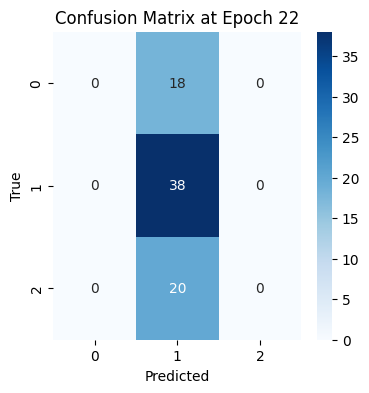

3/3 [==============================] - 0s 41ms/step
Epoch 27 Accuracy: 0.25
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        18
     perfect       0.20      0.03      0.05        38
    overripe       0.25      0.90      0.40        20

    accuracy                           0.25        76
   macro avg       0.15      0.31      0.15        76
weighted avg       0.17      0.25      0.13        76



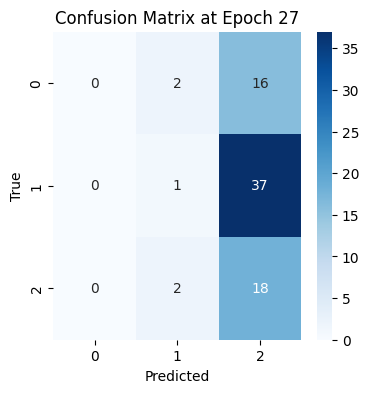

3/3 [==============================] - 0s 41ms/step
Epoch 32 Accuracy: 0.5526315789473685
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        18
     perfect       0.53      1.00      0.69        38
    overripe       1.00      0.20      0.33        20

    accuracy                           0.55        76
   macro avg       0.51      0.40      0.34        76
weighted avg       0.53      0.55      0.43        76



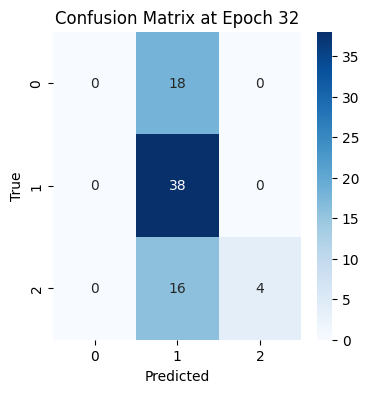

3/3 [==============================] - 0s 44ms/step
Epoch 37 Accuracy: 0.2631578947368421
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        18
     perfect       0.00      0.00      0.00        38
    overripe       0.26      1.00      0.42        20

    accuracy                           0.26        76
   macro avg       0.09      0.33      0.14        76
weighted avg       0.07      0.26      0.11        76



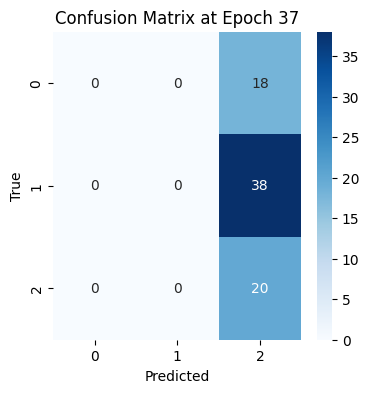

3/3 [==============================] - 0s 41ms/step
Epoch 42 Accuracy: 0.25
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        18
     perfect       0.00      0.00      0.00        38
    overripe       0.25      0.95      0.40        20

    accuracy                           0.25        76
   macro avg       0.08      0.32      0.13        76
weighted avg       0.07      0.25      0.11        76



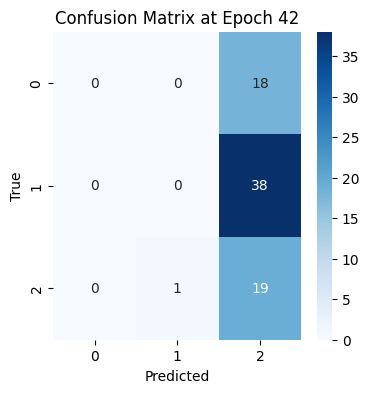

3/3 [==============================] - 0s 43ms/step
Epoch 47 Accuracy: 0.5657894736842105
              precision    recall  f1-score   support

      unripe       0.50      0.06      0.10        18
     perfect       0.54      1.00      0.70        38
    overripe       1.00      0.20      0.33        20

    accuracy                           0.57        76
   macro avg       0.68      0.42      0.38        76
weighted avg       0.65      0.57      0.46        76



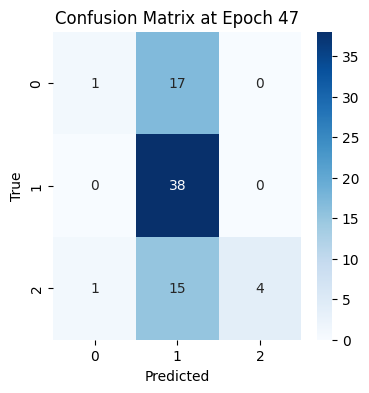

3/3 [==============================] - 0s 42ms/step
Epoch 52 Accuracy: 0.5789473684210527
              precision    recall  f1-score   support

      unripe       0.55      0.94      0.69        18
     perfect       0.60      0.71      0.65        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.58        76
   macro avg       0.38      0.55      0.45        76
weighted avg       0.43      0.58      0.49        76



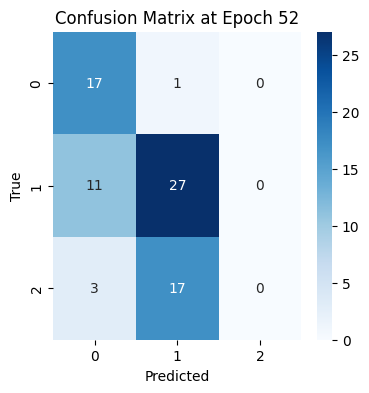

3/3 [==============================] - 0s 41ms/step
Epoch 57 Accuracy: 0.631578947368421
              precision    recall  f1-score   support

      unripe       0.56      0.78      0.65        18
     perfect       0.63      0.76      0.69        38
    overripe       1.00      0.25      0.40        20

    accuracy                           0.63        76
   macro avg       0.73      0.60      0.58        76
weighted avg       0.71      0.63      0.60        76



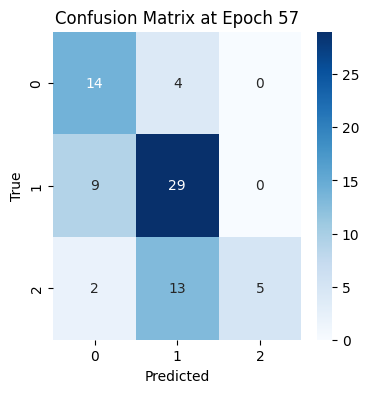

3/3 [==============================] - 0s 44ms/step
Epoch 62 Accuracy: 0.2631578947368421
              precision    recall  f1-score   support

      unripe       0.25      1.00      0.40        18
     perfect       0.67      0.05      0.10        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.26        76
   macro avg       0.30      0.35      0.16        76
weighted avg       0.39      0.26      0.14        76



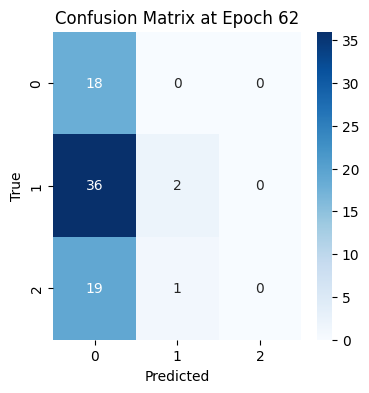

3/3 [==============================] - 0s 43ms/step
Epoch 67 Accuracy: 0.5921052631578947
              precision    recall  f1-score   support

      unripe       0.86      0.33      0.48        18
     perfect       0.56      1.00      0.72        38
    overripe       1.00      0.05      0.10        20

    accuracy                           0.59        76
   macro avg       0.81      0.46      0.43        76
weighted avg       0.75      0.59      0.50        76



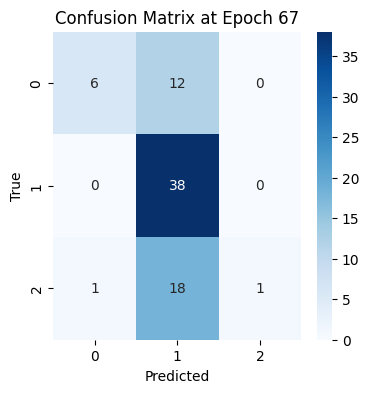

3/3 [==============================] - 0s 42ms/step
Epoch 72 Accuracy: 0.5789473684210527
              precision    recall  f1-score   support

      unripe       0.42      1.00      0.59        18
     perfect       0.85      0.29      0.43        38
    overripe       0.75      0.75      0.75        20

    accuracy                           0.58        76
   macro avg       0.67      0.68      0.59        76
weighted avg       0.72      0.58      0.55        76



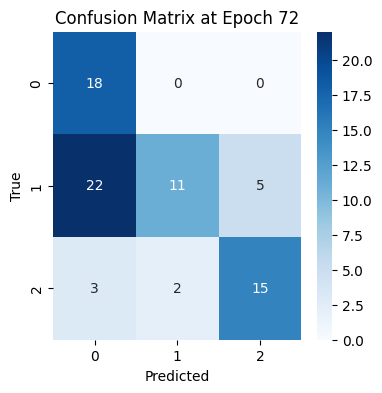

3/3 [==============================] - 0s 47ms/step
Epoch 77 Accuracy: 0.618421052631579
              precision    recall  f1-score   support

      unripe       0.89      0.44      0.59        18
     perfect       0.58      1.00      0.73        38
    overripe       1.00      0.05      0.10        20

    accuracy                           0.62        76
   macro avg       0.82      0.50      0.47        76
weighted avg       0.76      0.62      0.53        76



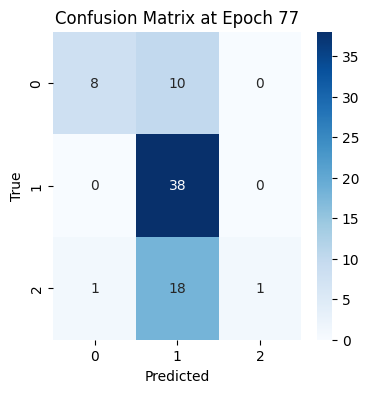

3/3 [==============================] - 0s 41ms/step
Epoch 82 Accuracy: 0.6578947368421053
              precision    recall  f1-score   support

      unripe       0.46      0.94      0.62        18
     perfect       0.79      0.61      0.69        38
    overripe       1.00      0.50      0.67        20

    accuracy                           0.66        76
   macro avg       0.75      0.68      0.66        76
weighted avg       0.77      0.66      0.67        76



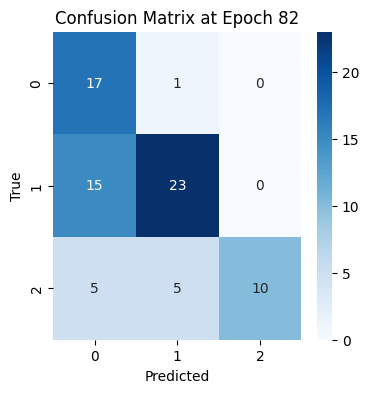

3/3 [==============================] - 0s 42ms/step
Epoch 87 Accuracy: 0.6447368421052632
              precision    recall  f1-score   support

      unripe       0.71      0.83      0.77        18
     perfect       0.62      0.89      0.73        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.64        76
   macro avg       0.44      0.58      0.50        76
weighted avg       0.48      0.64      0.55        76



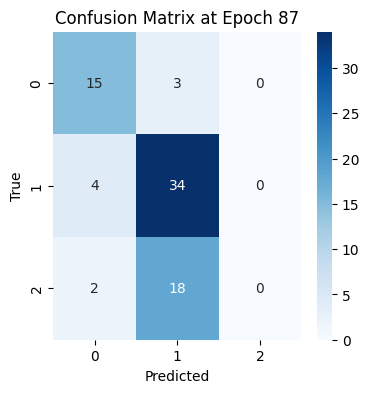

3/3 [==============================] - 0s 41ms/step
Epoch 92 Accuracy: 0.3026315789473684
              precision    recall  f1-score   support

      unripe       0.25      1.00      0.40        18
     perfect       0.00      0.00      0.00        38
    overripe       1.00      0.25      0.40        20

    accuracy                           0.30        76
   macro avg       0.42      0.42      0.27        76
weighted avg       0.32      0.30      0.20        76



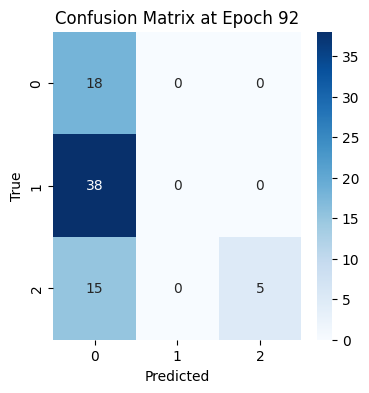

3/3 [==============================] - 0s 40ms/step
Epoch 97 Accuracy: 0.3684210526315789
              precision    recall  f1-score   support

      unripe       0.30      1.00      0.46        18
     perfect       0.60      0.24      0.34        38
    overripe       1.00      0.05      0.10        20

    accuracy                           0.37        76
   macro avg       0.63      0.43      0.30        76
weighted avg       0.63      0.37      0.30        76



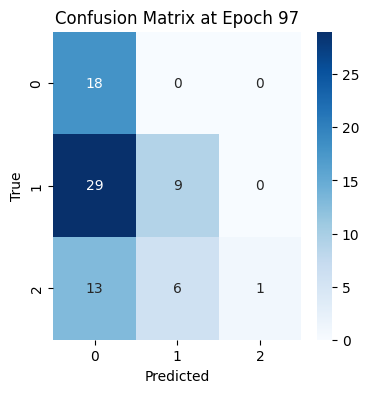

3/3 [==============================] - 0s 42ms/step
Epoch 102 Accuracy: 0.6447368421052632
              precision    recall  f1-score   support

      unripe       0.46      1.00      0.63        18
     perfect       1.00      0.37      0.54        38
    overripe       0.74      0.85      0.79        20

    accuracy                           0.64        76
   macro avg       0.73      0.74      0.65        76
weighted avg       0.80      0.64      0.63        76



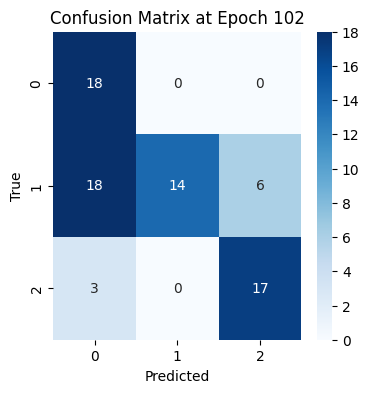

3/3 [==============================] - 0s 42ms/step
Epoch 107 Accuracy: 0.8026315789473685
              precision    recall  f1-score   support

      unripe       0.63      0.94      0.76        18
     perfect       0.86      0.84      0.85        38
    overripe       1.00      0.60      0.75        20

    accuracy                           0.80        76
   macro avg       0.83      0.80      0.79        76
weighted avg       0.84      0.80      0.80        76



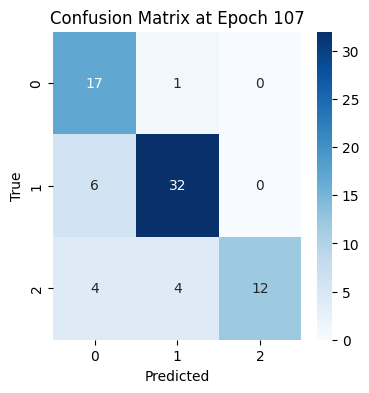

3/3 [==============================] - 0s 42ms/step
Epoch 112 Accuracy: 0.6710526315789473
              precision    recall  f1-score   support

      unripe       0.71      0.94      0.81        18
     perfect       0.65      0.87      0.74        38
    overripe       1.00      0.05      0.10        20

    accuracy                           0.67        76
   macro avg       0.79      0.62      0.55        76
weighted avg       0.75      0.67      0.59        76



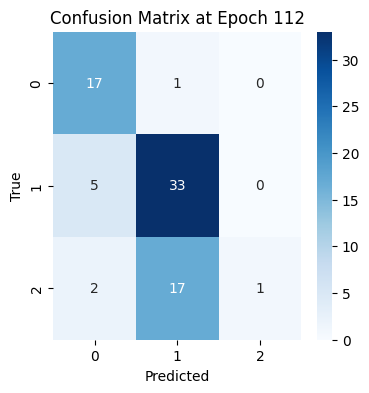

3/3 [==============================] - 0s 42ms/step
Epoch 117 Accuracy: 0.3026315789473684
              precision    recall  f1-score   support

      unripe       0.28      1.00      0.44        18
     perfect       0.42      0.13      0.20        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.30        76
   macro avg       0.23      0.38      0.21        76
weighted avg       0.27      0.30      0.20        76



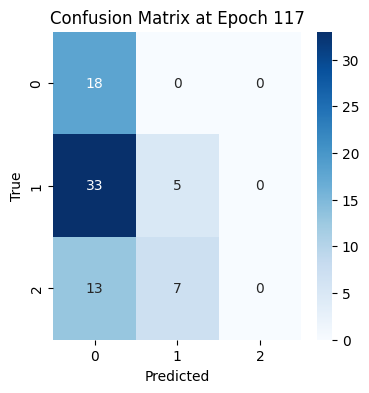

3/3 [==============================] - 0s 46ms/step
Epoch 122 Accuracy: 0.8552631578947368
              precision    recall  f1-score   support

      unripe       0.81      0.94      0.87        18
     perfect       0.91      0.84      0.88        38
    overripe       0.80      0.80      0.80        20

    accuracy                           0.86        76
   macro avg       0.84      0.86      0.85        76
weighted avg       0.86      0.86      0.86        76



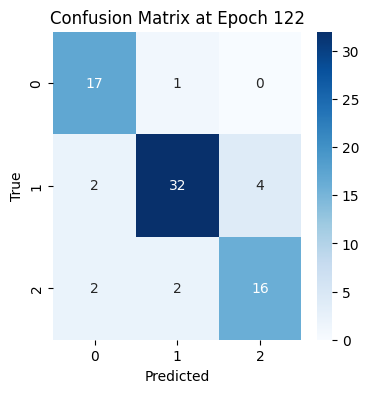

3/3 [==============================] - 0s 43ms/step
Epoch 127 Accuracy: 0.7236842105263158
              precision    recall  f1-score   support

      unripe       0.75      0.17      0.27        18
     perfect       0.66      1.00      0.79        38
    overripe       1.00      0.70      0.82        20

    accuracy                           0.72        76
   macro avg       0.80      0.62      0.63        76
weighted avg       0.77      0.72      0.68        76



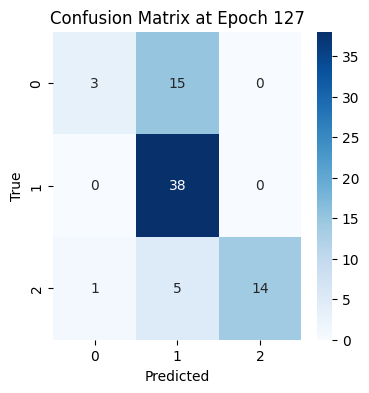

3/3 [==============================] - 0s 42ms/step
Epoch 132 Accuracy: 0.6842105263157895
              precision    recall  f1-score   support

      unripe       0.93      0.78      0.85        18
     perfect       0.62      1.00      0.77        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.68        76
   macro avg       0.52      0.59      0.54        76
weighted avg       0.53      0.68      0.58        76



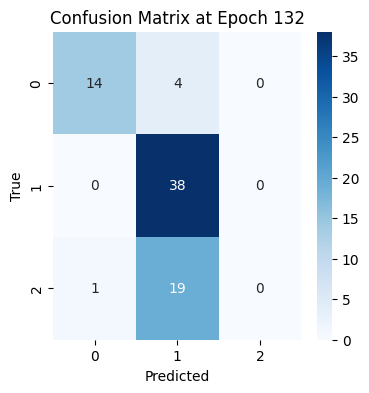

3/3 [==============================] - 0s 41ms/step
Epoch 137 Accuracy: 0.5131578947368421
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        18
     perfect       0.51      1.00      0.68        38
    overripe       1.00      0.05      0.10        20

    accuracy                           0.51        76
   macro avg       0.50      0.35      0.26        76
weighted avg       0.52      0.51      0.36        76



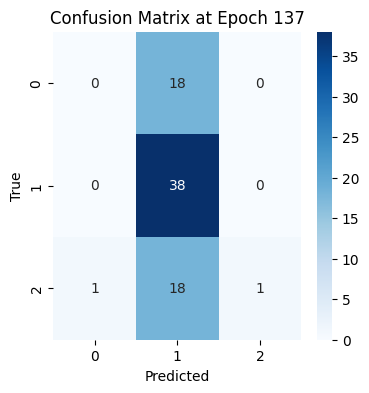

3/3 [==============================] - 0s 47ms/step
Epoch 142 Accuracy: 0.6842105263157895
              precision    recall  f1-score   support

      unripe       0.74      0.94      0.83        18
     perfect       0.65      0.89      0.76        38
    overripe       1.00      0.05      0.10        20

    accuracy                           0.68        76
   macro avg       0.80      0.63      0.56        76
weighted avg       0.77      0.68      0.60        76



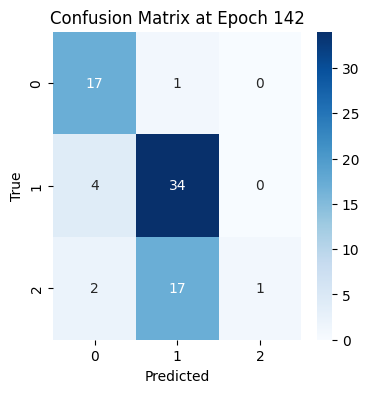

3/3 [==============================] - 0s 44ms/step
Epoch 147 Accuracy: 0.5921052631578947
              precision    recall  f1-score   support

      unripe       0.83      0.28      0.42        18
     perfect       0.56      1.00      0.72        38
    overripe       1.00      0.10      0.18        20

    accuracy                           0.59        76
   macro avg       0.80      0.46      0.44        76
weighted avg       0.74      0.59      0.51        76



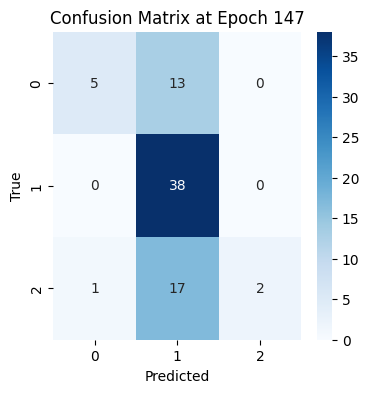

In [28]:
x, y = all_kiwi_nir_datagen.__getitem__(0)
y = y.numpy()
for i in range(2,151,5):
    kiwi_nir_msdcnn4.load_weights(working_dir + 'KIWI_NIR_MSDCNN4_checkpoints/MSDCNN4' + str(i).zfill(4) + '.ckpt')
    y_pred = kiwi_nir_msdcnn4.predict(x)
    y_pred = np.argmax(y_pred, axis=1)
    print(f"Epoch {i} Accuracy: {np.mean(y_pred == y)}")
    # print recall and precision and f1 score
    print(classification_report(y, y_pred, target_names=ripeness_state_dict.keys(), zero_division=0))
    # plot confusion matrix
    cm = confusion_matrix(y, y_pred)
    plt.figure(figsize=(4, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'Confusion Matrix at Epoch {i}')
    plt.show()

after training the model for 250 more epochs we evalute on both the test and the entire dataset

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 47ms/step
Epoch 5 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.38      1.00      0.55         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.12      0.33      0.18         9
weighted avg       0.12      0.33      0.18         9



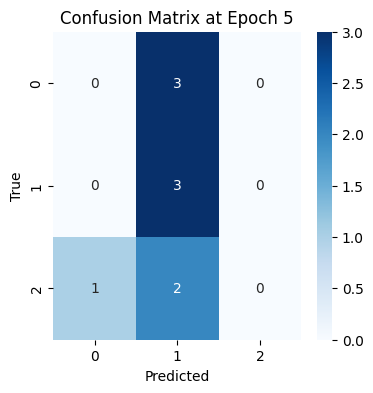

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 45ms/step
Epoch 10 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.43      1.00      0.60         3
    overripe       1.00      0.33      0.50         3

    accuracy                           0.44         9
   macro avg       0.48      0.44      0.37         9
weighted avg       0.48      0.44      0.37         9



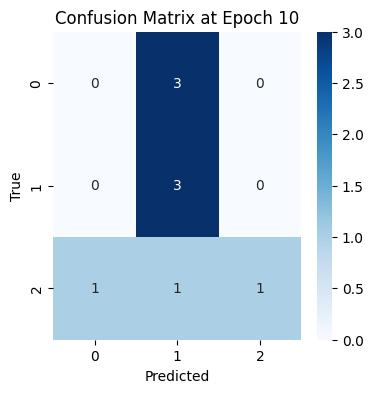

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 56ms/step
Epoch 15 Accuracy: 0.2222222222222222
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.25      0.33      0.29         3
    overripe       0.25      0.33      0.29         3

    accuracy                           0.22         9
   macro avg       0.17      0.22      0.19         9
weighted avg       0.17      0.22      0.19         9



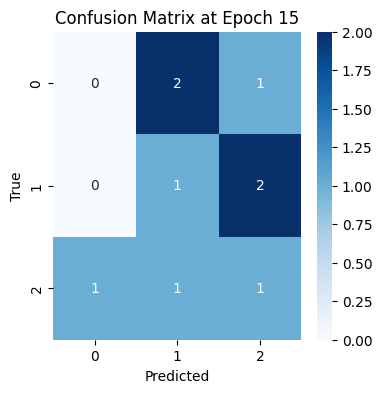

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 44ms/step
Epoch 20 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.50      0.33      0.40         3
     perfect       0.50      1.00      0.67         3
    overripe       1.00      0.33      0.50         3

    accuracy                           0.56         9
   macro avg       0.67      0.56      0.52         9
weighted avg       0.67      0.56      0.52         9



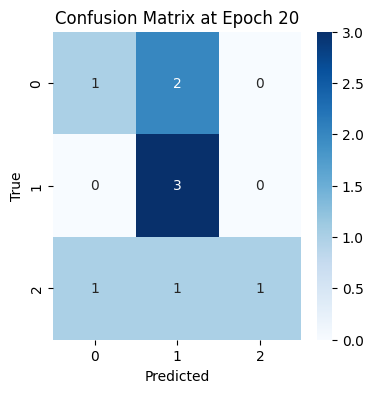

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 43ms/step
Epoch 25 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.38      1.00      0.55         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.12      0.33      0.18         9
weighted avg       0.12      0.33      0.18         9



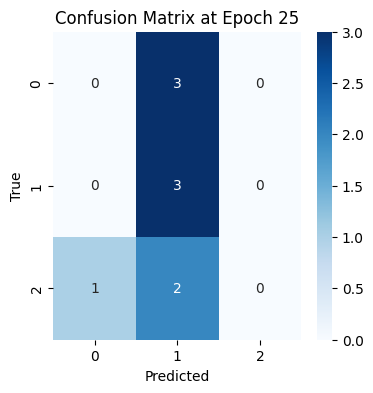

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 45ms/step
Epoch 30 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.67      0.67      0.67         3
     perfect       0.60      1.00      0.75         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.56         9
   macro avg       0.42      0.56      0.47         9
weighted avg       0.42      0.56      0.47         9



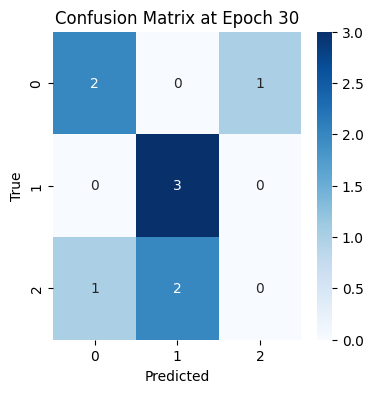

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 50ms/step
Epoch 35 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.50      0.33      0.40         3
     perfect       0.50      0.67      0.57         3
    overripe       0.33      0.33      0.33         3

    accuracy                           0.44         9
   macro avg       0.44      0.44      0.43         9
weighted avg       0.44      0.44      0.43         9



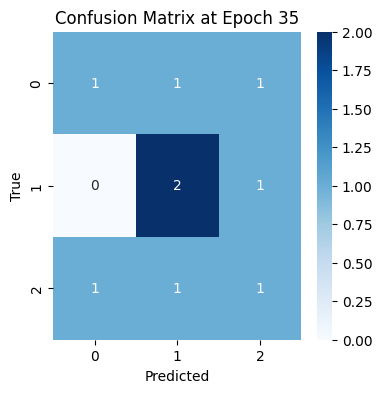

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 53ms/step
Epoch 40 Accuracy: 0.1111111111111111
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.00      0.00      0.00         3
    overripe       0.17      0.33      0.22         3

    accuracy                           0.11         9
   macro avg       0.06      0.11      0.07         9
weighted avg       0.06      0.11      0.07         9



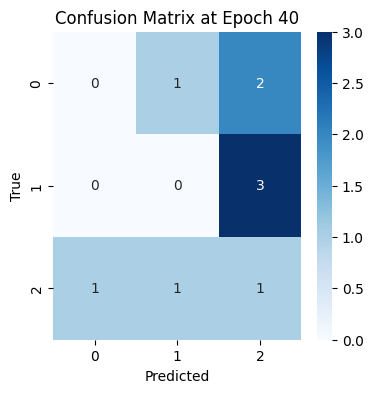

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 44ms/step
Epoch 45 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.50      0.33      0.40         3
     perfect       0.60      1.00      0.75         3
    overripe       0.50      0.33      0.40         3

    accuracy                           0.56         9
   macro avg       0.53      0.56      0.52         9
weighted avg       0.53      0.56      0.52         9



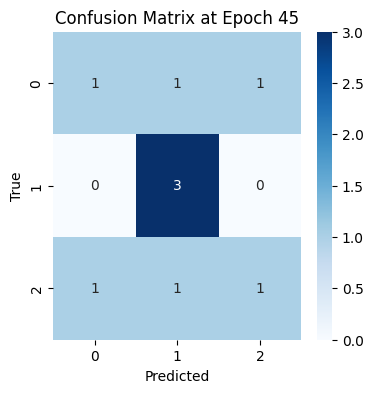

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 46ms/step
Epoch 50 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.33      1.00      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



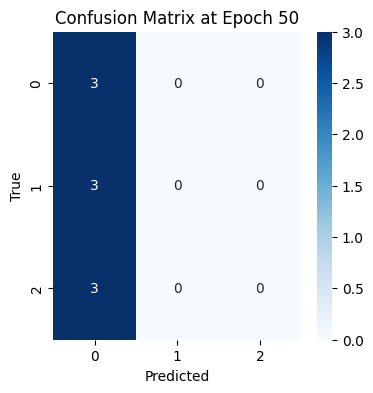

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 41ms/step
Epoch 55 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.40      0.67      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.25      0.33      0.29         3

    accuracy                           0.33         9
   macro avg       0.22      0.33      0.26         9
weighted avg       0.22      0.33      0.26         9



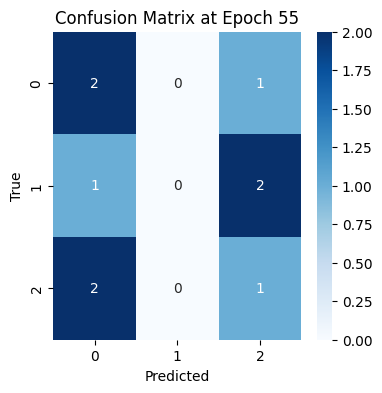

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 43ms/step
Epoch 60 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         3
     perfect       0.67      0.67      0.67         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.56         9
   macro avg       0.39      0.56      0.44         9
weighted avg       0.39      0.56      0.44         9



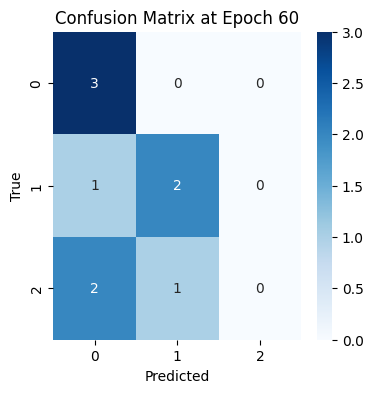

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 47ms/step
Epoch 65 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.50      0.33      0.40         3
     perfect       0.43      1.00      0.60         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.31      0.44      0.33         9
weighted avg       0.31      0.44      0.33         9



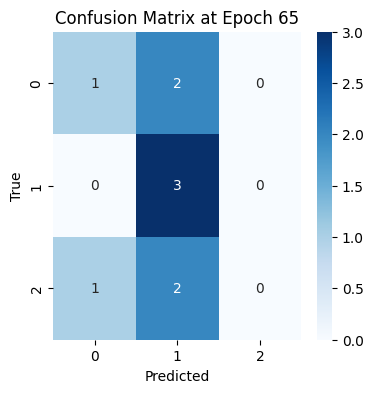

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 42ms/step
Epoch 70 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.43      1.00      0.60         3
     perfect       0.50      0.33      0.40         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.31      0.44      0.33         9
weighted avg       0.31      0.44      0.33         9



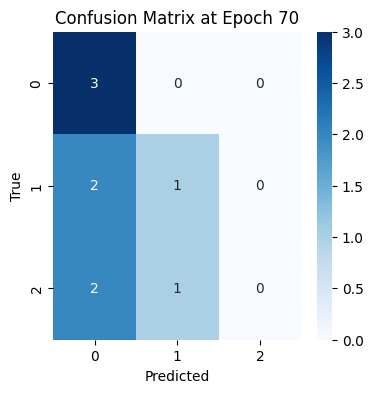

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 42ms/step
Epoch 75 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.60      1.00      0.75         3
     perfect       1.00      0.67      0.80         3
    overripe       0.50      0.33      0.40         3

    accuracy                           0.67         9
   macro avg       0.70      0.67      0.65         9
weighted avg       0.70      0.67      0.65         9



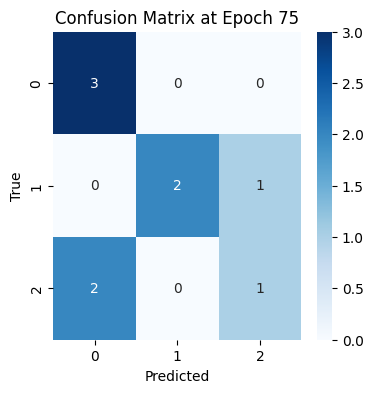

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 41ms/step
Epoch 80 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.67      0.67      0.67         3
     perfect       0.40      0.67      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.36      0.44      0.39         9
weighted avg       0.36      0.44      0.39         9



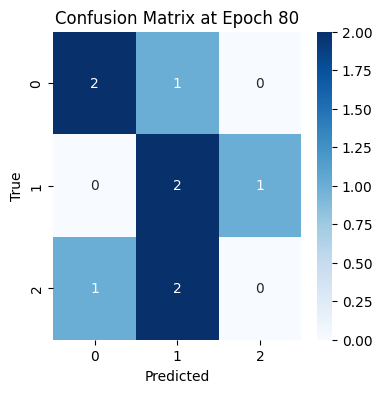

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 54ms/step
Epoch 85 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.50      0.33      0.40         3
     perfect       0.60      1.00      0.75         3
    overripe       0.50      0.33      0.40         3

    accuracy                           0.56         9
   macro avg       0.53      0.56      0.52         9
weighted avg       0.53      0.56      0.52         9



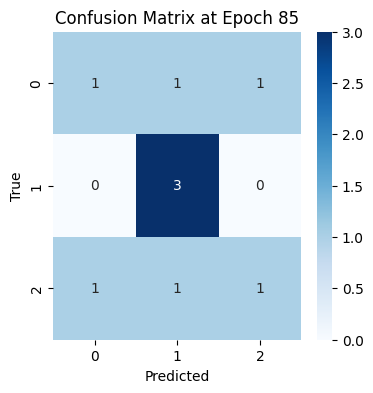

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 42ms/step
Epoch 90 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.67      0.67      0.67         3
     perfect       0.75      1.00      0.86         3
    overripe       0.50      0.33      0.40         3

    accuracy                           0.67         9
   macro avg       0.64      0.67      0.64         9
weighted avg       0.64      0.67      0.64         9



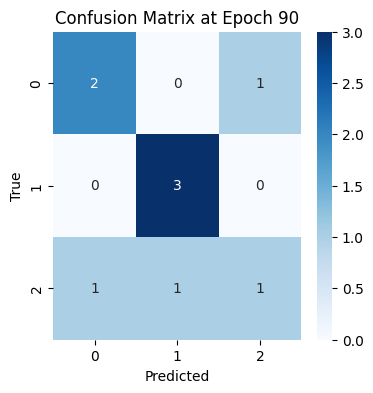

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 43ms/step
Epoch 95 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.67      0.67      0.67         3
     perfect       0.67      0.67      0.67         3
    overripe       0.33      0.33      0.33         3

    accuracy                           0.56         9
   macro avg       0.56      0.56      0.56         9
weighted avg       0.56      0.56      0.56         9



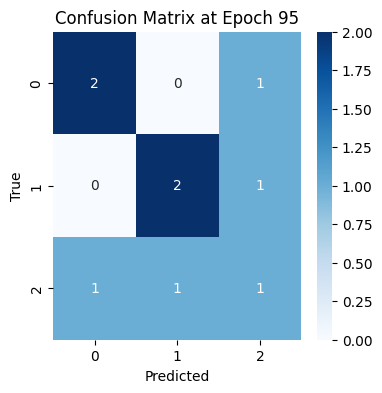

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 41ms/step
Epoch 100 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.67      0.67      0.67         3
     perfect       0.67      0.67      0.67         3
    overripe       0.33      0.33      0.33         3

    accuracy                           0.56         9
   macro avg       0.56      0.56      0.56         9
weighted avg       0.56      0.56      0.56         9



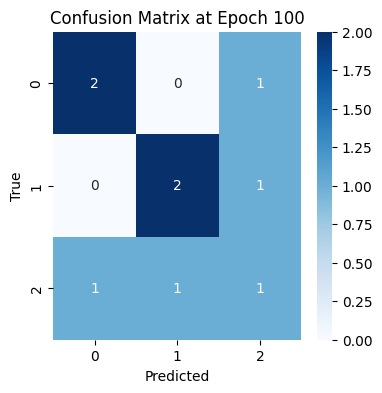

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 43ms/step
Epoch 105 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.67      0.67      0.67         3
     perfect       0.67      0.67      0.67         3
    overripe       0.33      0.33      0.33         3

    accuracy                           0.56         9
   macro avg       0.56      0.56      0.56         9
weighted avg       0.56      0.56      0.56         9



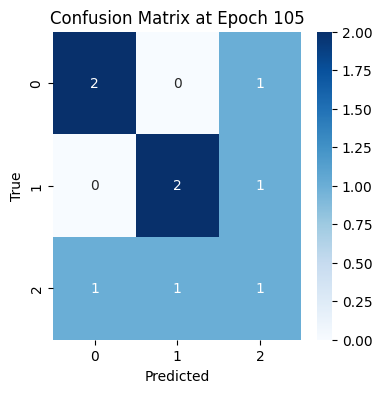

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 46ms/step
Epoch 110 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.67      0.67      0.67         3
     perfect       0.67      0.67      0.67         3
    overripe       0.33      0.33      0.33         3

    accuracy                           0.56         9
   macro avg       0.56      0.56      0.56         9
weighted avg       0.56      0.56      0.56         9



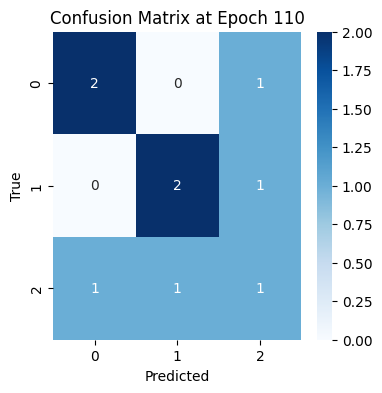

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 51ms/step
Epoch 115 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.67      0.67      0.67         3
     perfect       0.67      0.67      0.67         3
    overripe       0.33      0.33      0.33         3

    accuracy                           0.56         9
   macro avg       0.56      0.56      0.56         9
weighted avg       0.56      0.56      0.56         9



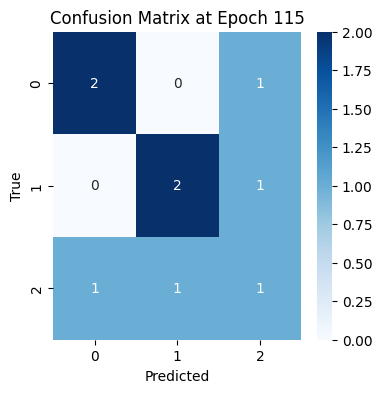

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 45ms/step
Epoch 120 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.67      0.67      0.67         3
     perfect       0.75      1.00      0.86         3
    overripe       0.50      0.33      0.40         3

    accuracy                           0.67         9
   macro avg       0.64      0.67      0.64         9
weighted avg       0.64      0.67      0.64         9



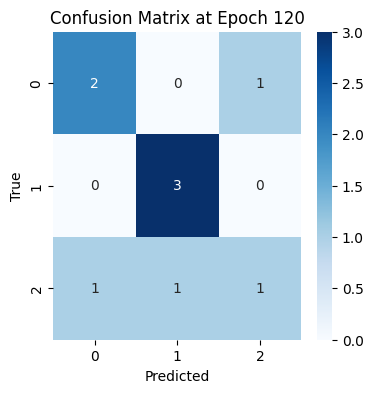

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 42ms/step
Epoch 125 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.67      0.67      0.67         3
     perfect       0.75      1.00      0.86         3
    overripe       0.50      0.33      0.40         3

    accuracy                           0.67         9
   macro avg       0.64      0.67      0.64         9
weighted avg       0.64      0.67      0.64         9



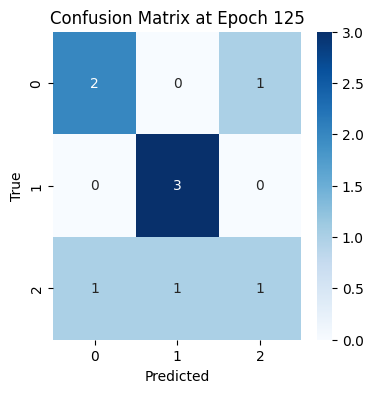

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 46ms/step
Epoch 130 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.67      0.67      0.67         3
     perfect       0.67      0.67      0.67         3
    overripe       0.33      0.33      0.33         3

    accuracy                           0.56         9
   macro avg       0.56      0.56      0.56         9
weighted avg       0.56      0.56      0.56         9



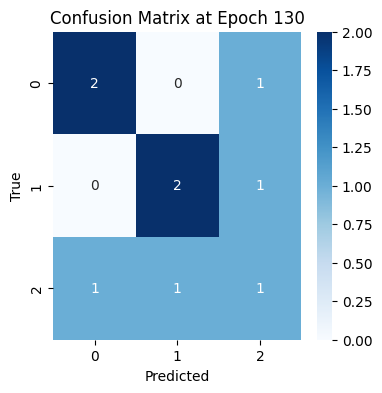

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 43ms/step
Epoch 135 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.67      0.67      0.67         3
     perfect       0.75      1.00      0.86         3
    overripe       0.50      0.33      0.40         3

    accuracy                           0.67         9
   macro avg       0.64      0.67      0.64         9
weighted avg       0.64      0.67      0.64         9



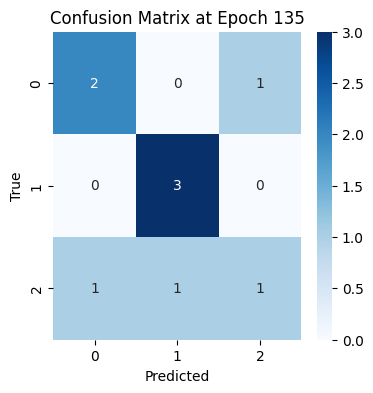

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 39ms/step
Epoch 140 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.38      1.00      0.55         3
     perfect       1.00      0.33      0.50         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.46      0.44      0.35         9
weighted avg       0.46      0.44      0.35         9



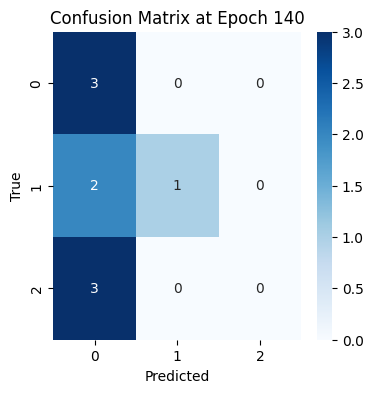

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 41ms/step
Epoch 145 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.33      1.00      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



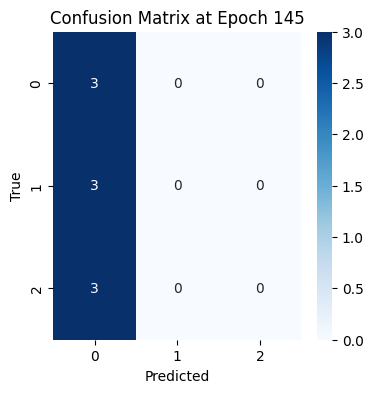

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 51ms/step
Epoch 150 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.67      0.67      0.67         3
     perfect       0.50      1.00      0.67         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.56         9
   macro avg       0.39      0.56      0.44         9
weighted avg       0.39      0.56      0.44         9



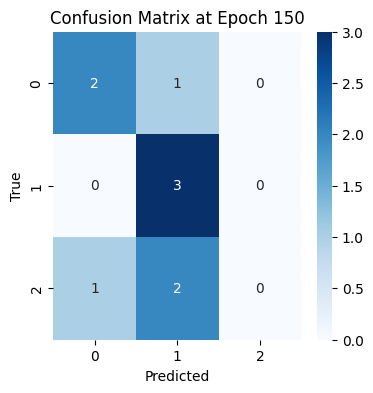

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 52ms/step
Epoch 155 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.33      1.00      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



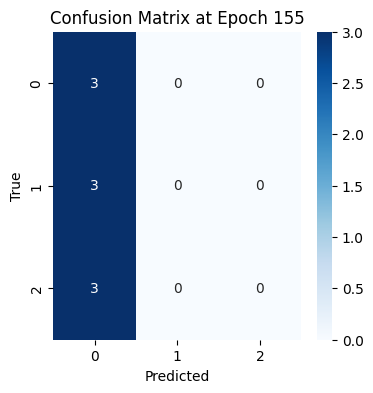

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 40ms/step
Epoch 160 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.43      1.00      0.60         3
     perfect       0.50      0.33      0.40         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.31      0.44      0.33         9
weighted avg       0.31      0.44      0.33         9



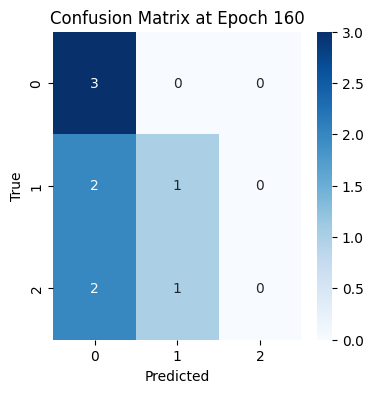

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 40ms/step
Epoch 165 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         3
     perfect       0.67      0.67      0.67         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.56         9
   macro avg       0.39      0.56      0.44         9
weighted avg       0.39      0.56      0.44         9



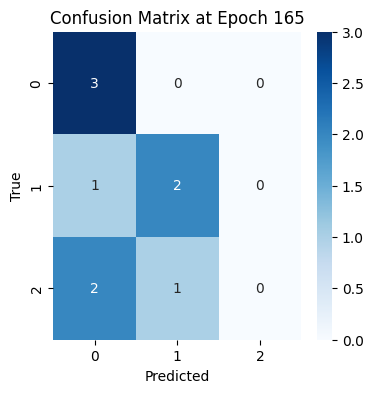

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 41ms/step
Epoch 170 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         3
     perfect       1.00      0.67      0.80         3
    overripe       1.00      0.33      0.50         3

    accuracy                           0.67         9
   macro avg       0.83      0.67      0.66         9
weighted avg       0.83      0.67      0.66         9



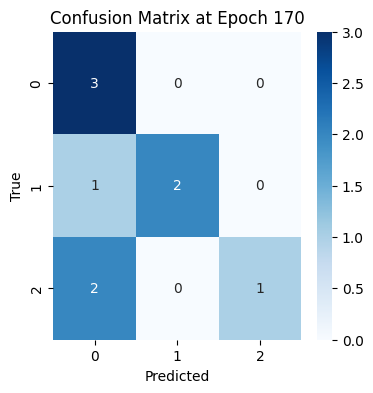

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 42ms/step
Epoch 175 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         3
     perfect       1.00      0.67      0.80         3
    overripe       1.00      0.33      0.50         3

    accuracy                           0.67         9
   macro avg       0.83      0.67      0.66         9
weighted avg       0.83      0.67      0.66         9



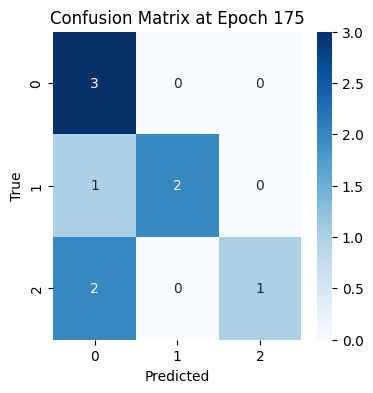

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 42ms/step
Epoch 180 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.50      1.00      0.67         3
     perfect       0.67      0.67      0.67         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.56         9
   macro avg       0.39      0.56      0.44         9
weighted avg       0.39      0.56      0.44         9



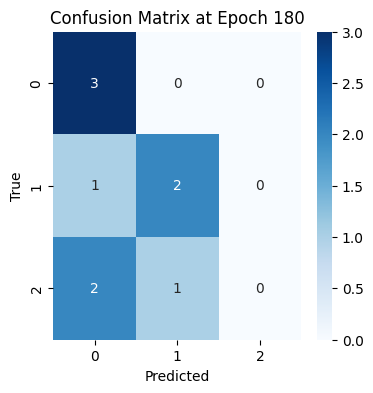

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 49ms/step
Epoch 185 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.67      0.67      0.67         3
     perfect       0.50      1.00      0.67         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.56         9
   macro avg       0.39      0.56      0.44         9
weighted avg       0.39      0.56      0.44         9



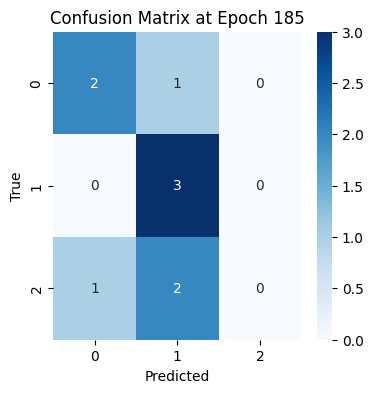

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 47ms/step
Epoch 190 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.38      1.00      0.55         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.12      0.33      0.18         9
weighted avg       0.12      0.33      0.18         9



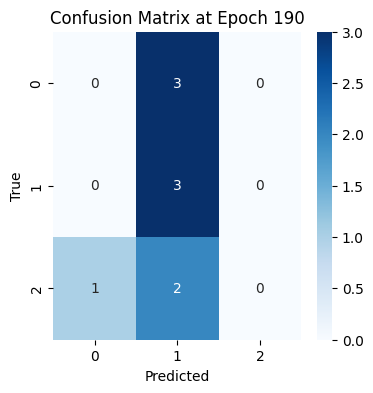

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 45ms/step
Epoch 195 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.40      0.67      0.50         3
    overripe       0.33      0.33      0.33         3

    accuracy                           0.33         9
   macro avg       0.24      0.33      0.28         9
weighted avg       0.24      0.33      0.28         9



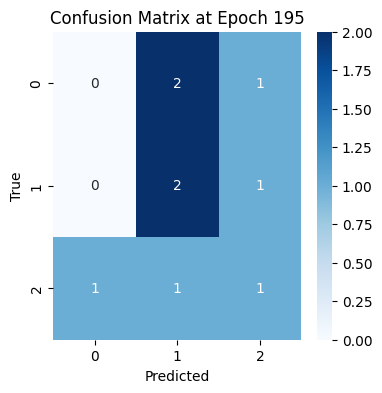

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 41ms/step
Epoch 200 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.50      0.67      0.57         3
     perfect       0.00      0.00      0.00         3
    overripe       0.20      0.33      0.25         3

    accuracy                           0.33         9
   macro avg       0.23      0.33      0.27         9
weighted avg       0.23      0.33      0.27         9



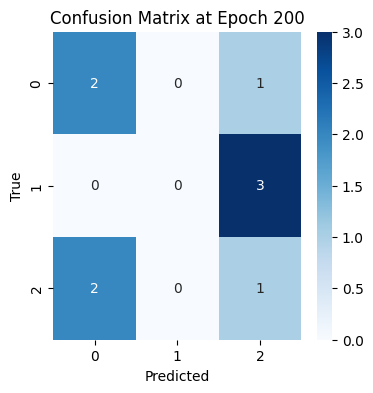

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 53ms/step
Epoch 205 Accuracy: 0.2222222222222222
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00         3
     perfect       0.00      0.00      0.00         3
    overripe       0.29      0.67      0.40         3

    accuracy                           0.22         9
   macro avg       0.10      0.22      0.13         9
weighted avg       0.10      0.22      0.13         9



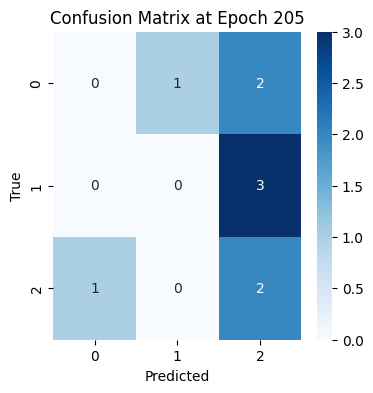

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 40ms/step
Epoch 210 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.40      0.67      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.25      0.33      0.29         3

    accuracy                           0.33         9
   macro avg       0.22      0.33      0.26         9
weighted avg       0.22      0.33      0.26         9



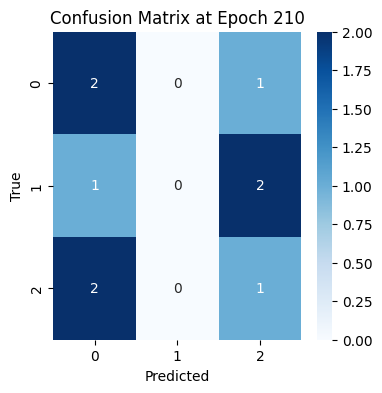

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 45ms/step
Epoch 215 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.40      0.67      0.50         3
     perfect       1.00      0.33      0.50         3
    overripe       0.33      0.33      0.33         3

    accuracy                           0.44         9
   macro avg       0.58      0.44      0.44         9
weighted avg       0.58      0.44      0.44         9



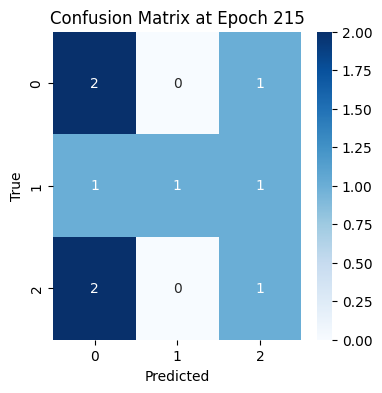

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 42ms/step
Epoch 220 Accuracy: 0.3333333333333333
              precision    recall  f1-score   support

      unripe       0.33      1.00      0.50         3
     perfect       0.00      0.00      0.00         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.33         9
   macro avg       0.11      0.33      0.17         9
weighted avg       0.11      0.33      0.17         9



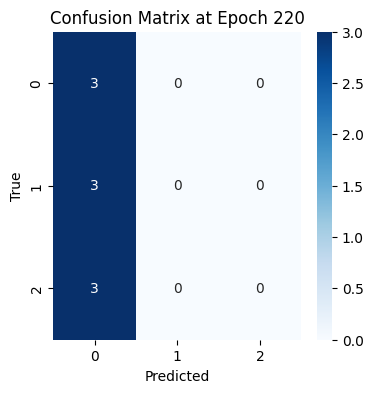

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 43ms/step
Epoch 225 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.50      0.67      0.57         3
     perfect       0.60      1.00      0.75         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.56         9
   macro avg       0.37      0.56      0.44         9
weighted avg       0.37      0.56      0.44         9



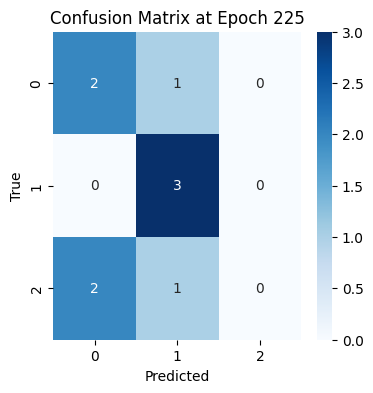

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 48ms/step
Epoch 230 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.67      0.67      0.67         3
     perfect       0.50      1.00      0.67         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.56         9
   macro avg       0.39      0.56      0.44         9
weighted avg       0.39      0.56      0.44         9



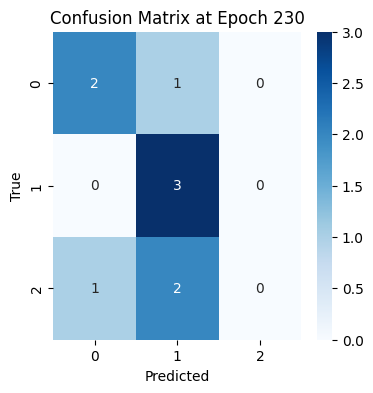

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 46ms/step
Epoch 235 Accuracy: 0.6666666666666666
              precision    recall  f1-score   support

      unripe       0.50      0.67      0.57         3
     perfect       1.00      1.00      1.00         3
    overripe       0.50      0.33      0.40         3

    accuracy                           0.67         9
   macro avg       0.67      0.67      0.66         9
weighted avg       0.67      0.67      0.66         9



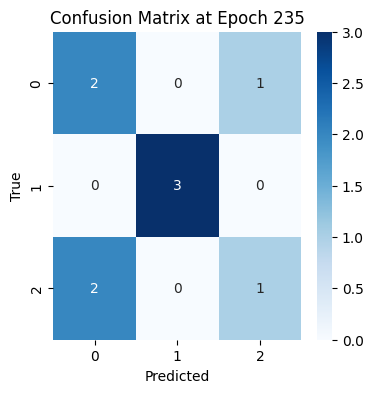

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 43ms/step
Epoch 240 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.33      0.33      0.33         3
     perfect       0.60      1.00      0.75         3
    overripe       1.00      0.33      0.50         3

    accuracy                           0.56         9
   macro avg       0.64      0.56      0.53         9
weighted avg       0.64      0.56      0.53         9



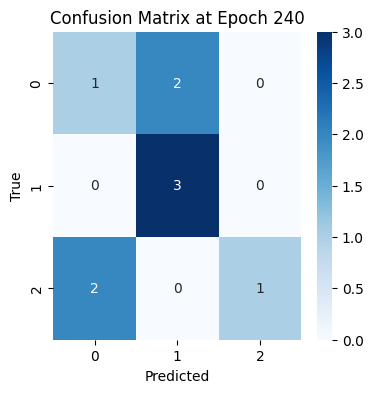

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 45ms/step
Epoch 245 Accuracy: 0.5555555555555556
              precision    recall  f1-score   support

      unripe       0.50      0.33      0.40         3
     perfect       0.60      1.00      0.75         3
    overripe       0.50      0.33      0.40         3

    accuracy                           0.56         9
   macro avg       0.53      0.56      0.52         9
weighted avg       0.53      0.56      0.52         9



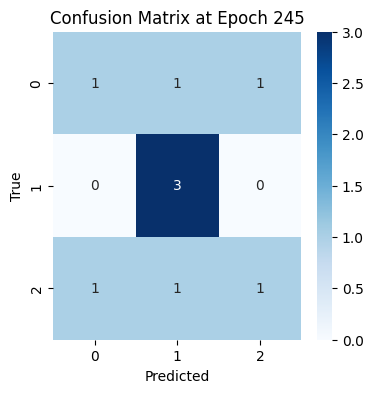

unique classes: [2 1 0]
class 2 is already balanced
class 1 is already balanced
class 0 is already balanced
1/1 [==============================] - 0s 48ms/step
Epoch 250 Accuracy: 0.4444444444444444
              precision    recall  f1-score   support

      unripe       0.50      0.33      0.40         3
     perfect       0.43      1.00      0.60         3
    overripe       0.00      0.00      0.00         3

    accuracy                           0.44         9
   macro avg       0.31      0.44      0.33         9
weighted avg       0.31      0.44      0.33         9



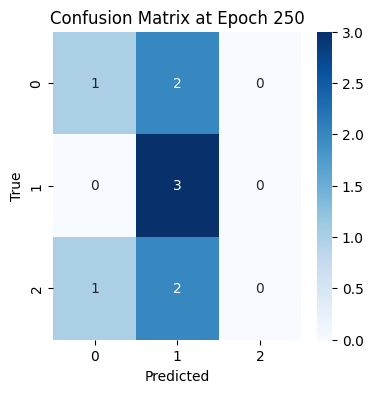

In [24]:
for i in range(5,251,5):
    kiwi_nir_msdcnn4.load_weights(working_dir + 'KIWI_NIR_MSDCNN4_checkpoints/MSDCNN4t2' + str(i).zfill(4) + '.ckpt')
    x, y = test_kiwi_NIR_datagen.__getitem__(0)
    y_pred = kiwi_nir_msdcnn4.predict(x)
    y_pred = np.argmax(y_pred, axis=1)
    y = y.numpy()
    print(f"Epoch {i} Accuracy: {np.mean(y_pred == y)}")
    # print recall and precision and f1 score
    print(classification_report(y, y_pred, target_names=ripeness_state_dict.keys(), zero_division=0))
    # plot confusion matrix
    cm = confusion_matrix(y, y_pred)
    plt.figure(figsize=(4, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'Confusion Matrix at Epoch {i}')
    plt.show()

3/3 [==============================] - 0s 44ms/step
Epoch 5 Accuracy: 0.5131578947368421
              precision    recall  f1-score   support

      unripe       0.50      0.06      0.10        18
     perfect       0.51      1.00      0.68        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.51        76
   macro avg       0.34      0.35      0.26        76
weighted avg       0.38      0.51      0.36        76



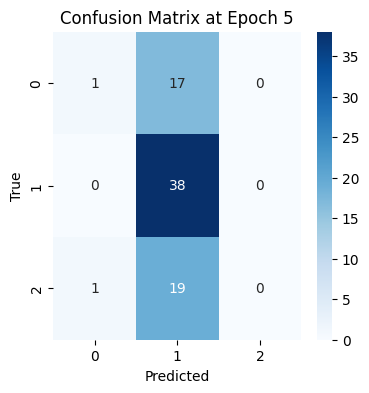

3/3 [==============================] - 0s 39ms/step
Epoch 10 Accuracy: 0.7763157894736842
              precision    recall  f1-score   support

      unripe       0.89      0.44      0.59        18
     perfect       0.72      0.95      0.82        38
    overripe       0.88      0.75      0.81        20

    accuracy                           0.78        76
   macro avg       0.83      0.71      0.74        76
weighted avg       0.80      0.78      0.76        76



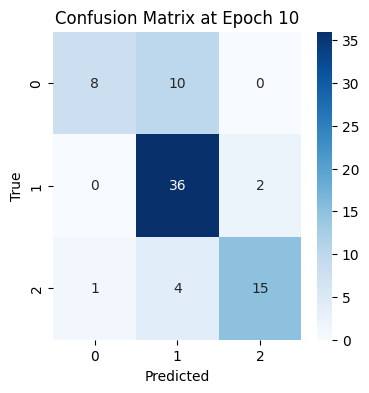

3/3 [==============================] - 0s 38ms/step
Epoch 15 Accuracy: 0.4473684210526316
              precision    recall  f1-score   support

      unripe       0.67      0.11      0.19        18
     perfect       0.64      0.37      0.47        38
    overripe       0.35      0.90      0.51        20

    accuracy                           0.45        76
   macro avg       0.55      0.46      0.39        76
weighted avg       0.57      0.45      0.41        76



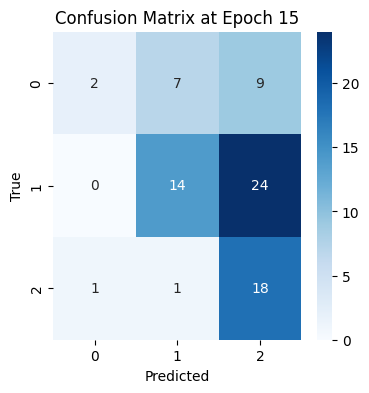

3/3 [==============================] - 0s 38ms/step
Epoch 20 Accuracy: 0.7236842105263158
              precision    recall  f1-score   support

      unripe       0.89      0.44      0.59        18
     perfect       0.66      1.00      0.79        38
    overripe       1.00      0.45      0.62        20

    accuracy                           0.72        76
   macro avg       0.85      0.63      0.67        76
weighted avg       0.80      0.72      0.70        76



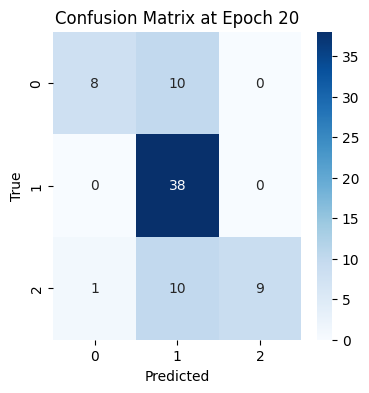

3/3 [==============================] - 0s 41ms/step
Epoch 25 Accuracy: 0.5
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        18
     perfect       0.51      1.00      0.67        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.50        76
   macro avg       0.17      0.33      0.22        76
weighted avg       0.25      0.50      0.34        76



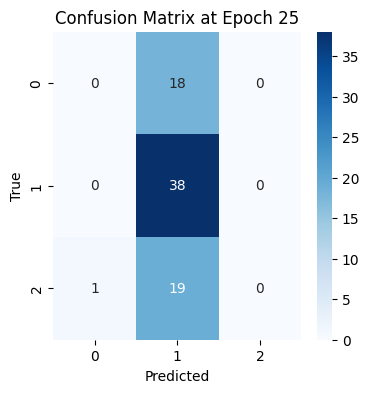

3/3 [==============================] - 0s 40ms/step
Epoch 30 Accuracy: 0.8421052631578947
              precision    recall  f1-score   support

      unripe       0.93      0.78      0.85        18
     perfect       0.79      1.00      0.88        38
    overripe       0.92      0.60      0.73        20

    accuracy                           0.84        76
   macro avg       0.88      0.79      0.82        76
weighted avg       0.86      0.84      0.83        76



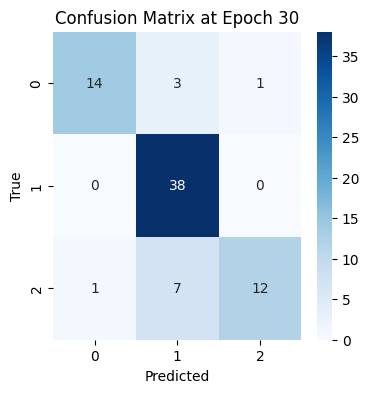

3/3 [==============================] - 0s 46ms/step
Epoch 35 Accuracy: 0.5789473684210527
              precision    recall  f1-score   support

      unripe       0.88      0.39      0.54        18
     perfect       0.68      0.50      0.58        38
    overripe       0.45      0.90      0.60        20

    accuracy                           0.58        76
   macro avg       0.67      0.60      0.57        76
weighted avg       0.66      0.58      0.57        76



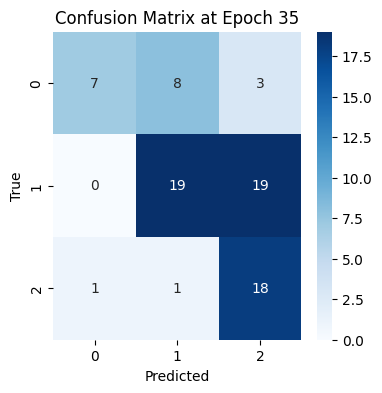

3/3 [==============================] - 0s 38ms/step
Epoch 40 Accuracy: 0.32894736842105265
              precision    recall  f1-score   support

      unripe       0.50      0.06      0.10        18
     perfect       0.55      0.16      0.24        38
    overripe       0.29      0.90      0.43        20

    accuracy                           0.33        76
   macro avg       0.44      0.37      0.26        76
weighted avg       0.47      0.33      0.26        76



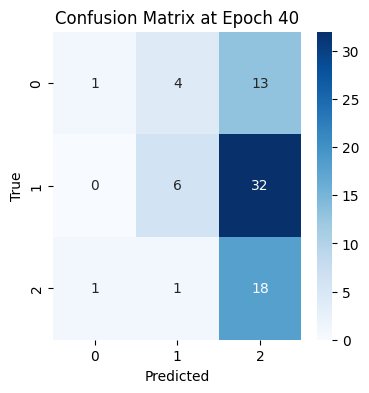

3/3 [==============================] - 0s 41ms/step
Epoch 45 Accuracy: 0.7236842105263158
              precision    recall  f1-score   support

      unripe       0.80      0.22      0.35        18
     perfect       0.68      0.95      0.79        38
    overripe       0.83      0.75      0.79        20

    accuracy                           0.72        76
   macro avg       0.77      0.64      0.64        76
weighted avg       0.75      0.72      0.69        76



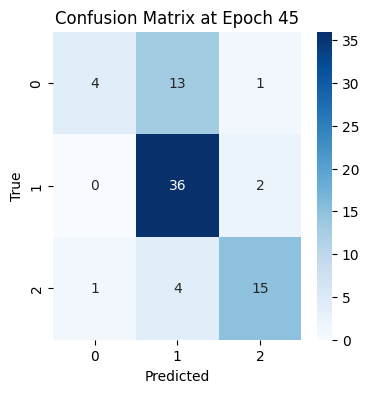

3/3 [==============================] - 0s 39ms/step
Epoch 50 Accuracy: 0.32894736842105265
              precision    recall  f1-score   support

      unripe       0.26      1.00      0.41        18
     perfect       1.00      0.05      0.10        38
    overripe       1.00      0.25      0.40        20

    accuracy                           0.33        76
   macro avg       0.75      0.43      0.30        76
weighted avg       0.82      0.33      0.25        76



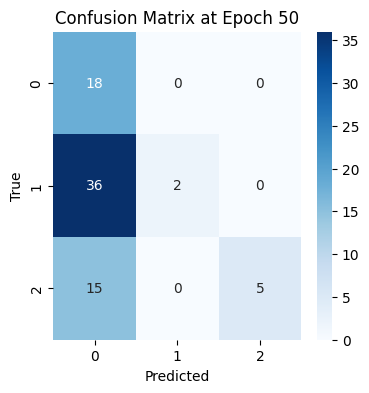

3/3 [==============================] - 0s 39ms/step
Epoch 55 Accuracy: 0.4868421052631579
              precision    recall  f1-score   support

      unripe       0.57      0.89      0.70        18
     perfect       1.00      0.08      0.15        38
    overripe       0.40      0.90      0.55        20

    accuracy                           0.49        76
   macro avg       0.66      0.62      0.47        76
weighted avg       0.74      0.49      0.38        76



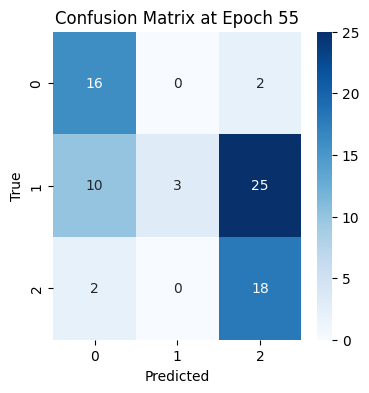

3/3 [==============================] - 0s 39ms/step
Epoch 60 Accuracy: 0.618421052631579
              precision    recall  f1-score   support

      unripe       0.43      1.00      0.60        18
     perfect       0.83      0.53      0.65        38
    overripe       0.90      0.45      0.60        20

    accuracy                           0.62        76
   macro avg       0.72      0.66      0.62        76
weighted avg       0.76      0.62      0.62        76



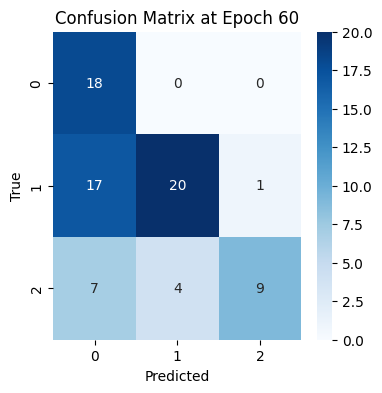

3/3 [==============================] - 0s 39ms/step
Epoch 65 Accuracy: 0.5263157894736842
              precision    recall  f1-score   support

      unripe       0.67      0.11      0.19        18
     perfect       0.52      1.00      0.68        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.53        76
   macro avg       0.40      0.37      0.29        76
weighted avg       0.42      0.53      0.39        76



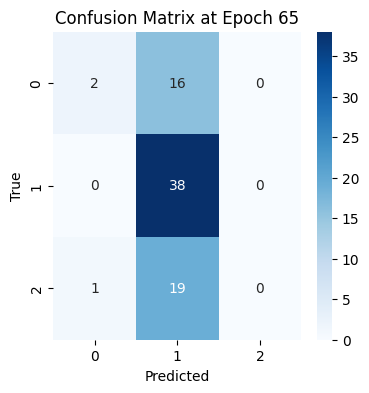

3/3 [==============================] - 0s 38ms/step
Epoch 70 Accuracy: 0.4605263157894737
              precision    recall  f1-score   support

      unripe       0.38      1.00      0.55        18
     perfect       0.61      0.45      0.52        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.46        76
   macro avg       0.33      0.48      0.35        76
weighted avg       0.39      0.46      0.39        76



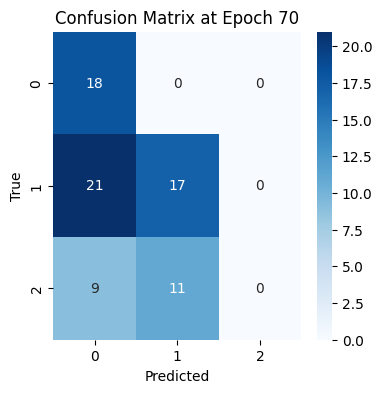

3/3 [==============================] - 0s 41ms/step
Epoch 75 Accuracy: 0.8026315789473685
              precision    recall  f1-score   support

      unripe       0.88      0.83      0.86        18
     perfect       0.86      0.82      0.84        38
    overripe       0.65      0.75      0.70        20

    accuracy                           0.80        76
   macro avg       0.80      0.80      0.80        76
weighted avg       0.81      0.80      0.81        76



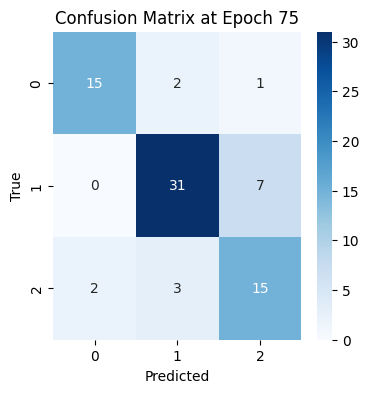

3/3 [==============================] - 0s 42ms/step
Epoch 80 Accuracy: 0.8026315789473685
              precision    recall  f1-score   support

      unripe       0.93      0.78      0.85        18
     perfect       0.78      0.92      0.84        38
    overripe       0.75      0.60      0.67        20

    accuracy                           0.80        76
   macro avg       0.82      0.77      0.79        76
weighted avg       0.81      0.80      0.80        76



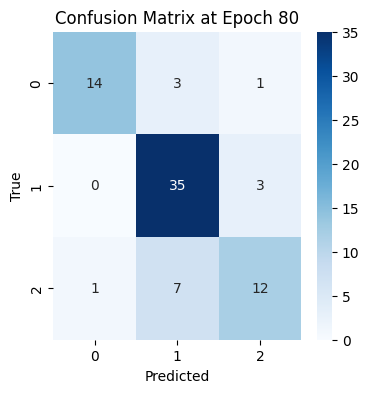

3/3 [==============================] - 0s 39ms/step
Epoch 85 Accuracy: 0.7631578947368421
              precision    recall  f1-score   support

      unripe       0.80      0.22      0.35        18
     perfect       0.73      0.95      0.83        38
    overripe       0.82      0.90      0.86        20

    accuracy                           0.76        76
   macro avg       0.78      0.69      0.68        76
weighted avg       0.77      0.76      0.72        76



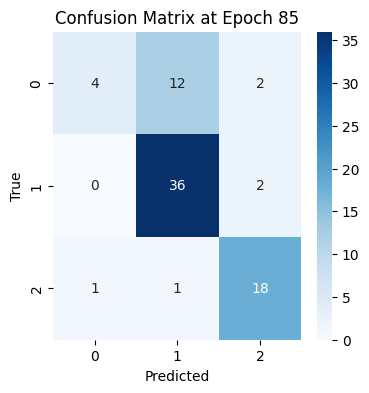

3/3 [==============================] - 0s 39ms/step
Epoch 90 Accuracy: 0.868421052631579
              precision    recall  f1-score   support

      unripe       0.92      0.61      0.73        18
     perfect       0.86      0.97      0.91        38
    overripe       0.86      0.90      0.88        20

    accuracy                           0.87        76
   macro avg       0.88      0.83      0.84        76
weighted avg       0.87      0.87      0.86        76



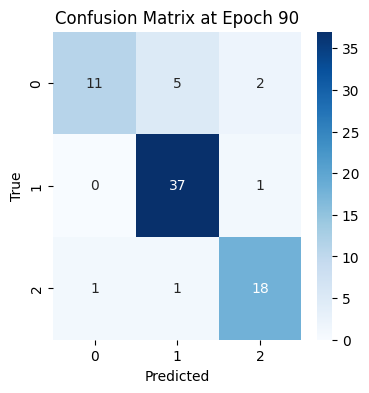

3/3 [==============================] - 0s 39ms/step
Epoch 95 Accuracy: 0.8947368421052632
              precision    recall  f1-score   support

      unripe       0.93      0.78      0.85        18
     perfect       0.92      0.95      0.94        38
    overripe       0.82      0.90      0.86        20

    accuracy                           0.89        76
   macro avg       0.89      0.88      0.88        76
weighted avg       0.90      0.89      0.89        76



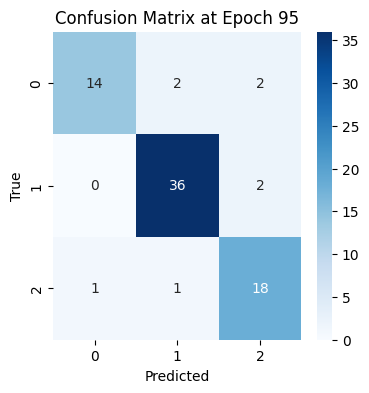

3/3 [==============================] - 0s 42ms/step
Epoch 100 Accuracy: 0.8947368421052632
              precision    recall  f1-score   support

      unripe       0.93      0.78      0.85        18
     perfect       0.92      0.95      0.94        38
    overripe       0.82      0.90      0.86        20

    accuracy                           0.89        76
   macro avg       0.89      0.88      0.88        76
weighted avg       0.90      0.89      0.89        76



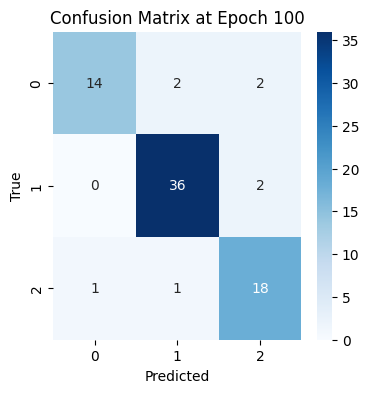

3/3 [==============================] - 0s 38ms/step
Epoch 105 Accuracy: 0.8421052631578947
              precision    recall  f1-score   support

      unripe       0.93      0.78      0.85        18
     perfect       0.89      0.84      0.86        38
    overripe       0.72      0.90      0.80        20

    accuracy                           0.84        76
   macro avg       0.85      0.84      0.84        76
weighted avg       0.85      0.84      0.84        76



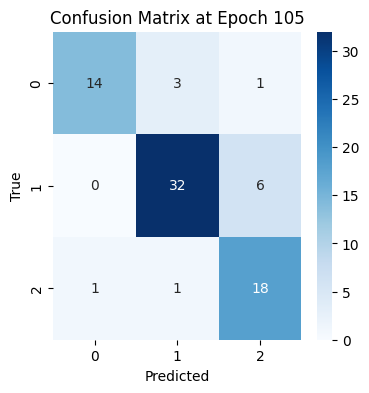

3/3 [==============================] - 0s 46ms/step
Epoch 110 Accuracy: 0.8947368421052632
              precision    recall  f1-score   support

      unripe       0.93      0.78      0.85        18
     perfect       0.90      0.95      0.92        38
    overripe       0.86      0.90      0.88        20

    accuracy                           0.89        76
   macro avg       0.90      0.88      0.88        76
weighted avg       0.90      0.89      0.89        76



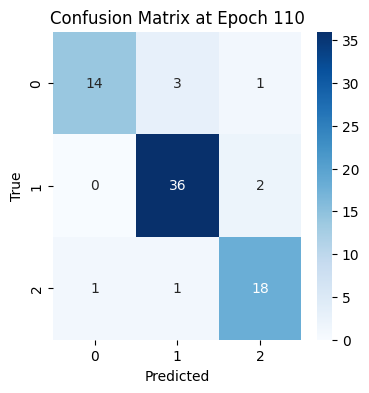

3/3 [==============================] - 0s 44ms/step
Epoch 115 Accuracy: 0.868421052631579
              precision    recall  f1-score   support

      unripe       0.93      0.78      0.85        18
     perfect       0.92      0.89      0.91        38
    overripe       0.75      0.90      0.82        20

    accuracy                           0.87        76
   macro avg       0.87      0.86      0.86        76
weighted avg       0.88      0.87      0.87        76



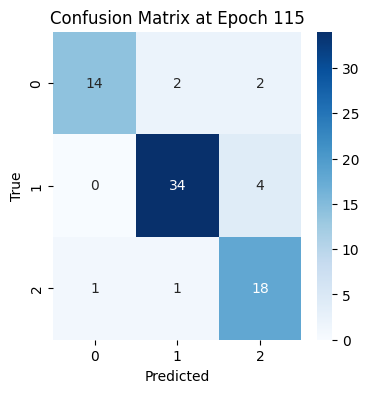

3/3 [==============================] - 0s 40ms/step
Epoch 120 Accuracy: 0.8947368421052632
              precision    recall  f1-score   support

      unripe       0.93      0.78      0.85        18
     perfect       0.92      0.95      0.94        38
    overripe       0.82      0.90      0.86        20

    accuracy                           0.89        76
   macro avg       0.89      0.88      0.88        76
weighted avg       0.90      0.89      0.89        76



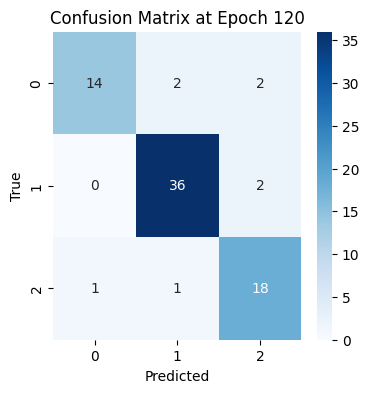

3/3 [==============================] - 0s 39ms/step
Epoch 125 Accuracy: 0.9078947368421053
              precision    recall  f1-score   support

      unripe       0.93      0.72      0.81        18
     perfect       0.88      1.00      0.94        38
    overripe       0.95      0.90      0.92        20

    accuracy                           0.91        76
   macro avg       0.92      0.87      0.89        76
weighted avg       0.91      0.91      0.90        76



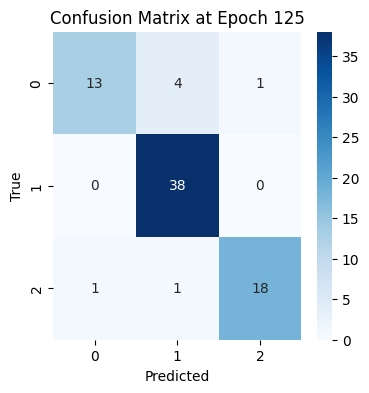

3/3 [==============================] - 0s 42ms/step
Epoch 130 Accuracy: 0.8289473684210527
              precision    recall  f1-score   support

      unripe       0.93      0.78      0.85        18
     perfect       0.91      0.82      0.86        38
    overripe       0.67      0.90      0.77        20

    accuracy                           0.83        76
   macro avg       0.84      0.83      0.83        76
weighted avg       0.85      0.83      0.83        76



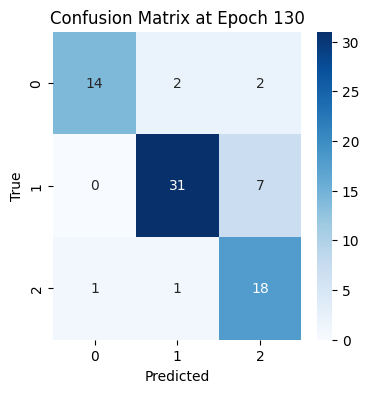

3/3 [==============================] - 0s 39ms/step
Epoch 135 Accuracy: 0.9078947368421053
              precision    recall  f1-score   support

      unripe       0.93      0.78      0.85        18
     perfect       0.90      0.97      0.94        38
    overripe       0.90      0.90      0.90        20

    accuracy                           0.91        76
   macro avg       0.91      0.88      0.90        76
weighted avg       0.91      0.91      0.91        76



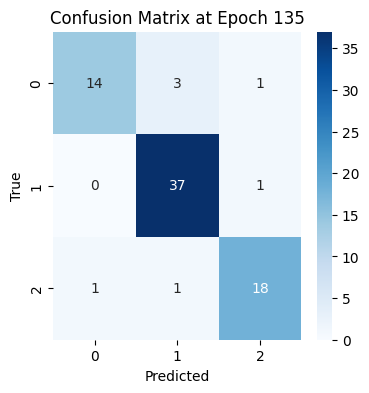

3/3 [==============================] - 0s 39ms/step
Epoch 140 Accuracy: 0.3684210526315789
              precision    recall  f1-score   support

      unripe       0.28      1.00      0.43        18
     perfect       0.80      0.11      0.19        38
    overripe       1.00      0.30      0.46        20

    accuracy                           0.37        76
   macro avg       0.69      0.47      0.36        76
weighted avg       0.73      0.37      0.32        76



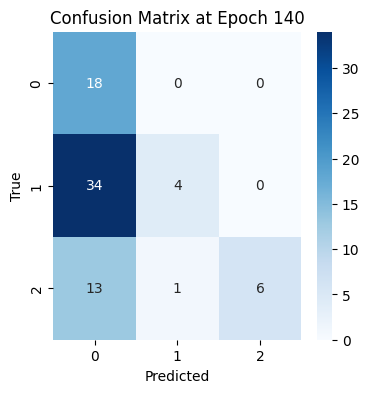

3/3 [==============================] - 0s 39ms/step
Epoch 145 Accuracy: 0.27631578947368424
              precision    recall  f1-score   support

      unripe       0.25      1.00      0.40        18
     perfect       1.00      0.08      0.15        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.28        76
   macro avg       0.42      0.36      0.18        76
weighted avg       0.56      0.28      0.17        76



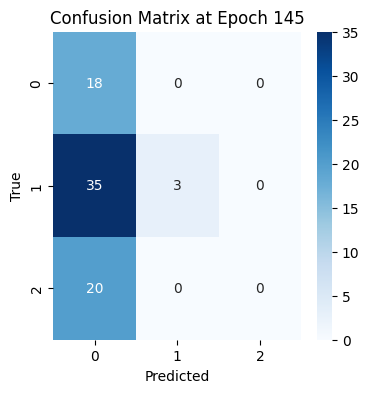

3/3 [==============================] - 0s 39ms/step
Epoch 150 Accuracy: 0.618421052631579
              precision    recall  f1-score   support

      unripe       0.73      0.61      0.67        18
     perfect       0.59      0.95      0.73        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.62        76
   macro avg       0.44      0.52      0.46        76
weighted avg       0.47      0.62      0.52        76



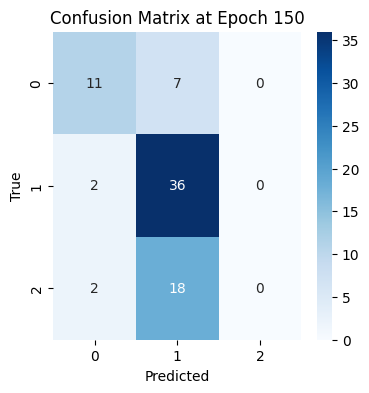

3/3 [==============================] - 0s 43ms/step
Epoch 155 Accuracy: 0.25
              precision    recall  f1-score   support

      unripe       0.24      1.00      0.39        18
     perfect       0.50      0.03      0.05        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.25        76
   macro avg       0.25      0.34      0.15        76
weighted avg       0.31      0.25      0.12        76



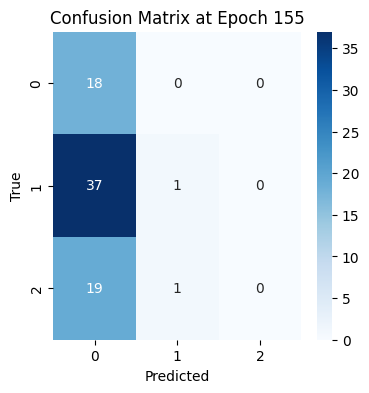

3/3 [==============================] - 0s 40ms/step
Epoch 160 Accuracy: 0.32894736842105265
              precision    recall  f1-score   support

      unripe       0.29      1.00      0.45        18
     perfect       0.50      0.18      0.27        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.33        76
   macro avg       0.26      0.39      0.24        76
weighted avg       0.32      0.33      0.24        76



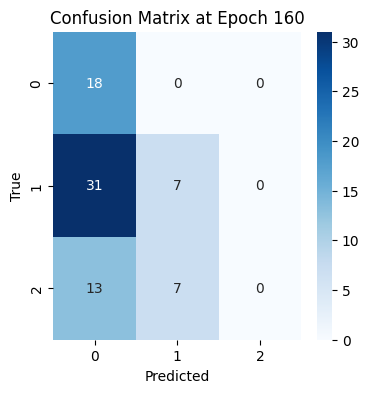

3/3 [==============================] - 0s 45ms/step
Epoch 165 Accuracy: 0.5526315789473685
              precision    recall  f1-score   support

      unripe       0.45      1.00      0.62        18
     perfect       0.66      0.61      0.63        38
    overripe       1.00      0.05      0.10        20

    accuracy                           0.55        76
   macro avg       0.70      0.55      0.45        76
weighted avg       0.70      0.55      0.49        76



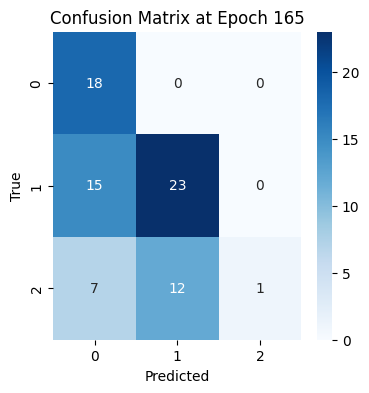

3/3 [==============================] - 0s 39ms/step
Epoch 170 Accuracy: 0.7631578947368421
              precision    recall  f1-score   support

      unripe       0.56      1.00      0.72        18
     perfect       0.88      0.74      0.80        38
    overripe       1.00      0.60      0.75        20

    accuracy                           0.76        76
   macro avg       0.81      0.78      0.76        76
weighted avg       0.83      0.76      0.77        76



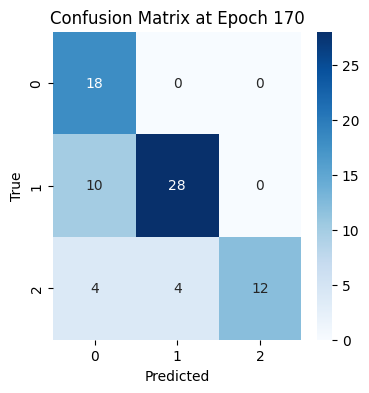

3/3 [==============================] - 0s 39ms/step
Epoch 175 Accuracy: 0.8289473684210527
              precision    recall  f1-score   support

      unripe       0.60      1.00      0.75        18
     perfect       1.00      0.74      0.85        38
    overripe       0.94      0.85      0.89        20

    accuracy                           0.83        76
   macro avg       0.85      0.86      0.83        76
weighted avg       0.89      0.83      0.84        76



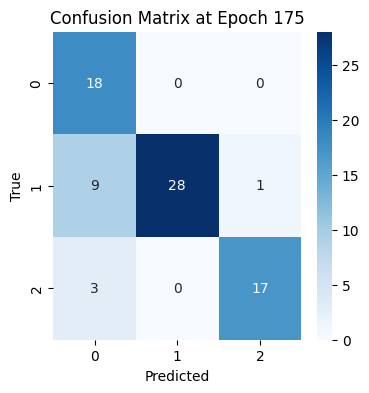

3/3 [==============================] - 0s 39ms/step
Epoch 180 Accuracy: 0.7105263157894737
              precision    recall  f1-score   support

      unripe       0.55      1.00      0.71        18
     perfect       0.81      0.66      0.72        38
    overripe       0.92      0.55      0.69        20

    accuracy                           0.71        76
   macro avg       0.76      0.74      0.71        76
weighted avg       0.77      0.71      0.71        76



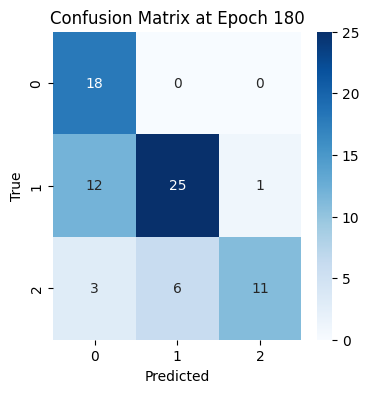

3/3 [==============================] - 0s 39ms/step
Epoch 185 Accuracy: 0.8552631578947368
              precision    recall  f1-score   support

      unripe       0.89      0.94      0.92        18
     perfect       0.80      0.97      0.88        38
    overripe       1.00      0.55      0.71        20

    accuracy                           0.86        76
   macro avg       0.90      0.82      0.84        76
weighted avg       0.88      0.86      0.84        76



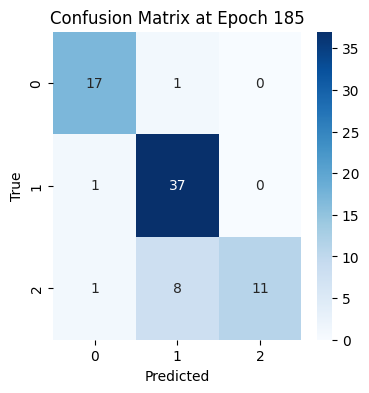

3/3 [==============================] - 0s 39ms/step
Epoch 190 Accuracy: 0.5263157894736842
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        18
     perfect       0.52      1.00      0.68        38
    overripe       1.00      0.10      0.18        20

    accuracy                           0.53        76
   macro avg       0.51      0.37      0.29        76
weighted avg       0.52      0.53      0.39        76



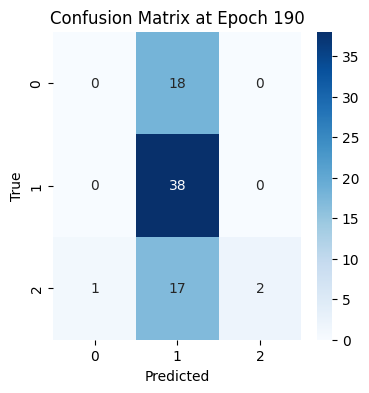

3/3 [==============================] - 0s 49ms/step
Epoch 195 Accuracy: 0.6710526315789473
              precision    recall  f1-score   support

      unripe       0.67      0.11      0.19        18
     perfect       0.65      0.84      0.74        38
    overripe       0.71      0.85      0.77        20

    accuracy                           0.67        76
   macro avg       0.68      0.60      0.57        76
weighted avg       0.67      0.67      0.62        76



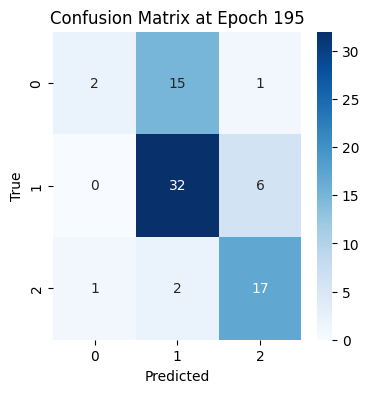

3/3 [==============================] - 0s 38ms/step
Epoch 200 Accuracy: 0.5
              precision    recall  f1-score   support

      unripe       0.82      0.78      0.80        18
     perfect       1.00      0.16      0.27        38
    overripe       0.34      0.90      0.49        20

    accuracy                           0.50        76
   macro avg       0.72      0.61      0.52        76
weighted avg       0.78      0.50      0.46        76



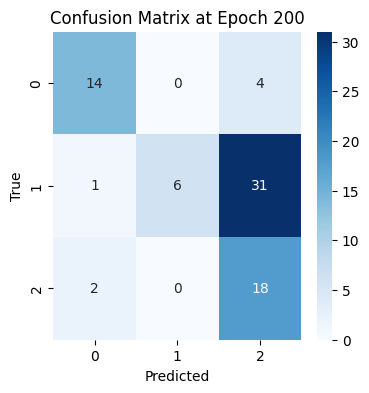

3/3 [==============================] - 0s 39ms/step
Epoch 205 Accuracy: 0.25
              precision    recall  f1-score   support

      unripe       0.00      0.00      0.00        18
     perfect       0.00      0.00      0.00        38
    overripe       0.26      0.95      0.40        20

    accuracy                           0.25        76
   macro avg       0.09      0.32      0.13        76
weighted avg       0.07      0.25      0.11        76



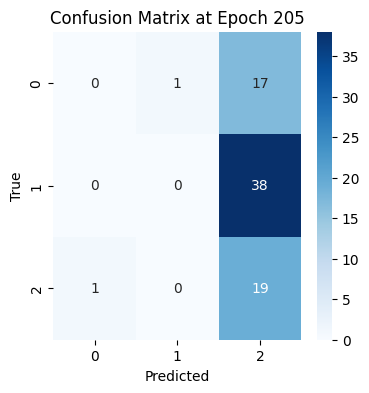

3/3 [==============================] - 0s 40ms/step
Epoch 210 Accuracy: 0.5789473684210527
              precision    recall  f1-score   support

      unripe       0.77      0.94      0.85        18
     perfect       1.00      0.24      0.38        38
    overripe       0.40      0.90      0.55        20

    accuracy                           0.58        76
   macro avg       0.72      0.69      0.60        76
weighted avg       0.79      0.58      0.54        76



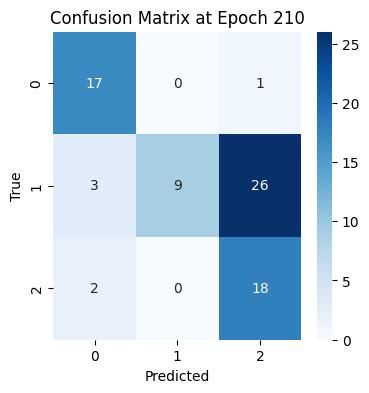

3/3 [==============================] - 0s 40ms/step
Epoch 215 Accuracy: 0.8289473684210527
              precision    recall  f1-score   support

      unripe       0.77      0.94      0.85        18
     perfect       0.97      0.76      0.85        38
    overripe       0.71      0.85      0.77        20

    accuracy                           0.83        76
   macro avg       0.82      0.85      0.83        76
weighted avg       0.85      0.83      0.83        76



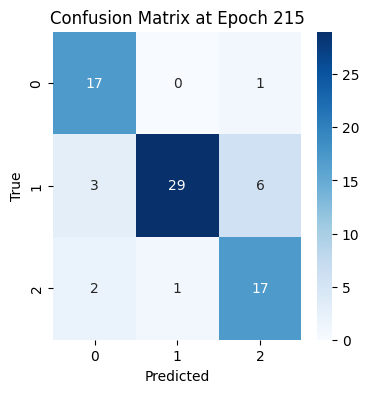

3/3 [==============================] - 0s 44ms/step
Epoch 220 Accuracy: 0.23684210526315788
              precision    recall  f1-score   support

      unripe       0.24      1.00      0.38        18
     perfect       0.00      0.00      0.00        38
    overripe       0.00      0.00      0.00        20

    accuracy                           0.24        76
   macro avg       0.08      0.33      0.13        76
weighted avg       0.06      0.24      0.09        76



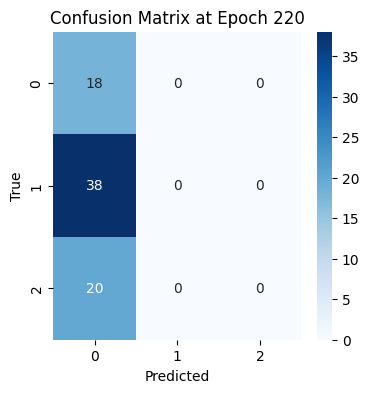

3/3 [==============================] - 0s 41ms/step
Epoch 225 Accuracy: 0.7368421052631579
              precision    recall  f1-score   support

      unripe       0.88      0.78      0.82        18
     perfect       0.68      1.00      0.81        38
    overripe       1.00      0.20      0.33        20

    accuracy                           0.74        76
   macro avg       0.85      0.66      0.66        76
weighted avg       0.81      0.74      0.69        76



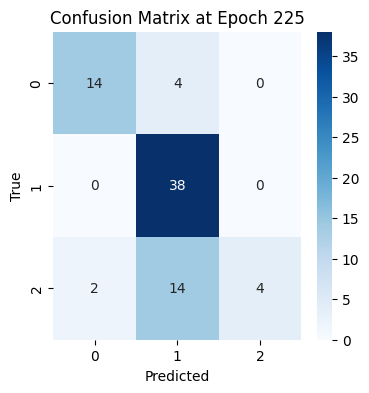

3/3 [==============================] - 0s 39ms/step
Epoch 230 Accuracy: 0.8289473684210527
              precision    recall  f1-score   support

      unripe       0.93      0.78      0.85        18
     perfect       0.80      0.95      0.87        38
    overripe       0.81      0.65      0.72        20

    accuracy                           0.83        76
   macro avg       0.85      0.79      0.81        76
weighted avg       0.83      0.83      0.82        76



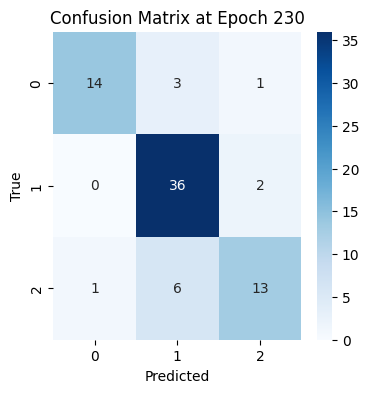

3/3 [==============================] - 0s 43ms/step
Epoch 235 Accuracy: 0.881578947368421
              precision    recall  f1-score   support

      unripe       0.80      0.89      0.84        18
     perfect       0.97      0.89      0.93        38
    overripe       0.81      0.85      0.83        20

    accuracy                           0.88        76
   macro avg       0.86      0.88      0.87        76
weighted avg       0.89      0.88      0.88        76



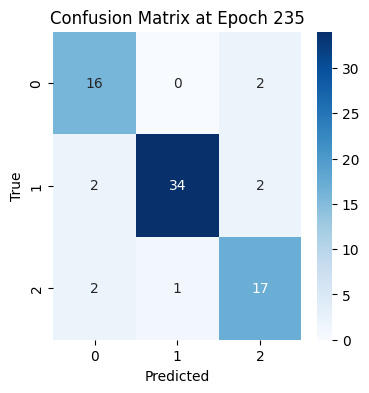

3/3 [==============================] - 0s 42ms/step
Epoch 240 Accuracy: 0.8289473684210527
              precision    recall  f1-score   support

      unripe       0.87      0.72      0.79        18
     perfect       0.78      1.00      0.87        38
    overripe       1.00      0.60      0.75        20

    accuracy                           0.83        76
   macro avg       0.88      0.77      0.80        76
weighted avg       0.86      0.83      0.82        76



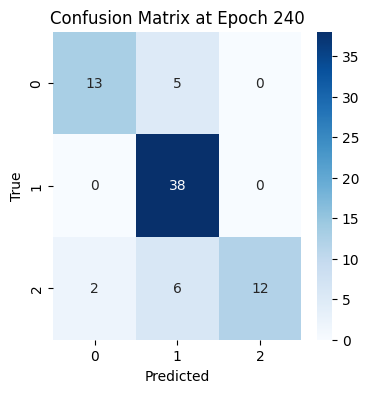

3/3 [==============================] - 0s 40ms/step
Epoch 245 Accuracy: 0.75
              precision    recall  f1-score   support

      unripe       0.89      0.44      0.59        18
     perfect       0.69      1.00      0.82        38
    overripe       0.92      0.55      0.69        20

    accuracy                           0.75        76
   macro avg       0.83      0.66      0.70        76
weighted avg       0.80      0.75      0.73        76



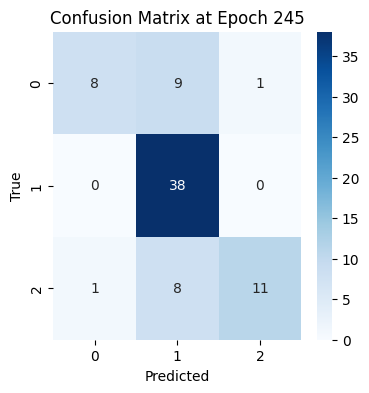

3/3 [==============================] - 0s 44ms/step
Epoch 250 Accuracy: 0.6052631578947368
              precision    recall  f1-score   support

      unripe       0.88      0.39      0.54        18
     perfect       0.57      1.00      0.72        38
    overripe       1.00      0.05      0.10        20

    accuracy                           0.61        76
   macro avg       0.81      0.48      0.45        76
weighted avg       0.75      0.61      0.51        76



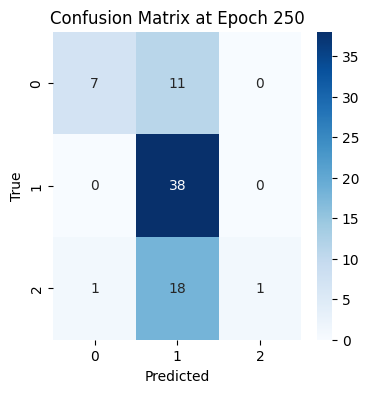

In [26]:
x, y = all_kiwi_nir_datagen.__getitem__(0)
y = y.numpy()
for i in range(5,251,5):
    kiwi_nir_msdcnn4.load_weights(working_dir + 'KIWI_NIR_MSDCNN4_checkpoints/MSDCNN4t2' + str(i).zfill(4) + '.ckpt')
    y_pred = kiwi_nir_msdcnn4.predict(x)
    y_pred = np.argmax(y_pred, axis=1)
    print(f"Epoch {i} Accuracy: {np.mean(y_pred == y)}")
    # print recall and precision and f1 score
    print(classification_report(y, y_pred, target_names=ripeness_state_dict.keys(), zero_division=0))
    # plot confusion matrix
    cm = confusion_matrix(y, y_pred)
    plt.figure(figsize=(4, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'Confusion Matrix at Epoch {i}')
    plt.show()

### Anomaly Detection